# Importing The Modules
Anaconda Python distribution comes with most of the standard Python libraries that are needed for this project. The basic Python libraries used in this project are:-

• Numpy – It provides a fast numerical array structure and operating functions.

• pandas – It provides tools for data storage, manipulation and analysis tasks.

• NLTK - NLTK is a toolkit build for working with NLP in Python that provides various text processing libraries.

• Scikit-Learn – The required machine learning library in Python.

• Matplotlib – It is the basic plotting library in Python. It provides tools for making plots

In [1]:
#Basic Libraries
import pandas as pd 
import numpy as np 

#NLTK Libraries
import nltk 
import re
import emoji
import string
from string import digits
from nltk.corpus import stopwords
from nltk.sentiment.vader import SentimentIntensityAnalyzer
from textblob import TextBlob
#import spacy
from textstat.textstat import textstatistics
from sklearn.feature_extraction.text import TfidfVectorizer

# Scikit-Learn libraries
from sklearn.svm import SVC
from sklearn.preprocessing import LabelEncoder
from sklearn.feature_extraction.text import TfidfVectorizer
from sklearn.pipeline import make_pipeline
from sklearn.model_selection import GridSearchCV
from sklearn.linear_model import LogisticRegression
from sklearn.tree import DecisionTreeClassifier
from sklearn.ensemble import RandomForestClassifier
from sklearn.naive_bayes import BernoulliNB 
from sklearn.neighbors import KNeighborsClassifier
from sklearn.multiclass import OneVsRestClassifier
from sklearn.svm import SVC
from sklearn.model_selection import train_test_split
from sklearn import svm, datasets
from sklearn import preprocessing
from sklearn.model_selection import StratifiedKFold
from sklearn import linear_model


#Metrics libraries
from sklearn import metrics
from sklearn.metrics import classification_report
from sklearn.model_selection import cross_val_score
from sklearn.metrics import roc_auc_score
from sklearn.metrics import roc_curve, auc
from sklearn.metrics import confusion_matrix, accuracy_score


#Visualization libraries
import matplotlib.pyplot as plt 
from matplotlib import rcParams
import seaborn as sns
from textblob import TextBlob
import plotly.express as px
import plotly.offline as po
import plotly.graph_objects as go
%matplotlib inline

#Ignore warnings
import warnings
warnings.filterwarnings('ignore')

#Other miscellaneous libraries
import pickle
from itertools import cycle
from statistics import stdev
from imblearn.over_sampling import SMOTE
from statistics import mean
from collections import defaultdict
from wordcloud import WordCloud,STOPWORDS 

pd.set_option("display.max_columns",None)

pd.set_option("display.max_rows",None)

# About The Dataset
The dataset has been collected through Web Scraping. Parsehub, a web-scraping tool has been utilized here to work on popular websites interacting with JavaScript and Ajax. In the Parsehub Application, there are ready-made templates that are pretty flexible and use machine-learning to grasp complex hierarchies.


Parsehub: https://www.parsehub.com/


The dataset is containing car data, which has been taken from CarDekho website (https://www.cardekho.com/).

DATASET DETAILS:-

The file has Brand, Car_Name, Variant_Name, Model_Name, Mileage_in_kmpl, Fuel_Type, Seat, No_of_Cylinder, Body_Type, Transmission_Type, Fuel_Tank_Capacity, Boot_Space, Engine_Displacement, Ex-Showroom Price in Delhi (in Lakh), Rating_Out_of_5, Review_Title, Review, Review_Date, No_of_Views_on_Review

Description of columns in the file:

Brand - Name of the brands i.e, Datsun, Toyota etc.

Car_Name - Name of the cars of each brand

Variant_Name - Different trims within a single car model i.e, Swift is a car model by Maruti Suzuki.

Model_Name - Combination of brand, car and variant name.

Mileage_in_kmpl - The distance covered by the vehicle per unit fuel.

Fuel_Type - Types of fuel i.e, petrol, diesel etc.

Seat - No. of seats. 

No_of_Cylinder - cylinder counts.

Body_Type - Categorisation of a vehicle based on its design, shape and space i.e, SUV, Hatchback etc.

Transmission_Type - Types of transmision i.e, automatic, manual etc.

Fuel_Tank_Capacity -  The tank's fuel usable capacity.

Boot_Space - Luggage capacity.

Engine_Displacement - The total volume of all the cylinders in an engine.

Ex-Showroom Price in Delhi (in Lakh) - The price of the car without any additional RTO, Road Tax, and insurance payments.

Rating_Out_of_5 - Rating of the car.

Review_Title - Descriptive heading of review texts.

Review - Text of the review.

Review_Date - Date of the review.

No_of_Views_on_Review - View counts of the reviews.

In [2]:
#Loading the Dataset
data=pd.read_excel("CarDekho.xlsx")

#Creating a shallow copy of the data set 
df=data.copy()

#The top 5 rows of the pandas dataframe has been viewed with the pandas head() method
df.head()

,Brand,Car_Name,Variant_Name,Model_Name,Mileage_in_kmpl,Fuel_Type,Seat,No_of_Cylinder,Body_Type,Transmission_Type,Fuel_Tank_Capacity,Boot_Space,Engine_Displacement,Ex-Showroom Price in Delhi (in Lakh),Rating_Out_of_5,Review_Title,Review,Review_Date,No_of_Views_on_Review
0,Hyundai Cars,Hyundai Creta,Creta E,Hyundai Creta E,16.80,Petrol,5,4,SUV,Manual,50,433.0,1497,10.75,1.0,Worst Car.. Sunroof Glass Scattering,"Worst car. 1st thing, I have noticed car picku...",2021-04-16,3979
1,Hyundai Cars,Hyundai Santro,Santro Era Executive,Hyundai Santro Era Executive,20.30,Petrol,5,4,Hatchback,Manual,35,235.0,1086,4.87,1.0,Santro CNG Spotz Model,"I bought a Santro CNG Sportz model, no speed s...",2019-04-21,31
2,Hyundai Cars,Hyundai Santro,Santro Era Executive,Hyundai Santro Era Executive,20.30,Petrol,5,4,Hatchback,Manual,35,235.0,1086,4.87,1.0,Celerio vs Santro,We have both car Santro and Celerio but we fin...,2019-04-20,38
3,Hyundai Cars,Hyundai Santro,Santro Era Executive,Hyundai Santro Era Executive,20.30,Petrol,5,4,Hatchback,Manual,35,235.0,1086,4.87,1.0,Manufacturing Crank Shaft Defect In Santro,"Dear friends, I have recently purchased a Sant...",2019-04-14,144
4,Hyundai Cars,Hyundai Venue,Venue E,Hyundai Venue E,17.52,Petrol,5,4,SUV,Manual,45,336.0,1197,6.99,1.0,Pathetic Car With Zero Safety And Performance,Pathetic car with zero safety and performance....,2021-04-08,94


In [3]:
## print shape of dataset with rows and columns and information
print ("The shape of the  data is (row, column):"+ str(df.shape))
print (df.info())

The shape of the  data is (row, column):(5791, 19)
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 5791 entries, 0 to 5790
Data columns (total 19 columns):
 #   Column                                Non-Null Count  Dtype         
---  ------                                --------------  -----         
 0   Brand                                 5791 non-null   object        
 1   Car_Name                              5791 non-null   object        
 2   Variant_Name                          5791 non-null   object        
 3   Model_Name                            5791 non-null   object        
 4   Mileage_in_kmpl                       5791 non-null   float64       
 5   Fuel_Type                             5791 non-null   object        
 6   Seat                                  5791 non-null   int64         
 7   No_of_Cylinder                        5791 non-null   int64         
 8   Body_Type                             5791 non-null   object        
 9   Transmission_Type      

In [4]:
# Basic Statistical Details
df.describe()

,Mileage_in_kmpl,Seat,No_of_Cylinder,Fuel_Tank_Capacity,Boot_Space,Engine_Displacement,Ex-Showroom Price in Delhi (in Lakh),Rating_Out_of_5
count,5791.000000,5791.000000,5791.000000,5791.000000,5714.000000,5791.000000,5791.000000,5791.000000
mean,17.859408,5.275082,3.740805,44.922811,336.986699,1350.699016,9.370190,4.223796
std,2.663117,0.753895,0.454482,9.835789,95.338311,388.313973,11.749067,0.997749
min,8.000000,2.000000,3.000000,27.000000,73.000000,796.000000,3.600000,1.000000
25%,16.800000,5.000000,3.000000,37.000000,279.000000,1197.000000,6.000000,4.000000
50%,17.520000,5.000000,4.000000,45.000000,350.000000,1197.000000,6.990000,4.500000
75%,19.050000,5.000000,4.000000,50.000000,400.000000,1497.000000,10.000000,5.000000
max,25.240000,8.000000,6.000000,80.000000,615.000000,3798.000000,212.000000,5.000000


## HANDLING NULL VALUES

In [5]:
# Checking for NULL Values
df.isna().sum()

Brand                                    0
Car_Name                                 0
Variant_Name                             0
Model_Name                               0
Mileage_in_kmpl                          0
Fuel_Type                                0
Seat                                     0
No_of_Cylinder                           0
Body_Type                                0
Transmission_Type                        0
Fuel_Tank_Capacity                       0
Boot_Space                              77
Engine_Displacement                      0
Ex-Showroom Price in Delhi (in Lakh)     0
Rating_Out_of_5                          0
Review_Title                             0
Review                                   0
Review_Date                              0
No_of_Views_on_Review                    0
dtype: int64

So we have 77 null values in 'Boot_Space' column

In [6]:
null_bs_df=df[df["Boot_Space"].isna()]

In [7]:
null_bs_df[["Brand","Variant_Name","Model_Name"]].value_counts()

Brand          Variant_Name                       Model_Name                              
Mahindra Cars  Bolero Pik Up Extra Long CBC 1.7T  Mahindra Bolero PikUp ExtraLong CBC 1.7T    30
               XUV700 MX                          Mahindra XUV700 MX                          30
Nissan Cars    Terra                              Nissan Terra                                17
dtype: int64

In [8]:
df["Boot_Space"].mean()

336.9866993349668

In [9]:
df["Boot_Space"] = df["Boot_Space"].fillna(df["Boot_Space"].mean())

In [10]:
df["Boot_Space"].count()

5791

In [11]:
#null_bs_df=df[df["Boot_Space"].isna()]
#df["Boot_Space"] = df["Boot_Space"].fillna(df["Boot_Space"].mean())
df.describe()

,Mileage_in_kmpl,Seat,No_of_Cylinder,Fuel_Tank_Capacity,Boot_Space,Engine_Displacement,Ex-Showroom Price in Delhi (in Lakh),Rating_Out_of_5
count,5791.000000,5791.000000,5791.000000,5791.000000,5791.000000,5791.000000,5791.000000,5791.000000
mean,17.859408,5.275082,3.740805,44.922811,336.986699,1350.699016,9.370190,4.223796
std,2.663117,0.753895,0.454482,9.835789,94.702247,388.313973,11.749067,0.997749
min,8.000000,2.000000,3.000000,27.000000,73.000000,796.000000,3.600000,1.000000
25%,16.800000,5.000000,3.000000,37.000000,279.000000,1197.000000,6.000000,4.000000
50%,17.520000,5.000000,4.000000,45.000000,350.000000,1197.000000,6.990000,4.500000
75%,19.050000,5.000000,4.000000,50.000000,400.000000,1497.000000,10.000000,5.000000
max,25.240000,8.000000,6.000000,80.000000,615.000000,3798.000000,212.000000,5.000000


In [12]:
# Checking for correlation and visualizing by using heat map
#corr=df.corr()
#sns.heatmap(corr,annot=True)

We can find a highly positive correlation between Engine_Displacement and Fuel_Tank_Capacity(0.81)
& average positive correlation between Engine_Displacement and Ex-Showroom Price in Delhi(in Lakh)(0.64)

We can also find highly negetive correlation of Mileage_in_kmpl with Fuel_Tank_Capacity(-0.86) and Engine_Displacement(-0.75)


In [13]:
# Columns Name
df.columns

Index(['Brand', 'Car_Name', 'Variant_Name', 'Model_Name', 'Mileage_in_kmpl',
       'Fuel_Type', 'Seat', 'No_of_Cylinder', 'Body_Type', 'Transmission_Type',
       'Fuel_Tank_Capacity', 'Boot_Space', 'Engine_Displacement',
       'Ex-Showroom Price in Delhi (in Lakh)', 'Rating_Out_of_5',
       'Review_Title', 'Review', 'Review_Date', 'No_of_Views_on_Review'],
      dtype='object')

In [14]:
#Renaming columns 

df.rename(columns={'Brand':'brand', 'Car_Name':'car_name', 'Variant_Name':'variant_name', 'Model_Name':'model_name', 'Mileage_in_kmpl':'mileage', 'Fuel_Type':'fuel_type', 'Seat':'seat', 'No_of_Cylinder':'no_of_cylinder', 'Body_Type':'body_type', 'Transmission_Type':'transmission_type', 'Fuel_Tank_Capacity':'fuel_tank_capacity', 'Boot_Space':'boot_space', 'Engine_Displacement':'engine_displacement', 'Ex-Showroom Price in Delhi (in Lakh)':'price', 'Rating_Out_of_5':'rating', 'Review_Title':'review_title', 'Review':'review', 'Review_Date':'review_date', 'No_of_Views_on_Review':'view'},inplace=True)

Using short column names is easy to work with

In [15]:
#New column names

df.columns

Index(['brand', 'car_name', 'variant_name', 'model_name', 'mileage',
       'fuel_type', 'seat', 'no_of_cylinder', 'body_type', 'transmission_type',
       'fuel_tank_capacity', 'boot_space', 'engine_displacement', 'price',
       'rating', 'review_title', 'review', 'review_date', 'view'],
      dtype='object')

In [16]:
df1=df.copy()

<AxesSubplot:>

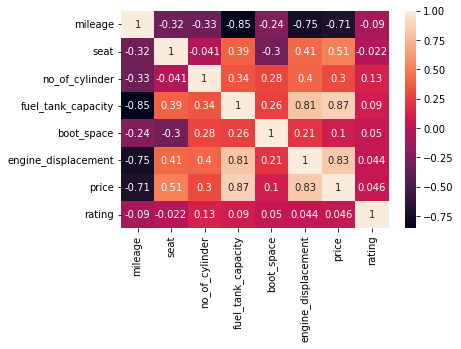

In [17]:
# Removing few extreme values and NULL values
df_corr=df[df['price']<90] 
corr=df_corr.corr()
sns.heatmap(corr,annot=True)

From the above heatmap, we have found few interesting relationships between variables - <br>
1. Engine displacement and fuel tank capacity are highly positively correlated (0.81).<br>
2. Price and fuel tank capacity are highly positively correlated (0.87).<br>
3. Price and engine displacement are also highly positively correlated (0.83).<br><br>

4. Fuel tank capacity and mileage are highly negatively correlated (-0.85).<br>
5. Price and mileage are highly negatively correlated (-0.71).<br>
6. Engine displacement and mileage are highly negatively correlated (-0.75).<br>

So, we can conclude that -<br>
If engine displacement or tank capacity is increasing, then car price is also increasing.<br>
If engine displacement/price/tank capacity is increasing, then mileage is decreasing.

## Brand

In [18]:
# Checking for number of unique brand
df["brand"].nunique()

11

We have 11 different car brands in our dataset 

In [19]:
#Percentage of data of each particular car brand
print(np.round(df["brand"].value_counts()/df.shape[0]*100,1))

#Showing the percentage of reviews/records in each brand
fig=px.pie(values=df["brand"].value_counts(),names=df["brand"].unique().tolist(),hole=.2)
fig.update_traces(textposition='inside', textinfo='percent+label')

Hyundai Cars       45.6
Tata Cars           9.8
Mahindra Cars       9.8
Maruti              6.8
Renault Cars        5.2
Ford Cars           4.9
Volkswagen Cars     4.2
Honda Cars          4.1
Toyota Cars         3.6
Datsun Cars         3.1
Nissan Cars         2.8
Name: brand, dtype: float64


By above plot we can conclude that most of the data is from "Hyundai" brand


In [20]:
#Finding the number of cars in each brand

df.groupby("brand")['car_name'].nunique()

brand
Datsun Cars         3
Ford Cars           6
Honda Cars          5
Hyundai Cars        7
Mahindra Cars      11
Maruti             14
Nissan Cars         6
Renault Cars        4
Tata Cars           7
Toyota Cars         6
Volkswagen Cars     4
Name: car_name, dtype: int64

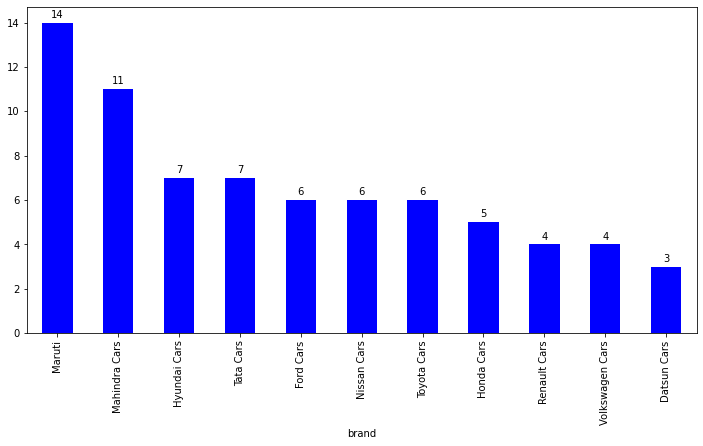

In [21]:
#Visualizing: Finding the number of cars in each brand in descending order

plt.figure(figsize=(12,6))
fig=df.groupby("brand")['car_name'].nunique().sort_values(ascending=False).plot(kind="bar",color="blue")
for bar in fig.patches:
   fig.annotate(format(bar.get_height(), '.0f'),
                    (bar.get_x() + bar.get_width() / 2,
                     bar.get_height()), ha='center', va='center',
                     size=10, xytext=(0, 8),
                     textcoords='offset points')

By the above plot, we conclude 'Maruti' has maximum no.of the cars whereas 'Datsun' has minimum no.of cars in our dataset.


## Mileage

By the above plot we conclude that 50% of the car's mileage lies between 16.8 to 19.05 
& maximum cars have mileage between 17.4 and 17.59

In [22]:
# Creating a pivot table to view the average mileage of each brand

pd.pivot_table(values="mileage",index="brand",aggfunc='max',data=df).sort_values(by="mileage",ascending=False)

,mileage
brand,
Maruti,25.24
Ford Cars,25.01
Tata Cars,23.84
Toyota Cars,22.94
Nissan Cars,22.76
Renault Cars,22.25
Hyundai Cars,21.00
Datsun Cars,20.71
Honda Cars,18.60


In [23]:
px.box(df,x="brand",y="mileage",color="brand")

By the above plot we conclude the mileage range of each brand,like
1. 50% Hyundai car's mileage lies between 17.5 to 17.7
2. 50% Nissan car's mileage lies between 14.23 to 18.75 & so on

And Renault car's has best mileage compared to others i.e.,50% car's mileage lies between 20 to 22.25



## Fuel Type

In [24]:
#Percentage of data of particular fuel type
print(np.round(df["fuel_type"].value_counts()/df.shape[0]*100,1))
#Visualizing: Percentage of data of particular fuel type

fig=px.pie(values=df["fuel_type"].value_counts(),names=df["fuel_type"].unique().tolist(),hole=.2)
fig.update_traces(textposition='inside', textinfo='percent+label')

Petrol    90.6
Diesel     9.4
Name: fuel_type, dtype: float64


By the above plot we conclude that 90% car's fuel type is 'Petrol'  

In [25]:
# Creating a pivot table to view average mileage of particular brand with respect to its fuel type

pd.pivot_table(values="mileage",index="brand",columns="fuel_type",data=df)

fuel_type,Diesel,Petrol
brand,,
Datsun Cars,NaN,19.583333
Ford Cars,13.699528,16.636667
Honda Cars,NaN,17.387500
Hyundai Cars,NaN,18.062092
Mahindra Cars,15.736507,15.907143
Maruti,NaN,20.707143
Nissan Cars,15.251333,15.707463
Renault Cars,NaN,20.459000
Tata Cars,16.140000,19.312778


So Datsun, Honda, Hyundai, Maruti, Renault and Volkswagen has no diesel car.

(array([ 0,  1,  2,  3,  4,  5,  6,  7,  8,  9, 10]),
 [Text(0, 0, 'Hyundai Cars'),
  Text(1, 0, 'Datsun Cars'),
  Text(2, 0, 'Mahindra Cars'),
  Text(3, 0, 'Nissan Cars'),
  Text(4, 0, 'Renault Cars'),
  Text(5, 0, 'Toyota Cars'),
  Text(6, 0, 'Ford Cars'),
  Text(7, 0, 'Honda Cars'),
  Text(8, 0, 'Tata Cars'),
  Text(9, 0, 'Volkswagen Cars'),
  Text(10, 0, 'Maruti')])

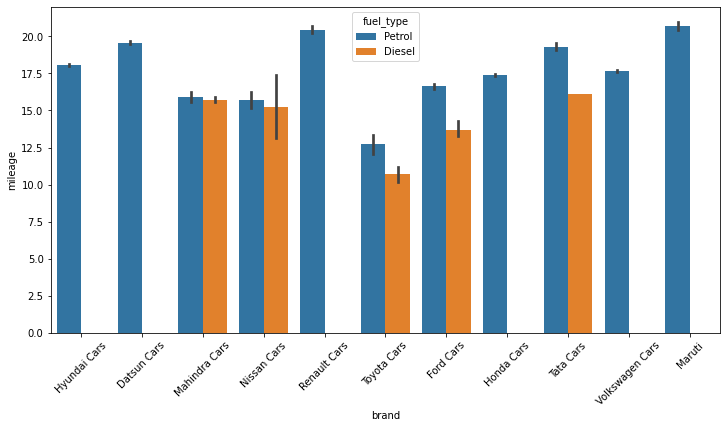

In [26]:
#Visualizing: Average mileage of particular brand with respect to its fuel type
plt.figure(figsize=(12,6))
sns.barplot(data=df,x="brand",y="mileage",hue='fuel_type')
plt.xticks(rotation=45)

By the above plot we conclude, Petrol car's mileage is better than diesel cars


## No Of Seat

In [27]:
# Percentage of data with respect to no. of seats
print(np.round(df["seat"].value_counts()/df.shape[0]*100,1))

# Visualizing: Percentage of data based on seating capacity
fig=px.pie(values=df["seat"].value_counts(),names=df["seat"].unique().tolist(),hole=.2)
fig.update_traces( textinfo='percent+label')

5    83.4
7    14.2
6     1.0
4     0.8
2     0.5
8     0.1
Name: seat, dtype: float64


83% for the cars are 5 seater and 14% are 7 seater.

## No Of Cylinder

In [28]:
# Percentage of data with respect to no. of cylinders
print(np.round(df["no_of_cylinder"].value_counts()/df.shape[0]*100,1))

# Visualizing: Percentage of data with respect to no. of cylinders
fig=px.pie(values=df["no_of_cylinder"].value_counts(),names=df["no_of_cylinder"].unique().tolist(),hole=.3)
fig.update_traces( textinfo='percent+label')

4    73.4
3    26.4
6     0.2
Name: no_of_cylinder, dtype: float64


By the above plot we conclude that, around 75% cars have 4 cylinders

## Body Type

In [29]:
# Percentage of data with respect to body type
print(np.round(df["body_type"].value_counts()/df.shape[0]*100,1))

# Visualizing: Percentage of data with respect to body type
fig=px.pie(values=df["body_type"].value_counts(),names=df["body_type"].unique().tolist(),hole=.1)
fig.update_traces( textinfo='percent+label')

SUV             57.5
Hatchback       26.0
Sedan            7.6
MUV              7.5
Pickup Truck     0.7
Minivan          0.5
Coupe            0.2
Name: body_type, dtype: float64


By the above plot we conclude that, most of the cars body type is SUV(59%) & Hatchback(25%)

In [30]:
# Splitting data by Petrol and Body Type
petrol_SUV=df[(df['fuel_type']=='Petrol') & (df['body_type']=='SUV')]
petrol_Hatchback=df[(df['fuel_type']=='Petrol') & (df['body_type']=='Hatchback')]
petrol_Sedan=df[(df['fuel_type']=='Petrol') & (df['body_type']=='Sedan')]
petrol_MUV=df[(df['fuel_type']=='Petrol') & (df['body_type']=='MUV')]

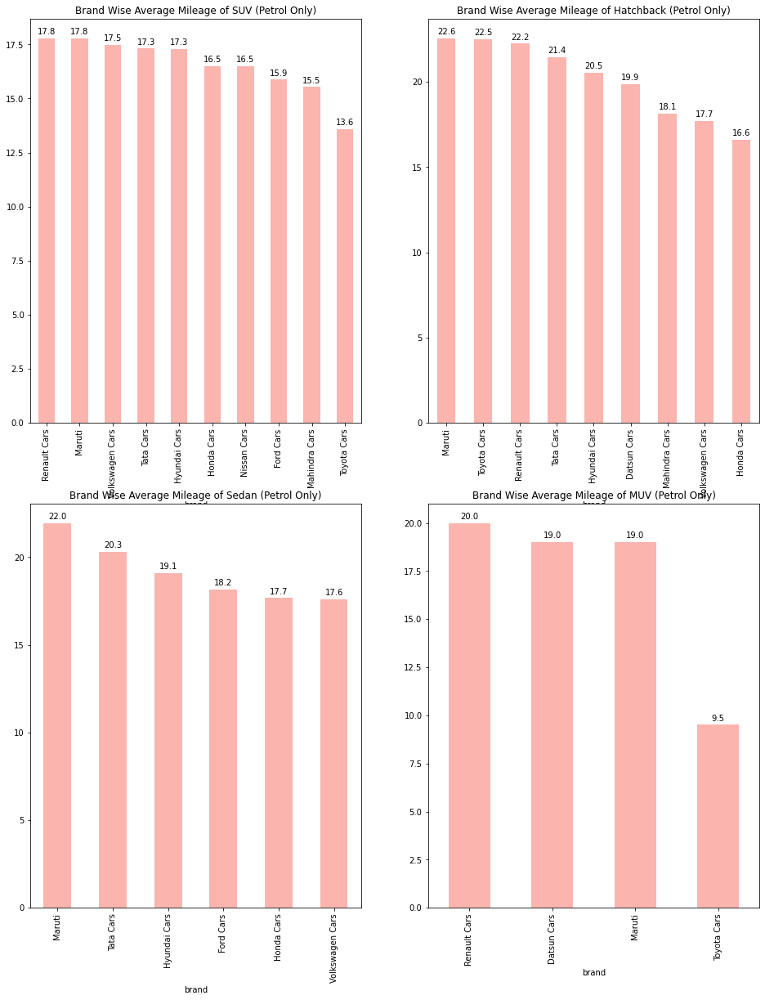

In [31]:
# Brand Wise and Body Type Wise Average Mileage
plt.figure(figsize=(16,20))

plt.subplot(2,2,1)
plt.title('Brand Wise Average Mileage of SUV (Petrol Only)')
fig=petrol_SUV.groupby("brand")['mileage'].mean().sort_values(ascending=False).plot(kind="bar",colormap='Pastel1')
for bar in fig.patches:
   fig.annotate(format(bar.get_height(), '.1f'),
                    (bar.get_x() + bar.get_width() / 2,
                     bar.get_height()), ha='center', va='center',
                     size=10, xytext=(0, 8),
                     textcoords='offset points')

plt.subplot(2,2,2)
plt.title('Brand Wise Average Mileage of Hatchback (Petrol Only)')
fig=petrol_Hatchback.groupby("brand")['mileage'].mean().sort_values(ascending=False).plot(kind="bar",colormap='Pastel1')
for bar in fig.patches:
   fig.annotate(format(bar.get_height(), '.1f'),
                    (bar.get_x() + bar.get_width() / 2,
                     bar.get_height()), ha='center', va='center',
                     size=10, xytext=(0, 8),
                     textcoords='offset points')

plt.subplot(2,2,3)
plt.title('Brand Wise Average Mileage of Sedan (Petrol Only)')
fig=petrol_Sedan.groupby("brand")['mileage'].mean().sort_values(ascending=False).plot(kind="bar",colormap='Pastel1')
for bar in fig.patches:
   fig.annotate(format(bar.get_height(), '.1f'),
                    (bar.get_x() + bar.get_width() / 2,
                     bar.get_height()), ha='center', va='center',
                     size=10, xytext=(0, 8),
                     textcoords='offset points')

plt.subplot(2,2,4)
plt.title('Brand Wise Average Mileage of MUV (Petrol Only)')
fig=petrol_MUV.groupby("brand")['mileage'].mean().sort_values(ascending=False).plot(kind="bar",colormap='Pastel1')
for bar in fig.patches:
   fig.annotate(format(bar.get_height(), '.1f'),
                    (bar.get_x() + bar.get_width() / 2,
                     bar.get_height()), ha='center', va='center',
                     size=10, xytext=(0, 8),
                     textcoords='offset points')


From the above graphs (petrol only), we can conclude that-

1) For SUV, Maruti, Renault, Volkswagen, Tata and Hyundai cars are giving almost same and better mileage compared to others brand. Whereas, Toyota cars are giving lowest mileage.
2) But for hatchback, Toyota is giving second highest average mileage, which is almost same as Maruti, Renault and Tata. Here, Honda is giving the lowest mileage.,
3) In case of Sedan, Maruti is giving the highest average mileage and Volkswagen is giving the lowest.
4) For MUV, Renault is giving highest mileage, whereas Toyota is giving the lowest mileage.

## Transmission Type

In [32]:
# Percentage of data with respect to Transmission Type
print(np.round(df["transmission_type"].value_counts()/df.shape[0]*100,1))
# Visualizing : Percentage of data with respect to Transmission Type
fig=px.pie(values=df["transmission_type"].value_counts(),names=df["transmission_type"].unique().tolist(),hole=.1)
fig.update_traces(textposition='inside', textinfo='percent+label')

Manual       96.5
Automatic     3.5
Name: transmission_type, dtype: float64


About 96% of cars has manual transmission type


In [33]:
# Splitting data by Manual and Body Type
manual_SUV=df[(df['transmission_type']=='Manual') & (df['body_type']=='SUV')]
manual_HB=df[(df['transmission_type']=='Manual') & (df['body_type']=='Hatchback')]
manual_Sedan=df[(df['transmission_type']=='Manual') & (df['body_type']=='Sedan')]
manual_MUV=df[(df['transmission_type']=='Manual') & (df['body_type']=='MUV')]
manual_PT=df[(df['transmission_type']=='Manual') & (df['body_type']=='Pickup Truck')]

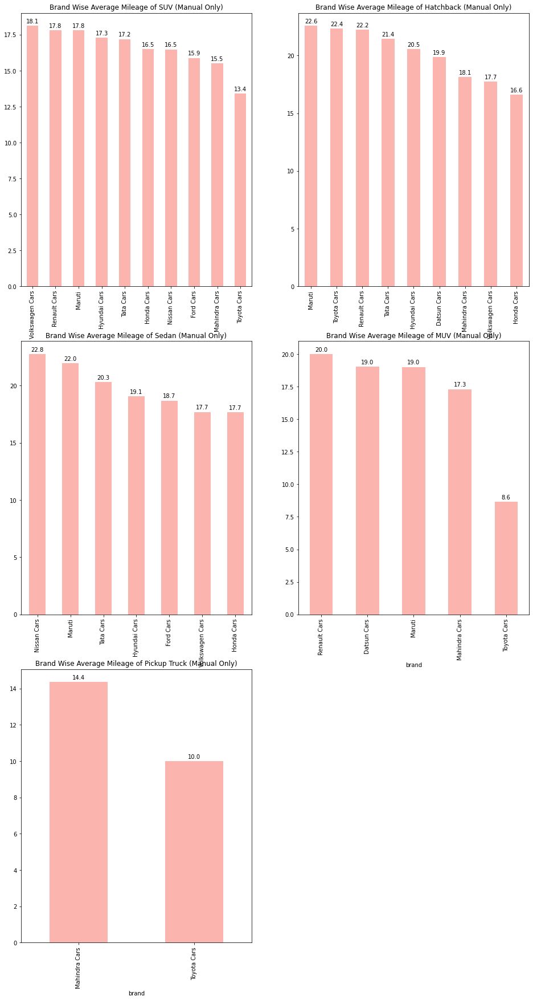

In [34]:
#Analysis on Mileage | Manual Cars | Brand Wise and Body Type Wise Average Mileage
plt.figure(figsize=(16,30))

plt.subplot(3,2,1)
plt.title('Brand Wise Average Mileage of SUV (Manual Only)')
fig=manual_SUV.groupby("brand")['mileage'].mean().sort_values(ascending=False).plot(kind="bar",colormap='Pastel1')
for bar in fig.patches:
   fig.annotate(format(bar.get_height(), '.1f'),
                    (bar.get_x() + bar.get_width() / 2,
                     bar.get_height()), ha='center', va='center',
                     size=10, xytext=(0, 8),
                     textcoords='offset points')

plt.subplot(3,2,2)
plt.title('Brand Wise Average Mileage of Hatchback (Manual Only)')
fig=manual_HB.groupby("brand")['mileage'].mean().sort_values(ascending=False).plot(kind="bar",colormap='Pastel1')
for bar in fig.patches:
   fig.annotate(format(bar.get_height(), '.1f'),
                    (bar.get_x() + bar.get_width() / 2,
                     bar.get_height()), ha='center', va='center',
                     size=10, xytext=(0, 8),
                     textcoords='offset points')

plt.subplot(3,2,3)
plt.title('Brand Wise Average Mileage of Sedan (Manual Only)')
fig=manual_Sedan.groupby("brand")['mileage'].mean().sort_values(ascending=False).plot(kind="bar",colormap='Pastel1')
for bar in fig.patches:
   fig.annotate(format(bar.get_height(), '.1f'),
                    (bar.get_x() + bar.get_width() / 2,
                     bar.get_height()), ha='center', va='center',
                     size=10, xytext=(0, 8),
                     textcoords='offset points')

plt.subplot(3,2,4)
plt.title('Brand Wise Average Mileage of MUV (Manual Only)')
fig=manual_MUV.groupby("brand")['mileage'].mean().sort_values(ascending=False).plot(kind="bar",colormap='Pastel1')
for bar in fig.patches:
   fig.annotate(format(bar.get_height(), '.1f'),
                    (bar.get_x() + bar.get_width() / 2,
                     bar.get_height()), ha='center', va='center',
                     size=10, xytext=(0, 8),
                     textcoords='offset points')

plt.subplot(3,2,5)
plt.title('Brand Wise Average Mileage of Pickup Truck (Manual Only)')
fig=manual_PT.groupby("brand")['mileage'].mean().sort_values(ascending=False).plot(kind="bar",colormap='Pastel1')
for bar in fig.patches:
   fig.annotate(format(bar.get_height(), '.1f'),
                    (bar.get_x() + bar.get_width() / 2,
                     bar.get_height()), ha='center', va='center',
                     size=10, xytext=(0, 8),
                     textcoords='offset points')

## Fuel Tank Capacity

In [35]:
#Visualizing: Fuel tank capacity of each brands
px.box(df,x="brand",y="fuel_tank_capacity",color='brand')

Here we conclude, Toyota and Ford has large tank capacity and Mahindra also has a good tank capacity.

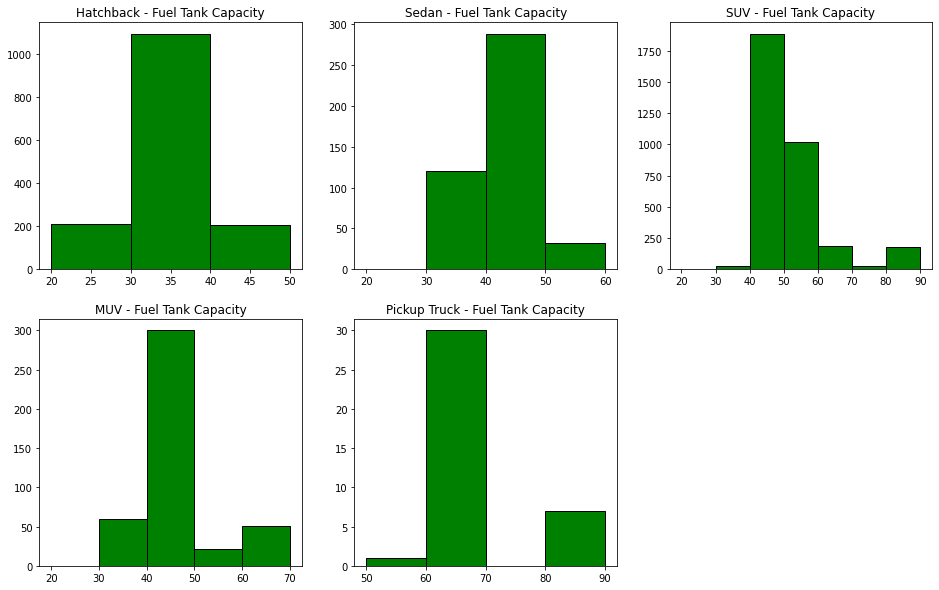

In [36]:
#Visualizing tank capacity with respect to body type

plt.figure(figsize=(16,10))

plt.subplot(2,3,1)
plt.title('Hatchback - Fuel Tank Capacity')
plt.hist(df[df['body_type']=='Hatchback']['fuel_tank_capacity'],bins=[20,30,40,50],color='green',edgecolor='black')

plt.subplot(2,3,2)
plt.title('Sedan - Fuel Tank Capacity')
plt.hist(df[df['body_type']=='Sedan']['fuel_tank_capacity'],bins=[20,30,40,50,60],color='green',edgecolor='black')

plt.subplot(2,3,3)
plt.title('SUV - Fuel Tank Capacity')
plt.hist(df[df['body_type']=='SUV']['fuel_tank_capacity'],bins=[20,30,40,50,60,70,80,90],color='green',edgecolor='black')

plt.subplot(2,3,4)
plt.title('MUV - Fuel Tank Capacity')
plt.hist(df[df['body_type']=='MUV']['fuel_tank_capacity'],bins=[20,30,40,50,60,70],color='green',edgecolor='black')

plt.subplot(2,3,5)
plt.title('Pickup Truck - Fuel Tank Capacity')
plt.hist(df[df['body_type']=='Pickup Truck']['fuel_tank_capacity'],bins=[50,60,70,80,90],color='green',edgecolor='black')

plt.show()

We are not showing the distribution of coupe and minivan, as there are only one model of each type in our dataset.<br><br>
1. Most of the reviews which came from hatchback cars, have fuel capacity ranging between 30-40 litre.<br>
2. Most of the reviews which came from sedan cars, have fuel capacity ranging between 40-50 litre.<br>
3. Most of the reviews which came from SUV, have fuel capacity ranging between 40-50 litre.<br>
4. Most of the reviews which came from MUV, have fuel capacity ranging between 40-50 litre.<br>
5. Most of the reviews which came from pickup trucks, have fuel capacity ranging between 60-70 litre.

In [37]:
import statsmodels
px.scatter(df,x="fuel_tank_capacity",y="mileage",trendline="ols",trendline_color_override="red") 
# Using Ordinary Least Squares

Here we observe a negetive correlation between fuel tank capacity and mileage, i.e., when mileage increase Tank capacity decrease and vice versa.

In [38]:
px.scatter(df,x="fuel_tank_capacity",y="price",trendline="ols",trendline_color_override="green") 

Here we observe, a positive correlation between price and fuel tank capacity,i.e., price increases when fuel tank capacity increases.

## Boot Space

In [39]:
#Visualizing: boot space of particular brand
px.box(df,x="brand",y="boot_space",color='brand')

In the above plot we observe that the boot space of: 
- Honda and Ford cars are large  
- Renault and Toyota are small
- Rest have an average boot space around 350 litres

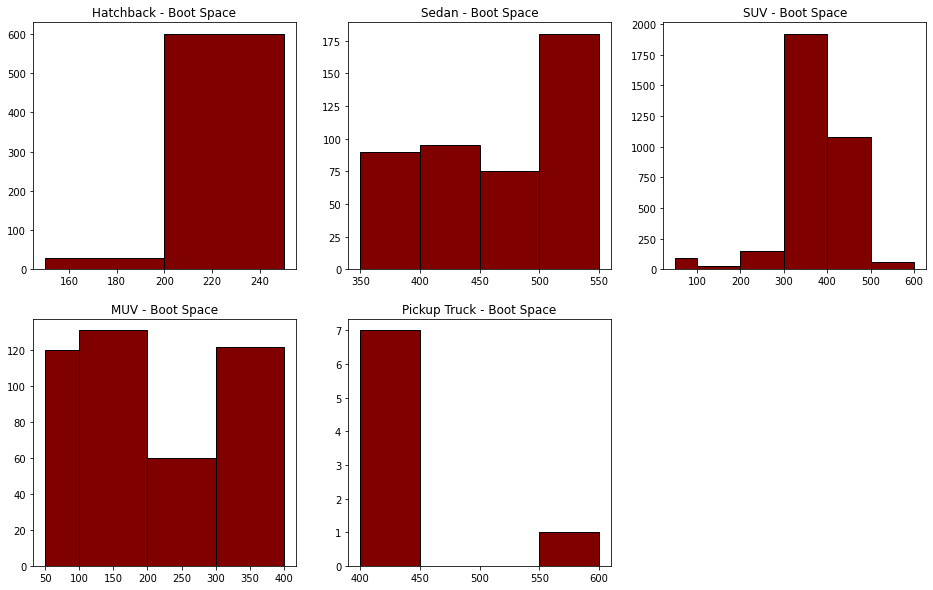

In [40]:
#Visualizing : Boot space with respect to body type

plt.figure(figsize=(16,10))

plt.subplot(2,3,1)
plt.title('Hatchback - Boot Space')
plt.hist(df[df['body_type']=='Hatchback']['boot_space'],bins=[150,200,250],color='maroon',edgecolor='black')

plt.subplot(2,3,2)
plt.title('Sedan - Boot Space')
plt.hist(df[df['body_type']=='Sedan']['boot_space'],bins=[350,400,450,500,550],color='maroon',edgecolor='black')

plt.subplot(2,3,3)
plt.title('SUV - Boot Space')
plt.hist(df[df['body_type']=='SUV']['boot_space'],bins=[50,100,200,300,400,500,600],color='maroon',edgecolor='black')

plt.subplot(2,3,4)
plt.title('MUV - Boot Space')
plt.hist(df[df['body_type']=='MUV']['boot_space'],bins=[50,100,200,300,400],color='maroon',edgecolor='black')

plt.subplot(2,3,5)
plt.title('Pickup Truck - Boot Space')
plt.hist(df[df['body_type']=='Pickup Truck']['boot_space'],bins=[400,450,500,550,600],color='maroon',edgecolor='black')

plt.show()

We are not showing the distribution of coupe and minivan, as there are only one model of each type in our dataset.<br><br>
1. Most of the reviews which came from hatchback cars, have boot space ranging between 200-250 litres.<br>
2. Most of the reviews which came from sedan cars, have boot space ranging between 500-550 litres.<br>
3. Most of the reviews which came from SUV, have boot space ranging between 300-400 litres.<br>
4. Most of the reviews which came from MUV, have boot space ranging between 100-200 litres.<br>
5. Most of the reviews which came from pickup trucks, have boot space ranging between 400-450 litres.

## Engine Displacement

In [41]:
#Visualizing : Engine displacement of particular brand
px.box(df,x="brand",y="engine_displacement",color='brand')

Here we conclude that the engine displacement of Mahindra and Toyota cars vary alot, whereas Ford has an average engine displacement

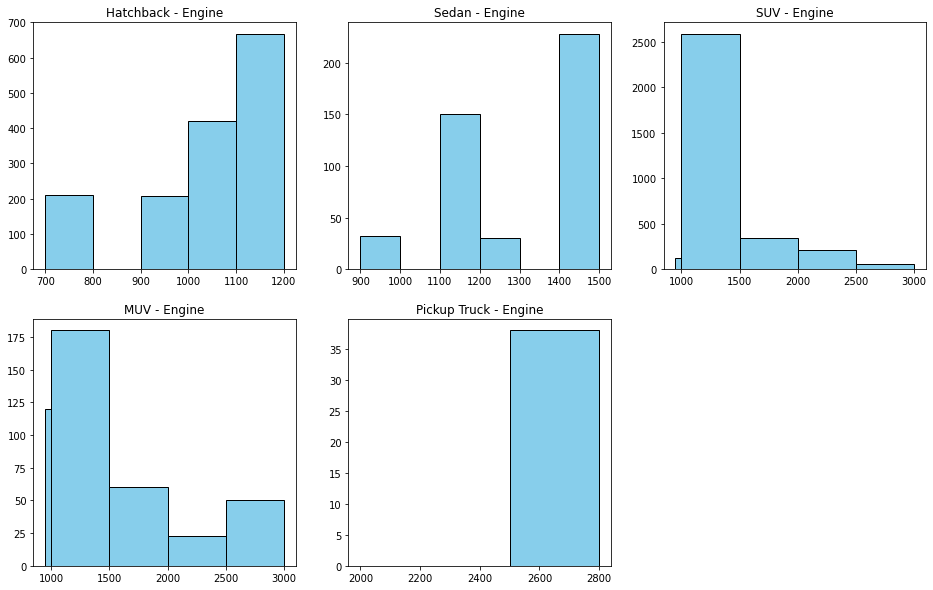

In [42]:
# Engine displacement wise disdribution of data

plt.figure(figsize=(16,10))

plt.subplot(2,3,1)
plt.title('Hatchback - Engine')
plt.hist(df[df['body_type']=='Hatchback']['engine_displacement'],bins=[700,800,900,1000,1100,1200],color='skyblue'
         ,edgecolor='black')

plt.subplot(2,3,2)
plt.title('Sedan - Engine')
plt.hist(df[df['body_type']=='Sedan']['engine_displacement'],bins=[900,1000,1100,1200,1300,1400,1500],color='skyblue',
         edgecolor='black')

plt.subplot(2,3,3)
plt.title('SUV - Engine')
plt.hist(df[df['body_type']=='SUV']['engine_displacement'],bins=[950,1000,1500,2000,2500,3000],color='skyblue',
         edgecolor='black')

plt.subplot(2,3,4)
plt.title('MUV - Engine')
plt.hist(df[df['body_type']=='MUV']['engine_displacement'],bins=[950,1000,1500,2000,2500,3000],color='skyblue',
         edgecolor='black')

plt.subplot(2,3,5)
plt.title('Pickup Truck - Engine')
plt.hist(df[df['body_type']=='Pickup Truck']['engine_displacement'],bins=[2000,2500,2800],color='skyblue',
         edgecolor='black')

plt.show()

We are not showing the distribution of coupe and minivan, as there are only one model of each type in our dataset.<br><br>
1. Most of the reviews which came from hatchback cars, have engine size ranging between 1100-1200 CC.<br>
2. Most of the reviews which came from sedan cars, have fuel capacity ranging between 1400-1500 CC.<br>
3. Most of the reviews which came from SUV, have fuel capacity ranging between 1000-1500 CC.<br>
4. Most of the reviews which came from MUV, have fuel capacity ranging between 1000-1500 CC.<br>
5. Most of the reviews which came from pickup trucks, have fuel capacity ranging between 2500-2800 CC.

In [43]:
#Visualizing: Engine displacement vs. mileage
px.scatter(df,x="engine_displacement",y="mileage",trendline="ols",trendline_color_override="red")

Here we can see a negetive correlation between engine displacement and mileage, i.e., mileage decrease with increase in engine displacement and vice versa.

In [44]:
# Visualization: Engine displacement vs. Price
px.scatter(df,x="engine_displacement",y="price",trendline="ols",trendline_color_override="violet")

Here we see a positive correlation between Engine displacement and price, i.e., Price increases with increase in engine displacement

# Preprocessing

## Creating column for Sentiment
This is an important preprocessing phase, we are deciding the outcome column (sentiment_by_rating) based on the rating given by the customer. If the score is greater than 3, we take that as 'positive' and if the value is less than 3 it is 'negative'. If it is equal to 3, we take that as neutral sentiment.

In [45]:
df.columns

Index(['brand', 'car_name', 'variant_name', 'model_name', 'mileage',
       'fuel_type', 'seat', 'no_of_cylinder', 'body_type', 'transmission_type',
       'fuel_tank_capacity', 'boot_space', 'engine_displacement', 'price',
       'rating', 'review_title', 'review', 'review_date', 'view'],
      dtype='object')

In [46]:
df['sentiment_by_rating'] = df['rating'].apply(lambda rating : 'Positive' if rating > 3
                                                           else('Negative' if rating < 3 else 'Neutral'))

Here, we are checking for the counts of different sentiments. 

In [47]:
df['sentiment_by_rating'].value_counts()

Positive    5053
Negative     572
Neutral      166
Name: sentiment_by_rating, dtype: int64

In [48]:
df.groupby('sentiment_by_rating')['rating'].value_counts()

sentiment_by_rating  rating
Negative             2.5        196
                     1.0        190
                     1.5         94
                     2.0         92
Neutral              3.0        166
Positive             5.0       2340
                     4.5       1288
                     4.0        947
                     3.5        478
Name: rating, dtype: int64

The above table is showing the split of different ratings by sentiment. It is also showing that our intended labelling is done successfully.

## Distribution of Ratings
The below graphs are showing the distribution of ratings for each category of sentiment.

Text(0, 0.5, 'Number of Rating')

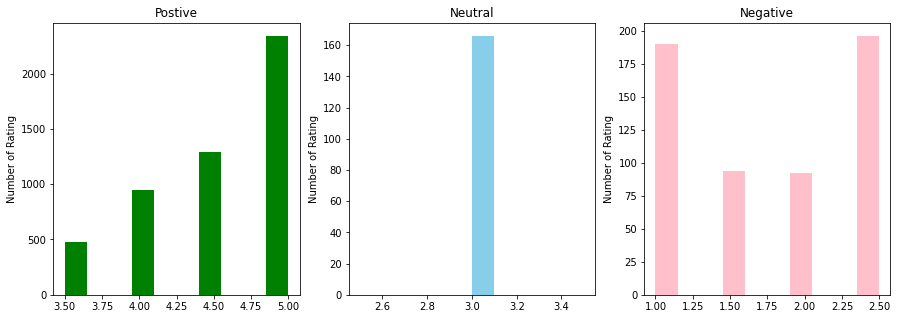

In [49]:
plt.figure(figsize=(15,5))
plt.subplot(131)
df[df['sentiment_by_rating']=='Positive']['rating'].plot(kind='hist',x='review_len',color='green',y='count',title='Postive')
plt.ylabel('Number of Rating')
plt.subplot(132)
df[df['sentiment_by_rating']=='Neutral']['rating'].plot(kind='hist',x='review_len',color='skyblue',y='count',title='Neutral')
plt.ylabel('Number of Rating')
plt.subplot(133)
df[df['sentiment_by_rating']=='Negative']['rating'].plot(kind='hist',x='review_len',color='pink',y='count',title='Negative')
plt.ylabel('Number of Rating')

# Cleaning
We have to do lot of preprocessing before sending the reviews to the model. Now we'll be doing our review text cleaning process by removing punctuation, digits, emoji.

## Review text-Punctuation Cleaning

In [50]:
# Creating function to make text lowercase, remove text in square brackets,remove links,remove punctuation
# and remove words containing numbers
def review_cleaning(text):
    '''Make text lowercase, remove text in square brackets,remove links,remove punctuation
    and remove words containing numbers.'''
    text = str(text).lower()
    text = re.sub('\[.*?\]', '', text)
    text = re.sub('https?://\S+|www\.\S+', '', text)
    text = re.sub('<.*?>+', '', text)
    text = re.sub('[%s]' % re.escape(string.punctuation), '', text)
    text = re.sub('\n', '', text)
    text = re.sub('\w*\d\w*', '', text)
    return text

# Clean only digits from text
def remove_digits(text1):
    return text1.translate(str.maketrans('','',digits)) 

# Clean emojis from text
def strip_emoji(text):
    return re.sub(emoji.get_emoji_regexp(), r"", text) 

# Applying all the first function on 'review' column
df['review']=df['review'].apply(lambda x:review_cleaning(x))

# Applying all the second function on 'review' column
df['review1']=df['review'].apply(lambda x:remove_digits(x))

# Applying all the third function on 'review' column
df['cleaned_review']=df['review1'].apply(lambda x:strip_emoji(x))

# dropping unnecessary columns
df = df.drop(['review', 'review1'], axis = 1)
df.head()

,brand,car_name,variant_name,model_name,mileage,fuel_type,seat,no_of_cylinder,body_type,transmission_type,fuel_tank_capacity,boot_space,engine_displacement,price,rating,review_title,review_date,view,sentiment_by_rating,cleaned_review
0,Hyundai Cars,Hyundai Creta,Creta E,Hyundai Creta E,16.80,Petrol,5,4,SUV,Manual,50,433.0,1497,10.75,1.0,Worst Car.. Sunroof Glass Scattering,2021-04-16,3979,Negative,worst car thing i have noticed car pickup in ...
1,Hyundai Cars,Hyundai Santro,Santro Era Executive,Hyundai Santro Era Executive,20.30,Petrol,5,4,Hatchback,Manual,35,235.0,1086,4.87,1.0,Santro CNG Spotz Model,2019-04-21,31,Negative,i bought a santro cng sportz model no speed se...
2,Hyundai Cars,Hyundai Santro,Santro Era Executive,Hyundai Santro Era Executive,20.30,Petrol,5,4,Hatchback,Manual,35,235.0,1086,4.87,1.0,Celerio vs Santro,2019-04-20,38,Negative,we have both car santro and celerio but we fin...
3,Hyundai Cars,Hyundai Santro,Santro Era Executive,Hyundai Santro Era Executive,20.30,Petrol,5,4,Hatchback,Manual,35,235.0,1086,4.87,1.0,Manufacturing Crank Shaft Defect In Santro,2019-04-14,144,Negative,dear friends i have recently purchased a santr...
4,Hyundai Cars,Hyundai Venue,Venue E,Hyundai Venue E,17.52,Petrol,5,4,SUV,Manual,45,336.0,1197,6.99,1.0,Pathetic Car With Zero Safety And Performance,2021-04-08,94,Negative,pathetic car with zero safety and performance ...


## Review Text - Remove Stopwords 

In [51]:
import nltk 
nltk.download('stopwords')

[nltk_data] Downloading package stopwords to
[nltk_data]     C:\Users\HP\AppData\Roaming\nltk_data...
[nltk_data]   Package stopwords is already up-to-date!


True

In [52]:
#Let's check Stop Words list first
stop_words = stopwords.words('english')
print(stop_words)

['i', 'me', 'my', 'myself', 'we', 'our', 'ours', 'ourselves', 'you', "you're", "you've", "you'll", "you'd", 'your', 'yours', 'yourself', 'yourselves', 'he', 'him', 'his', 'himself', 'she', "she's", 'her', 'hers', 'herself', 'it', "it's", 'its', 'itself', 'they', 'them', 'their', 'theirs', 'themselves', 'what', 'which', 'who', 'whom', 'this', 'that', "that'll", 'these', 'those', 'am', 'is', 'are', 'was', 'were', 'be', 'been', 'being', 'have', 'has', 'had', 'having', 'do', 'does', 'did', 'doing', 'a', 'an', 'the', 'and', 'but', 'if', 'or', 'because', 'as', 'until', 'while', 'of', 'at', 'by', 'for', 'with', 'about', 'against', 'between', 'into', 'through', 'during', 'before', 'after', 'above', 'below', 'to', 'from', 'up', 'down', 'in', 'out', 'on', 'off', 'over', 'under', 'again', 'further', 'then', 'once', 'here', 'there', 'when', 'where', 'why', 'how', 'all', 'any', 'both', 'each', 'few', 'more', 'most', 'other', 'some', 'such', 'no', 'nor', 'not', 'only', 'own', 'same', 'so', 'than', '

### NOTE :
Coming to stop words, general nltk stop words contains words like not,hasn't,would'nt which actually conveys a negative sentiment. If we remove that it will end up contradicting the sentiments. So we have curated the stop words which doesn't have any negative sentiment or any negative alternatives.

In [53]:
stop_words = [e for e in stop_words if e not in ('no', 'nor', 'not',"don't","hasn't","hadn't","doesn't","aren't", 'couldn', "couldn't", 'didn', "didn't", "aren't", "couldn't",  "didn't","doesn't", "hadn't", "hasn't", "haven't",  "isn't", "mightn't", "mustn't", "needn't",  "shan't",  "shouldn't",  "wasn't", "weren't", "won't", "wouldn't")]
df['cleaned_review'] = df['cleaned_review'].apply(lambda x: ' '.join([word for word in x.split() if word not in (stop_words)]))
df.head()

,brand,car_name,variant_name,model_name,mileage,fuel_type,seat,no_of_cylinder,body_type,transmission_type,fuel_tank_capacity,boot_space,engine_displacement,price,rating,review_title,review_date,view,sentiment_by_rating,cleaned_review
0,Hyundai Cars,Hyundai Creta,Creta E,Hyundai Creta E,16.80,Petrol,5,4,SUV,Manual,50,433.0,1497,10.75,1.0,Worst Car.. Sunroof Glass Scattering,2021-04-16,3979,Negative,worst car thing noticed car pickup gare worst ...
1,Hyundai Cars,Hyundai Santro,Santro Era Executive,Hyundai Santro Era Executive,20.30,Petrol,5,4,Hatchback,Manual,35,235.0,1086,4.87,1.0,Santro CNG Spotz Model,2019-04-21,31,Negative,bought santro cng sportz model no speed sensor...
2,Hyundai Cars,Hyundai Santro,Santro Era Executive,Hyundai Santro Era Executive,20.30,Petrol,5,4,Hatchback,Manual,35,235.0,1086,4.87,1.0,Celerio vs Santro,2019-04-20,38,Negative,car santro celerio find celerio decent practic...
3,Hyundai Cars,Hyundai Santro,Santro Era Executive,Hyundai Santro Era Executive,20.30,Petrol,5,4,Hatchback,Manual,35,235.0,1086,4.87,1.0,Manufacturing Crank Shaft Defect In Santro,2019-04-14,144,Negative,dear friends recently purchased santro model l...
4,Hyundai Cars,Hyundai Venue,Venue E,Hyundai Venue E,17.52,Petrol,5,4,SUV,Manual,45,336.0,1197,6.99,1.0,Pathetic Car With Zero Safety And Performance,2021-04-08,94,Negative,pathetic car zero safety performance number ze...


Now finally it became a cleaned, processed review overall.

# Sentiment Analysis
Sentiment Analysis is the process of ‘computationally’ determining whether a piece of text is positive, negative or neutral. We'll be now putting our hands on sentiment analysis by using  TextBlob.....
      TextBlob is a python library for Natural Language Processing (NLP).TextBlob actively used Natural Language ToolKit (NLTK) to achieve its tasks. TextBlob is a simple library which supports complex analysis and operations on textual data.

TextBlob returns polarity and subjectivity of a sentence after assigning individual scores to all the words and final sentiment is calculated by some pooling operation like taking an average of all the sentiments. Polarity lies between [-1,1], where -1 defines a negative sentiment and 1 defines a positive sentiment. Negation words reverse the polarity. Subjectivity lies between [0,1]. Subjectivity quantifies the amount of personal opinion and factual information contained in the text.

##### Now let's create Polarity and Subjectivity score for each reviews..............

In [54]:
df['polarity'] = df['cleaned_review'].map(lambda text: TextBlob(text).sentiment.polarity)
df['subjectivity'] = df['cleaned_review'].map(lambda text:TextBlob(text).sentiment.subjectivity)
df.head()

,brand,car_name,variant_name,model_name,mileage,fuel_type,seat,no_of_cylinder,body_type,transmission_type,fuel_tank_capacity,boot_space,engine_displacement,price,rating,review_title,review_date,view,sentiment_by_rating,cleaned_review,polarity,subjectivity
0,Hyundai Cars,Hyundai Creta,Creta E,Hyundai Creta E,16.80,Petrol,5,4,SUV,Manual,50,433.0,1497,10.75,1.0,Worst Car.. Sunroof Glass Scattering,2021-04-16,3979,Negative,worst car thing noticed car pickup gare worst ...,-0.689394,0.818182
1,Hyundai Cars,Hyundai Santro,Santro Era Executive,Hyundai Santro Era Executive,20.30,Petrol,5,4,Hatchback,Manual,35,235.0,1086,4.87,1.0,Santro CNG Spotz Model,2019-04-21,31,Negative,bought santro cng sportz model no speed sensor...,-0.600000,0.700000
2,Hyundai Cars,Hyundai Santro,Santro Era Executive,Hyundai Santro Era Executive,20.30,Petrol,5,4,Hatchback,Manual,35,235.0,1086,4.87,1.0,Celerio vs Santro,2019-04-20,38,Negative,car santro celerio find celerio decent practic...,0.233333,0.833333
3,Hyundai Cars,Hyundai Santro,Santro Era Executive,Hyundai Santro Era Executive,20.30,Petrol,5,4,Hatchback,Manual,35,235.0,1086,4.87,1.0,Manufacturing Crank Shaft Defect In Santro,2019-04-14,144,Negative,dear friends recently purchased santro model l...,0.291667,0.329167
4,Hyundai Cars,Hyundai Venue,Venue E,Hyundai Venue E,17.52,Petrol,5,4,SUV,Manual,45,336.0,1197,6.99,1.0,Pathetic Car With Zero Safety And Performance,2021-04-08,94,Negative,pathetic car zero safety performance number ze...,-0.600000,0.500000


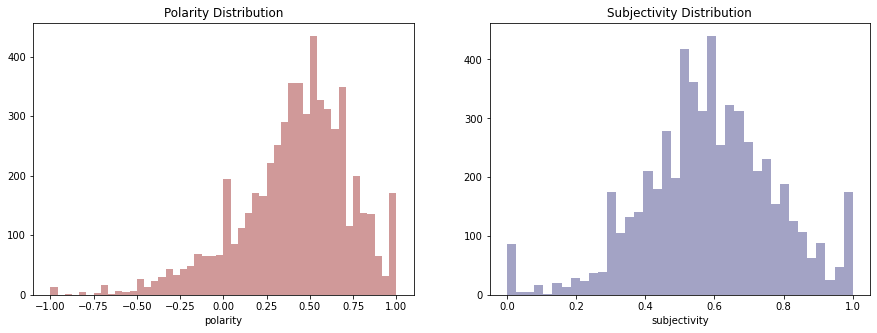

In [55]:
plt.figure(figsize=(15,5))
  
# addind first subplot
plt.subplot(121)
sns.distplot(df["polarity"], kde=False, color= 'DarkRed')
plt.title("Polarity Distribution")

# addding second subplot
plt.subplot(122)
sns.distplot(df["subjectivity"], kde=False, color='MidnightBlue')
plt.title("Subjectivity Distribution")
plt.show()

### Insights:

(1)The polarity distribution shows that We have a lot of positive polarities compared to the negative polarities.

(2)The subjectivity distribution shows that all the reviews are highly subjective i.e, based on personal opinions.

# Creating few more features for text analysis
Now, let's create review length and word count......

Review length: length of the review which includes each letters and spaces

Word count: This measures how many words are there in review

In [56]:
df['review_len'] = df['cleaned_review'].astype(str).apply(len)
df['word_count'] = df['cleaned_review'].apply(lambda x: len(str(x).split()))
df.head()

,brand,car_name,variant_name,model_name,mileage,fuel_type,seat,no_of_cylinder,body_type,transmission_type,fuel_tank_capacity,boot_space,engine_displacement,price,rating,review_title,review_date,view,sentiment_by_rating,cleaned_review,polarity,subjectivity,review_len,word_count
0,Hyundai Cars,Hyundai Creta,Creta E,Hyundai Creta E,16.80,Petrol,5,4,SUV,Manual,50,433.0,1497,10.75,1.0,Worst Car.. Sunroof Glass Scattering,2021-04-16,3979,Negative,worst car thing noticed car pickup gare worst ...,-0.689394,0.818182,154,25
1,Hyundai Cars,Hyundai Santro,Santro Era Executive,Hyundai Santro Era Executive,20.30,Petrol,5,4,Hatchback,Manual,35,235.0,1086,4.87,1.0,Santro CNG Spotz Model,2019-04-21,31,Negative,bought santro cng sportz model no speed sensor...,-0.600000,0.700000,131,21
2,Hyundai Cars,Hyundai Santro,Santro Era Executive,Hyundai Santro Era Executive,20.30,Petrol,5,4,Hatchback,Manual,35,235.0,1086,4.87,1.0,Celerio vs Santro,2019-04-20,38,Negative,car santro celerio find celerio decent practic...,0.233333,0.833333,95,13
3,Hyundai Cars,Hyundai Santro,Santro Era Executive,Hyundai Santro Era Executive,20.30,Petrol,5,4,Hatchback,Manual,35,235.0,1086,4.87,1.0,Manufacturing Crank Shaft Defect In Santro,2019-04-14,144,Negative,dear friends recently purchased santro model l...,0.291667,0.329167,231,34
4,Hyundai Cars,Hyundai Venue,Venue E,Hyundai Venue E,17.52,Petrol,5,4,SUV,Manual,45,336.0,1197,6.99,1.0,Pathetic Car With Zero Safety And Performance,2021-04-08,94,Negative,pathetic car zero safety performance number ze...,-0.600000,0.500000,74,11


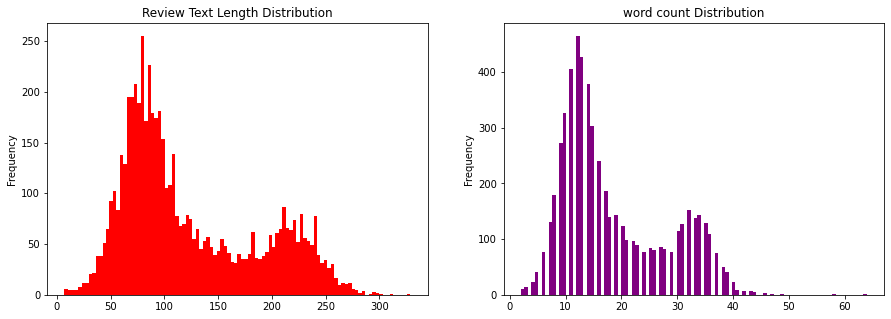

In [57]:
## Let's see the distribution of review length and word count.......
plt.figure(figsize=(15,5))

plt.subplot(121)
df['review_len'].plot( kind='hist',bins=100,x='review_len',color='red',y='count',title='Review Text Length Distribution')

plt.subplot(122)
df['word_count'].plot(kind='hist', bins=100,x='word_count',color='purple',y='count',title='word count Distribution')
plt.show()

### Insights:

(1) we can see maximum review text length falling between 10-250.

(2) we can see maximum most of the words falling between 10-40.

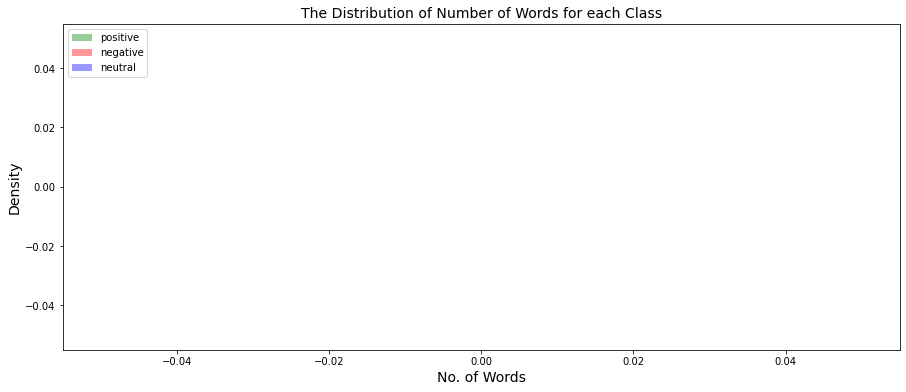

In [58]:
# plotting the distribution of word count
fig = plt.figure(figsize = (15, 6))
sns.distplot(df['word_count'][df['sentiment_by_rating']==2], color='g', label = 'positive')
sns.distplot(df['word_count'][df['sentiment_by_rating']==0], color='r', label = 'negative')
sns.distplot(df['word_count'][df['sentiment_by_rating']==1], color='b', label = 'neutral')
plt.legend(loc='best')
plt.xlabel('No. of Words', size = 14)
plt.ylabel('Density', size = 14)
plt.title('The Distribution of Number of Words for each Class', fontsize = 14)
plt.show()

Now we can clearly see that each categorisation of sentiments i.e, positive, negative and neutral has the symmetrical distribution...

In [59]:
#Creating Sentiment by Review using polarity
df['sentiment_by_review'] = df['polarity'].apply(lambda polarity : "Positive" if polarity >0 else("Negative" if polarity<0  else "Neutral"))

# Label Encoding the target variable- Sentiment

Label Encoding refers to converting the labels into a numeric form so as to convert them into the machine-readable form. It is an important pre-processing step for the structured dataset in supervised learning.

Here it's labelling 'Negative' as 0, 'Neutral' as 1, and 'Positive' as 2.

In [60]:
# Create an instance of LabelEncoder() and store it in label_encoder variable/object
label_encoder = LabelEncoder() 
  
# Encode labels in column 'sentiment'. 
df['sentiment_by_rating']= label_encoder.fit_transform(df['sentiment_by_rating']) 
  
df['sentiment_by_rating'].unique()

array([0, 1, 2])

Here we have lebelled sentiment on polarity where 'Positive' means 2,'Neutral' means 1,'Negative' means 0

In [61]:
df['sentiment_by_review']=df['sentiment_by_review'].replace({"Positive":2,"Neutral":1,"Negative":0})

## Different Between two sentiments

In [62]:
compare_sentiment=df[df["sentiment_by_rating"]!=df["sentiment_by_review"]][["cleaned_review","sentiment_by_rating","sentiment_by_review"]]

#Here we are showing the difference between two sentiments based on rating and review
compare_sentiment.shape[0]

671

So we have found there are 671 differences between these two  sentiments.

In [63]:
#Fetching 5 random Rows as a sample
compare_sentiment.sample(n=5,random_state=1)

,cleaned_review,sentiment_by_rating,sentiment_by_review
272,try replace tire bolt completely broken nut en...,0,2
889,previously used celerio upgraded new celario z...,2,0
288,recently bought kwid climber top model easy r ...,0,2
2264,tough look exterior well interior since scorpi...,2,0
144,faltu bakwaas car mileage not mark engine much...,0,2


# Words Comparison- WordCloud

Let's go into more deeper of text analysis accordingly. Using the Wordcloud package we will be able to generate an image that gives us the most representative words (actually the more common) in a chosen set of reviews i.e, positive, negative and neutral....

## Wordcloud-Positive reviews

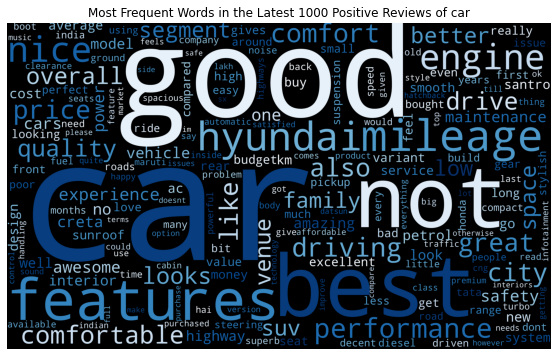

In [64]:
def word_freq_dict(text):
    # Convert text into word list
    wordList = text.split()
    # Generate word freq dictionary
    wordFreqDict = {word: wordList.count(word) for word in wordList}
    return wordFreqDict

def wordcloud_from_frequency(word_freq_dict, title, figure_size=(10, 6)):
    wordcloud.generate_from_frequencies(word_freq_dict)
    plt.figure(figsize=figure_size)
    plt.imshow(wordcloud)
    plt.axis("off")
    plt.title(title)
    plt.show()
    
review_pos = " ".join(df[df["sentiment_by_rating"]==2]["cleaned_review"][0:1000])
pos_word_freq = word_freq_dict(review_pos)
wordcloud = WordCloud(width=5000, 
                      height=3000, 
                      max_words=200, 
                      colormap="Blues",
                      background_color="black")
wordcloud_from_frequency(pos_word_freq, "Most Frequent Words in the Latest 1000 Positive Reviews of car")

We can see positive words like good,best,nice,amazing,great etc.

## Wordcloud-Neutral reviews

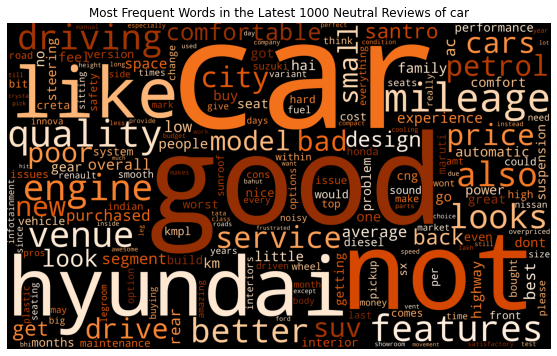

In [65]:
def word_freq_dict(text):
    # Convert text into word list
    wordList = text.split()
    # Generate word freq dictionary
    wordFreqDict = {word: wordList.count(word) for word in wordList}
    return wordFreqDict

def wordcloud_from_frequency(word_freq_dict, title, figure_size=(10, 6)):
    wordcloud.generate_from_frequencies(word_freq_dict)
    plt.figure(figsize=figure_size)
    plt.imshow(wordcloud)
    plt.axis("off")
    plt.title(title)
    plt.show()
    
review_neu = " ".join(df[df["sentiment_by_rating"]==1]["cleaned_review"][0:1000])
neu_word_freq = word_freq_dict(review_neu)
wordcloud = WordCloud(width=5000, 
                      height=3000, 
                      max_words=200, 
                      colormap="Oranges",
                      background_color="black")
wordcloud_from_frequency(neu_word_freq, "Most Frequent Words in the Latest 1000 Neutral Reviews of car")

We can see most of the neutral review words are focused on the products and how can they be improved.

## Wordcloud-Negative reviews

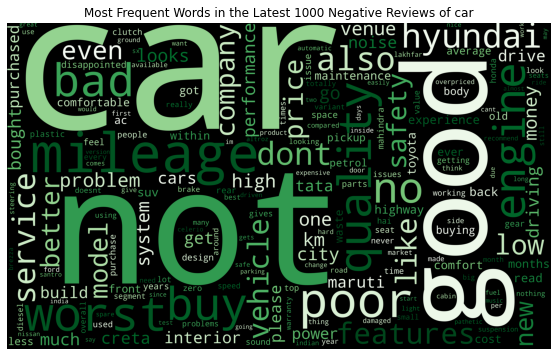

In [66]:
def word_freq_dict(text):
    # Convert text into word list
    wordList = text.split()
    # Generate word freq dictionary
    wordFreqDict = {word: wordList.count(word) for word in wordList}
    return wordFreqDict

def wordcloud_from_frequency(word_freq_dict, title, figure_size=(10, 6)):
    wordcloud.generate_from_frequencies(word_freq_dict)
    plt.figure(figsize=figure_size)
    plt.imshow(wordcloud)
    plt.axis("off")
    plt.title(title)
    plt.show()
    
review_neg = " ".join(df[df["sentiment_by_rating"]==0]["cleaned_review"][0:1000])
neg_word_freq = word_freq_dict(review_neg)
wordcloud = WordCloud(width=5000, 
                      height=3000, 
                      max_words=200, 
                      colormap="Greens",
                      background_color="black")
wordcloud_from_frequency(neg_word_freq, "Most Frequent Words in the Latest 1000 Negative Reviews of car")

We can see negative review words such as worst, bad,low,issue etc.

In [67]:
# Creating 3 Sub DataFrame by Sentiments Of Rating
review_pos = df[df["sentiment_by_rating"]==2]
review_neu = df[df["sentiment_by_rating"]==1]
review_neg = df[df["sentiment_by_rating"]==0]

# N-Gram Analysis

N-grams are continuous sequences of words or symbols or tokens in a document. In technical terms, they can be defined as the neighbouring sequences of items in a document. ’n’ is just a variable that can have positive integer values including 1,2,3 and so on. ’n’ basically refers to multiple. When n=1, it is said to be a unigram, when n=2 it is said to be a bigram and when n=3 it is said to be a trigram. 

Now here we'll be trying different n-grams on our data in order to confidently conclude which one works the best among all for our text analysis.

 ## Unigram Analysis
Create unigrams for each of the review records belonging to each of the three categories of sentiments

(1) Store the word and its count in the corresponding dictionaries

(2) Convert these dictionaries to corresponding data frames

(3) Fetch the top 10 most frequently used words

(4) Visualize the most frequently used words for all the 3 categories-positive, negative and neutral.

In [68]:
# Method to generate n-grams
def generate_N_grams(text,ngram=1):
  words=[word for word in text.split(" ") if word not in set(stopwords.words('english'))]  
  print("Sentence after removing stopwords:",words)
  temp=zip(*[words[i:] for i in range(0,ngram)])
  ans=[' '.join(ngram) for ngram in temp]
  return ans

In [69]:
positiveValues=defaultdict(int)
negativeValues=defaultdict(int)
neutralValues=defaultdict(int)

# get the count of every word in cleaned review column where sentiment="positive"
for text in review_pos[review_pos.sentiment_by_rating == 2].cleaned_review:
  for word in generate_N_grams(text):
    positiveValues[word]+=1
    
# get the count of every word in cleaned review column where sentiment="negative"    
for text in review_neg[review_neg.sentiment_by_rating == 0].cleaned_review:
  for word in generate_N_grams(text):
    negativeValues[word]+=1
    
# get the count of every word in cleaned review column where sentiment="neutral"    
for text in review_neu[review_neu.sentiment_by_rating == 1].cleaned_review:
  for word in generate_N_grams(text):
    neutralValues[word]+=1
    
df_positive=pd.DataFrame(sorted(positiveValues.items(),key=lambda x:x[1],reverse=True))
df_negative=pd.DataFrame(sorted(negativeValues.items(),key=lambda x:x[1],reverse=True))
df_neutral=pd.DataFrame(sorted(neutralValues.items(),key=lambda x:x[1],reverse=True))

Sentence after removing stopwords: ['headlights', 'car', 'work', 'like', 'nothing', 'mobile', 'flashlight', 'person', 'travels', 'lot', 'especially', 'night', 'please', 'dont', 'buy', 'car', 'least', 'dont', 'buy', 'top', 'end', 'sxo']
Sentence after removing stopwords: ['great', 'design', 'comfortable', 'car', 'decade']
Sentence after removing stopwords: ['really', 'happy', 'decision', 'buy', 'car', 'comfortable', 'stylish', 'fulfils', 'requirements', 'keeps', 'happy', 'road']
Sentence after removing stopwords: ['purchased', 'creta', 'around', 'year', 'ago', 'experience', 'car', 'quite', 'good', 'comfortable', 'gives', 'good', 'mileage', 'cheapest', 'maintenance']
Sentence after removing stopwords: ['good', 'quality', 'looks', 'good', 'better', 'performance', 'car', 'interior', 'better']
Sentence after removing stopwords: ['overall', 'excellent', 'variant', 'look', 'comfort', 'safety', 'point', 'view', 'good', 'ground', 'clearance', 'good']
Sentence after removing stopwords: ['using',

Sentence after removing stopwords: ['initial', 'pickup', 'lower', 'end', 'headlights', 'given', 'manufacturer', 'second', 'gear', 'gives', 'jerky', 'ride', 'reverse', 'gear', 'gets', 'stuck', 'time', 'time', 'interior', 'good', 'suspension', 'handling', 'good', 'easytodrive', 'vehicle', 'sears', 'comfortable']
Sentence after removing stopwords: ['best', 'car', 'till', 'would', 'love', 'car', 'best', 'comfort', 'design', 'lastly', 'boot', 'space']
Sentence after removing stopwords: ['duster', 'nice', 'car', 'long', 'runs', 'two', 'issues', 'car', 'first', 'service', 'centers', 'welltrained', 'mechanics', 'trouble', 'shooting', 'second', 'issue', 'important', 'spares', 'car', 'horribly', 'high', 'priced', 'fleecing', 'company', 'keeps', 'hidden', 'till', 'buy', 'car', 'spares', 'lread']
Sentence after removing stopwords: ['driving', 'around', 'months', 'advise', 'go', 'normal', 'petrol', 'versions', 'lags', 'lot', 'gear', 'forget', 'taking', 'quick', 'takeovers', 'level', 'go', 'turbo', 

Sentence after removing stopwords: ['overall', 'good', 'except', 'suspension', 'bit', 'hard', 'window', 'switches', 'illuminated', 'making', 'difficult', 'find', 'night', 'plastic', 'quality', 'door', 'switches', 'bad']
Sentence after removing stopwords: ['really', 'nice', 'car', 'opinion', 'still', 'needs', 'improvements', 'acceleration', 'high', 'expected']
Sentence after removing stopwords: ['mileage', 'issue', 'petrol', 'variant', 'space', 'maybe', 'rear', 'seat', 'otherwise', 'overall', 'car', 'awesome']
Sentence after removing stopwords: ['facing', 'transmission', 'heating', 'issue', 'new', 'creta', 'dct', 'driving', 'bumpertobumper', 'traffic', 'sudden', 'car', 'showing', 'error', 'message', 'stop', 'moving', 'much', 'frustrated', 'issue', 'need', 'rethink', 'taking', 'car', 'traffic', 'area']
Sentence after removing stopwords: ['sc', 'diesel', 'cons', 'legroom', 'enough', 'suspension', 'bumpy', 'ride', 'mileage', 'highway', 'pros', 'features', 'simply', 'put', 'realize', 'space

Sentence after removing stopwords: ['nice', 'car', 'budget', 'made', 'india', 'love', 'see', 'growth', 'quality', 'tata', 'motors', 'proud', 'indian', 'brand']
Sentence after removing stopwords: ['best', 'car', 'budget', 'gives', 'best', 'mileage', 'best', 'safety', 'great', 'infotainment', 'system', 'issues', 'maintenance', 'also']
Sentence after removing stopwords: ['nice', 'car', 'awesome', 'design', 'loved', 'car', 'model', 'well', 'would', 'love', 'buy', 'really', 'awesome']
Sentence after removing stopwords: ['mixed', 'experience', 'good', 'safety', 'average', 'aftersale', 'service', 'service', 'cost', 'higher', 'maruti', 'hyundai']
Sentence after removing stopwords: ['driven', 'polo', 'petrol', 'km', 'much', 'maintenance', 'cost', 'link', 'rods', 'steering', 'rack', 'suspension', 'issues', 'every', 'service', 'legacy', 'features', 'much', 'noise', 'engine', 'driving', 'long', 'drive']
Sentence after removing stopwords: ['persistent', 'issues', 'abs', 'service', 'centre', 'primar

Sentence after removing stopwords: ['car', 'good', 'car', 'weighted', 'performance', 'bit', 'slow', 'compression', 'accepts', 'better', 'baleno']
Sentence after removing stopwords: ['cars', 'mileage', 'coming', 'even', 'driving', 'highway', 'pickup', 'auto', 'gear', 'worthy', 'overtaking', 'changes', 'gears', 'untimely', 'changes', 'gear', 'takes', 'place', 'bought', 'safety', 'tata', 'automatic', 'version', 'upto', 'mark', 'people', 'dont', 'buy', 'auto', 'version', 'instead', 'go', 'manualread']
Sentence after removing stopwords: ['xz', 'diesel', 'variant', 'overall', 'im', 'happy', 'car', 'performance', 'however', 'servicemaintenance', 'cost', 'high', 'way', 'higher', 'ford', 'hyundai', 'car', 'segmentread']
Sentence after removing stopwords: ['overall', 'vehicle', 'ok', 'safest', 'car', 'india', 'bit', 'mileage', 'issue', 'nice', 'design', 'good', 'indian', 'car', 'love', 'tata']
Sentence after removing stopwords: ['tata', 'nexon', 'bought', 'kropex', 'bangalore', 'automatic', 'ver

Sentence after removing stopwords: ['vehicle', 'looks', 'wise', 'good', 'comes', 'performance', 'suitable', 'good', 'roads', 'go', 'roads', 'cannot', 'move', 'forward', 'even', 'small', 'bumps', 'stones', 'road', 'much', 'disappointed', 'performance', 'build', 'quality', 'open', 'banner', 'see', 'tiny', 'engines', 'thin', 'steels', 'body', 'even', 'safety', 'feature']
Sentence after removing stopwords: ['car', 'needs', 'facelift', 'version', 'improvement', 'technology', 'need', 'maximum', 'safety', 'also', 'engine', 'power', 'overall', 'car', 'best', 'seater', 'family', 'car', 'budgetread']
Sentence after removing stopwords: ['good', 'budget', 'car', 'basic', 'buyers', 'compare', 'alto', 'kwid', 'cc', 'good', 'loved', 'twofinger', 'drive', 'steering', 'easy', 'turn', 'drive', 'smoothly', 'speed', 'nh', 'road', 'ground', 'clearance', 'good', 'shock', 'absorber', 'want', 'improve', 'overall', 'good', 'experience', 'datsun', 'redi', 'go', 'ccread']
Sentence after removing stopwords: ['mah

Sentence after removing stopwords: ['nice', 'car', 'hyundai', 'check', 'dealers', 'delivery', 'standards', 'overall', 'car', 'functions', 'nice', 'given', 'illumination', 'button', 'nice', 'look', 'along', 'comfort', 'latest', 'blue', 'link', 'option', 'display', 'quite', 'good', 'cushions', 'awesome', 'nice', 'boot', 'space', 'could', 'given', 'extra', 'tyre', 'alloy', 'wheel']
Sentence after removing stopwords: ['compact', 'suv', 'hate', 'car', 'seaters', 'like', 'renault', 'triber', 'whatever', 'nice', 'car']
Sentence after removing stopwords: ['nice', 'car', 'actually', 'overall', 'great', 'package', 'comfort', 'performance', 'features', 'makes', 'look', 'luxurious', 'especially', 'cheap', 'price', 'car', 'one', 'awaited', 'cars', 'india', 'test', 'drive', 'car', 'making', 'think', 'buying', 'car', 'average', 'mileage', 'ok', 'type', 'c']
Sentence after removing stopwords: ['good', 'comfortable', 'car', 'good', 'mileage', 'good', 'looking', 'car', 'india', 'comfort', 'people', 'col

Sentence after removing stopwords: ['hyundai', 'venue', 'great', 'car', 'super', 'dream', 'car', 'affordable', 'anyone', 'sunroof', 'stylish', 'design', 'make', 'car', 'look', 'awesome', 'high', 'bass', 'speakers']
Sentence after removing stopwords: ['well', 'ill', 'say', 'best', 'car', 'price', 'range', 'giving', 'features', 'cars', 'comfortable', 'easy', 'operate', 'polaroid', 'sunroof', 'gives', 'additional', 'way', 'observe', 'different', 'things', 'car', 'completing', 'milestones', 'sos', 'button', 'provided', 'case', 'emergency', 'nice', 'concept', 'sends', 'sos', 'messages']
Sentence after removing stopwords: ['worth', 'money', 'love', 'car', 'price', 'venue', 'like', 'jeep', 'compass', 'feel', 'car', 'gives', 'many', 'features']
Sentence after removing stopwords: ['interior', 'fit', 'finish', 'excellent', 'boot', 'space', 'sufficient', 'infotainment', 'system', 'quality', 'topnotch', 'best', 'class', 'safety', 'features', 'airbags', 'build', 'quality', 'great', 'alloy', 'wheels

Sentence after removing stopwords: ['mileage', 'great', 'suspension', 'expected', 'far', 'better', 'suv', 'rest', 'well']
Sentence after removing stopwords: ['good', 'outlook', 'vehicle', 'front', 'grill', 'attractive', 'compare', 'another', 'vehicle', 'good', 'performance', 'petrol', 'version']
Sentence after removing stopwords: ['changes', 'made', 'venue', 'compartment', 'instrument', 'cluster', 'deep', 'hyundai', 'needs', 'reduce', 'depth', 'save', 'lots', 'plastic', 'also', 'increase', 'styling', 'practicality', 'mid', 'digital', 'speed', 'big', 'font', 'middle', 'temperature', 'fuel', 'gauge', 'possible', 'also', 'give', 'illumina']
Sentence after removing stopwords: ['driven', 'around', 'km', 'petrol', 'variant', 'driving', 'comfort', 'awesome', 'performance', 'ok', 'mileage', 'good']
Sentence after removing stopwords: ['well', 'car', 'mahindra', 'scorpio', 'model', 'comfortable', 'performance', 'good', 'one', 'go', 'powerfull', 'performance', 'engine', 'say', 'scorpio', 'one', '

Sentence after removing stopwords: ['within', 'months', 'facing', 'battery', 'issues', 'poor', 'mileage', 'automatic', 'car', 'performance', 'average', 'otherwise', 'good']
Sentence after removing stopwords: ['nexon', 'good', 'space', 'best', 'tall', 'families', 'also', 'mileage', 'petrol', 'mileage', 'worse', 'driven', 'fast', 'acceleration', 'drive', 'light', 'foot', 'accelerator', 'get', 'good', 'mileage', 'performance', 'petrol', 'engine', 'exiting', 'power', 'delivery', 'consistent', 'like', 'smooth', 'curve', 'ride', 'handling', 'aread']
Sentence after removing stopwords: ['drove', 'petrol', 'engine', 'mileage', 'shown', 'mid', 'although', 'could', 'increase', 'driving', 'style', 'much', 'performance', 'car', 'awesome', 'availability', 'different', 'modes', 'engine', 'vibrates', 'vehicle', 'initially', 'poor', 'space', 'management', 'single', 'water', 'bottle', 'holder', 'carread']
Sentence after removing stopwords: ['received', 'defective', 'car', 'next', 'day', 'buying', 'car',

Sentence after removing stopwords: ['poor', 'quality', 'suspension', 'driven', 'around', 'km', 'got', 'delivered', 'last', 'november', 'got', 'replaced', 'front', 'rear', 'shock', 'absorber', 'steering', 'rack', 'rear', 'coil', 'spring', 'still', 'noise', 'suspension', 'steering', 'column', 'replaced', 'driving', 'comfort', 'zero', 'bad', 'roads']
Sentence after removing stopwords: ['nice', 'car', 'need', 'customization', 'good', 'features', 'missed', 'variant', 'car', 'available', 'segments']
Sentence after removing stopwords: ['using', 'datsun', 'go', 'since', 'years', 'installed', 'cng', 'happy', 'performance', 'mileage', 'less', 'maintenance', 'cost', 'lt', 'engin', 'makes', 'smile', 'driving', 'highways', 'get', 'good', 'avg', 'cng', 'helps', 'cut', 'petrol', 'cost', 'like', 'wheelers', 'crossed', 'still', 'problem', 'carread']
Sentence after removing stopwords: ['overall', 'good', 'family', 'car', 'low', 'cost', 'comfortable', 'seats', 'third', 'row', 'comfortable', 'passengers']

Sentence after removing stopwords: ['driving', 'last', 'months', 'awesome', 'response', 'engine', 'driving', 'comfort', 'unmatching', 'rivals', 'seating', 'comfort', 'rear', 'passenger', 'best', 'classread']
Sentence after removing stopwords: ['pros', 'decent', 'cabin', 'space', 'spacious', 'legroom', 'bestinclass', 'boot', 'space', 'decent', 'mileage', 'cons', 'engine', 'noise', 'audible', 'incabin', 'need', 'improvement', 'nvh', 'levels', 'armrest', 'uselessread']
Sentence after removing stopwords: ['good', 'looking', 'car', 'love', 'drive', 'offroading', 'tires', 'weak']
Sentence after removing stopwords: ['powerful', 'attractive', 'car', 'giving', 'lot', 'joy', 'drive', 'better', 'performance', 'offroading', 'feeling', 'like', 'seating', 'luxury', 'car', 'ac', 'row', 'stable', 'roadslike', 'dancing', 'car', 'overall', 'good', 'suv', 'middle', 'classread']
Sentence after removing stopwords: ['lowcost', 'maintenance', 'best', 'body', 'parts', 'average', 'person', 'bike', 'looks', 'aw

Sentence after removing stopwords: ['back', 'seat', 'comfort', 'good', 'things', 'excellent', 'apart', 'doubt', 'car', 'premium', 'awesome']
Sentence after removing stopwords: ['datsun', 'go', 'family', 'budget', 'car', 'middleclass', 'family', 'awesome', 'drive', 'highways', 'experiencedriven', 'kms', 'excellent', 'drive', 'dont', 'compare', 'vehicles', 'datsun', 'go', 'every', 'car', 'unique', 'feature', 'datsun', 'go', 'good', 'drive', 'city', 'going', 'km', 'speed', 'well', 'boot', 'sread']
Sentence after removing stopwords: ['driving', 'nice', 'build', 'quality', 'impressive', 'great', 'features']
Sentence after removing stopwords: ['quite', 'good', 'easy', 'drive', 'less', 'maintenance', 'cost', 'best', 'part', 'fuel', 'efficiency', 'also', 'enough', 'space']
Sentence after removing stopwords: ['good', 'drive', 'quality', 'space', 'within', 'interior', 'smart', 'looking', 'comfortable', 'long', 'driving', 'good', 'car', 'price']
Sentence after removing stopwords: ['indian', 'best

Sentence after removing stopwords: ['best', 'car', 'additional', 'features', 'affordable', 'delivers', 'best', 'performance']
Sentence after removing stopwords: ['rear', 'space', 'struggling', 'people', 'sit', 'sitting', 'comfort', 'better']
Sentence after removing stopwords: ['hyundai', 'venue', 'good', 'car', 'smooth', 'driving', 'experience', 'getting', 'average', 'infotainment', 'system', 'vehicle']
Sentence after removing stopwords: ['great', 'handling', 'suv', 'feel', 'love', 'driving', 'car', 'demerit', 'comfortably', 'fit', 'rear', 'seats', 'acceleration', 'sx', 'turbo', 'petrol', 'responsive', 'also', 'engine', 'sound', 'also', 'giving', 'sporty', 'feel', 'best', 'class', 'hyundai', 'trust']
Sentence after removing stopwords: ['look', 'quite', 'good', 'speed', 'great', 'gears', 'rate', 'better', 'compared', 'breeza']
Sentence after removing stopwords: ['brakes', 'bit', 'stiffer', 'side', 'good', 'build', 'quality', 'clutch', 'hyundais', 'tightened', 'bit']
Sentence after remov

Sentence after removing stopwords: ['good', 'features', 'comfortable', 'car', 'affordable', 'price', 'always', 'prefer', 'car', 'long', 'journeys']
Sentence after removing stopwords: ['overall', 'good', 'fit', 'per', 'suv', 'requirements', 'far', 'good', 'ground', 'clearance', 'safety', 'stability', 'huge', 'perks', 'car', 'overall', 'good', 'car']
Sentence after removing stopwords: ['good', 'car', 'city', 'highway', 'mileage', 'thoda', 'kam', 'hai', 'sab', 'thik', 'hai', 'gear', 'lagane', 'par', 'thoda', 'aawaj', 'aata', 'hai']
Sentence after removing stopwords: ['jabardast', 'car', 'segment', 'tata', 'improves', 'hatchback', 'category', 'comfort', 'safety', 'good', 'engine']
Sentence after removing stopwords: ['beast', 'high', 'performance', 'fantastic', 'handling', 'every', 'person', 'needs', 'car', 'beast']
Sentence after removing stopwords: ['extremely', 'great', 'build', 'quality', 'beautiful', 'looks', 'dynamic', 'steering', 'lets', 'driver', 'point', 'car', 'exactly', 'want', '

Sentence after removing stopwords: ['best', 'low', 'budget', 'userfriendly', 'car', 'everyone', 'choose', 'without', 'hesitation', 'budget']
Sentence after removing stopwords: ['hyundai', 'santro', 'needs', 'improve', 'gauge', 'quality', 'fuel', 'economy', 'engine', 'sound', 'car', 'hearable', 'cabin', 'well']
Sentence after removing stopwords: ['would', 'give', 'stars', 'material', 'used', 'good', 'bad', 'though', 'price', 'best', 'choiceone', 'best', 'budget', 'hatchback', 'car', 'looking', 'car', 'lakhs', 'best', 'choice', 'hyundai', 'branding', 'mean', 'loyalty', 'hyundai', 'youre', 'gonna', 'buy', 'car']
Sentence after removing stopwords: ['car', 'good', 'great', 'comfort', 'suitable', 'everyone', 'middleclass', 'family', 'car', 'house', 'dream', 'santro', 'satisfies', 'fulfills', 'dream']
Sentence after removing stopwords: ['good', 'driving', 'experience', 'happy', 'vehicle', 'last', 'years', 'using', 'manual', 'transmission', 'changed', 'automatic']
Sentence after removing stopw

Sentence after removing stopwords: ['good', 'car', 'stylish', 'safety', 'good', 'also', 'features', 'good']
Sentence after removing stopwords: ['engine', 'much', 'good', 'compared', 'engine', 'totally', 'beast', 'wish', 'ford', 'give']
Sentence after removing stopwords: ['good', 'car', 'favorite', 'car', 'gives', 'mileage', 'highway', 'city', 'mileage', 'excellent']
Sentence after removing stopwords: ['superb', 'car', 'amaze', 'three', 'years', 'driving', 'experience', 'name', 'one', 'complaint', 'low', 'ground', 'clearance', 'match', 'range', 'moneyread']
Sentence after removing stopwords: ['years', 'pros', 'mileage', 'decent', 'highway', 'city', 'roads', 'stylish', 'look', 'comfortable', 'seat', 'issues', 'cons', 'hard', 'steering', 'rear', 'ac', 'vents', 'vibrations', 'inside', 'cabin', 'cruise', 'control', 'diesel', 'automatic', 'limited', 'colorsread']
Sentence after removing stopwords: ['awesome', 'speed', 'highways', 'luxurious', 'mileage', 'city', 'roads', 'nice', 'cabin', 'spa

Sentence after removing stopwords: ['drive', 'review', 'km', 'amazing', 'car', 'loads', 'exciting', 'features', 'topend', 'variant', 'sx', 'dct', 'along', 'turbo', 'awesome', 'driven', 'kms', 'highway', 'city', 'average', 'performance', 'highway', 'superb', 'headlight', 'could', 'better', 'fall', 'good', 'creates', 'problem']
Sentence after removing stopwords: ['great', 'driving', 'pleasure', 'amazing', 'beast', 'buy', 'hyundai', 'according', 'segment', 'better', 'competitor', 'vitara', 'brezza', 'feature', 'including', 'sunroof', 'top', 'variant', 'engine', 'power', 'low', 'performance', 'base', 'variant', 'engine', 'produce', 'great', 'performance', 'car', 'great']
Sentence after removing stopwords: ['top', 'class', 'features', 'price', 'segment', 'sure', 'head', 'turner', 'far']
Sentence after removing stopwords: ['nice', 'car', 'good', 'interiors', 'nice', 'body', 'shape', 'number', 'one', 'car', 'nice', 'engine', 'sounds', 'nice', 'smooth', 'pickup']
Sentence after removing stopwo

Sentence after removing stopwords: ['design', 'hyundai', 'venue', 'fabulous', 'petrol', 'engine', 'fantastic', 'segment', 'great', 'mileage', 'option', 'car', 'loaded', 'features', 'price', 'range']
Sentence after removing stopwords: ['hyundai', 'venue', 'providing', 'new', 'features', 'reliable', 'also', 'much', 'comfortable', 'driving']
Sentence after removing stopwords: ['amazing', 'car', 'budget', 'price', 'good', 'family', 'car', 'segment', 'good', 'job', 'hyundai', 'motors', 'keep']
Sentence after removing stopwords: ['hyundai', 'venue', 'loving', 'car', 'great', 'suv', 'hyundai', 'miss', 'minor', 'things', 'installed', 'car', 'otherwise', 'great']
Sentence after removing stopwords: ['took', 'test', 'drive', 'today', 'power', 'car', 'pleasing', 'definitely', 'quality', 'material', 'concern', 'raises', 'comes', 'comfortable', 'seating', 'position', 'especially', 'rear', 'passengers', 'india', 'family', 'bound', 'nation', 'space', 'real', 'matter', 'fact', 'next', 'mileage', 'thats

Sentence after removing stopwords: ['completed', 'three', 'years', 'driving', 'redigo', 'since', 'engage', 'short', 'city', 'runs', 'occasional', 'highway', 'drives', 'odometer', 'clock', 'km', 'though', 'budget', 'car', 'smart', 'city', 'car', 'drives', 'well', 'provides', 'good', 'room', 'comfort', 'decent', 'set', 'features', 'believe', 'new', 'model', 'even', 'added', 'mandatorread']
Sentence after removing stopwords: ['ford', 'ecosport', 'onwards', 'spare', 'wheel', 'hangs', 'tailgate', 'rotate', 'tyre', 'reinstated', 'began', 'shivering']
Sentence after removing stopwords: ['look', 'style', 'pretty', 'good', 'looker', 'around', 'excellent', 'thought', 'interiors', 'excellent', 'attention', 'detail', 'comfort', 'fairly', 'comfortable', 'though', 'lumbar', 'support', 'side', 'support', 'would', 'welcome', 'especially', 'long', 'journeys', 'bad', 'roads', 'pickup', 'pickup', 'excellent', 'fords', 'drivers', 'cars', 'one', 'exceptioread']
Sentence after removing stopwords: ['amaze', 

Sentence after removing stopwords: ['one', 'best', 'comfortable', 'car', 'toyota', 'mpv', 'segment', 'car', 'spacious', 'powerful', 'kirloskar', 'engine', 'rate', 'high', 'see', 'innova', 'crysta', 'diesel', 'lakhs', 'innova', 'crysta', 'g', 'diesel', 'model', 'lakhs', 'exshowroom', 'price', 'read']
Sentence after removing stopwords: ['hyundai', 'venue', 'nice', 'car', 'engine', 'powerful', 'expected', 'say', 'car', 'almost', 'good']
Sentence after removing stopwords: ['looking', 'sporty', 'look', 'cum', 'family', 'vehicle', 'initially', 'choice', 'nexon', 'eco', 'sports', 'since', 'usage', 'less', 'preferred', 'petrol', 'engine', 'surprisingly', 'launched', 'hyundai', 'venue', 'perfect', 'combination', 'expected', 'suv', 'people', 'criticizing', 'engine', 'turbocharged', 'compromising', 'power', 'torque', 'come', 'conclusion', 'venue']
Sentence after removing stopwords: ['looks', 'really', 'eyecatching', 'best', 'segment', 'companies', 'really', 'vast', 'competition', 'hatchback']
Sen

Sentence after removing stopwords: ['overall', 'car', 'better', 'alto', 'feels', 'like', 'competition', 'maruti', 'swift', 'alto', 'looks', 'stylish']
Sentence after removing stopwords: ['renault', 'triber', 'best', 'mileage', 'low', 'maintenance', 'car', 'consists', 'good', 'safety', 'features', 'awesome', 'interior', 'back', 'luggage', 'space']
Sentence after removing stopwords: ['lovely', 'renault', 'triber', 'rxt', 'amt', 'variant', 'moonlight', 'color', 'car', 'seaters', 'family', 'oriented', 'lovely', 'looks', 'specious', 'good', 'comfort', 'good', 'pick', 'powered', 'car', 'mileage', 'low', 'km', 'enough', 'company', 'needs', 'improve', 'thisread']
Sentence after removing stopwords: ['car', 'fulfils', 'requirement', 'terms', 'features', 'comfort', 'well']
Sentence after removing stopwords: ['purchased', 'automatic', 'dark', 'sunroof', 'dark', 'edition', 'nagpur', 'jaika', 'motor', 'buying', 'compared', 'jeep', 'compass', 'harrier', 'back', 'seat', 'comfort', 'better', 'sunroof',

Sentence after removing stopwords: ['pros', 'excellent', 'built', 'quality', 'good', 'mileage', 'high', 'way', 'received', 'mileage', 'kmpl', 'several', 'times', 'driving', 'highway', 'good', 'interiors', 'spacious', 'cabin', 'excellent', 'control', 'city', 'highway', 'overall', 'good', 'family', 'car', 'cons', 'safety', 'features', 'compromised', 'poor', 'safety', 'rating', 'poor', 'pick', 'especially', 'w']
Sentence after removing stopwords: ['hyundai', 'santro', 'nice', 'car', 'lazy', 'engine', 'hyundai', 'must', 'provide', 'powerful', 'engine', 'new', 'santro', 'weighs', 'around', 'kg', 'earlier', 'santro', 'xing', 'almost', 'kg', 'lighter', 'new', 'model', 'fixed', 'engine', 'really', 'bad']
Sentence after removing stopwords: ['hyundai', 'santro', 'best', 'car', 'month', 'give', 'stars', 'satisfied', 'exterior', 'car', 'surprised', 'interiors', 'comfortable', 'best', 'family', 'car']
Sentence after removing stopwords: ['hyundais', 'santro', 'amazing', 'car', 'good', 'experience', 

Sentence after removing stopwords: ['best', 'safest', 'car', 'renault', 'family', 'experience', 'closely']
Sentence after removing stopwords: ['duster', 'diesel', 'rxz', 'last', 'years', 'driven', 'far', 'low', 'maintenance', 'cost', 'till', 'performance', 'awesome', 'braking', 'stability', 'uncomparable', 'happy', 'vehicle', 'friends', 'ridden', 'also', 'become', 'fans', 'duster', 'planning', 'buy', 'duster', 'againread']
Sentence after removing stopwords: ['nice', 'experience', 'buy', 'car', 'got', 'ontime', 'delivery', 'without', 'hassle', 'first', 'car', 'amazing', 'driving', 'experience', 'looks', 'attractive', 'feel', 'mileage', 'good', 'giving', 'mileage', 'cityread']
Sentence after removing stopwords: ['yeh', 'ek', 'nice', 'car', 'hai', 'par', 'manufacturing', 'detected', 'hai', 'mene', 'kiger', 'top', 'model', 'li', 'hai', 'dono', 'side', 'glass', 'kharab', 'ho', 'gaya', 'hai', 'ek', 'saal', 'ke', 'andar']
Sentence after removing stopwords: ['spacious', 'stylish', 'compact', '

Sentence after removing stopwords: ['nissan', 'engine', 'best', 'class', 'lets', 'try', 'new', 'magnetic', 'road', 'performance', 'mileage', 'check', 'worth']
Sentence after removing stopwords: ['car', 'amazing', 'price', 'segment', 'produces', 'great', 'power', 'comfort', 'car', 'also', 'great']
Sentence after removing stopwords: ['average', 'paper', 'hope', 'increase', 'first', 'service', 'car', 'value', 'money']
Sentence after removing stopwords: ['suv', 'waiting', 'surely', 'nissan', 'engineers', 'designers', 'done', 'great', 'job', 'mileage', 'surely', 'competitive', 'advantage', 'suv', 'road', 'clearance', 'suitable', 'indian', 'road', 'condition', 'waiting', 'allnew', 'nissan', 'magnificent', 'magniteread']
Sentence after removing stopwords: ['good', 'car', 'excellent', 'ride', 'quality', 'even', 'worst', 'roads', 'maharashtra', 'state', 'ergonomics', 'needs', 'improved', 'huge', 'boot', 'space', 'overall', 'looking', 'ride', 'quality', 'comfort', 'go', 'drive', 'car', 'long', '

Sentence after removing stopwords: ['car', 'good', 'good', 'looking', 'safety', 'features', 'powerful', 'engine', 'price', 'shocking', 'low']
Sentence after removing stopwords: ['good', 'car', 'huge', 'maintenance', 'superb', 'looks', 'volkswagen', 'reduced', 'maintenance', 'costs', 'would', 'best', 'selling', 'car', 'indian', 'market']
Sentence after removing stopwords: ['good', 'teenage', 'drivers', 'best', 'budget', 'allrounder', 'seaters', 'flaw', 'felt', 'missing', 'sports', 'mode', 'amt']
Sentence after removing stopwords: ['everything', 'fine', 'side', 'engine', 'must', 'ac', 'powerful', 'quite', 'cooling', 'experience']
Sentence after removing stopwords: ['superb', 'car', 'exceeded', 'expectations', 'far', 'amt', 'version', 'takes', 'little', 'get', 'used', 'complaints', 'nothing', 'comes', 'close', 'price', 'pointread']
Sentence after removing stopwords: ['perfect', 'family', 'car', 'adequate', 'space', 'everything', 'excellent', 'design', 'good', 'mileage', 'overall', 'winner

Sentence after removing stopwords: ['nissan', 'back', 'kicks', 'best', 'class', 'features', 'good', 'looking', 'exterior', 'interior', 'feels', 'premium', 'terms', 'practicality', 'usual', 'ergonomic', 'lots', 'issues', 'features', 'outstanding', 'side', 'special', 'features', 'missing', 'direct', 'rivals', 'offers', 'terms', 'handling', 'also', 'lot', 'work', 'still', 'pending', 'dread']
Sentence after removing stopwords: ['nissan', 'kicks', 'excellent', 'specifications', 'brand', 'offers', 'customers', 'drawback', 'must', 'sunroof', 'vehicle']
Sentence after removing stopwords: ['good', 'practical', 'car', 'highly', 'recommended', 'people', 'whos', 'limited', 'budget', 'want', 'premium', 'package']
Sentence after removing stopwords: ['overall', 'good', 'experience', 'satisfactory', 'performance', 'low', 'maintenance', 'good', 'family', 'star', 'rated', 'great', 'features', 'per', 'price']
Sentence after removing stopwords: ['bought', 'triber', 'august', 'ever', 'since', 'enjoyed', 'o

Sentence after removing stopwords: ['best', 'car', 'value', 'money', 'tata', 'tiago', 'car', 'features', 'safety', 'good', 'like', 'car']
Sentence after removing stopwords: ['according', 'price', 'best', 'class', 'build', 'quality', 'priority', 'safety', 'best', 'choice', 'mileage', 'good', 'city', 'highway', 'good', 'pickup', 'powerful', 'engine', 'overall', 'according', 'price', 'give', 'starread']
Sentence after removing stopwords: ['nice', 'car', 'midlevel', 'segment', 'budget', 'safety', 'modern', 'features', 'mileage', 'good', 'traffic', 'road']
Sentence after removing stopwords: ['good', 'car', 'segment', 'best', 'value', 'money', 'good', 'average', 'ac', 'nonac', 'happy', 'buy', 'car']
Sentence after removing stopwords: ['good', 'car', 'lac', 'swift', 'better', 'best', 'car', 'tata', 'tiago', 'xt', 'valuable']
Sentence after removing stopwords: ['awesome', 'family', 'car', 'design', 'brilliant', 'exterior', 'attractive', 'bought', 'vx', 'seater', 'grey', 'interior', 'nice', 'ri

Sentence after removing stopwords: ['dynamic', 'car', 'drive', 'looks', 'good', 'even', 'updated', 'almost', 'years', 'good', 'rear', 'space', 'overall', 'solidly', 'built', 'car', 'fun', 'drive', 'gives', 'confidence', 'enough', 'pushread']
Sentence after removing stopwords: ['powerplay', 'car', 'good', 'safety', 'compact', 'easy', 'control', 'engine', 'like', 'boost']
Sentence after removing stopwords: ['recently', 'bought', 'beauty', 'tsi', 'form', 'already', 'clocked', 'kms', 'one', 'word', 'explain', 'experience', 'till', 'astonished', 'talking', 'mileage', 'kmpl', 'city', 'highway', 'would', 'request', 'indians', 'grow', 'stop', 'asking', 'making', 'dealbreaker', 'ask', 'worth', 'life', 'nread']
Sentence after removing stopwords: ['please', 'launch', 'diesel', 'variant', 'want', 'buy', 'car', 'disappointed', 'petrol', 'variants', 'alltime', 'favorite', 'company', 'volkswagen', 'service', 'cost', 'high', 'ok', 'get', 'diesel', 'variantread']
Sentence after removing stopwords: ['ca

Sentence after removing stopwords: ['good', 'condition', 'safety', 'sound', 'mainly', 'happy', 'faced', 'issue', 'car', 'service', 'charges', 'high', 'otherwise', 'fantastic', 'car', 'life', 'thanksread']
Sentence after removing stopwords: ['rating', 'car', 'build', 'quality', 'ride', 'quality', 'driving', 'dynamics', 'polo', 'gives', 'confidence', 'driving', 'experience', 'people', 'want', 'enjoy', 'driving', 'looking', 'bottle', 'holders', 'space', 'concerned', 'small', 'family', 'go', 'polomake', 'people', 'caryou', 'enjoy', 'loveread']
Sentence after removing stopwords: ['volkswagen', 'polo', 'giving', 'good', 'performance', 'car', 'good', 'safety', 'features', 'look', 'car', 'awesome']
Sentence after removing stopwords: ['good', 'vehicle', 'prefer', 'safety', 'performance', 'also', 'materials', 'used', 'vehicle', 'agrade']
Sentence after removing stopwords: ['tata', 'best', 'class', 'safety', 'features', 'build', 'quality', 'sitting', 'inside', 'feel', 'safe', 'traveling', 'high',

Sentence after removing stopwords: ['one', 'best', 'mode', 'hyundai', 'companythe', 'interior', 'exterior', 'car', 'mindblowingthe', 'cost', 'car', 'suitable', 'middleclass', 'people', 'mileage', 'great', 'comfort', 'best', 'specification', 'war', 'really', 'love', 'car', 'touch', 'screen', 'car', 'good', 'looking', 'awesome', 'one']
Sentence after removing stopwords: ['hyundai', 'creta', 'good', 'looking', 'lowcost', 'maintenance', 'feels', 'well', 'driving', 'middleclass', 'family', 'car']
Sentence after removing stopwords: ['vehicle', 'good', 'look', 'also', 'good', 'comfort', 'also', 'good', 'vehicle', 'liked', 'people', 'feature', 'good', 'looks', 'good', 'outside', 'inside', 'good', 'average', 'vehicle', 'also', 'good', 'petrol', 'diesel', 'comes', 'vehicle', 'also', 'correct', 'colour', 'also', 'go']
Sentence after removing stopwords: ['creta', 'awesome', 'product', 'hyundai', 'gives', 'immense', 'pleasure', 'driving', 'creta', 'comfort', 'powerful', 'range', 'hottest', 'selling

Sentence after removing stopwords: ['perfect', 'compact', 'suv', 'ever', 'see������������������', 'initial', 'pickup', 'car', 'awesome']
Sentence after removing stopwords: ['nice', 'car', 'family', 'according', 'price', 'best', 'features', 'average', 'compare', 'others', 'car', 'recommended', 'car']
Sentence after removing stopwords: ['nice', 'car', 'comfort', 'stylish', 'look', 'sporty', 'driving', 'power', 'engine', 'chilled', 'ac', 'nice', 'functions', 'totally', 'look', 'exited', 'best', 'value', 'car']
Sentence after removing stopwords: ['overall', 'performance', 'superb', 'comfortable', 'safe', 'happy', 'enjoy', 'ride', 'highways', 'muddy', 'roads', 'especially', 'hill', 'stations']
Sentence after removing stopwords: ['recently', 'purchased', 'hyundai', 'venue', 'initial', 'experience', 'good', 'relation', 'mileage', 'comfort', 'best', 'part', 'good', 'ground', 'clearance', 'roads', 'lanes', 'huge', 'speed', 'breaker', 'escape', 'moreover', 'assam', 'easily', 'run', 'car', 'dry',

Sentence after removing stopwords: ['nice', 'car', 'mahindra', 'car', 'feels', 'like', 'hummer', 'indian', 'car', 'market', 'car', 'feel', 'like', 'champion', 'comfort', 'awesome']
Sentence after removing stopwords: ['car', 'niceits', 'wonderful', 'car', 'mileage', 'nice', 'battery', 'life', 'good', 'performance', 'better']
Sentence after removing stopwords: ['awesome', 'experience', 'nice', 'loved', 'cant', 'express', 'words', 'every', 'feature', 'awesome', 'good', 'car', 'manufactured', 'mahindra', 'hope', 'mahindra', 'brings', 'good', 'car', 'year', 'price', 'scorpio', 'good', 'comfortable', 'air', 'conditioner', 'awesomeread']
Sentence after removing stopwords: ['brilliant', 'good', 'car', 'strong', 'powerful', 'engine', 'especially', 'seating', 'capacity', 'good']
Sentence after removing stopwords: ['good', 'car', 'good', 'foot', 'space', 'members', 'car', 'seat', 'comfortably', 'importantly', 'good', 'engine', 'power', 'makes', 'good', 'car', 'comes', 'carrying', 'lots', 'luggage

Sentence after removing stopwords: ['creta', 'one', 'indias', 'finest', 'cars', 'luxurious', 'car', 'manufactured', 'hyundai', 'safety', 'interior', 'exterior', 'one', 'rules', 'making', 'feel', 'comfortable', 'safe', 'driving', 'best', 'suv', 'price', 'range', 'gives', 'comfortable', 'drive', 'roads', 'well']
Sentence after removing stopwords: ['hyundai', 'creta', 'driving', 'car', 'last', 'years', 'feel', 'car', 'best', 'comfortable', 'drive', 'went', 'bangalore', 'car', 'mumbai', 'best', 'experience', 'hyundais', 'safety', 'feature', 'best', 'car']
Sentence after removing stopwords: ['hyundai', 'creta', 'safest', 'car', 'builds', 'quality', 'strong', 'interior', 'cabin', 'comfortable', 'driving', 'quality', 'much', 'comfortable', 'good', 'comfort', 'offroaddriving', 'truly', 'joy', 'drives', 'car', 'much', 'impressed', 'performance']
Sentence after removing stopwords: ['overall', 'experience', 'car', 'awesome', 'adon', 'features', 'lack', 'varient', 'however', 'worth', 'buying', 'ca

Sentence after removing stopwords: ['fun', 'drive', 'car', 'performance', 'good', 'lookswise', 'awesome', 'highway', 'mileage', 'good', 'handling', 'braking', 'best', 'among', 'segment', 'concern', 'mileage', 'city', 'trafficread']
Sentence after removing stopwords: ['best', 'safety', 'features', 'best', 'driving', 'experience', 'low', 'maintenance', 'cost', 'ford', 'service', 'promise', 'estimate', 'true', 'per', 'shown', 'prescribed', 'aftersales', 'service', 'excellent', 'complete', 'family', 'wali', 'feelingread']
Sentence after removing stopwords: ['except', 'mileage', 'everything', 'car', 'perfect', 'attractive', 'body', 'built', 'quality', 'excellent', 'ford', 'compromise', 'quality', 'one', 'issue', 'faced', 'inch', 'tyres', 'changed', 'tyres', 'within', 'years', 'manufacturing', 'fault', 'company', 'company', 'never', 'accept', 'driving', 'experience', 'best', 'fread']
Sentence after removing stopwords: ['best', 'class', 'awesome', 'performance', 'best', 'offroading', 'long', 

Sentence after removing stopwords: ['great', 'car', 'fully', 'loaded', 'features', 'comfort', 'awesome', 'infotainment', 'system', 'also', 'good', 'think', 'car', 'best', 'car', 'lakhs', 'thank', 'hyundai']
Sentence after removing stopwords: ['using', 'base', 'model', 'one', 'best', 'class', 'ample', 'legroom', 'space', 'touch', 'towards', 'premium', 'feel', 'happy', 'purchase']
Sentence after removing stopwords: ['good', 'car', 'good', 'mileage', 'also', 'comfortable', 'santro', 'best', 'car', 'small', 'family', 'like', 'members', 'engine', 'capacity', 'cc', 'powerful']
Sentence after removing stopwords: ['using', 'car', 'year', 'clocked', 'sports', 'amt', 'version', 'quite', 'easy', 'drive', 'absolutely', 'smooth', 'comfortable', 'driving', 'good', 'car', 'city', 'driving', 'overall', 'good', 'ownership', 'experience']
Sentence after removing stopwords: ['great', 'small', 'family', 'car', 'city', 'well', 'short', 'tour', 'nice', 'mileage', 'smooth', 'gear', 'smooth', 'driving', 'spac

Sentence after removing stopwords: ['bolero', 'pik', 'good', 'semiurban', 'urban', 'transportation', 'needs', 'bolero', 'pik', 'deployed', 'various', 'applications', 'maharashtra', 'business', 'milk', 'distribution', 'bolero', 'pik', 'hard', 'job', 'transporting', 'milk', 'every', 'day', 'nearly', 'villages', 'towns', 'business', 'dependent', 'performance', 'vehicles', 'hread']
Sentence after removing stopwords: ['bolero', 'pik', 'suitable', 'heavy', 'load', 'carrying', 'requirements', 'im', 'using', 'carry', 'lpg', 'cylinders', 'semiurban', 'areas', 'power', 'vehicle', 'sufficient', 'deck', 'size', 'large', 'carry', 'numbers', 'cylinders', 'mileage', 'also', 'good', 'even', 'full', 'loadsread']
Sentence after removing stopwords: ['bolero', 'pik', 'best', 'vehicle', 'lcv', 'category', 'india', 'im', 'using', 'vehicle', 'years', 'coimbatore', 'market', 'load', 'built', 'container', 'body', 'carries', 'lot', 'sizable', 'load', 'terrain', 'different', 'types', 'shipments', 'vehicle', 'pow

Sentence after removing stopwords: ['nice', 'best', 'low', 'budget', 'car', 'highperformance', 'car', 'best', 'handling', 'features', 'car', 'segment', 'overall', 'good', 'car', 'price', 'segment']
Sentence after removing stopwords: ['like', 'car', 'much', 'parts', 'accessories', 'easily', 'available', 'across', 'india', 'car', 'comfortable']
Sentence after removing stopwords: ['best', 'performance', 'really', 'nice', 'features', 'safety', 'drive', 'comfortable', 'good', 'drive']
Sentence after removing stopwords: ['super', 'mileage', 'fun', 'drive', 'car', 'lovely', 'carðÿ˜\x8d', 'low', 'maintenance', 'cost', 'handling', 'superb', 'road', 'grip', 'superb']
Sentence after removing stopwords: ['awesome', 'pickup', 'comfortable', 'seats', 'especially', 'front', 'row', 'seats', 'good', 'mileage', 'design', 'good', 'drivers', 'car']
Sentence after removing stopwords: ['satisfied', 'car', 'best', 'segment', 'star', 'ncap', 'satisfied', 'mileage', 'looks', 'comfort', 'performance', 'everythi

Sentence after removing stopwords: ['nice', 'car', 'best', 'suv', 'price', 'model', 'build', 'clarity', 'car', 'size', 'medium', 'small', 'creta']
Sentence after removing stopwords: ['venue', 'turbo', 'superb', 'drive', 'powerful', 'feel', 'power', 'climb', 'ghat', 'road', 'even', 'gear', 'pulling', 'power', 'awesome', 'mileage', 'venue', 'turbo', 'engine', 'good', 'test', 'drive', 'seltos', 'liked', 'venue', 'reason', 'young', 'look', 'powerful', 'engine']
Sentence after removing stopwords: ['nice', 'car', 'best', 'segments', 'compare', 'breeza', 'eco', 'sport', 'found', 'best', 'car', 'year', 'category']
Sentence after removing stopwords: ['value', 'money', 'car', 'decent', 'styling', 'engine', 'smooth', 'peppy', 'comfort', 'great', 'legroom', 'good', 'seats', 'comfortable', 'plastic', 'quality', 'dashboard', 'good', 'ground', 'clearance', 'great', 'handling', 'best', 'hyundai', 'always', 'offers']
Sentence after removing stopwords: ['bought', 'datsun', 'got', 'dec', 'best', 'car', '

Sentence after removing stopwords: ['xuv', 'right', 'choice', 'keep', 'family', 'safe', 'secure', 'strong', 'build', 'kg', 'heavyweight']
Sentence after removing stopwords: ['driven', 'km', 'months', 'excellent', 'car', 'drawback', 'boot', 'space', 'great', 'experience', 'presales', 'postsales', 'support', 'well', 'car', 'segment', 'offers', 'disc', 'brakes', 'alloys', 'tyres', 'nm', 'torque', 'car', 'even', 'crosses', 'nm', 'torque', 'low', 'ground', 'clearance', 'helps', 'reducing', 'bodread']
Sentence after removing stopwords: ['suitable', 'height', 'persons', 'leg', 'room', 'sufficient', 'car', 'version', 'problem', 'reverse', 'camera']
Sentence after removing stopwords: ['good', 'vehicle', 'done', 'lakh', 'km', 'years', 'vehicle', 'made', 'get', 'lots', 'memories']
Sentence after removing stopwords: ['sporty', 'looks', 'safety', 'car', 'family', 'best', 'performance', 'overall', 'happy', 'selection', 'good', 'mileage']
Sentence after removing stopwords: ['happy', 'care', 'performa

Sentence after removing stopwords: ['proud', 'owner', 'creta', 'manufactured', 'vehicle', 'good', 'driving', 'experience', 'crdi', 'engines', 'pleasure', 'drive', 'one', 'small', 'disappointment', 'hyundai', 'removed', 'features', 'like', 'tpms', 'cooled', 'glove', 'box', 'e', 'variant', 'diesel', 'without', 'announcement', 'e', 'model', 'enthusiasts', 'please', 'try', 'upgrade', 'ex', 'budget', 'ok']
Sentence after removing stopwords: ['car', 'much', 'faster', 'good', 'looking', 'also', 'design', 'looks', 'like', 'marvels']
Sentence after removing stopwords: ['features', 'safety', 'awesome', 'mileage', 'average', 'service', 'good', 'needed', 'improvement', 'mileage']
Sentence after removing stopwords: ['km', 'joyful', 'ride', 'first', 'week', 'enjoyed', 'family', 'gives', 'confidence', 'driving', 'love', 'drive']
Sentence after removing stopwords: ['excellent', 'car', 'city', 'use', 'highway', 'drive', 'tuned', 'comfort', 'convenience', 'interior', 'fit', 'finish', 'quality', 'good']


Sentence after removing stopwords: ['plus', 'variant', 'gives', 'good', 'mileage', 'performance', 'car', 'also', 'looks', 'nice', 'comfortable', 'happy', 'plus', 'venue']
Sentence after removing stopwords: ['driving', 'sx', 'model', 'venue', 'last', 'two', 'years', 'overall', 'performance', 'good', 'worst', 'part', 'gps', 'system', 'working', 'android', 'auto', 'pathetic', 'spending', 'lakh', 'car']
Sentence after removing stopwords: ['good', 'car', 'one', 'best', 'segment', 'good', 'build', 'quality', 'comfortable', 'long', 'drive', 'good', 'performance', 'gives', 'mileage', 'highways', 'easy', 'drive', 'good', 'road', 'presence', 'maintenance', 'high', 'first', 'second', 'service', 'cost', 'high', 'acceptable', 'overall']
Sentence after removing stopwords: ['good', 'car', 'family', 'amazing', 'performance']
Sentence after removing stopwords: ['car', 'bombastic', 'really', 'looks', 'nice', 'bought', 'hyundai', 'venue', 'nice', 'car', 'mileage', 'good', 'otherwise', 'loved', 'car']
Sen

Sentence after removing stopwords: ['awesome', 'experience', 'beyond', 'expectations', 'fell', 'love', 'car', 'comfortable', 'long', 'drive', 'great', 'performance']
Sentence after removing stopwords: ['enough', 'space', 'stylish', 'pocket', 'friendly', 'issue', 'hand', 'break', 'sometimes', 'overall', 'good', 'experience']
Sentence after removing stopwords: ['better', 'car', 'middleclass', 'small', 'family', 'affordable', 'able', 'fulfil', 'dream', 'luxury', 'cars']
Sentence after removing stopwords: ['reviewing', 'months', 'owning', 'variant', 'hill', 'climbing', 'okay', 'start', 'getting', 'used', 'ground', 'clearance', 'less', 'one', 'careful', 'driving', 'bad', 'roads', 'racy', 'highways', 'definitely', 'cup', 'tea', 'rest', 'assured', 'price', 'miss', 'alloys', 'wheelread']
Sentence after removing stopwords: ['car', 'comfortable', 'also', 'delivers', 'good', 'mileage']
Sentence after removing stopwords: ['really', 'awesome', 'car', 'packed', 'safety', 'comfort', 'luxury', 'mileag

Sentence after removing stopwords: ['good', 'performance', 'look', 'interior', 'plastic', 'quality', 'best', 'hard', 'material', 'rear', 'look', 'awesome', 'overall', 'car', 'good']
Sentence after removing stopwords: ['car', 'comfortable', 'pickup', 'good', 'good', 'mileage', 'car', 'miner', 'lite', 'safety', 'features', 'good']
Sentence after removing stopwords: ['purchased', 'creta', 'sx', 'petrol', 'model', 'nov', 'amazing', 'suv', 'smooth', 'driving', 'voice', 'engine', 'driving', 'even', 'gives', 'average', 'plus', 'highway', 'u', 'drive', 'speed', 'happy', 'buy', 'suv', 'suv', 'range', 'worth', 'buying', 'creta', 'sx']
Sentence after removing stopwords: ['petrol', 'tyre', 'quality', 'satisfactory', 'extreme', 'low', 'duty', 'tyres', 'fitted', 'signs', 'cost', 'cutting', 'easily', 'visible', 'see', 'engine', 'lag', 'else', 'car', 'satisfactory', 'vehicle']
Sentence after removing stopwords: ['really', 'amazing', 'car', 'smooth', 'drive', 'comfortable', 'hundred', 'percent', 'satis

Sentence after removing stopwords: ['overall', 'nice', 'service', 'parts', 'problem', 'service', 'centre', 'bohut', 'mahngi', 'service', 'karte', 'time', 'bhi', 'beimani', 'krte']
Sentence after removing stopwords: ['best', 'powerpacked', 'compact', 'sedan', 'excellent', 'ride', 'handling', 'diesel', 'engine', 'good', 'power', 'precision', 'equally', 'matched']
Sentence after removing stopwords: ['best', 'classdiesel', 'power', 'pick', 'build', 'quality', 'looks', 'road', 'presence', 'handling', 'cant', 'expect', 'one', 'fan', 'lifetimeread']
Sentence after removing stopwords: ['ford', 'ecosport', 'car', 'good', 'best', 'car', 'world', 'comfortable', 'safe']
Sentence after removing stopwords: ['superb', 'car', 'segment', 'ford', 'created', 'absolute', 'value', 'money', 'product', 'overall', 'completely', 'perfect', 'compact', 'suv']
Sentence after removing stopwords: ['went', 'several', 'cars', 'compact', 'suv', 'segment', 'moving', 'bolero', 'something', 'peppier', 'idea', 'ecosport',

Sentence after removing stopwords: ['already', 'taste', 'drive', 'good', 'experience', 'im', 'satisfied', 'safety', 'safe', 'features', 'road', 'driver', 'mileage', 'good']
Sentence after removing stopwords: ['nice', 'car', 'fuel', 'efficiencies', 'featureloaded', 'right', 'vxi', 'variant', 'amt', 'makes', 'drive', 'easy', 'effortless']
Sentence after removing stopwords: ['dzire', 'overall', 'sensible', 'requirementsloaded', 'car', 'actual', 'need', 'indians', 'era', 'petrol', 'price', 'touching', 'century', 'mileage', 'actual', 'dont', 'make', 'feel', 'comes', 'responsive', 'engine', 'moreover', 'little', 'bit', 'improvement', 'needed', 'safetyrelated', 'department', 'body', 'sheet', 'quality', 'otherwise', 'isread']
Sentence after removing stopwords: ['got', 'july', 'ride', 'quality', 'superb', 'comfortable', 'good', 'mileage', 'space', 'good', 'suspension', 'silent', 'engine', 'peace', 'mind', 'decide', 'want', 'core', 'features', 'augmented', 'featuresread']
Sentence after removing

Sentence after removing stopwords: ['best', 'suv', 'features', 'required', 'high', 'practically', 'smooth', 'driving', 'good', 'mileage', 'good', 'suspension']
Sentence after removing stopwords: ['excellent', 'driving', 'comfort', 'especially', 'long', 'drives', 'good', 'suspension', 'equipped', 'airbags', 'variants', 'interior', 'comfortable', 'cozy']
Sentence after removing stopwords: ['sx', 'diesel', 'venue', 'fantastic', 'car', 'means', 'missing', 'diesel', 'automatic', 'huge', 'disappointment', 'automatic', 'transmission', 'available', 'base', 'model', 'per', 'choice', 'customer']
Sentence after removing stopwords: ['mileage', 'good', 'enough', 'ride', 'quality', 'brilliant', 'build', 'quality', 'expected', 'standard', 'powerful', 'car']
Sentence after removing stopwords: ['better', 'mileage', 'comfort', 'design', 'much', 'edition']
Sentence after removing stopwords: ['great', 'suv', 'comfortable', 'stylish', 'great', 'enthusiastic', 'drive', 'gives', 'lot', 'safey', 'features', '

Sentence after removing stopwords: ['car', 'comfortable', 'look', 'classic', 'drive', 'look', 'features', 'good', 'style', 'attracts', 'every', 'time', 'sees', 'car', 'even', 'took', 'car', 'long', 'drive', 'till', 'ladakh', 'didnt', 'give', 'problem', 'mountains', 'drive', 'car', 'smooth', 'even', 'car', 'looks', 'cool', 'long', 'ride']
Sentence after removing stopwords: ['best', 'car', 'segment', 'great', 'comfort', 'level', 'competitive', 'price', 'range']
Sentence after removing stopwords: ['good', 'vehicle', 'comfortable', 'seats', 'everything', 'great', 'looks', 'interior', 'exterior', 'amazing']
Sentence after removing stopwords: ['hyundai', 'creta', 'nice', 'suv', 'car', 'wanted', 'buy', 'car', 'hyundai', 'company', 'made', 'nice', 'suv']
Sentence after removing stopwords: ['great', 'car', 'super', 'mileage', 'comfortable', 'drive', 'experience', 'gear', 'system', 'smooth', 'seats', 'adjustable', 'car', 'great', 'looks']
Sentence after removing stopwords: ['best', 'car', 'segme

Sentence after removing stopwords: ['car', 'good', 'needs', 'comfort', 'second', 'row', 'people', 'cant', 'sit', 'perfectly', 'performance', 'also', 'good', 'riding', 'handling', 'best', 'segment', 'needs', 'ground', 'clearance', 'mileage', 'good', 'amt', 'petrol', 'bought', 'maintenance', 'costs', 'expensive', 'car', 'good']
Sentence after removing stopwords: ['budget', 'got', 'comfort', 'much', 'experience', 'car', 'nice']
Sentence after removing stopwords: ['best', 'compact', 'suv', 'buy', 'till', 'great', 'deal', 'little', 'expensive', 'comparison', 'competitors', 'regret']
Sentence after removing stopwords: ['venue', 'best', 'overall', 'segment']
Sentence after removing stopwords: ['comfortable', 'perfect', 'car', 'family', 'easy', 'drive', 'urban', 'rural', 'areas']
Sentence after removing stopwords: ['owner', 'since', 'one', 'wise', 'decision', 'buy', 'venue', 'loved', 'car', 'aspects', 'every', 'day', 'feel', 'proud', 'owner', 'car']
Sentence after removing stopwords: ['comfort

Sentence after removing stopwords: ['nice', 'car']
Sentence after removing stopwords: ['comfortable', 'drive', 'best', 'car', 'ever', 'taken', 'looks', 'sporty', 'pickup', 'also', 'nice', 'like', 'sports', 'car']
Sentence after removing stopwords: ['love', 'way', 'family', 'think', 'perfect', 'started', 'going', 'perfectly', 'way', 'ahead']
Sentence after removing stopwords: ['honda', 'city', 'best', 'car', 'ever', 'low', 'maintanance', 'cost', 'good', 'mileage', 'good', 'view', 'best', 'color']
Sentence after removing stopwords: ['good', 'car', 'comfortable', 'best', 'sedan', 'middle', 'class', 'value', 'money', 'mileage', 'good', 'strongest', 'car', 'smooth', 'suspension', 'better', 'benz', 'aclass', 'thanked', 'honda', 'read']
Sentence after removing stopwords: ['fantastic', 'car', 'fabulous', 'performance', 'mindblowing', 'safety', 'features', 'amazing', 'experience', 'comfort', 'really', 'appreciate', 'safety', 'car', 'bought', 'honda', 'city', 'year', 'gave', 'fabulous', 'comfort

Sentence after removing stopwords: ['like', 'hyundai', 'creta', 'favourite', 'car', 'looking', 'awesome', 'nice', 'colour']
Sentence after removing stopwords: ['great', 'budget', 'car', 'using', 'quite', 'longthe', 'comfort', 'fine', 'many', 'features', 'much', 'budget', 'unbelievable', 'recommend', 'brother', 'surely', 'check', 'car', 'want', 'buy', 'new', 'car', 'less', 'lakhs', 'rupees', 'boot', 'space', 'also', 'fine', 'go', 'family', 'vacation', 'rest', 'maintainer', 'also']
Sentence after removing stopwords: ['lockdown', 'visited', 'hyundai', 'showroom', 'see', 'allnew', 'hyundai', 'creta', 'surprised', 'facelift', 'size', 'already', 'planned', 'buy', 'mg', 'hector', 'fell', 'love', 'allnew', 'hyundai', 'creta', 'eargerly', 'waiting', 'buy', 'beast', 'lockdown']
Sentence after removing stopwords: ['pros', 'comfort', 'space', 'best', 'class', 'nice', 'build', 'quality', 'best', 'driving', 'dynamics', 'cons', 'low', 'mileage', 'petrol', 'personally', 'prefer', 'elite', 'backside', 

Sentence after removing stopwords: ['amazing', 'car', 'recommend', 'buy', 'car', 'performance', 'punchy', 'segment', 'best', 'car', 'venue', 'power', 'amazing']
Sentence after removing stopwords: ['car', 'nice', 'nice', 'amazing', 'mileage', 'ok', 'else', 'things', 'amazing', 'recommend', 'buy', 'budget', 'lakh', 'thankyou']
Sentence after removing stopwords: ['drive', 'control', 'efficiency', 'pricing', 'safety', 'terms', 'valuing', 'single', 'penny', 'spend', 'buying', 'never', 'disappointed', 'second']
Sentence after removing stopwords: ['km', 'datsun', 'go', 'feel', 'happy', 'share', 'reviews', 'problems', 'issues', 'exterior', 'interior', 'complete', 'satisfaction', 'segment', 'mileage', 'highways', 'well', 'city', 'wellread']
Sentence after removing stopwords: ['excellent', 'car', 'nice', 'one', 'great', 'look', 'nice', 'interior', 'especially', 'amt', 'version', 'redigo', 'wonder', 'good', 'one']
Sentence after removing stopwords: ['ford', 'ecosport', 'titanium', 'gives', 'excel

Sentence after removing stopwords: ['cross', 'good', 'car', 'driving', 'comfort', 'cosy', 'passengers', 'sitting', 'vehicle', 'strong', 'enough', 'use', 'cruise', 'control', 'achieve', 'good', 'fuel', 'efficiency', 'kia', 'creta', 'never', 'close', 'eleganceread']
Sentence after removing stopwords: ['owner', 'old', 'cross', 'zeta', 'variant', 'buying', 'took', 'test', 'drive', 'creta', 'ecosport', 'wrv', 'cross', 'pull', 'motors', 'something', 'else', 'really', 'loved', 'alpha', 'variant', 'costing', 'around', 'k', 'extra', 'getting', 'enough', 'zeta', 'chose', 'till', 'im', 'happy', 'shineread']
Sentence after removing stopwords: ['smooth', 'car', 'superb', 'average', 'commanding', 'positioning', 'spacious', 'good', 'bad', 'roads', 'go']
Sentence after removing stopwords: ['nice', 'drive', 'good', 'maintenance', 'used', 'car', 'seating', 'capacity', 'good', 'fourperson', 'good', 'features']
Sentence after removing stopwords: ['koi', 'kuch', 'bhi', 'kahe', 'kuch', 'bhi', 'comment', 'li

Sentence after removing stopwords: ['best', 'suv', 'high', 'safety', 'ncap', 'awesome', 'road', 'presence', 'loaded', 'features', 'think', 'buying', 'thar', 'dont', 'need', 'check', 'competitors', 'nothing', 'compete', 'tharread']
Sentence after removing stopwords: ['featurepacked', 'performance', 'great', 'nvh', 'noise', 'level', 'good', 'could', 'better', 'slightly', 'overpriced', 'refined', 'smooth', 'engine']
Sentence after removing stopwords: ['awesome', 'experience', 'driving', 'bought', 'beast', 'free', 'service', 'performance', 'mileage', 'increasing', 'simultaneously', 'gotz', 'maximum', 'mileage', 'lockdown', 'drivingwith', 'speed', 'almost', 'always', 'boot', 'space', 'big', 'issue', 'safetread']
Sentence after removing stopwords: ['good', 'ride', 'love', 'car', 'driving', 'relax', 'comfort', 'features', 'inside', 'nice']
Sentence after removing stopwords: ['overall', 'experience', 'car', 'really', 'good', 'service', 'cost', 'car', 'low', 'city', 'gives', 'mileage', 'highway

Sentence after removing stopwords: ['experience', 'awesome', 'car', 'total', 'value', 'money', 'power', 'handling', 'comfort', 'wonderful', 'marazzo', 'cant', 'afford', 'innova', 'dont', 'want', 'buy', 'ertiga', 'problem', 'like', 'ac', 'blower', 'sound', 'little', 'noisyread']
Sentence after removing stopwords: ['mahindra', 'means', 'safety', 'great', 'service', 'comfortable', 'legroom', 'headroom', 'interiors', 'exterior', 'graphics', 'amazing', 'best', 'family', 'outings', 'picnicsread']
Sentence after removing stopwords: ['nice', 'car', 'good', 'pickup', 'excellent', 'suspension', 'good', 'looking', 'purchase', 'happy', 'scorpio']
Sentence after removing stopwords: ['road', 'king', 'attitude', 'car', 'please', 'safety', 'feature', 'karo', 'baki', 'sab', 'best', 'hai', 'bahut', 'badiya', 'car', 'hai', 'har', 'cheez', 'best', 'hai', 'scorpio']
Sentence after removing stopwords: ['scorpio', 'amazing', 'features', 'like', 'car', 'price', 'segment', 'really', 'luxury', 'feels', 'talk', 

Sentence after removing stopwords: ['good', 'family', 'car', 'safest', 'car', 'low', 'service', 'cost', 'best', 'handling', 'average', 'city', 'highway', 'maintaining', 'speed', 'fully', 'satisfied', 'carread']
Sentence after removing stopwords: ['average', 'low', 'rest', 'everything', 'good', 'hope', 'ill', 'need', 'take', 'long', 'tour', 'checking', 'average', 'perspective']
Sentence after removing stopwords: ['superb', 'safe', 'car', 'amazing', 'features', 'setback', 'cylinder', 'engine', 'instead', 'lots', 'vibration']
Sentence after removing stopwords: ['car', 'good', 'mileage', 'ok', 'city', 'good', 'highways', 'power', 'delivery', 'good', 'turbo', 'mode']
Sentence after removing stopwords: ['got', 'safari', 'week', 'back', 'loving', 'far', 'engine', 'superb', 'features', 'need', 'everything', 'everyone', 'love', 'terrain', 'response', 'system', 'especially', 'changes', 'whole', 'driving', 'dynamics', 'vehicle', 'feels', 'like', 'range', 'rover', 'driving', 'downside', 'tank', 'c

Sentence after removing stopwords: ['suffer', 'glovebox', 'lock', 'never', 'work', 'properly', 'even', 'repair', 'working']
Sentence after removing stopwords: ['everything', 'perfect', 'car', 'need', 'make', 'lot', 'improvement', 'average', 'getting', 'average', 'city', 'car']
Sentence after removing stopwords: ['look', 'car', 'mesmerizing', 'power', 'also', 'good', 'compared', 'cylinder', 'engines', 'safety', 'felt', 'entering', 'car']
Sentence after removing stopwords: ['bought', 'car', 'months', 'back', 'excellent', 'car', 'looks', 'performance', 'perfect', 'safety', 'love', 'altroz', 'proud', 'altroz', 'owner']
Sentence after removing stopwords: ['best', 'performance', 'stylish', 'look', 'satisfactory', 'mileage', 'along', 'comfortable', 'joyful', 'journey']
Sentence after removing stopwords: ['bought', 'car', 'month', 'back', 'running', 'like', 'butter', 'mileage', 'also', 'good', 'best', 'interior', 'look', 'material', 'used', 'good', 'quality', 'really', 'fun', 'drive', 'beast']

Sentence after removing stopwords: ['proud', 'owner', 'hyundai', 'creta', 'features', 'comfort', 'driving', 'experience', 'excellent', 'recommend', 'everyone', 'go']
Sentence after removing stopwords: ['nice', 'car', 'like', 'car', 'features', 'working', 'nice', 'sunroof', 'moon', 'roof', 'also', 'good', 'creta', 'dream', 'car']
Sentence after removing stopwords: ['creta', 'best', 'car', 'styling', 'suv', 'modal', 'breaks', 'power', 'powerful', 'engine', 'excellent', 'controlling', 'power']
Sentence after removing stopwords: ['excellent', 'look', 'space', 'interior', 'mileage', 'every', 'part', 'take', 'special']
Sentence after removing stopwords: ['hyundai', 'given', 'features', 'like', 'audi', 'cars', 'cheaper', 'price', 'steering', 'car', 'awesome', 'car', 'look', 'good', 'company', 'cars', 'panoramic', 'sunroof', 'second', 'top', 'model', 'sx', 'came', 'comfort', 'car', 'good', 'company', 'give', 'features', 'low', 'price', 'hyundai', 'creta', 'cars', 'ha']
Sentence after removing 

Sentence after removing stopwords: ['excellent', 'car', 'awesome', 'features']
Sentence after removing stopwords: ['nice', 'car', 'great', 'structure', 'great', 'interior', 'best', 'car', 'quality', 'cardekho', 'best', 'site', 'review', 'one', 'favourite', 'site', 'select', 'best', 'car']
Sentence after removing stopwords: ['one', 'top', 'urban', 'world', 'cars', 'less', 'month', 'release', 'santro', 'sold', 'units', 'outselling', 'tata', 'tiagos', 'units', 'two', 'points', 'obvious', 'car', 'packs', 'brake', 'horsepower', 'engine', 'price', 'little', 'bit', 'weight', 'reduction', 'coupled', 'headers', 'new', 'exhaust', 'system']
Sentence after removing stopwords: ['owe', 'car', 'option', 'rate', 'minimum', 'much', 'loveable', 'car', 'family', 'buy', 'next', 'car', 'hyundai', 'buy', 'santro']
Sentence after removing stopwords: ['hyundai', 'santro', 'great', 'car', 'good', 'pick', 'amazing', 'design']
Sentence after removing stopwords: ['new', 'hyundai', 'santro', 'completely', 'new', '

Sentence after removing stopwords: ['hello', 'share', 'experience', 'years', 'thousand', 'km', 'usage', 'might', 'help', 'prospective', 'buyers', 'shortlist', 'indian', 'brand', 'model', 'opinion', 'best', 'car', 'would', 'recommend', 'anyone', 'everyone', 'looking', 'one', 'segment', 'let', 'clear', 'auto', 'expert', 'amread']
Sentence after removing stopwords: ['xuv', 'diesel', 'sunroof', 'variant', 'feel', 'compare', 'car', 'price', 'bracket', 'one', 'compete', 'negative', 'point', 'boots', 'space', 'rarely', 'used', 'still', 'enough', 'use', 'properly', 'blindly', 'go', 'itread']
Sentence after removing stopwords: ['good', 'looking', 'comfortable', 'powerful', 'engine', 'petrol', 'diesel', 'headlights', 'wheels', 'seating', 'position', 'adjustable', 'driver', 'sheet', 'comfortable', 'rear', 'sheet', 'attractive', 'rear', 'leg', 'space', 'rear', 'camera', 'sensors', 'parking', 'easily', 'front', 'rear', 'airconditioner', 'make', 'comfortable', 'journey', 'xuv', 'safest', 'suv', 'lov

Sentence after removing stopwords: ['excellent', 'car', 'unexpected', 'features', 'backside', 'ac', 'vents', 'provide', 'comfortable', 'experience', 'value', 'money', 'car', 'like', 'flying', 'high', 'small', 'wings']
Sentence after removing stopwords: ['superb', 'silent', 'cabin', 'insulation', 'great', 'low', 'engine', 'sound', 'nice', 'handling']
Sentence after removing stopwords: ['like', 'hyundai', 'santro', 'good', 'family', 'car', 'fulfills', 'expectations', 'enough', 'space', 'short', 'family']
Sentence after removing stopwords: ['excellent', 'car', 'luxurious', 'feel', 'comfort', 'city', 'mileage', 'also', 'good', 'driven', 'almost', 'km', 'feels', 'comfortable', 'interior', 'material', 'quality', 'excellent', 'feels', 'premium', 'look', 'exterior', 'looks', 'also', 'awesome', 'front', 'fog', 'lamp', 'looks', 'sporty', 'loved', 'backside', 'looks', 'better']
Sentence after removing stopwords: ['happy', 'purchase', 'hyundai', 'verna', 'car', 'luxury', 'type', 'car', 'feels', 'c

Sentence after removing stopwords: ['hyundai', 'venue', 'best', 'compact', 'car', 'ever', 'witnessed', 'like', 'car', 'gives', 'many', 'safety', 'features', 'like', 'blue', 'link', 'curtain', 'airbag']
Sentence after removing stopwords: ['hyundai', 'venue', 'ride', 'quality', 'good', 'overall', 'feel', 'like', 'better', 'rivals', 'especially', 'terms', 'features']
Sentence after removing stopwords: ['hyundai', 'venue', 'best', 'car', 'terms', 'mileage', 'exteriors', 'terms', 'features', 'bought', 'hyundai', 'venue', 'crdi', 'mt', 'sx', 'model', 'gear', 'shifting', 'nice', 'gives', 'good', 'feeling', 'driven', 'venue', 'hundred', 'kilometers', 'got', 'impressive', 'mileage', 'kml', 'one', 'go', 'want', 'best', 'looks', 'quality']
Sentence after removing stopwords: ['using', 'hyundai', 'venue', 'months', 'exactly', 'drove', 'almost', 'km', 'happy', 'satisfied', 'performance', 'suv', 'gives', 'mileage', 'city', 'highway', 'one', 'constraint', 'feel', 'space', 'might', 'better', 'storage',

Sentence after removing stopwords: ['overall', 'hyundai', 'venue', 'awesome', 'offered', 'amazing', 'features', 'segment', 'car', 'kinds', 'features', 'average', 'good']
Sentence after removing stopwords: ['excellent', 'comfortable', 'enjoy', 'driving', 'car', 'best', 'car', 'segment', 'car']
Sentence after removing stopwords: ['hyundai', 'venue', 'super', 'excellent', 'car', 'loved', 'car', 'gives', 'good', 'performance']
Sentence after removing stopwords: ['hyundai', 'venue', 'good', 'car', 'looks', 'good', 'smooth', 'driving', 'experience', 'seating', 'comfortable', 'excellent', 'overall', 'good', 'car']
Sentence after removing stopwords: ['nice', 'car', 'value', 'money', 'car', 'segment']
Sentence after removing stopwords: ['best', 'car', 'ever', 'good', 'one', 'segment', 'looking', 'nice', 'many', 'new', 'attractive', 'features', 'available', 'car']
Sentence after removing stopwords: ['superb', 'car', 'within', 'meters', 'category', 'packed', 'fabulous', 'features', 'like', 'airco

Sentence after removing stopwords: ['wow', 'name', 'car', 'smooth', 'drive', 'taken', 'top', 'model', 'signature', 'version', 'automatic', 'petrol', 'awesome', 'car', 'makes', 'noise', 'smooth', 'engine', 'highly', 'refined', 'bose', 'music', 'system', 'good', 'highly', 'recommended', 'car', 'go', 'looking', 'good', 'premium', 'family', 'car']
Sentence after removing stopwords: ['proud', 'owner', 'alcazar', 'seater', 'diesel', 'job', 'perfectly', 'happy', 'vehicle', 'soft', 'city', 'ride', 'stiffrigid', 'highway', 'due', 'tyres', 'getting', 'highway', 'city', 'overall', 'happy', 'money', 'spent']
Sentence after removing stopwords: ['good', 'car', 'best', 'family', 'offers', 'multiple', 'features', 'back', 'seat', 'luxurious']
Sentence after removing stopwords: ['months', 'bought', 'alcazar', 'signature', 'really', 'happy', 'vehicle', 'comfortable', 'even', 'got', 'mileage', 'expressway', 'average', 'city', 'highway', 'get', 'found', 'safe', 'stylish', 'car']
Sentence after removing sto

Sentence after removing stopwords: ['performanceoriented', 'car', 'interior', 'lavish', 'gives', 'premium', 'feel', 'looking', 'mindboggling', 'attracts', 'peoples', 'eyes']
Sentence after removing stopwords: ['purchase', 'new', 'harrier', 'dark', 'xza', 'aug', 'drove', 'almost', 'km', 'shortlisted', 'car', 'brands', 'looks', 'royal', 'supreme', 'strong', 'powerful', 'reliable', 'price', 'driving', 'noticed', 'pros', 'cons', 'pros', 'powerful', 'engine', 'effective', 'driving', 'modes', 'easy', 'pick', 'comfortable', 'study', 'driving', 'hread']
Sentence after removing stopwords: ['love', 'car', 'looks', 'amazing', 'awesome']
Sentence after removing stopwords: ['dad', 'purchased', 'big', 'suv', 'pride', 'indians', 'tata', 'harrier', 'dark', 'xza', 'looks', 'stunning', 'beautiful', 'design', 'black', 'colour', 'looks', 'wild', 'seen', 'brands', 'equal', 'harrier', 'fascinated', 'harrier', 'comparatively', 'price', 'wise', 'value', 'money', 'better', 'features', 'travelled', 'around', 'k

Sentence after removing stopwords: ['good', 'middleclass', 'familyvenue', 'best', 'choice', 'suv', 'car', 'comfortablefor', 'long', 'journeys', 'different', 'types', 'roads']
Sentence after removing stopwords: ['nice', 'attractive', 'different', 'unique', 'body', 'shell', 'looks', 'heavy', 'safe', 'everyone', 'likes', 'love', 'car']
Sentence after removing stopwords: ['best', 'mini', 'suv', 'lakh', 'words', 'hyundai', 'venue', 'feels', 'like', 'suv']
Sentence after removing stopwords: ['one', 'best', 'suv', 'models', 'lower', 'prices', 'sunroof', 'drive', 'experience', 'much', 'better', 'others']
Sentence after removing stopwords: ['drive', 'simple', 'comfortable', 'enjoyed', 'driving', 'trip', 'himachal', 'pradesh', 'suspension', 'good', 'best', 'feature', 'lock', 'unlock', 'help', 'mobile', 'phone', 'best', 'thing', 'fastshifting', 'dualclutch', 'automatic', 'gearbox', 'easy', 'driving', 'competent', 'engines', 'mated', 'slick', 'ge']
Sentence after removing stopwords: ['awesome', 'c

Sentence after removing stopwords: ['like', 'honda', 'city', 'lot', 'efficient', 'car', 'comfort', 'safety', 'really', 'good', 'family', 'car', 'well', 'good', 'sporting', 'car', 'bought', 'city', 'still', 'new', 'showroom', 'conditioned', 'car', 'company', 'tries', 'give', 'best', 'services', 'customer', 'keeps', 'customer', 'happy', 'hope', 'honda', 'keeps', 'doingread']
Sentence after removing stopwords: ['top', 'model', 'diesel', 'excellent', 'fuel', 'economy', 'city', 'highways', 'u', 'cruising', 'speed', 'got', 'fuel', 'efficiency', 'approx', 'slow', 'acceleration', 'decelerationread']
Sentence after removing stopwords: ['amazing', 'car', 'fabulous', 'design', 'great', 'efficiency', 'perfect', 'family', 'car', 'sufficient', 'space', 'good', 'mileage']
Sentence after removing stopwords: ['brought', 'honda', 'city', 'driven', 'still', 'pretty', 'young', 'recommended', 'friends', 'got', 'beauty', 'beast', 'celebrating', 'moment', 'one', 'buys', 'car', 'never', 'drive', 'buy', 'anoth

Sentence after removing stopwords: ['drive', 'comfortable', 'good', 'drive', 'looking', 'good', 'red', 'colour', 'best', 'safey', 'features', 'best', 'price', 'delivers', 'good', 'mileage', 'city', 'highway', 'pickup', 'also', 'excellentread']
Sentence after removing stopwords: ['signature', 'seater', 'variant', 'phantom', 'black', 'completely', 'pimped', 'factory', 'fitted', 'chrome', 'styling', 'accessories', 'ceramic', 'ppe', 'coating', 'lakhs', 'family', 'got', 'weekend', 'secondary', 'car', 'mileage', 'far', 'ride', 'quality', 'like', 'butter', 'ultrasmooth', 'good', 'city', 'car', 'interiors']
Sentence after removing stopwords: ['best', 'car', 'seating', 'capacity', 'seaters', 'satisfied', 'performance', 'good', 'many', 'people', 'suggest', 'buying', 'mg', 'hector', 'plus', 'according', 'experience', 'alcazar', 'better']
Sentence after removing stopwords: ['hyundai', 'alcazar', 'defines', 'delivers', 'perfection', 'everything', 'required', 'customer', 'one', 'worth', 'money', 'pa

Sentence after removing stopwords: ['using', 'hyundai', 'santro', 'past', 'age', 'grew', 'along', 'mine', 'still', 'young', 'performance', 'cheap', 'maintenance', 'thank', 'hyundai', 'wonderful', 'product', 'looking', 'forward', 'getting', 'allnew', 'hyundai', 'santro', 'next', 'gen']
Sentence after removing stopwords: ['awesome', 'car', 'im', 'still', 'driving', 'beauty', 'many', 'years', 'interior', 'comfortable', 'good', 'leg', 'room', 'space']
Sentence after removing stopwords: ['using', 'hyundai', 'santro', 'sportz', 'mt', 'last', 'months', 'getting', 'average', 'kml', 'lucknow', 'traffic', 'highway', 'plus', 'kml']
Sentence after removing stopwords: ['drove', 'hyundai', 'santro', 'feel', 'happy', 'time', 'family', 'car', 'system', 'good', 'condition', 'easily', 'driving', 'system', 'good', 'steering', 'good', 'engine', 'condition', 'light', 'system', 'good', 'totally', 'superb', 'perfectly', 'suitable', 'type', 'families']
Sentence after removing stopwords: ['allnew', 'hyundai', 

Sentence after removing stopwords: ['best', 'car', 'rich', 'people', 'much', 'better', 'bmw', 'mercedes', 'gla', 'audi', 'ford', 'endeavour', 'mg', 'gloster', 'mahindra', 'alturas', 'best', 'car', 'value', 'money']
Sentence after removing stopwords: ['got', 'car', 'top', 'variant', 'automatic', 'model', 'july', 'driven', 'km', 'far', 'mainly', 'around', 'city', 'car', 'thickness', 'marutis', 'cousin', 'pros', 'great', 'car', 'great', 'feel', 'ease', 'handling', 'smooth', 'driving', 'good', 'road', 'view', 'driven', 'us', 'years']
Sentence after removing stopwords: ['toyota', 'vellfire', 'awesome', 'car', 'shocked', 'know', 'car', 'isnt', 'launched', 'yet', 'today', 'ie', 'november', 'saw', 'car', 'white', 'colour', 'hr', 'temporary', 'number', 'plate', 'love', 'presence', 'also', 'policeman', 'seated', 'behindread']
Sentence after removing stopwords: ['premium', 'mpv', 'tech', 'hydraulic', 'function', 'car', 'self', 'charged', 'mechanism', 'gives', 'fuel', 'efficiency', 'good', 'perfor

Sentence after removing stopwords: ['gives', 'features', 'make', 'luxury', 'car', 'mean', 'say', 'provides', 'connectivity', 'feature', 'like', 'much']
Sentence after removing stopwords: ['car', 'great', 'segment', 'offers', 'lot', 'features', 'car', 'looks', 'stylish', 'great', 'performing', 'engine', 'along', 'great', 'safety', 'features']
Sentence after removing stopwords: ['car', 'great', 'segment', 'looks', 'premium', 'blue', 'link', 'technology', 'great', 'addition']
Sentence after removing stopwords: ['wont', 'tell', 'car', 'expensive', 'features', 'want', 'car', 'compare', 'creta', 'venue', 'compromise', 'car', 'function', 'car', 'also', 'wireless', 'connection', 'charging', 'phones']
Sentence after removing stopwords: ['economical', 'car', 'mileage', 'comfort', 'great']
Sentence after removing stopwords: ['amazing', 'car', 'market', 'everyone', 'buy', 'car', 'cheapest', 'compared', 'functions', 'beat', 'many', 'cars', 'like', 'etc', 'safety', 'features', 'better', 'cars', 'awe

Sentence after removing stopwords: ['honda', 'city', 'one', 'best', 'cars', 'drive', 'middle', 'class', 'person', 'everything', 'luxury', 'comfort', 'speed', 'never', 'given', 'problems', 'road', 'driving', 'everything', 'car', 'works', 'perfectly', 'sound', 'system', 'awesome', 'ac', 'cools', 'car', 'fast', 'many', 'overall', 'honda', 'city', 'really', 'good', 'car', 'woth', 'priread']
Sentence after removing stopwords: ['good', 'family', 'sedan', 'super', 'good', 'petrol', 'engine', 'city', 'spacious', 'inside', 'smooth', 'engine', 'transmission', 'gives', 'superb', 'driving', 'experience', 'definite', 'headturner', 'road', 'ground', 'clearance', 'good', 'enough', 'overpass', 'road', 'bumps', 'city', 'mileage', 'expected', 'mark', 'aread']
Sentence after removing stopwords: ['good', 'car', 'saftey', 'good', 'car', 'looking', 'good', 'car', 'features', 'nice', 'car']
Sentence after removing stopwords: ['mahindra', 'alturas', 'excellent', 'car', 'smooth', 'functioning', 'high', 'techno

Sentence after removing stopwords: ['excellent', 'car', 'bought', 'top', 'model', 'automatic', 'great', 'lots', 'driving', 'reliable', 'cheap', 'maintain', 'tensionfree', 'experience', 'day', 'one', 'best', 'class', 'best', 'maintenance', 'mileage', 'spares', 'segment', 'exception', 'innova', 'similarly', 'great', 'value', 'solid', 'product', 'alcazar', 'better', 'ot']
Sentence after removing stopwords: ['best', 'suv', 'petrol', 'ever', 'fullyfeatures', 'loaded', 'car', 'easy', 'drive', 'better', 'mileage', 'city']
Sentence after removing stopwords: ['great', 'ride', 'quality', 'plush', 'ride', 'awesome', 'interiors', 'features', 'quiet', 'car', 'fantastic', 'family', 'kids']
Sentence after removing stopwords: ['best', 'car', 'overall', 'see', 'also', 'best', 'creta', 'recommend', 'buy', 'alcazar']
Sentence after removing stopwords: ['nice', 'suv', 'car', 'well', 'comfortable', 'nice', 'interior', 'look', 'like', 'european', 'car', 'car', 'gives', 'safety', 'road']
Sentence after remov

Sentence after removing stopwords: ['compared', 'suv', 'best', 'luxury', 'looks', 'performance', 'took', 'test', 'drive', 'bangalore', 'definitely', 'going']
Sentence after removing stopwords: ['nissan', 'kicks', 'supercar', 'cool', 'features', 'good', 'mileage']
Sentence after removing stopwords: ['awesome', 'car', 'interior', 'nice']
Sentence after removing stopwords: ['tested', 'kicks', 'speed', 'vibration', 'engine', 'smooth', 'braking', 'system', 'really', 'awesome', 'speed', 'checked', 'break', 'quality', 'good', 'slippery', 'car', 'shock', 'absorbers', 'nice', 'pothole', 'roads', 'also', 'sound', 'inside', 'cabin', 'give', 'better', 'quality', 'ride', 'features', 'creta', 'anyread']
Sentence after removing stopwords: ['budget', 'best', 'car', 'features', 'comfort', 'space', 'stylish']
Sentence after removing stopwords: ['nissan', 'kicks', 'ranks', 'top', 'half', 'subcompact', 'suv', 'class', 'huge', 'cargo', 'hold', 'composed', 'ride', 'dull', 'powertrain', 'blunt', 'interior', 

Sentence after removing stopwords: ['love', 'car', 'take', 'test', 'drive', 'feel', 'fully', 'satisfied', 'comfort', 'safetyï¿½ï¿½ï¿½ï¿½ï¿½ï¿½ï¿½ï¿½', 'yo']
Sentence after removing stopwords: ['want', 'price', 'proud', 'tata', 'car', 'punch', 'pure', 'version', 'valuable', 'compared', 'versions', 'passenger', 'headroom', 'little', 'bit', 'well', 'dashboard', 'premium', 'ground', 'clearance', 'built', 'quality', 'colour', 'choice', 'good', 'power', 'goodread']
Sentence after removing stopwords: ['wonderful', 'car', 'high', 'pickup', 'speed', 'also', 'smooth', 'highway', 'run', 'car', 'speed', 'easily', 'breaks', 'excellent', 'safety', 'car', 'amazing', 'mileage', 'petrol', 'variant', 'around', 'best', 'highway', 'long', 'drives', 'recommenread']
Sentence after removing stopwords: ['matter', 'budget', 'perfect', 'car', 'performs', 'types', 'roads', 'safe', 'car']
Sentence after removing stopwords: ['best', 'car', 'sedan', 'segment', 'best', 'design', 'cng', 'mileage', 'first', 'priority'

Sentence after removing stopwords: ['good', 'car', 'features', 'car', 'fabulous', 'mileage', 'car', 'also', 'nice', 'car', 'awesome', 'worth', 'invest', 'around', 'lakh', 'mindblowing', 'car', 'love', 'traveling', 'car', 'problem', 'material', 'used', 'near', 'staring', 'wheel', 'little', 'bit', 'cheap', 'could', 'better', 'absolutely']
Sentence after removing stopwords: ['design', 'front', 'side', 'looks', 'beautiful', 'backside', 'looks', 'luxurious']
Sentence after removing stopwords: ['beautiful', 'car', 'segment', 'car', 'segment', 'beat', 'car']
Sentence after removing stopwords: ['awesome', 'car', 'mainly', 'turbo', 'petrol', 'engine', 'performance', 'great', 'highly', 'recommended']
Sentence after removing stopwords: ['great', 'connecting', 'features', 'turbo', 'engine', 'gives', 'extra', 'power', 'vehicle', 'daughter', 'loves', 'sunroof', 'venue']
Sentence after removing stopwords: ['good', 'car', 'engine', 'cool', 'look', 'fashionable', 'interior', 'seats', 'nice', 'milage', 

Sentence after removing stopwords: ['love', 'car', 'wonderful', 'car', 'see', 'life', 'design', 'cool', 'alloy', 'wheel', 'also', 'big', 'amazing']
Sentence after removing stopwords: ['like', 'car', 'defeat', 'fortuner', 'favourite', 'suv', 'ford', 'endeavour', 'think']
Sentence after removing stopwords: ['driving', 'honda', 'amaze', 'petrol', 'past', 'two', 'years', 'km', 'odometer', 'good', 'handling', 'good', 'suspension', 'reliability', 'far', 'complaint', 'low', 'maintenance', 'slight', 'drawback', 'lack', 'power', 'full', 'load', 'rest', 'satisfied', 'looks', 'performance', 'priceread']
Sentence after removing stopwords: ['best', 'car', '����', 'sedan', 'segment', 'driven', 'model', 'km', 'last', 'months', 'petrol', 'engine', 'smooth', 'cylinder', 'engine', 'accommodate', 'people', 'easily', 'boot', 'space', 'completely', 'satisfied', 'purchasing', 'car', 'helping', 'long', 'drives', 'luggager']
Sentence after removing stopwords: ['honda', 'city', 'car', 'regret', 'would', 'love'

Sentence after removing stopwords: ['nice', 'car', 'people', 'completely', 'best', 'car', 'family', 'friends', 'safest', 'car', 'family', 'best', 'segment', 'comfortable', 'long', 'drive', 'highway', 'city', 'hyundai', 'makes', 'perfect', 'suv', 'car', 'thank', 'hyundai']
Sentence after removing stopwords: ['bought', 'hyundai', 'creta', 'turbo', 'petrol', 'dct', 'months', 'back', 'cabin', 'feels', 'premium', 'ride', 'quality', 'exceptional', 'price', 'absorbs', 'smallmedium', 'bumps', 'quite', 'easily', 'push', 'pedal', 'feel', 'turbo', 'gdi', 'engine', 'different', 'others', 'cant', 'go', 'wrong', 'either', 'turbo', 'petrol', 'engine', 'diesel', 'engine']
Sentence after removing stopwords: ['best', 'car', 'india', 'standard', 'price', 'interior', 'pretty', 'moderate', 'choice']
Sentence after removing stopwords: ['good', 'model', 'fully', 'loaded', 'model', 'good', 'car', 'automatic', 'mode']
Sentence after removing stopwords: ['ambiance', 'car', 'featured', 'creta', 'featured', 'many

Sentence after removing stopwords: ['brought', 'xt', 'limited', 'edition', 'april', 'completely', 'satisfied', 'performance', 'mileage', 'comfort', 'many', 'people', 'saying', 'tata', 'complaining', 'resale', 'value', 'line', 'years', 'tata', 'rules', 'car', 'manufacturing', 'already', 'announced', 'electric', 'cars', 'bestread']
Sentence after removing stopwords: ['best', 'segment', 'best', 'sedan', 'go', 'xz', 'xz', 'plus', 'current', 'mileage', 'highway', 'city', 'looks', 'good']
Sentence after removing stopwords: ['love', 'tata', 'cars', 'dream', 'car', 'tigor', 'tatas', 'car', 'look', 'built', 'quality', 'good', 'safety', 'features', 'also', 'good']
Sentence after removing stopwords: ['car', 'one', 'best', 'segment', 'mileage', 'car', 'good', 'maintenance', 'cost', 'low', 'cars', 'segment']
Sentence after removing stopwords: ['love', 'suv', 'ðÿ˜\x8d', 'dream', 'car', 'price', 'shouldnt', 'matter', 'luxurious', 'stylish', 'heavy', 'muscular', 'everything', 'perfect', 'ðÿ’“ðÿ’“ðÿ†’'

Sentence after removing stopwords: ['ive', 'driven', 'sxo', 'diesel', 'performance', 'good', 'features', 'excellent', 'mileage', 'bit', 'low', 'compared', 'elite', 'space', 'also', 'bit', 'crunched', 'overall', 'great', 'product', 'segment', 'hyundai', 'could', 'done', 'better', 'work', 'terms', 'cabin', 'space', 'overall', 'satisfied']
Sentence after removing stopwords: ['driven', 'hyundai', 'venue', 'approx', 'km', 'mainly', 'city', 'traffic', 'km', 'hyundai', 'venue', 'gives', 'comfortable', 'smooth', 'driving']
Sentence after removing stopwords: ['awesome', 'car', 'compact', 'suv', 'segment', 'car', 'packed', 'safety', 'features', 'like', 'airbags']
Sentence after removing stopwords: ['excellent', 'car', 'affordable', 'price', 'beautiful', 'interior', 'comfortable', 'extra', 'leg', 'rooms', 'along', 'great', 'fuel', 'economy']
Sentence after removing stopwords: ['hyundai', 'venue', 'amazing', 'car', 'wonderful', 'suv', 'like', 'car', 'great', 'build', 'quality', 'hyundai', 'venue',

Sentence after removing stopwords: ['good', 'car', 'interior', 'exterior', 'amazing', 'driving', 'easy', 'boot', 'space', 'nice']
Sentence after removing stopwords: ['datsun', 'go', 'car', 'good', 'car', 'gives', 'best', 'safety', 'great', 'mileage']
Sentence after removing stopwords: ['purchased', 'car', 'six', 'months', 'well', 'one', 'problem', 'ac', 'car', 'pulling', 'well', 'difficult', 'drive']
Sentence after removing stopwords: ['fantastic', 'car', 'super', 'engine', 'interior', 'much', 'noise', 'doors', 'closing', 'properly', 'finally', 'service', 'sucks', 'taking', 'engine', 'oil', 'filter']
Sentence after removing stopwords: ['first', 'thanks', 'nissan', 'datsuna', 'japanese', 'technology', 'amazing', 'car', 'lower', 'price', 'seater', 'model', 'easy', 'drive', 'comfortable', 'family', 'car', 'happy', 'buy', 'affordable', 'car', 'suggest', 'customers', 'buy', 'awesome', 'car', 'safety', 'features', 'also', 'little', 'bit', 'worried', 'thread']
Sentence after removing stopword

Sentence after removing stopwords: ['lovely', 'comfort', 'quality', 'seats', 'feels', 'luxurious', 'engine', 'noise', 'smooth', 'engine', 'fuel', 'economy', 'getting', 'around', 'city', 'superbread']
Sentence after removing stopwords: ['comfortable', 'car', 'features', 'awesome', 'last', 'day', 'completed', 'km', 'days', 'car', 'mileage', 'best', 'comfortable', 'car', 'feels', 'luxurious', 'ac', 'good', 'engine', 'silent', 'seater', 'car', 'best', 'carread']
Sentence after removing stopwords: ['best', 'car', 'segment', 'ever', 'bought', 'topmost', 'end', 'car', 'last', 'november', 'absolutely', 'beast', 'performance', 'reliability', 'best', 'car', 'would', 'suggest', 'best', 'lakhs']
Sentence after removing stopwords: ['really', 'happy', 'best', 'segment', 'beat', 'sab', 'saste', 'chai', 'paani', 'kam', 'hai', 'iske', 'aage']
Sentence after removing stopwords: ['using', 'car', 'feel', 'safe', 'awesome', 'manufacturing', 'vehicle', 'interior', 'awesome', 'finally', 'good', 'product']
Se

Sentence after removing stopwords: ['wonderful', 'experience', 'nexon', 'awesome', 'ride', 'quality', 'safety', 'features', 'ground', 'clearance', 'wow', 'getting', 'average', 'mileage', 'many', 'folks', 'say', 'issues', 'mileage', 'nexon', 'drive', 'modes', 'based', 'requirement', 'switch', 'modes', 'cant', 'get', 'mileage', 'thrill', 'buddies', 'mileage', 'switch', 'eco', 'dont', 'expectread']
Sentence after removing stopwords: ['driving', 'nexon', 'xz', 'diesel', 'car', 'last', 'three', 'years', 'fully', 'satisfied', 'performance', 'generally', 'go', 'city', 'drive', 'mode', 'get', 'roughly', 'average', 'highway', 'drives', 'sports', 'drive', 'helps', 'well', 'driving', 'uphills', 'yearly', 'maintenance', 'cost', 'rs', 'approx', 'touch', 'response', 'display', 'good', 'experead']
Sentence after removing stopwords: ['interior', 'best', 'class', 'perform', 'ride', 'quality', 'topnotch', 'quality', 'space', 'marvelous', 'screen', 'quality', 'also', 'good']
Sentence after removing stopw

Sentence after removing stopwords: ['overall', 'look', 'venue', 'amazing', 'classy', 'loved', 'specifications', 'planning', 'buy', 'soon']
Sentence after removing stopwords: ['best', 'car', 'seen', 'life', 'full', 'inspirational', 'feature', 'best', 'car']
Sentence after removing stopwords: ['best', 'car', 'budget', 'segment', 'car', 'looking', 'like', 'luxury', 'feature', 'car']
Sentence after removing stopwords: ['hyundai', 'venue', 'nice', 'car', 'also', 'getting', 'good', 'features', 'sunroof', 'also', 'getting', 'car']
Sentence after removing stopwords: ['hyundai', 'venue', 'new', 'technologies', 'used', 'range', 'also', 'great', 'car', 'compare', 'mg', 'hector']
Sentence after removing stopwords: ['good', 'price', 'attractive', 'stylish', 'design', 'compact', 'suv', 'range', 'think', 'excellent', 'perfect', 'car']
Sentence after removing stopwords: ['excellent', 'car', 'segment', 'budgetfriendly', 'car', 'affordable', 'price', 'range']
Sentence after removing stopwords: ['good', 

Sentence after removing stopwords: ['hyundai', 'venue', 'good', 'looking', 'car', 'good', 'interior', 'design', 'value', 'money', 'excellence', 'performance']
Sentence after removing stopwords: ['good', 'car', 'handling', 'options', 'looks', 'good', 'color', 'options']
Sentence after removing stopwords: ['like', 'car', 'love', 'app', 'bluelink', 'turn', 'ac', 'also', 'set', 'time', 'eg', 'mins', 'automatically', 'turns']
Sentence after removing stopwords: ['hyundai', 'venue', 'super', 'car', 'price', 'higher', 'middleclass', 'family', 'good', 'features']
Sentence after removing stopwords: ['hyundai', 'venue', 'supercar', 'price', 'higher', 'middleclass', 'family', 'good', 'features']
Sentence after removing stopwords: ['beautiful', 'car', 'good', 'shape', 'nice', 'drive', 'amazing', 'features']
Sentence after removing stopwords: ['new', 'market', 'fresh', 'design', 'cute', 'road', 'presence', 'worth', 'buying', 'could', 'given', 'auto', 'transmission']
Sentence after removing stopwords

Sentence after removing stopwords: ['venue', 'one', 'best', 'compact', 'suv', 'recent', 'market', 'india', 'indias', 'first', 'connected', 'suv', 'feature', 'loaded', 'car', 'like', 'sunroof', 'diamond', 'cut', 'alloy', 'wheels', 'wireless', 'charger', 'air', 'purifier', 'looks', 'better', 'road', 'presence', 'brezza', 'nexon']
Sentence after removing stopwords: ['hyundai', 'venue', 'looks', 'beautiful', 'best', 'quality', 'good', 'features', 'getting', 'car']
Sentence after removing stopwords: ['mini', 'suv', 'awesome', 'features', 'excellent', 'front', 'look', 'advanced', 'features', 'app', 'connectivity']
Sentence after removing stopwords: ['excellent', 'car', 'features', 'amazing', 'performance', 'powerful', 'driving', 'really', 'comfortable']
Sentence after removing stopwords: ['best', 'car', 'segment', 'worthy', 'car', 'within', 'affordable', 'price', 'range', 'looks', 'amazing']
Sentence after removing stopwords: ['hyundai', 'venue', 'best', 'car', 'budget', 'giving', 'competiti

Sentence after removing stopwords: ['looks', 'car', 'amazing', 'features', 'available', 'car', 'awesome', 'price', 'available']
Sentence after removing stopwords: ['great', 'performance', 'design', 'venue', 'awesome', 'bluelink', 'technology', 'great']
Sentence after removing stopwords: ['car', 'features', 'awesome', 'according', 'price', 'loved', 'car', 'lot', 'unique', 'features']
Sentence after removing stopwords: ['best', 'car', 'year', 'driving', 'soft', 'drive', 'test', 'suspensions', 'goodand', 'safety', 'good', 'car']
Sentence after removing stopwords: ['hyundai', 'venue', 'fabulous', 'car', 'mindblowing', 'interior', 'good', 'comfort', 'good', 'strength']
Sentence after removing stopwords: ['fabulous', 'car', 'mindboggling', 'interior', 'great', 'strength']
Sentence after removing stopwords: ['hyundai', 'venue', 'familys', 'first', 'car', 'ever', 'bought', 'afraid', 'quality', 'new', 'us', 'quality', 'performance', 'car', 'extraordinary', 'loved', 'ac', 'control', 'feature', '

Sentence after removing stopwords: ['hyundai', 'venue', 'best', 'car', 'also', 'getting', 'impressive', 'experience', 'features', 'car']
Sentence after removing stopwords: ['going', 'purchase', 'hyundai', 'venue', 'within', 'one', 'two', 'weeks', 'best', 'option', 'updated', 'technologies', 'features']
Sentence after removing stopwords: ['hyundai', 'venue', 'got', 'deadly', 'led', 'front', 'lights', 'give', 'unique', 'look', 'alike', 'harrier', 'electonics', 'bad', 'ass', 'ones', 'got', 'low', 'budget', 'grab', 'car', 'dont', 'wait']
Sentence after removing stopwords: ['fantastic', 'car', 'thing', 'interior', 'exterior', 'looking', 'good', 'suggest', 'every', 'one', 'buy', 'car', 'price', 'also', 'affordable', 'every', 'class', 'society', 'say', 'society', 'friendly', 'car']
Sentence after removing stopwords: ['perfect', 'suv', 'car', 'sunroof', 'less', 'price', 'good', 'car']
Sentence after removing stopwords: ['features', 'wise', 'best', 'class', 'provides', 'good', 'drive', 'experie

Sentence after removing stopwords: ['like', 'car', 'safety', 'best', 'honda', 'city', 'family', 'fully', 'enjoying', 'comfortable', 'car']
Sentence after removing stopwords: ['feature', 'good', 'mahindra', 'alturas', 'better', 'toyota', 'fortuner', 'ford', 'endeavourprice', 'also', 'low']
Sentence after removing stopwords: ['favorite', 'car', 'driving', 'feel', 'comfortable', 'awesome', 'offroading', 'car', 'unbelievable', 'value', 'vehicle', 'also', 'reasonable', 'feel', 'bought', 'innova', 'crysta', 'means', 'see', 'bolero', 'bs', 'innova', 'crysta', 'bs', 'engine', 'made', 'vehicle', 'smooth', 'compare', 'bsread']
Sentence after removing stopwords: ['good', 'car', 'big', 'family', 'nice', 'performance', 'easy', 'drive', 'ac', 'condition', 'maintenance', 'easy', 'low', 'cost']
Sentence after removing stopwords: ['good', 'product', 'mahindra', 'car', 'best', 'muv', 'comfort', 'convenience', 'best', 'travel', 'needs']
Sentence after removing stopwords: ['mahindra', 'marazzo', 'fulfills

Sentence after removing stopwords: ['best', 'car', 'driven', 'really', 'really', 'ultimate', 'suv', 'features', 'look', 'car', 'excellent', 'much', 'better', 'cars', 'lakhs', 'really', 'love', 'car', 'family', 'become', 'fan', 'car']
Sentence after removing stopwords: ['car', 'fantastic', 'mindblowing', 'car']
Sentence after removing stopwords: ['creta', 'powerful', 'car', 'look', 'interior', 'looks', 'like', 'jaguar']
Sentence after removing stopwords: ['great', 'experience', 'best', 'suv', 'current', 'market', 'great', 'suv', 'great', 'bundle', 'features']
Sentence after removing stopwords: ['great', 'car', 'best', 'driving', 'experience', 'amazing', 'look', 'features', 'best', 'incar', 'great', 'car', 'price', 'many', 'good', 'features', 'value', 'money', 'car']
Sentence after removing stopwords: ['breathtakingly', 'beautiful', 'edgy', 'design', 'allnew', 'creta', 'crafted', 'command', 'respect', 'bold', 'exterior', 'new', 'masculine', 'stance', 'set', 'apart', 'every', 'suv', 'road

Sentence after removing stopwords: ['recently', 'brought', 'hyundai', 'sports', 'cng', 'variant', 'good', 'small', 'family', 'mileage', 'good', 'around', 'kmpl']
Sentence after removing stopwords: ['hyundai', 'santro', 'nice', 'car', 'amazing', 'features', 'excellent', 'interiors']
Sentence after removing stopwords: ['car', 'feature', 'comfortable', 'love', 'car', 'best', 'budget', 'car']
Sentence after removing stopwords: ['excellent', 'car', 'small', 'family', 'used', 'business', 'purposes', 'overall', 'performance', 'good']
Sentence after removing stopwords: ['car', 'awesome', 'suspension', 'mileage', 'good', 'must', 'also', 'appreciate', 'space', 'car']
Sentence after removing stopwords: ['love', 'new', 'model', 'santro', 'interior', 'looks', 'mileage', 'car', 'good']
Sentence after removing stopwords: ['excellent', 'economical', 'small', 'family', 'well', 'middleclass', 'family']
Sentence after removing stopwords: ['nice', 'car', 'good', 'music', 'space', 'provided', 'quite', 'goo

Sentence after removing stopwords: ['great', 'car', 'full', 'safety', 'features', 'smart', 'tech', 'onboard', 'like', 'gesture', 'control', 'matrix', 'led', 'driver', 'alert', 'system', 'heated', 'mirrors', 'steering', 'best', 'suv', 'segmentread']
Sentence after removing stopwords: ['one', 'best', 'cars', 'experienced', 'life', 'awesome', 'car', 'think', 'car', 'year', 'like', 'experienced', 'eon', 'grand', 'duster', 'venue', 'one', 'best', 'engine', 'performance', 'comfortable', 'driving', 'experience', 'uphill', 'plan', 'mud', 'condition', 'gear', 'shifting', 'pickup', 'al']
Sentence after removing stopwords: ['fully', 'satisfied', 'car', 'excellent', 'features', 'sunroof', 'enhances', 'look', 'side', 'mirrors', 'stylish', 'feel', 'luxurious', 'driving']
Sentence after removing stopwords: ['good', 'driving', 'experience', 'drives', 'smooth', 'buy', 'car', 'enjoy', 'journey']
Sentence after removing stopwords: ['awesome', 'performance', 'overall', 'driving', 'since', 'months', 'highw

Sentence after removing stopwords: ['honda', 'city', 'excellent', 'car', 'peppy', 'features', 'good', 'mileage', 'userfriendly', 'car', 'negative', 'features', 'till']
Sentence after removing stopwords: ['classy', 'looks', 'reputed', 'rated', 'petrol', 'version', 'engine', 'cant', 'leave', 'day', 'alone', 'takes', 'anywhere', 'without', 'single', 'drop', 'sweat', 'takes', 'care', 'lot', 'must', 'car', 'every', 'driving', 'enthusiast', 'engine', 'loverread']
Sentence after removing stopwords: ['honda', 'city', 'best', 'family', 'sedan', 'car', 'love', 'honda', 'city', 'cvt', 'model', 'one', 'best', 'sedan', 'car', 'around', 'lac', 'buy', 'search', 'sedan', 'car', 'final', 'buy', 'honda', 'city', 'drive', 'feels', 'like', 'bmw', 'maintenance', 'cost', 'around', 'yearly', 'great', 'car', 'good', 'boot', 'space', 'also', 'engine', 'noise', 'cabin', 'cruise', 'mode', 'veryread']
Sentence after removing stopwords: ['comfortable', 'car', 'great', 'body', 'design', 'build', 'quality', 'good', 

Sentence after removing stopwords: ['great', 'suv', 'car', 'well', 'balanced', 'comfortable', 'fun', 'drive', 'good', 'grip', 'highways', 'low', 'maintenance', 'best', 'suv', 'india', 'minimum', 'cost', 'good', 'safety', 'features']
Sentence after removing stopwords: ['features', 'amazing', 'creta', 'sun', 'roof', 'moon', 'roof', 'attracted', 'big', 'screen', 'dashboard', 'creta', 'head', 'turner', 'looks', 'engine', 'really', 'powerfull', 'last', 'car', 'smooth', 'powerfull']
Sentence after removing stopwords: ['best', 'car', 'india', 'complete', 'package', 'compared', 'high', 'class', 'car', 'whole', 'world']
Sentence after removing stopwords: ['great', 'suv', 'like', 'much', 'already', 'using', 'hyundai', 'buy', 'suv', 'allnew', 'hyundai', 'creta']
Sentence after removing stopwords: ['great', 'experience', 'sports', 'almost', 'months', 'done', 'polar', 'bear', 'km', 'plus', 'average', 'manage']
Sentence after removing stopwords: ['comfortable', 'excellent', 'performance', 'good', 'm

Sentence after removing stopwords: ['nice', 'car', 'build', 'quality', 'amazing', 'good', 'pick', 'featureloaded', 'car', 'price']
Sentence after removing stopwords: ['really', 'nice', 'car', 'good', 'looking', 'sitting', 'capacity', 'also', 'good', 'nice', 'experience', 'safety', 'measurements', 'also', 'good']
Sentence after removing stopwords: ['love', 'functioning', 'smooth', 'love', 'ride', 'good']
Sentence after removing stopwords: ['car', 'nice', 'love']
Sentence after removing stopwords: ['best', 'budget', 'suv', 'standard', 'quality', 'performance', 'great', 'brand', 'value', 'look', 'massive']
Sentence after removing stopwords: ['features', 'amazing', 'looks', 'amazing', 'ground', 'nice', 'offroading', 'car', 'based', 'platform', 'toyota', 'fortuner', 'happy', 'car']
Sentence after removing stopwords: ['diesel', 'rocket', 'super', 'speedy', 'superpower', 'best', 'feature', 'time', 'purchased', 'topend', 'diesel', 'model', 'night', 'blue', 'color', 'mileage', 'city', 'highway'

Sentence after removing stopwords: ['superb', 'car', 'looks', 'great', 'design', 'amazing', 'gives', 'comfortable', 'driving', 'experience', 'car']
Sentence after removing stopwords: ['awesome', 'car', 'back', 'seats', 'bit', 'small', 'feathers', 'given', 'base', 'model', 'according', 'price', 'competitive', 'market', 'hit', 'new', 'facilities', 'blue', 'link', 'connectivity', 'indias', 'first', 'car', 'facility', 'segment', 'get', 'sunroof', 'facility', 'also']
Sentence after removing stopwords: ['car', 'looks', 'great', 'especially', 'considering', 'price', 'quality', 'look', 'feel', 'interiors', 'much', 'level', 'expect', 'car', 'price', 'range', 'segment', 'bluelink', 'technology', 'front', 'grille', 'headlights', 'drls', 'remind', 'harrier', 'hector', 'considered', 'car', 'next', 'generation', 'people', 'complain']
Sentence after removing stopwords: ['felling', 'awesome', 'drive', 'vehicle', 'like', 'advanced', 'features', 'also', 'looks', 'good', 'performance', 'wise', 'good', 'g

Sentence after removing stopwords: ['nice', 'car', 'budgetfriendly', 'option', 'features', 'amazing']
Sentence after removing stopwords: ['hyundai', 'venue', 'appears', 'leading', 'car', 'segment', 'turbocharged', 'engine', 'automatic', 'transmission', 'sunroof', 'petrol', 'version', 'suv', 'segment', 'hyundai', 'always', 'remained', 'class', 'leader', 'matter', 'offering', 'segment', 'best', 'features', 'game', 'changer', 'lead', 'segment', 'lookin']
Sentence after removing stopwords: ['prove', 'hot', 'cake', 'market', 'look', 'proves', 'people', 'dont', 'want', 'buy', 'brezza', 'creta', 'costly', 'hyundai', 'venue', 'best', 'option']
Sentence after removing stopwords: ['looks', 'elegant', 'exterior', 'interior', 'value', 'money', 'compact', 'stylish']
Sentence after removing stopwords: ['nice', 'car', 'nice', 'performance', 'perfect', 'drive', 'extra', 'features', 'full', 'activated', 'nice', 'auto', 'system', 'functions']
Sentence after removing stopwords: ['love', 'car', 'especiall

Sentence after removing stopwords: ['use', 'hyundai', 'grand', 'optional', 'love', 'way', 'hyundai', 'combines', 'technology', 'cars', 'artificial', 'intelligence', 'locationbased', 'services', 'many', 'seating', 'comfort', 'driving', 'comfort', 'everything', 'really', 'great', 'car', 'surely', 'great', 'success', 'love', 'grand', 'hopefully', 'one', 'would', 'love', 'go']
Sentence after removing stopwords: ['awesome', 'product', 'hyundai', 'fact', 'best', 'futuristic', 'tech', 'car', 'indian', 'roads', 'opinion', 'one', 'shouldnt', 'waiting', 'tech', 'advice', 'masterpiece']
Sentence after removing stopwords: ['think', 'version', 'hyundai', 'successful', 'india', 'wish', 'god', 'give', 'great', 'success']
Sentence after removing stopwords: ['car', 'excellent', 'performance', 'value', 'money', 'given', 'used', 'car', 'since', 'getting', 'good', 'mileage', 'city', 'also', 'highways', 'comfortable', 'city', 'life', 'good', 'small', 'familiesread']
Sentence after removing stopwords: ['for

Sentence after removing stopwords: ['using', 'nissan', 'magnite', 'last', 'months', 'good', 'experience', 'value', 'money', 'good', 'mileage']
Sentence after removing stopwords: ['nissan', 'magnite', 'goodlooking', 'muscular', 'stylish', 'interiors', 'along', 'appealing', 'features', 'new', 'generation', 'far', 'revealed', 'awesome', 'suv', 'car', 'nissan', 'definitely', 'capture', 'indian', 'market', 'segment', 'nissan', 'magnite', 'service', 'network', 'expansion', 'innermost', 'locations', 'future', 'definitread']
Sentence after removing stopwords: ['definitely', 'best', 'suv', 'comes', 'hill', 'assist', 'wireless', 'apple', 'car', 'play', 'android', 'even', 'cant', 'write', 'features', 'many']
Sentence after removing stopwords: ['proud', 'owner', 'nissan', 'micra', 'higherend', 'diesel', 'version', 'last', 'years', 'purchased', 'nissan', 'micra', 'february', 'date', 'traveled', 'km', 'selfdriven', 'college', 'still', 'going', 'strong', 'problems', 'nissan', 'micra', 'service', 'las

Sentence after removing stopwords: ['nextlevel', 'performance', 'reliable', 'one', 'safest', 'car', 'sedan', 'segment', 'fantastic', 'features']
Sentence after removing stopwords: ['overall', 'performance', 'good', 'extremely', 'comfortable', 'drive', 'driver', 'copassengers']
Sentence after removing stopwords: ['volkswagen', 'polo', 'gt', 'tsi', 'one', 'best', 'cars', 'available', 'hatchback', 'segment', 'india', 'driving', 'sheer', 'experience', 'thanks', 'dsg', 'transmission', 'best', 'performance', 'build', 'quality', 'surpass', 'equal', 'premium', 'rivals', 'quality', 'always', 'usp', 'volkswagen', 'followed', 'focus', 'safety', 'paread']
Sentence after removing stopwords: ['volkswagen', 'polo', 'pros', 'cons', 'pros', 'premium', 'build', 'quality', 'best', 'class', 'safety', 'superb', 'driving', 'pleasure', 'cons', 'compact', 'rear', 'seat', 'less', 'powerful', 'engine', 'petrol', 'variantsread']
Sentence after removing stopwords: ['wonderful', 'car', 'great', 'experience', 'car'

Sentence after removing stopwords: ['one', 'bestlooking', 'suvs', 'low', 'price', 'suv', 'segment', 'best', 'among', 'indian', 'suv', 'best', 'maruti', 'brezza', 'whose', 'looks', 'old', 'launch']
Sentence after removing stopwords: ['best', 'value', 'money', 'car', 'diesel', 'model', 'best', 'car', 'sx', 'sx', 'best', 'model', 'car', 'please', 'dont', 'buy', 'base', 'e', 'model', 'petrol', 'according', 'understanding', 'value', 'money', 'best', 'variant', 'sx', 'crdi', 'want', 'best', 'car', 'many', 'features', 'powerful', 'engine', 'select', 'sx']
Sentence after removing stopwords: ['venue', 'superb', 'suv', 'went', 'buy', 'verna', 'creta', 'seeing', 'venue', 'features', 'sunroof', 'purchased', 'finally']
Sentence after removing stopwords: ['price', 'segment', 'one', 'best', 'things', 'venue', 'ie', 'sunroof', 'air', 'purifier', 'equipped', 'hepa', 'filter', 'projector', 'fog', 'lamps', 'headlamp', 'comes', 'automatically', 'required', 'stays', 'time', 'car', 'locked', 'help', 'dark',

Sentence after removing stopwords: ['ford', 'figo', 'aspire', 'excellent', 'car', 'good', 'built', 'quality', 'beast', 'engine', 'soft', 'suspension', 'terms', 'safety', 'performance', 'car', 'par', 'luxurious', 'cars', 'driven', 'km', 'im', 'really', 'enjoying', 'driving', 'best', 'worth', 'money', 'vehicle', 'segmentread']
Sentence after removing stopwords: ['bought', 'new', 'ford', 'figo', 'aspire', 'diesel', 'titanium', 'think', 'sedans', 'drive', 'feel', 'pocket', 'rocket', 'awesome', 'torque']
Sentence after removing stopwords: ['well', 'good', 'pick', 'good', 'safety', 'everything', 'ok', 'doubt', 'fault', 'used', 'everything', 'ok']
Sentence after removing stopwords: ['best', 'safety', 'car', 'decade', 'person', 'enjoys', 'driving', 'concerned', 'safety', 'car']
Sentence after removing stopwords: ['best', 'car', 'ever', 'seen', 'endeavours', 'build', 'quality', 'gives', 'semiauto', 'parallel', 'parking', 'awesome', 'feature', 'given', 'ford', 'endeavour', 'variant', 'gives', 's

Sentence after removing stopwords: ['excellent', 'small', 'car', 'city', 'ride', 'however', 'engine', 'responding', 'parked', 'signal', 'accelerated', 'adjustable', 'driver', 'seat', 'vertically', 'steering', 'tilt', 'mechanism', 'required', 'make', 'car', 'versatile']
Sentence after removing stopwords: ['best', 'car', 'hyundai', 'santro', 'smooth', 'car', 'performs', 'well', 'roads']
Sentence after removing stopwords: ['mime', 'id', 'automatic', 'one', 'sportz', 'model', 'latest', 'line', 'reverse', 'parking', 'camera', 'got', 'nice', 'infotainment', 'system', 'set', 'speakers', 'sound', 'quality', 'amazingly', 'good', 'cars', 'nvh', 'levels', 'great', 'nice', 'insulation', 'material', 'used', 'basic', 'features', 'respect']
Sentence after removing stopwords: ['magnate', 'beast', 'beautiful', 'features', 'opt', 'variant', 'nissan', 'connect', 'app', 'useful', 'super', 'smooth', 'performance', 'go', 'without', 'second', 'thoughtread']
Sentence after removing stopwords: ['best', 'car', 

Sentence after removing stopwords: ['different', 'pleasant', 'experience', 'fullyloaded', 'vehicle', 'features', 'top', 'respective', 'competitor', 'great', 'looks', 'interiors', 'colour', 'spacious', 'comfortable']
Sentence after removing stopwords: ['hyundai', 'done', 'great', 'job', 'hyundai', 'venue', 'biggest', 'thing', 'done', 'blue', 'link', 'first', 'segment', 'features', 'like', 'remotely', 'switch', 'offon', 'car', 'best', 'bought', 'month', 'back', 'think', 'terms', 'built', 'quality', 'overall', 'better', 'nexon']
Sentence after removing stopwords: ['best', 'car', 'segment', 'car', 'full', 'comfort', 'better', 'build', 'quality', 'vitara', 'brezza', 'reasonable', 'fuel', 'economy', 'electric', 'sunroof', 'rear', 'ac', 'vents', 'awesome', 'look', 'car', 'sporty', 'im', 'love', 'car']
Sentence after removing stopwords: ['best', 'entrylevel', 'subcompact', 'car', 'segment', 'available', 'india', 'offers', 'top', 'end', 'features', 'luxury', 'suv', 'budgetfriendly', 'also']
Sen

Sentence after removing stopwords: ['mileage', 'good', 'also', 'comfortable', 'stylish', 'car', 'feels', 'good', 'long', 'drive']
Sentence after removing stopwords: ['super', 'comfortable', 'car', 'middle', 'row', 'captain', 'seats', 'give', 'absolutely', 'royal', 'feel', 'driving', 'amt', 'pleasure', 'city', 'well', 'highways', 'complete', 'family', 'car', 'lacs', 'recommend', 'familiesread']
Sentence after removing stopwords: ['excellent', 'vehicle', 'best', 'one', 'longdistance', 'drive', 'phenomenal', 'performance', 'low', 'cost', 'maintenance']
Sentence after removing stopwords: ['best', 'one', 'seater', 'segment', 'really', 'experience', 'beast', 'power', 'maximum', 'space', 'people', 'luxury', 'car', 'outside']
Sentence after removing stopwords: ['like', 'car', 'looking', 'forward', 'buying', 'waiting', 'offers']
Sentence after removing stopwords: ['using', 'hyundai', 'creta', 'car', 'performs', 'well', 'car', 'comes', 'powerful', 'engine', 'good', 'looks', 'best', 'car', 'segme

Sentence after removing stopwords: ['extraordinary', 'ride', 'quality', 'premium', 'features', 'price', 'range', 'satisfied', 'every', 'requirement', 'supreme', 'ride', 'experience', 'compared', 'korean', 'cars', 'made', 'choose', 'lovely', 'beastread']
Sentence after removing stopwords: ['nissan', 'xtrail', 'good', 'car', 'one', 'drawbacks', 'overall', 'suspension', 'performance', 'bad', 'front', 'suspension', 'good']
Sentence after removing stopwords: ['like', 'duster', 'build', 'quality', 'stunning', 'looks', 'best', 'ground', 'clearance', 'boot', 'space', 'popular', 'suv', 'india']
Sentence after removing stopwords: ['awesome', 'best', 'car', 'unbelievable', 'performance', 'really', 'good', 'car', 'super', 'comfortable']
Sentence after removing stopwords: ['good', 'salute', 'renault', 'groups', 'also', 'dream', 'car', 'many', 'features', 'minimum', 'level', 'price']
Sentence after removing stopwords: ['best', 'family', 'budget', 'car', 'planning', 'buy', 'hatchback', 'car', 'would'

Sentence after removing stopwords: ['hyundai', 'venue', 'lot', 'features', 'hyundai', 'known', 'segment', 'car', 'attractive', 'many', 'people', 'would', 'love', 'first', 'sight', 'hyundai', 'provided', 'car', 'great', 'features', 'cars', 'segment', 'lack', 'car', 'liked', 'indians', 'interior', 'exterior', 'designing', 'perfo']
Sentence after removing stopwords: ['freeway', 'speeds', 'hyundai', 'venue', 'nearsilent', 'comfortable', 'car', 'would', 'swear', 'venue', 'launched', 'trebuchet', 'lets', 'say', 'cruising', 'mph', 'sixthgear', 'engine', 'mechanical', 'equivalent', 'sipping', 'latte', 'blast', 'sideways', 'force', 'swear', 'piloting', 'violen']
Sentence after removing stopwords: ['hyundai', 'venue', 'one', 'highly', 'rated', 'suvs', 'india', 'car', 'spread', 'boosted', 'within', 'months', 'launching', 'beats', 'suvs', 'compares', 'model', 'interesting']
Sentence after removing stopwords: ['hyundai', 'venue', 'sx', 'plus', 'turbo', 'dct', 'model', 'smooth', 'handle', 'feel', 'r

Sentence after removing stopwords: ['extremely', 'happy', 'enjoy', 'drive', 'bought', 'car', 'months', 'giving', 'good', 'mileage', 'good', 'control', 'supreme', 'comfort', 'overall', 'worth', 'money', 'car', 'full', 'happinessread']
Sentence after removing stopwords: ['overall', 'best', 'package', 'maruti', 'suzuki', 'nexa', 'premium', 'crossover', 'segment', 'refined', 'engine', 'topnotch', 'mileage', 'saloon', 'car', 'really', 'comfortable']
Sentence after removing stopwords: ['exceptional', 'car', 'know', 'people', 'go', 'creta', 'stuff', 'like', 'car', 'offers', 'great', 'space', 'front', 'back', 'passengers', 'along', 'ample', 'amount', 'boot', 'space', 'value', 'money', 'car', 'best', 'driving', 'highways', 'love', 'car', 'would', 'suggest', 'people', 'underrate', 'car', 'iread']
Sentence after removing stopwords: ['great', 'car', 'amazing', 'mileage', 'comfort', 'meant', 'city', 'driving', 'easy', 'parking', 'driving', 'year', 'complaints']
Sentence after removing stopwords: ['

Sentence after removing stopwords: ['vw', 'ameo', 'adviceable', 'buy', 'dealership', 'vadodara', 'cheat', 'customers', 'bad', 'service']
Sentence after removing stopwords: ['hyundai', 'venue', 'overprices', 'car', 'going', 'choose', 'basic', 'feature', 'cost', 'around', 'lakh', 'kia', 'seltos', 'much', 'better', 'option', 'lakh', 'higher', 'price', 'features']
Sentence after removing stopwords: ['manual', 'gear', 'inconvenient', 'use', 'vehicle', 'use', 'vehicle', 'long', 'drives', 'clutch', 'hard', 'gears', 'also', 'hard']
Sentence after removing stopwords: ['zero', 'safety', 'zero', 'comforts', 'zero', 'aftersale', 'assistance', 'request', 'everyone', 'buy', 'car']
Sentence after removing stopwords: ['worst', 'car', 'ever', 'produced', 'ford', 'worst', 'automobile', 'company', 'rims', 'get', 'broken', 'car', 'absolutely', 'offroader', 'rim', 'crack', 'normal', 'indian', 'highway', 'bumps', 'company', 'accept', 'suffer', 'spending', 'money', 'new', 'alloy', 'car', 'absolutely', 'worth

Sentence after removing stopwords: ['bought', 'vehicle', 'year', 'back', 'brakes', 'started', 'giving', 'problems', 'last', 'months', 'later', 'brakes', 'got', 'failed', 'still', 'running', 'around', 'dealer', 'resolving', 'problem', 'spite', 'warrantyread']
Sentence after removing stopwords: ['car', 'bad', 'performance', 'company', 'give', 'warranty', 'bought', 'months', 'engine', 'seized', 'due', 'servicing', 'fault', 'crying', 'buying', 'carread']
Sentence after removing stopwords: ['looking', 'bad', 'price', 'also', 'high', 'im', 'disappointed', 'please', 'add', 'lakh', 'cars']
Sentence after removing stopwords: ['nice', 'car', 'looks', 'superb', 'go']
Sentence after removing stopwords: ['looks', 'worst', 'older', 'creta', 'better', 'new', 'creta', 'one', 'wants', 'buy', 'new', 'creta', 'price', 'also', 'high']
Sentence after removing stopwords: ['within', 'engine', 'vibration', 'without', 'music', 'system', 'side', 'mirror', 'window', 'car', 'remote', 'working']
Sentence after rem

Sentence after removing stopwords: ['using', 'since', 'nov', 'bad', 'mileage', 'get', 'city', 'highway', 'bad', 'engine', 'noise', 'engine', 'noise', 'much', 'low', 'power', 'power', 'low', 'people', 'seated', 'ac', 'power', 'low', 'difficult', 'drive', 'hilly', 'areas', 'worst', 'car']
Sentence after removing stopwords: ['dont', 'think', 'anyone', 'would', 'give', 'positive', 'review', 'car', 'using', 'nov', 'bad', 'mileage', 'get', 'city', 'highway', 'bad', 'engine', 'noise', 'engine', 'noise', 'much', 'low', 'power', 'power', 'low', 'people', 'seated', 'ac', 'power', 'low', 'difficult']
Sentence after removing stopwords: ['hyundai', 'santro', 'worst', 'car', 'till', 'date', 'kml', 'mileage', 'better', 'go', 'maruti', 'car']
Sentence after removing stopwords: ['totally', 'waste', 'money', 'car', 'regretted', 'bought', 'nissans', 'magnate', 'silencer', 'damaged', 'two', 'times', 'year', 'without', 'crash', 'road', 'anywhere', 'replace', 'warranty', 'parts', 'instead', 'joined', 'able'

Sentence after removing stopwords: ['one', 'think', 'hyundai', 'creta', 'u', 'want', 'book', 'depression', 'booking', 'worst', 'car']
Sentence after removing stopwords: ['poor', 'luggage', 'space', 'compared', 'wagon', 'r', 'car', 'small', 'size', 'price', 'higher', 'wagon', 'r', 'value', 'money', 'product']
Sentence after removing stopwords: ['worst', 'car', 'ever', 'used', 'bad', 'service', 'service', 'centerscar', 'starts', 'complaints', 'two', 'months', 'mileage', 'kmpl', 'maximum', 'diesel', 'specifications', 'compared', 'cars', 'list', 'worst', 'oneread']
Sentence after removing stopwords: ['purchased', 'nissans', 'magnate', 'months', 'back', 'literally', 'regretting', 'buying', 'car', 'first', 'gear', 'car', 'shivers', 'lot', 'car', 'consumed', 'petrol', 'giving', 'poor', 'average', 'even', 'car', 'rather', 'box', 'tin', 'every', 'mechanic', 'says', 'car', 'poor', 'quality', 'recommend', 'read']
Sentence after removing stopwords: ['highcost', 'maintenance', 'worth', 'money', 'cl

Sentence after removing stopwords: ['airbag', 'come', 'price', 'safety', 'features', 'available', 'body', 'roll', 'high', 'little', 'bit', 'turn', 'vehicle', 'disbalance']
Sentence after removing stopwords: ['ncap', 'rating', 'says', 'zero', 'safety', 'first', 'preference', 'safety', 'family', 'would', 'rather', 'wait', 'tata', 'punch', 'instead', 'buying', 'box']
Sentence after removing stopwords: ['booked', 'two', 'months', 'creta', 'e', 'diesel', 'variant', 'still', 'getting', 'confirmation', 'dealer', 'said', 'january', 'hyundai', 'given', 'reporting', 'media', 'models', 'going', 'price', 'hike', 'goes', 'price', 'high', 'going', 'cancel', 'due', 'lakhs', 'tax', 'slabs', 'e', 'models', 'expected', 'march', 'price']
Sentence after removing stopwords: ['took', 'asta', 'lot', 'expectations', 'considering', 'price', 'socalled', 'highend', 'model', 'tag', 'using', 'honda', 'brio', 'earlier', 'must', 'say', 'car', 'horrible', 'drinks', 'petrol', 'barely', 'gives', 'mileage', 'feel', 'rea

Sentence after removing stopwords: ['tuv', 'ka', 'front', 'grill', 'change', 'karke', 'bolero', 'ka', 'naam', 'lagake', 'bolero', 'ki', 'izzat', 'mitti', 'miladi', 'kon', 'si', 'weed', 'marke', 'kaam', 'karte', 'hai', 'pata', 'nahi', 'aur', 'ise', 'pass', 'karne', 'walo', 'ne', 'pakka', 'kashmiri', 'class', 'ki', 'weed', 'ka', 'dum', 'lagake', 'design', 'pass', 'kiya', 'hai', 'read']
Sentence after removing stopwords: ['maruti', 'eeco', 'comfortable', 'safety', 'feature', 'commercial', 'purposes', 'personal', 'use', 'suspension', 'also', 'good', 'seats', 'uncomfortable', 'materials', 'lowquality', 'interior', 'lowquality', 'seating', 'hard', 'vehicle', 'tyred', 'everything', 'basicread']
Sentence after removing stopwords: ['car', 'worst', 'mountains', 'engine', 'working', 'leakage', 'engine', 'even', 'getting', 'car', 'serviced']
Sentence after removing stopwords: ['nissan', 'bad', 'car', 'service', 'worst', 'spare', 'parts', 'way', 'expensive', 'total', 'waste']
Sentence after removin

Sentence after removing stopwords: ['recommended', 'hills', 'mountains', 'wet', 'roads', 'personally', 'bad', 'experience', 'ertiga', 'tires', 'start', 'moving', 'place', 'even', 'car', 'go', 'backread']
Sentence after removing stopwords: ['comfort', 'good', 'looking', 'good', 'performance', 'highway', 'poor', 'alto', 'performance', 'much', 'better', 'ertiga']
Sentence after removing stopwords: ['steering', 'suspension', 'seat', 'bad', 'never', 'recommend', 'buying']
Sentence after removing stopwords: ['car', 'braking', 'system', 'bad', 'without', 'reason', 'creta', 'car', 'accident', 'happen', 'car', 'four', 'tiers', 'top', 'roof', 'ground', 'also', 'airbag', 'didnt', 'get', 'open']
Sentence after removing stopwords: ['due', 'respect', 'sorry', 'say', 'disappointed', 'new', 'car', 'creta', 'sx', 'total', 'kilometer', 'run', 'around', 'twice', 'time', 'tire', 'got', 'damaged', 'poor', 'safety', 'poor', 'quality', 'function', 'even', 'friends', 'got', 'problem', 'decided', 'suggest', 'f

Sentence after removing stopwords: ['ertiga', 'petrol', 'version', 'vxi', 'model', 'purchased', 'december', 'worst', 'mileage', 'city', 'highways', 'traveled', 'got', 'mileage', 'hereby', 'request', 'others', 'please', 'check', 'mileage', 'prior', 'buying', 'put', 'issue', 'first', 'servicing', 'story', 'low', 'milearead']
Sentence after removing stopwords: ['could', 'buy', 'suvs', 'cheaper', 'mean', 'must', 'want', 'seater', 'right', 'well', 'expand', 'budget', 'little', 'get', 'better', 'car', 'honest', 'car', 'isnt', 'worth', 'unless', 'less', 'money', 'big', 'family', 'read']
Sentence after removing stopwords: ['breeza', 'automatic', 'risky', 'wastage', 'money', 'even', 'new', 'car', 'would', 'stuck', 'road', 'worth', 'buying']
Sentence after removing stopwords: ['ghatia', 'car', 'hai', 'lakh', 'xuv', 'mil', 'jati', 'hai', 'hyundai', 'valo', 'ye', 'car', 'nahi', 'bikne', 'vali', 'ye', 'yad', 'rakhna', 'ye', 'public', 'hai', 'ye', 'sab', 'janti', 'hai']
Sentence after removing stopw

Sentence after removing stopwords: ['car', 'body', 'colour', 'low', 'quality', 'damage', 'within', 'years', 'months', 'time', 'period', 'little', 'damage', 'body', 'colour']
Sentence after removing stopwords: ['many', 'people', 'india', 'dream', 'volkswagen', 'polo', 'instead', 'hatchbacks', 'main', 'problem', 'comes', 'service', 'cost', 'spares', 'ie', 'maintenance', 'thats', 'reason', 'sales', 'comparing', 'hatchbacksread']
Sentence after removing stopwords: ['even', 'though', 'car', 'package', 'like', 'bucket', 'full', 'water', 'doesnt', 'grow', 'big', 'boy', 'feel', 'least', 'long', 'run', 'taking', 'hyundai', 'even', 'drivers', 'car', 'feel', 'car', 'young', 'generation']
Sentence after removing stopwords: ['around', 'budget', 'dont', 'get', 'rear', 'parking', 'camera', 'lets', 'come', 'point', 'straight', 'pros', 'fuel', 'efficient', 'practical', 'thats', 'pros', 'coming', 'cons', 'design', 'doesnt', 'seem', 'exciting', 'rear', 'parking', 'camera', 'made', 'heart', 'attack', 'pla

Sentence after removing stopwords: ['poor', 'mileage', 'engine', 'noise', 'high', 'issues', 'gear', 'shift', 'lot', 'minor', 'issues']
Sentence after removing stopwords: ['purchased', 'tata', 'harrier', 'months', 'back', 'driven', 'km', 'recently', 'experienced', 'neardeath', 'experience', 'steering', 'wheel', 'froze', 'driving', 'lucky', 'stop', 'car', 'hitting', 'barrier', 'zero', 'confidence', 'driving', 'car', 'dont', 'understand', 'happen', 'new', 'car', 'read']
Sentence after removing stopwords: ['car', 'di', 'dicky', 'aise', 'band', 'hoti', 'hai', 'jaise', 'truck', 'ho', 'itni', 'jor', 'se', 'marni', 'padti', 'hai', 'may', 'ko', 'purchase', 'ki', 'thi', 'dicky', 'ke', 'lock', 'bhi', 'khrab', 'ho', 'gye', 'barish', 'main', 'power', 'window', 'bhi', 'kam', 'nhi', 'kar', 'rhi', 'mahine', 'ye', 'hal', 'hai', 'pta', 'nhi', 'age', 'kya', 'hoga', 'lakhread']
Sentence after removing stopwords: ['yrs', 'parts', 'need', 'maintenance', 'tyre', 'blasted', 'endangered', 'life', 'still', 'com

Sentence after removing stopwords: ['please', 'dont', 'buy', 'vehicle', 'safety', 'car', 'airbags', 'also', 'use', 'jumping', 'like', 'nonsuspension', 'vehicle', 'mileage', 'average', 'cityread']
Sentence after removing stopwords: ['absolutely', 'poor', 'mileage', 'without', 'ac', 'car', 'gives', 'mileage', 'though', 'company', 'claims']
Sentence after removing stopwords: ['thinking', 'buy', 'sure', 'suv', 'affordable', 'price', 'care', 'family', 'poor', 'features', 'quality', 'buy', 'tata', 'punch', 'kia', 'sonet', 'heck', 'many', 'alternatives', 'car', 'way', 'better', 'design', 'quality', 'features', 'dont', 'think', 'companys', 'past', 'success', 'resale', 'value', 'tread']
Sentence after removing stopwords: ['plastic', 'quality', 'used', 'inside', 'pathetic', 'car', 'costing', 'lakh', 'things', 'make', 'appealing', 'roads', 'accessories', 'hyundai', 'tata', 'load', 'features', 'cost', 'could', 'easily', 'check', 'plastic', 'quality', 'pressing', 'rear', 'bumper', 'bottle', 'holder

Sentence after removing stopwords: ['poor', 'mileage', 'performance', 'ok', 'lightweight', 'comfortable', 'car', 'price', 'another', 'hatchback', 'car', 'bad']
Sentence after removing stopwords: ['company', 'provide', 'basic', 'feature', 'wiper', 'speed', 'intermediate', 'speed', 'mode', 'run', 'santro', 'safely', 'slow', 'raining', 'mode', 'wiper', 'wiper', 'runs', 'continuously', 'glass', 'irritate']
Sentence after removing stopwords: ['good', 'car', 'predicted', 'car', 'time', 'may', 'take', 'huge', 'maintenance', 'cost']
Sentence after removing stopwords: ['renault', 'triber', 'rxz', 'amt', 'mileage', 'company', 'claims', 'around', 'pickup', 'low', 'features', 'good']
Sentence after removing stopwords: ['poor', 'engine', 'car', 'audio', 'system', 'good', 'found', 'gear', 'vibration', 'problem', 'system', 'hanging', 'problem', 'cabin', 'noise', 'loudly']
Sentence after removing stopwords: ['bought', 'tata', 'harrier', 'march', 'xza', 'model', 'lot', 'manufacturing', 'defects', 'cars

Sentence after removing stopwords: ['mileage', 'sucking', 'kilometers', 'per', 'liter', 'diesel', 'cars', 'got', 'fault', 'car', 'dont', 'know', 'drive', 'economy', 'also', 'getting', 'mileage']
Sentence after removing stopwords: ['mileage', 'less', 'city', 'highway', 'eco', 'drive', 'gives', 'rating', 'driving', 'pickup', 'bad', 'build', 'quality', 'good', 'costcutting', 'shows', 'clearly', 'plus', 'point', 'looks', 'comfortread']
Sentence after removing stopwords: ['worst', 'build', 'quality', 'ever', 'seen', 'maruti', 'suzuki', 'build', 'quality', 'better', 'toyota', 'innova', 'build', 'quality']
Sentence after removing stopwords: ['worst', 'build', 'quality', 'ever', 'seen', 'maruti', 'suzuki', 'build', 'quality', 'better', 'toyota', 'innova', 'build', 'quality']
Sentence after removing stopwords: ['got', 'sx', 'turbo', 'petrol', 'model', 'mileage', 'got', 'city', 'highways', 'ride', 'quality', 'average', 'rear', 'passengers', 'feel', 'dizziness', 'much', 'space', 'rear', 'armrest'

Sentence after removing stopwords: ['recently', 'purchased', 'tata', 'altroz', 'xz', 'april', 'really', 'harassed', 'quality', 'cars', 'services', 'cars', 'lock', 'working', 'waist', 'belt', 'remote', 'months', 'even', 'codriver', 'seat', 'chirping', 'sound', 'brakes', 'sound', 'like', 'jam', 'left', 'ovrm', 'gets', 'locked', 'push', 'start', 'button', 'print', 'getting', 'removed', 'read']
Sentence after removing stopwords: ['bad', 'experience', 'running', 'km', 'car', 'makes', 'much', 'noise', 'brake', 'satisfied']
Sentence after removing stopwords: ['improve', 'breaking', 'sense', 'broken', 'roads', 'breaks', 'perform', 'missing', 'broken', 'roads', 'near', 'accident', 'twice']
Sentence after removing stopwords: ['car', 'mileage', 'less', 'around', 'city', 'highway', 'price', 'get', 'another', 'car', 'mileage']
Sentence after removing stopwords: ['onroad', 'price', 'car', 'one', 'easily', 'opt', 'german', 'based', 'company', 'car', 'technology', 'far', 'better', 'offers', 'fewer', '

Sentence after removing stopwords: ['nice', 'car', 'comfort', 'per', 'expectations', 'lags', 'basic', 'features', 'like', 'wireless', 'charging', 'armrest', 'apple', 'car', 'play']
Sentence after removing stopwords: ['spresso', 'vxi', 'best', 'frist', 'drivers', 'power', 'sufficient', 'ac', 'also', 'good', 'paint', 'poor']
Sentence after removing stopwords: ['overhyped', 'car', 'interior', 'looks', 'cheap', 'hard', 'plastic', 'used', 'everywhere', 'lets', 'even', 'talk', 'mileage', 'petrol', 'version', 'thats', 'bad', 'infotainment', 'system', 'better', 'suzuki', 'cars', 'sure']
Sentence after removing stopwords: ['poor', 'mileage', 'maintenance', 'cost', 'high', 'safety', 'good', 'comfort', 'also', 'good', 'love', 'design', 'entertainment', 'system']
Sentence after removing stopwords: ['style', 'look', 'good', 'expensive', 'safety', 'mark']
Sentence after removing stopwords: ['hyundai', 'santro', 'good', 'car', 'terms', 'mileage', 'space', 'compared', 'others', 'segment', 'pickup', 'c

Sentence after removing stopwords: ['hyundai', 'right', 'manufacturing', 'car', 'great', 'family', 'car', 'could', 'better']
Sentence after removing stopwords: ['newly', 'launched', 'nissan', 'kicks', 'gathering', 'attention', 'days', 'global', 'product', 'launched', 'nissan', 'terrano', 'failed', 'indian', 'market', 'car', 'carefully', 'designed', 'match', 'rivals', 'segment', 'including', 'hyundai', 'creta', 'renault', 'captur', 'months', 'back', 'purchased', 'active', 'read']
Sentence after removing stopwords: ['interior', 'good', 'price', 'high', 'according', 'car', 'looks', 'ground', 'clearance', 'good']
Sentence after removing stopwords: ['xv', 'model', 'price', 'without', 'drl', 'projector', 'headlamp', 'without', 'cruise', 'control', 'push', 'start', 'price', 'make', 'kicks', 'failure']
Sentence after removing stopwords: ['awd', 'version', 'service', 'worst', 'cars', 'poorly', 'handled', 'company', 'expensive', 'parts', 'renault', 'doesnt', 'even', 'bother', 'take', 'care', 'ca

Sentence after removing stopwords: ['hyundai', 'venue', 'overall', 'good', 'features', 'response', 'seating', 'capacity', 'mark']
Sentence after removing stopwords: ['car', 'average', 'headlights', 'interiors', 'good', 'good', 'aesthetic', 'appearance']
Sentence after removing stopwords: ['hyundai', 'venue', 'good', 'car', 'lack', 'leg', 'space', 'rear', 'seat', 'overall', 'new', 'features', 'really', 'changed', 'wonders', 'indian', 'market']
Sentence after removing stopwords: ['hyundai', 'late', 'party', 'released', 'compact', 'suv', 'finally', 'discuss', 'car', 'brought', 'new', 'tech', 'design', 'many', 'like', 'new', 'tech', 'blue', 'link', 'features', 'among', 'indian', 'specific', 'good', 'real', 'changes', 'venue', 'like', 'new', 'design', 'fresh']
Sentence after removing stopwords: ['hyundai', 'venue', 'best', 'car', 'ever', 'smooth', 'driving', 'best', 'mileage', 'best', 'pickup', 'great', 'price']
Sentence after removing stopwords: ['good', 'car', 'front', 'grill', 'good', 'o

In [70]:
pd1=df_positive[0][:10]
pd2=df_positive[1][:10]

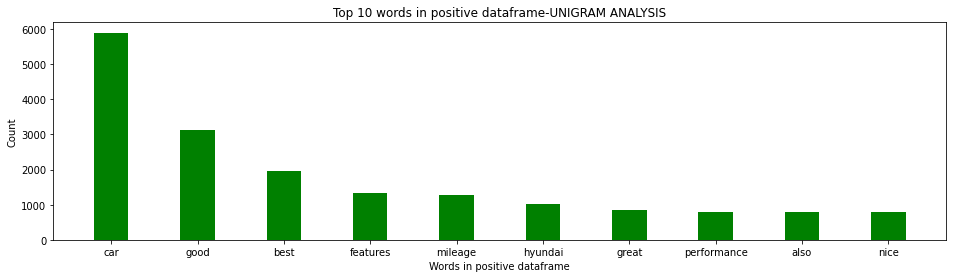

In [71]:
# plotting positive dataframe(unigram) 
plt.figure(1,figsize=(16,4))
plt.bar(pd1, pd2, color ='green', width = 0.4)
plt.xlabel("Words in positive dataframe")
plt.ylabel("Count")
plt.title("Top 10 words in positive dataframe-UNIGRAM ANALYSIS")
plt.show()

In [72]:
ned1=df_negative[0][:10]
ned2=df_negative[1][:10]

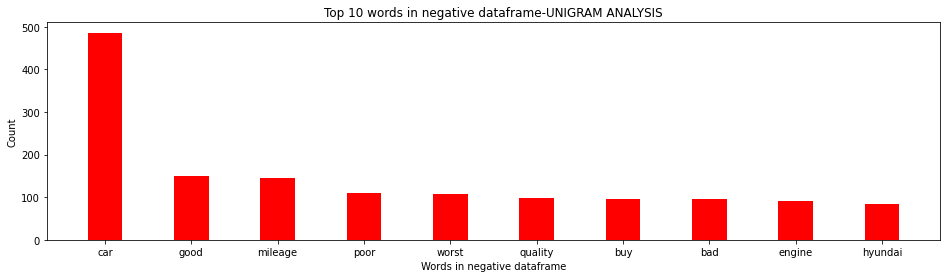

In [73]:
# plotting negative dataframe(unigram)
plt.figure(1,figsize=(16,4))
plt.bar(ned1, ned2, color ='red', width = 0.4)
plt.xlabel("Words in negative dataframe")
plt.ylabel("Count")
plt.title("Top 10 words in negative dataframe-UNIGRAM ANALYSIS")
plt.show()

In [74]:
nud1=df_neutral[0][:10]
nud2=df_neutral[1][:10]

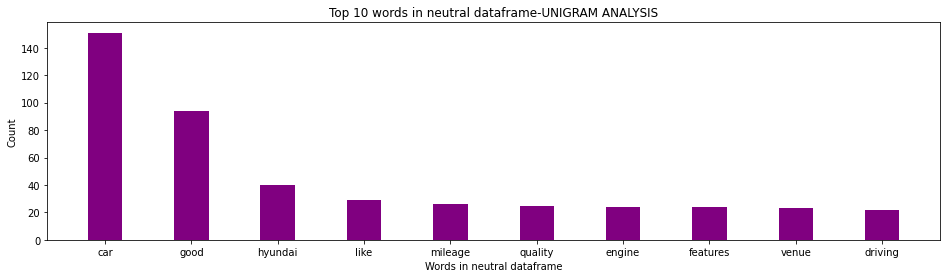

In [75]:
# plotting neutral dataframe(unigram)
plt.figure(1,figsize=(16,4))
plt.bar(nud1, nud2, color ='purple', width = 0.4)
plt.xlabel("Words in neutral dataframe")
plt.ylabel("Count")
plt.title("Top 10 words in neutral dataframe-UNIGRAM ANALYSIS")
plt.show()

- From the above diagrams we cannot conclude anything best on the words.So we will go for bigram analysis

## Bigram Analysis

We are repeating the same steps which we followed to analyze our data using unigrams except that we have passed parameter 2 while invoking the generate_N_grams() function. We also have changed the name of the dataframes here.

In [76]:
positiveValues2=defaultdict(int)
negativeValues2=defaultdict(int)
neutralValues2=defaultdict(int)

# get the count of every word in cleaned review column where sentiment="positive"
for text in review_pos[review_pos.sentiment_by_rating == 2].cleaned_review:
  for word in generate_N_grams(text, 2):
    positiveValues2[word]+=1
    
# get the count of every word in cleaned review column where sentiment="negative"      
for text in review_neg[review_neg.sentiment_by_rating == 0].cleaned_review:
  for word in generate_N_grams(text, 2):
    negativeValues2[word]+=1
    
# get the count of every word in cleaned review column where sentiment="neutral"    
for text in review_neu[review_neu.sentiment_by_rating == 1].cleaned_review:
  for word in generate_N_grams(text, 2):
    neutralValues2[word]+=1
    
df_positive2=pd.DataFrame(sorted(positiveValues2.items(),key=lambda x:x[1],reverse=True))
df_negative2=pd.DataFrame(sorted(negativeValues2.items(),key=lambda x:x[1],reverse=True))
df_neutral2=pd.DataFrame(sorted(neutralValues2.items(),key=lambda x:x[1],reverse=True))

Sentence after removing stopwords: ['headlights', 'car', 'work', 'like', 'nothing', 'mobile', 'flashlight', 'person', 'travels', 'lot', 'especially', 'night', 'please', 'dont', 'buy', 'car', 'least', 'dont', 'buy', 'top', 'end', 'sxo']
Sentence after removing stopwords: ['great', 'design', 'comfortable', 'car', 'decade']
Sentence after removing stopwords: ['really', 'happy', 'decision', 'buy', 'car', 'comfortable', 'stylish', 'fulfils', 'requirements', 'keeps', 'happy', 'road']
Sentence after removing stopwords: ['purchased', 'creta', 'around', 'year', 'ago', 'experience', 'car', 'quite', 'good', 'comfortable', 'gives', 'good', 'mileage', 'cheapest', 'maintenance']
Sentence after removing stopwords: ['good', 'quality', 'looks', 'good', 'better', 'performance', 'car', 'interior', 'better']
Sentence after removing stopwords: ['overall', 'excellent', 'variant', 'look', 'comfort', 'safety', 'point', 'view', 'good', 'ground', 'clearance', 'good']
Sentence after removing stopwords: ['using',

Sentence after removing stopwords: ['premium', 'product', 'decent', 'features', 'looks', 'nothing', 'excites', 'car', 'nothing', 'disappoints', 'well']
Sentence after removing stopwords: ['owning', 'presso', 'recently', 'week', 'ago', 'cng', 'performance', 'good', 'cng', 'better', 'celerio', 'pickup', 'good', 'ac', 'chilled', 'people', 'seat', 'comfortably', 'average', 'good', 'want', 'cng', 'car', 'buy', 'pressoread']
Sentence after removing stopwords: ['happy', 'smooth', 'silent', 'engine', 'purchase', 'happiness', 'lasts', 'long', 'car', 'finished', 'engine', 'making', 'loud', 'noise', 'like', 'nightmare', 'also', 'suspending', 'noisy', 'making', 'bump', 'noise', 'car', 'passed', 'speed', 'breaker', 'wheels', 'like', 'hitting']
Sentence after removing stopwords: ['good', 'diesel', 'model', 'doesnt', 'feel', 'underpowered', 'mileage', 'good', 'city', 'highways', 'service', 'cost', 'also', 'bad', 'good', 'experience', 'even', 'base', 'model', 'paint', 'quality', 'super', 'feel', 'like

Sentence after removing stopwords: ['poor', 'average', 'even', 'km', 'run', 'car', 'giving', 'kmliter', 'highway', 'company', 'claims', 'km', 'litre']
Sentence after removing stopwords: ['first', 'time', 'take', 'ride', 'overall', 'styling', 'good', 'acceleration', 'quite', 'good', 'mileage', 'bad', 'lack', 'power', 'comfort', 'decent', 'features', 'good', 'find', 'car']
Sentence after removing stopwords: ['jada', 'majedar', 'nahi', 'hai', 'par', 'thik', 'hai', 'hyundai', 'ke', 'mukabale', 'maruti', 'ki', 'gadi', 'sabse', 'acchi', 'hai', 'low', 'maintenance', 'low', 'price', 'badhiya', 'mileage']
Sentence after removing stopwords: ['dont', 'like', 'tiago', 'go', 'price', 'range', 'good', 'one', 'buying', 'first', 'time', 'good', 'one']
Sentence after removing stopwords: ['car', 'nice', 'looks', 'design', 'interior', 'material', 'style', 'comfortable', 'two', 'things', 'affect', 'overall', 'experience', 'power', 'mileage', 'extent', 'driven', 'kms', 'till', 'gives', 'kmltr', 'highway', 

Sentence after removing stopwords: ['writing', 'review', 'years', 'kwid', 'running', 'km', 'bought', 'commercial', 'purposes', 'doesnt', 'disappoint', 'every', 'car', 'drawbacks', 'kwid', 'considering', 'price', 'point', 'great', 'job', 'suv', 'like', 'appearance', 'led', 'drls', 'better', 'ground', 'clearance', 'boot', 'space', 'itread']
Sentence after removing stopwords: ['looks', 'good', 'engine', 'ok', 'performance', 'however', 'inside', 'build', 'quality', 'mark', 'features', 'provided', 'suits', 'types', 'uses', 'first', 'car', 'owner', 'feel', 'car', 'let', 'terms', 'features', 'performances', 'however', 'service', 'center', 'big', 'problem', 'renault', 'ownersread']
Sentence after removing stopwords: ['car', 'good', 'price', 'comfort', 'mileage', 'features', 'space', 'safety', 'features', 'pretty', 'decent', 'drive', 'quality', 'satisfactory', 'overall', 'good', 'carread']
Sentence after removing stopwords: ['car', 'good', 'good', 'hill', 'areas', 'travelling', 'body', 'height'

Sentence after removing stopwords: ['hardcore', 'customer', 'tata', 'grievance', 'mfg', 'given', 'normal', 'spare', 'wheel', 'smaller', 'size', 'alloy', 'wheel']
Sentence after removing stopwords: ['bought', 'nov', 'ran', 'close', 'km', 'months', 'average', 'mileage', 'mileage', 'im', 'satisfied', 'features', 'performance', 'car', 'maintenance', 'also', 'goodread']
Sentence after removing stopwords: ['comfortable', 'car', 'tyre', 'quality', 'awful', 'got', 'punctured', 'second', 'day', 'purchase', 'due', 'small', 'crack', 'side', 'incident', 'purchase', 'cause', 'cracks', 'reported', 'dealer', 'replacement', 'made', 'far', 'feeling', 'disappointed', 'worried', 'travel', 'long', 'distances', 'remaininread']
Sentence after removing stopwords: ['nice', 'car', 'nice', 'road', 'presence', 'best', 'safety', 'decent', 'mileage', 'suv', 'looks', 'awesome', 'like', 'car', 'much']
Sentence after removing stopwords: ['safety', 'acceleration', 'car', 'affordable', 'price', 'good', 'mileage', 'cars

Sentence after removing stopwords: ['overall', 'car', 'good', 'interior', 'door', 'damping', 'door', 'vibrates', 'music', 'played', 'quantity', 'plastic', 'used', 'goodas', 'deep', 'scratch', 'get', 'clearly', 'visible', 'happy', 'city', 'drive', 'mileage', 'around', 'kmpl', 'turbocharged', 'imt', 'variant', 'petrol']
Sentence after removing stopwords: ['mileage', 'issue', 'near', 'bangalore', 'traffic', 'ac', 'performance', 'superior', 'thanks', 'turbo', 'engine']
Sentence after removing stopwords: ['power', 'lag', 'turbo', 'annoying', 'times', 'city', 'especially', 'overtaking', 'highways', 'pickup', 'awesome']
Sentence after removing stopwords: ['seat', 'design', 'uncomfortable', 'driver', 'around', 'suffered', 'lot', 'good', 'short', 'tiny', 'build', 'people', 'even', 'shifting', 'seat', 'cant', 'help', 'cushions', 'nets', 'cant', 'help', 'dont', 'know', 'gonna', 'driving']
Sentence after removing stopwords: ['bought', 'car', 'mainly', 'fuel', 'efficiency', 'told', 'venue', 'car', 

Sentence after removing stopwords: ['car', 'awesome', 'feature', 'satisfied', 'rto', 'car', 'model', 'sx', 'cost', 'lakh', 'rto', 'thats', 'satisfied', 'car']
Sentence after removing stopwords: ['car', 'bold', 'car', 'ticked', 'maximum', 'features', 'seats', 'comfort', 'feel', 'big', 'panoramic', 'sunroof', 'awesome', 'instrument', 'cluster', 'neat', 'clean', 'paddle', 'shift', 'amazing', 'best', 'class', 'front', 'rear', 'headlamps', 'detailed', 'dashboard', 'soft', 'touch', 'overall', 'worth', 'every', 'penny']
Sentence after removing stopwords: ['important', 'trust', 'hyundai', 'india', 'low', 'maintenance', 'fully', 'loaded', 'car', 'convenience', 'function', 'car']
Sentence after removing stopwords: ['nice', 'car', 'good', 'performance', 'good', 'features', 'almost', 'good', 'like', 'car', 'two', 'creta', 'cars', 'house']
Sentence after removing stopwords: ['budget', 'car', 'anyone', 'pay', 'car', 'hyundai', 'car', 'maintenance', 'high', 'great', 'car']
Sentence after removing sto

Sentence after removing stopwords: ['best', 'car', 'segment', 'compared', 'cars']
Sentence after removing stopwords: ['ye', 'car', 'bahot', 'hi', 'smooth', 'comfortable', 'chalti', 'hai']
Sentence after removing stopwords: ['purchased', 'hyundai', 'santro', 'magna', 'bahraich', 'branch', 'balaji', 'motors', 'hardoi', 'test', 'drive', 'told', 'horn', 'weak', 'horn', 'provided', 'vehicle', 'horn', 'santro', 'magna', 'original', 'must', 'replaced', 'vehicles', 'time', 'delivery', 'told', 'fog', 'lamp', 'reached', 'hardoiit']
Sentence after removing stopwords: ['overall', 'good', 'performance', 'happy', 'vehicle', 'planning', 'buy', 'additional', 'vehicle', 'wish', 'keep', 'vehicle', 'since', 'performance', 'maintenance', 'costs', 'pocket', 'friendly', 'definitely', 'recommend', 'suggest', 'firsttime', 'vehicle', 'buyers', 'go', 'hyundai', 'product', 'really', 'satisfied']
Sentence after removing stopwords: ['superb', 'car', 'perfect', 'family', 'car', 'hyundai', 'santro', 'good', 'fuel', 

Sentence after removing stopwords: ['bought', 'mahindra', 'xuv', 'one', 'month', 'back', 'today', 'got', 'abs', 'indicator', 'light', 'one', 'month', 'technical', 'malfunction']
Sentence after removing stopwords: ['used', 'alto', 'cng', 'last', 'months', 'experience', 'best', 'mileage', 'performance', 'satisfactory', 'brakes', 'working', 'smoothly']
Sentence after removing stopwords: ['maruti', 'celerio', 'amt', 'zxi', 'variant', 'powerful', 'engine', 'steep', 'climb', 'starting', 'neutral', 'lags', 'power', 'jerks', 'getting', 'mileage', 'highway', 'full', 'ac', 'three', 'people', 'board', 'maintainance', 'good', 'maruti', 'vehicles', 'recommend', 'vehicle', 'lengthy', 'hefty', 'fellows', 'writing', 'reviewread']
Sentence after removing stopwords: ['great', 'car', 'ample', 'space', 'best', 'car', 'budget', 'segment', 'affordable', 'maintenance', 'mileage', 'looking', 'forward', 'cng', 'model', 'fuel', 'cost', 'rising', 'said', 'best', 'option', 'available', 'lakh', 'price', 'segment',

Sentence after removing stopwords: ['driving', 'vitara', 'brezza', 'top', 'end', 'since', 'looks', 'features', 'interiors', 'safety', 'rearview', 'mirror', 'reverse', 'camera', 'info', 'panel', 'good', 'mileage', 'around', 'city', 'drive', 'however', 'two', 'serious', 'issues', 'one', 'side', 'visibility', 'obstruction', 'due', 'apillar', 'side', 'mirror', 'important', 'flaw', 'suspread']
Sentence after removing stopwords: ['recently', 'buy', 'creta', 'petrol', 'automatic', 'dct', 'turbo', 'sxo', 'nice', 'amazing', 'driving', 'experience', 'everything', 'better', 'mileage', 'city', 'highway', 'maintenance', 'dont', 'know', 'reading', 'definitely', 'suggested', 'car']
Sentence after removing stopwords: ['omg', 'price', 'ex', 'variant', 'increased', 'comes', 'road', 'became', 'price', 'raised', 'rs', 'place', 'bad', 'company', 'hiked', 'variant', 'raised', 'variants', 'bad', 'company']
Sentence after removing stopwords: ['looks', 'disgusting����������������', 'interior', 'comfort', 'nice

Sentence after removing stopwords: ['poor', 'service', 'lohchab', 'mahindra', 'anytime', 'scorpio', 'shows', 'technical', 'issues', 'poor', 'service', 'lohchab', 'auto', 'rohtak', 'bahadurgarh']
Sentence after removing stopwords: ['xuv', 'oversized', 'hatchback', 'like', 'sporty', 'car', 'rear', 'ac', 'vents', 'days', 'offered', 'basic', 'hatchbacks', 'comfort', 'features', 'carries', 'overall', 'comfort', 'standard', 'car', 'heavily', 'overpriced', 'tata', 'nexon', 'hyundai', 'venue', 'real', 'suvs', 'compared', 'xuv']
Sentence after removing stopwords: ['good', 'car', 'excellent', 'mileage', 'comfort', 'long', 'drives', 'well']
Sentence after removing stopwords: ['low', 'maintenance', 'good', 'mileage', 'comfort', 'level', 'good', 'give', 'mileage', 'city', 'highway', 'looking', 'good']
Sentence after removing stopwords: ['good', 'car', 'lowerincome', 'groups', 'comfortable', 'comparison', 'alto', 'hyundai', 'eon', 'low', 'maintenance']
Sentence after removing stopwords: ['build', 'q

Sentence after removing stopwords: ['best', 'small', 'segment', 'good', 'pickup', 'ac', 'heater', 'average', 'lower', 'heavy', 'maintenance', 'charges', 'driven', 'years']
Sentence after removing stopwords: ['buying', 'experience', 'first', 'car', 'cannot', 'compare', 'buying', 'experience', 'quite', 'easy', 'simple', 'checked', 'car', 'liked', 'already', 'placed', 'order', 'online', 'delivery', 'time', 'staff', 'helpful', 'put', 'liters', 'petrol', 'believe', 'basic', 'norm', 'days', 'usual', 'photo']
Sentence after removing stopwords: ['month', 'driving', 'new', 'santro', 'sports', 'model', 'earlier', 'celerio', 'zxi', 'sold', 'yrs', 'santro', 'hyundai', 'spacious', 'celerio', 'within', 'budget', 'course', 'features', 'missing', 'sportz', 'model', 'compare', 'celerio', 'zxi', 'bit', 'cheaper', 'also', 'like', 'sturdiness', 'quietnes']
Sentence after removing stopwords: ['hyundai', 'santro', 'good', 'car', 'amazing', 'features', 'idle', 'fro', 'small', 'family', 'dream', 'car', 'every

Sentence after removing stopwords: ['im', 'owner', 'model', 'tdi', 'polo', 'dream', 'car', 'purchased', 'gwalior', 'samarth', 'vw', 'faced', 'first', 'problem', 'months', 'starter', 'mother', 'slipping', 'problem', 'raised', 'warranty', 'period', 'replaced', 'part', 'first', 'problem', 'solved', 'second', 'problem', 'started', 'jan', 'egr', 'valve', 'complaread']
Sentence after removing stopwords: ['world', 'hatchback', 'premier', 'proud', 'safest', 'best', 'performing', 'vehicle', 'driver', 'vehicle']
Sentence after removing stopwords: ['good', 'car', 'couldve', 'better', 'terms', 'size', 'also', 'features', 'missing', 'like', 'good', 'infotainment', 'system', 'front', 'bonnet', 'visible']
Sentence after removing stopwords: ['overall', 'hyundai', 'venue', 'good', 'loaded', 'many', 'features', 'hyundai', 'definitely', 'focus', 'engines', 'good', 'rivals', 'offer', 'think', 'ford', 'petrol', 'diesel', 'engine', 'good']
Sentence after removing stopwords: ['car', 'world', 'best', 'every',

Sentence after removing stopwords: ['superb', 'mileage', 'ultimate', 'performance', 'design', 'also', 'impressive', 'amazing', 'driving', 'experience', 'humongous', 'leg', 'space', 'highly', 'recommended']
Sentence after removing stopwords: ['hello', 'guys', 'proud', 'owner', 'santro', 'sportz', 'cng', 'long', 'term', 'review', 'ive', 'driven', 'car', 'car', 'performing', 'smooth', 'comfortable', 'smoother', 'segment', 'one', 'competitor', 'match', 'interior', 'quality', 'ease', 'driving', 'good', 'space', 'terms', 'rear', 'seat', 'peopl']
Sentence after removing stopwords: ['nice', 'budget', 'car', 'small', 'family', 'nice', 'use', 'compact', 'car', 'gives', 'awesome', 'mileage']
Sentence after removing stopwords: ['bought', 'car', 'dec', 'drove', 'kms', 'mileage', 'city', 'kmpl', 'highway', 'happy', 'useful', 'driving', 'modes', 'comfortable', 'seats', 'well', 'designed', 'sunroof', 'pain', 'areas', 'bad', 'finishing', 'hard', 'close', 'doors', 'door', 'indicator', 'quite', 'small', 

Sentence after removing stopwords: ['best', 'car', 'value', 'money', 'comfort', 'ride', 'awesome', 'rear', 'armrest', 'best', 'good', 'ride']
Sentence after removing stopwords: ['using', 'since', 'year', 'performance', 'style', 'awesome', 'maintenancefree', 'nice', 'safety', 'features', 'could', 'better', 'mileage', 'overall', 'satisfied', 'customer']
Sentence after removing stopwords: ['car', 'everything', 'middleclass', 'person', 'wants', 'really', 'bad', 'safety', 'rating', 'even', 'doesnt', 'like', 'fact', 'cng', 'cars', 'storage', 'space', 'luggage', 'expectations', 'hyundai', 'sooner', 'put', 'efforts', 'improve', 'deficiencies', 'needed', 'safety', 'majorly']
Sentence after removing stopwords: ['low', 'cost', 'maintenance', 'feels', 'good', 'driving', 'experience', 'gives', 'good', 'millage']
Sentence after removing stopwords: ['hyundai', 'santro', 'low', 'maintenance', 'mileage', 'good', 'driving', 'experience', 'awesome']
Sentence after removing stopwords: ['hyundai', 'santro'

Sentence after removing stopwords: ['best', 'car', 'family', 'full', 'safety', 'amazing', 'features', 'offered', 'suzuki']
Sentence after removing stopwords: ['good', 'car', 'need', 'improve', 'interiors', 'overall', 'car', 'value', 'money', 'needs', 'improve', 'safety']
Sentence after removing stopwords: ['comfort', 'good', 'engine', 'performance', 'ok', 'price', 'car', 'reasonable', 'ac', 'cooling', 'decent', 'rows', 'space', 'passengers', 'great', 'decent', 'boot', 'spaceread']
Sentence after removing stopwords: ['overall', 'good', 'car', 'compact', 'suv', 'segment', 'powerful', 'engine', 'good', 'mileage', 'city', 'kmpl', 'highway', 'kmpl']
Sentence after removing stopwords: ['best', 'car', 'cng', 'model', 'pickup', 'also', 'good', 'bought', 'company', 'fitted', 'cng', 'cars', 'remain', 'long', 'time', 'car', 'best']
Sentence after removing stopwords: ['great', 'family', 'car', 'features', 'require', 'including', 'decent', 'mileage', 'even', 'petrol', 'variant', 'tradeoffs', 'low',

Sentence after removing stopwords: ['hyundai', 'venues', 'elegant', 'look', 'performance', 'mark', 'suv', 'segment']
Sentence after removing stopwords: ['hyundai', 'venue', 'car', 'simply', 'superb', 'everything', 'car', 'like', 'everything', 'perfect', 'since', 'every', 'coin', 'two', 'sidesso', 'car', 'problems', 'firstly', 'going', 'pros', 'comfort', 'riding', 'quality', 'compact', 'good', 'city', 'wireless', 'charger', 'air', 'purifier', 'bluelink', 'technology']
Sentence after removing stopwords: ['smart', 'model', 'easy', 'drive', 'handling', 'good', 'interiors', 'good', 'mileage', 'easy', 'maintenance']
Sentence after removing stopwords: ['car', 'wow', 'dream', 'car', 'hyundai', 'done', 'great', 'job', 'car', 'vehicle', 'quality', 'driving', 'experience', 'pleasure', 'fantastic', 'love', 'car', 'offer', 'best', 'safety', 'best', 'style', 'best', 'service', 'modern', 'look', 'sports', 'utility', 'segment', 'best', 'price', 'bracket', 'vehicle', 'mileage', 'also', 'best', 'pocket'

Sentence after removing stopwords: ['taigun', 'shares', 'engines', 'elder', 'sibling', 'kushaq', 'besides', 'cosmetics', 'looks', 'however', 'interesting', 'see', 'extra', 'taigun', 'offers', 'kushaq', 'although', 'kushaq', 'going', 'give', 'tough', 'battle', 'rivals', 'hope', 'taigun', 'waiting', 'taigun', 'gonna', 'soon', 'lock', 'horns', 'kusread']
Sentence after removing stopwords: ['beautiful', 'stylish', 'car', 'good', 'ground', 'clearance', 'comfort', 'excellent', 'parts', 'quality', 'best']
Sentence after removing stopwords: ['hyundai', 'venue', 'car', 'good', 'interior', 'car', 'totally', 'black', 'hyundai', 'brand', 'needs', 'put', 'light', 'colors', 'dashboard', 'like', 'first', 'hyundai', 'model', 'please', 'hyundai', 'add', 'light', 'color', 'combination', 'interior', 'car']
Sentence after removing stopwords: ['good', 'overall', 'package', 'gives', 'sub', 'suv', 'run', 'money', 'cons', 'hard', 'suspension', 'petrol', 'dct', 'taste', 'bumps', 'gutters', 'road', 'inside', 'c

Sentence after removing stopwords: ['nice', 'car', 'low', 'budget', 'featurewise', 'car', 'performing', 'well', 'comfort', 'level', 'good']
Sentence after removing stopwords: ['tata', 'tiago', 'first', 'car', 'good', 'car', 'price', 'segment', 'purchase', 'car', 'feeling', 'much', 'better', 'good', 'comfort', 'interior', 'exterior', 'niceread']
Sentence after removing stopwords: ['performancewise', 'good', 'muv', 'segment', 'comfort', 'seat', 'good', 'service', 'network', 'proper', 'upgrade', 'vehicle', 'time', 'overall', 'good', 'family', 'car']
Sentence after removing stopwords: ['hyundai', 'always', 'makes', 'something', 'meaningful', 'practical', 'venue', 'one', 'best', 'cars', 'segment', 'good', 'features', 'well', 'designed', 'interior', 'quality', 'topnotch', 'little', 'claustrophobic', 'also', 'space', 'rear', 'passengers', 'comparison', 'rivals', 'less', 'love', 'drive', 'venue', 'perfect', 'car']
Sentence after removing stopwords: ['perfect', 'city', 'car', 'good', 'leg', 'ro

Sentence after removing stopwords: ['good', 'suv', 'car', 'segment', 'worth', 'price', 'range']
Sentence after removing stopwords: ['best', 'car', 'segment', 'features', 'amazing', 'looks', 'classic']
Sentence after removing stopwords: ['design', 'hyundai', 'venue', 'fabulous', 'petrol', 'engine', 'fantastic', 'segment', 'great', 'mileage', 'option', 'car', 'loaded', 'features', 'price', 'range']
Sentence after removing stopwords: ['hyundai', 'venue', 'providing', 'new', 'features', 'reliable', 'also', 'much', 'comfortable', 'driving']
Sentence after removing stopwords: ['amazing', 'car', 'budget', 'price', 'good', 'family', 'car', 'segment', 'good', 'job', 'hyundai', 'motors', 'keep']
Sentence after removing stopwords: ['hyundai', 'venue', 'loving', 'car', 'great', 'suv', 'hyundai', 'miss', 'minor', 'things', 'installed', 'car', 'otherwise', 'great']
Sentence after removing stopwords: ['took', 'test', 'drive', 'today', 'power', 'car', 'pleasing', 'definitely', 'quality', 'material', '

Sentence after removing stopwords: ['hyundai', 'creta', 'amazing', 'car', 'comfort', 'safe', 'styling', 'good', 'milage', 'cc', 'expected', 'car']
Sentence after removing stopwords: ['best', 'look', 'best', 'body', 'dimensions', 'best', 'features', 'offering', 'etc', 'always', 'car', 'year']
Sentence after removing stopwords: ['yet', 'buy', 'car', 'looking', 'features', 'good', 'specification', 'overall', 'good']
Sentence after removing stopwords: ['amazing', 'car', 'proud', 'feeling', 'become', 'owner', 'new', 'ultimate', 'creta', 'far', 'better', 'experience', 'cars', 'lakhs', 'creta', 'best', 'option', 'buy', 'compare', 'kia', 'seltos', 'creta', 'features', 'use', 'easy', 'understand', 'big', 'panoramic', 'sunroof', 'gives', 'great', 'inside', 'look']
Sentence after removing stopwords: ['nice', 'car', 'affordable', 'price', 'nice', 'design', 'even', 'said', 'friends', 'buy', 'car']
Sentence after removing stopwords: ['full', 'entertainment', 'comfortable', 'open', 'top', 'great', 's

Sentence after removing stopwords: ['lookswise', 'car', 'looks', 'great', 'vt', 'petrol', 'engine', 'perform', 'amazing', 'peppier', 'compared', 'hyundai', 'verna', 'petrol', 'features', 'car', 'good', 'android', 'auto', 'apple', 'car', 'play', 'thinking', 'buy', 'sedan', 'budget', 'petrol', 'engine', 'perfect', 'choice', 'youread']
Sentence after removing stopwords: ['allnew', 'honda', 'city', 'good', 'long', 'ride', 'unlike', 'bad', 'bad', 'road', 'city', 'better', 'roads', 'told', 'buy', 'honda', 'city', 'roads', 'bad', 'need', 'prefer', 'suv', 'car', 'efficient', 'enough', 'space', 'car', 'gives', 'large', 'space', 'back', 'car', 'looks', 'attractive', 'car', 'carries', 'five', 'membersread']
Sentence after removing stopwords: ['diesel', 'model', 'driven', 'around', 'km', 'getting', 'average', 'really', 'satisfied', 'car']
Sentence after removing stopwords: ['good', 'car', 'aspects', 'good', 'mileage', 'features', 'good', 'comfort', 'amazing', 'good', 'legroom', 'spacious', 'car', 

Sentence after removing stopwords: ['visited', 'car', 'showroom', 'looks', 'bigger', 'appears', 'look', 'feel', 'interiors', 'premium', 'three', 'slim', 'adults', 'easily', 'accommodated', 'rear', 'seat', 'otherwise', 'two', 'comfortably', 'boot', 'space', 'big', 'two', 'mediumsized', 'bags', 'plus', 'small', 'handy', 'bags', 'overall', 'nice', 'car', 'price', 'ranges']
Sentence after removing stopwords: ['excellent', 'car', 'mileage', 'amazing', 'features', 'impressive', 'looks', 'classic']
Sentence after removing stopwords: ['best', 'car', 'segment', 'worth', 'purchase', 'features', 'looks', 'impressive']
Sentence after removing stopwords: ['good', 'car', 'looks', 'attractive', 'however', 'perfect', 'suv', 'car']
Sentence after removing stopwords: ['nice', 'family', 'car', 'good', 'looks', 'awesome', 'features']
Sentence after removing stopwords: ['hyundai', 'venue', 'great', 'car', 'good', 'engine', 'looks', 'latest', 'features', 'hyundai', 'provide', 'navigation', 'music', 'control

Sentence after removing stopwords: ['hyundai', 'venue', 'complete', 'package', 'delivering', 'features', 'price', 'range', 'drive', 'quality', 'also', 'decent', 'sx', 'variant', 'hyundai', 'venue', 'surely', 'value', 'money', 'although', 'disappointed', 'fact', 'bluelink', 'system', 'available', 'top', 'end', 'sx', 'variant', 'could', 'introduced', 'bluelink', 'sx', 'vari']
Sentence after removing stopwords: ['car', 'almost', 'every', 'feature', 'car', 'range', 'internet', 'good', 'future', 'automobile', 'exterior', 'also', 'amazing', 'suv', 'wireless', 'charging', 'feature', 'like', 'cherry', 'cake', 'vibrant', 'interior', 'topnotch', 'big', 'makes', 'comforta']
Sentence after removing stopwords: ['purchased', 'hyundai', 'venue', 'sxo', 'diesel', 'sep', 'driven', 'kms', 'one', 'best', 'compact', 'suv', 'cars', 'market', 'used', 'get', 'average', 'kml', 'drive', 'speed', 'kml', 'drive', 'speed', 'driven', 'max', 'speed', 'kanyakumari', 'highway', 'smooth']
Sentence after removing stopw

Sentence after removing stopwords: ['sharing', 'feedback', 'hyundai', 'venue', 'months', 'use', 'hyundai', 'venue', 'automatic', 'version', 'petrol', 'car', 'many', 'features', 'like', 'good', 'external', 'looks', 'better', 'average', 'interiors', 'excellent', 'handleability', 'good', 'pick', 'good', 'instrumentation', 'fronts', 'infotainment', 'system', 'good', 'suspension', 'good']
Sentence after removing stopwords: ['looks', 'features', 'make', 'best', 'car', 'customers']
Sentence after removing stopwords: ['car', 'best', 'urban', 'buyers', 'right', 'height', 'ground', 'clearance', 'indian', 'roads', 'frills', 'lac', 'fully', 'loaded', 'lacs', 'car', 'put', 'pressure', 'hatchbacks', 'likes', 'dezire', 'amaze', 'etc', 'blue', 'link', 'adds', 'already', 'segmentfirst', 'features', 'like', 'wireless', 'charging', 'androidapple', 'car', 'play', 'etc']
Sentence after removing stopwords: ['bought', 'new', 'hyundai', 'venue', 'sx', 'turbo', 'optional', 'amazing', 'drive', 'experience', 'tu

Sentence after removing stopwords: ['missing', 'problem', 'car', 'day', 'one', 'cng', 'installed', 'company', 'malwa', 'nissan', 'panipat', 'cheated', 'installing', 'cng', 'high', 'cost', 'one', 'able', 'resolve', 'missing', 'issue', 'car', 'bad', 'experienceread']
Sentence after removing stopwords: ['nice', 'car', 'features', 'required', 'compact', 'safe', 'within', 'budget', 'small', 'family', 'mustbuy', 'sure']
Sentence after removing stopwords: ['nice', 'hatchback', 'good', 'model', 'easy', 'drive', 'looking', 'budget', 'car', 'go']
Sentence after removing stopwords: ['surely', 'good', 'contender', 'segment', 'got', 'amt', 'version', 'jan', 'absolutely', 'satisfied', 'price', 'vs', 'features', 'constant', 'kwid', 'costs', 'lakhs', 'expensive', 'almost', 'upgrades', 'nothing', 'significantread']
Sentence after removing stopwords: ['best', 'segment', 'superb', 'suspension', 'comfort', 'build', 'quality', 'great', 'make', 'improvement', 'dashboard', 'price', 'high', 'gear', 'shifting'

Sentence after removing stopwords: ['good', 'vehicle', 'good', 'mileage', 'basic', 'safety', 'features', 'better', 'mini', 'hatchbacks']
Sentence after removing stopwords: ['practically', 'good', 'car', 'interior', 'space', 'technologies', 'comfort', 'really', 'great', 'car', 'middleclass', 'families', 'using', 'amt', 'topend', 'model', 'worried', 'mileage', 'city', 'getting', 'around', 'highways', 'pathetic', 'city', 'around', 'kmpl', 'luckily', 'drove', 'vehicle', 'highways', 'give', 'read']
Sentence after removing stopwords: ['good', 'car', 'price', 'range', 'cc', 'engine', 'gives', 'even', 'cc', 'engine', 'easily', 'gives', 'magnite', 'xv', 'premium', 'turbo', 'owner', 'buying', 'week', 'feels', 'good', 'adrenaline', 'rush', 'new', 'car', 'long', 'run', 'feeling', 'power', 'car', 'owner', 'safety', 'security', 'features', 'read']
Sentence after removing stopwords: ['good', 'look', 'bad', 'mileage', 'car', 'comfortable', 'good', 'tech', 'inside', 'street', 'feeling', 'good', 'rear',

Sentence after removing stopwords: ['car', 'increase', 'nissan', 'indian', 'market', 'waiting', 'launch', 'best', 'car', 'buy', 'price', 'range']
Sentence after removing stopwords: ['stylish', 'car', 'better', 'features', 'price', 'reasonable', 'reach', 'market', 'stage', 'competition']
Sentence after removing stopwords: ['nissan', 'engine', 'best', 'class', 'lets', 'try', 'new', 'magnetic', 'road', 'performance', 'mileage', 'check', 'worth']
Sentence after removing stopwords: ['car', 'amazing', 'price', 'segment', 'produces', 'great', 'power', 'comfort', 'car', 'also', 'great']
Sentence after removing stopwords: ['average', 'paper', 'hope', 'increase', 'first', 'service', 'car', 'value', 'money']
Sentence after removing stopwords: ['suv', 'waiting', 'surely', 'nissan', 'engineers', 'designers', 'done', 'great', 'job', 'mileage', 'surely', 'competitive', 'advantage', 'suv', 'road', 'clearance', 'suitable', 'indian', 'road', 'condition', 'waiting', 'allnew', 'nissan', 'magnificent', 'ma

Sentence after removing stopwords: ['good', 'car', 'huge', 'maintenance', 'superb', 'looks', 'volkswagen', 'reduced', 'maintenance', 'costs', 'would', 'best', 'selling', 'car', 'indian', 'market']
Sentence after removing stopwords: ['good', 'teenage', 'drivers', 'best', 'budget', 'allrounder', 'seaters', 'flaw', 'felt', 'missing', 'sports', 'mode', 'amt']
Sentence after removing stopwords: ['everything', 'fine', 'side', 'engine', 'must', 'ac', 'powerful', 'quite', 'cooling', 'experience']
Sentence after removing stopwords: ['superb', 'car', 'exceeded', 'expectations', 'far', 'amt', 'version', 'takes', 'little', 'get', 'used', 'complaints', 'nothing', 'comes', 'close', 'price', 'pointread']
Sentence after removing stopwords: ['perfect', 'family', 'car', 'adequate', 'space', 'everything', 'excellent', 'design', 'good', 'mileage', 'overall', 'winner', 'middleclass', 'hearts']
Sentence after removing stopwords: ['recently', 'purchased', 'renault', 'tribber', 'rxz', 'model', 'want', 'clarif

Sentence after removing stopwords: ['lot', 'research', 'midsize', 'suv', 'segment', 'took', 'kicks', 'turbo', 'xv', 'june', 'pros', 'punchy', 'engine', 'larger', 'dimensions', 'every', 'way', 'unique', 'looks', 'highway', 'stability', 'heavy', 'vehicle', 'alloy', 'cons', 'great', 'knickknack', 'list', 'steering', 'heavy', 'rivals', 'offering', 'electronic', 'economy', 'par', 'overall', 'went', 'fread']
Sentence after removing stopwords: ['nissan', 'back', 'kicks', 'best', 'class', 'features', 'good', 'looking', 'exterior', 'interior', 'feels', 'premium', 'terms', 'practicality', 'usual', 'ergonomic', 'lots', 'issues', 'features', 'outstanding', 'side', 'special', 'features', 'missing', 'direct', 'rivals', 'offers', 'terms', 'handling', 'also', 'lot', 'work', 'still', 'pending', 'dread']
Sentence after removing stopwords: ['nissan', 'kicks', 'excellent', 'specifications', 'brand', 'offers', 'customers', 'drawback', 'must', 'sunroof', 'vehicle']
Sentence after removing stopwords: ['good'

Sentence after removing stopwords: ['best', 'car', 'value', 'money', 'tata', 'tiago', 'car', 'features', 'safety', 'good', 'like', 'car']
Sentence after removing stopwords: ['according', 'price', 'best', 'class', 'build', 'quality', 'priority', 'safety', 'best', 'choice', 'mileage', 'good', 'city', 'highway', 'good', 'pickup', 'powerful', 'engine', 'overall', 'according', 'price', 'give', 'starread']
Sentence after removing stopwords: ['nice', 'car', 'midlevel', 'segment', 'budget', 'safety', 'modern', 'features', 'mileage', 'good', 'traffic', 'road']
Sentence after removing stopwords: ['good', 'car', 'segment', 'best', 'value', 'money', 'good', 'average', 'ac', 'nonac', 'happy', 'buy', 'car']
Sentence after removing stopwords: ['good', 'car', 'lac', 'swift', 'better', 'best', 'car', 'tata', 'tiago', 'xt', 'valuable']
Sentence after removing stopwords: ['awesome', 'family', 'car', 'design', 'brilliant', 'exterior', 'attractive', 'bought', 'vx', 'seater', 'grey', 'interior', 'nice', 'ri

Sentence after removing stopwords: ['powerplay', 'car', 'good', 'safety', 'compact', 'easy', 'control', 'engine', 'like', 'boost']
Sentence after removing stopwords: ['recently', 'bought', 'beauty', 'tsi', 'form', 'already', 'clocked', 'kms', 'one', 'word', 'explain', 'experience', 'till', 'astonished', 'talking', 'mileage', 'kmpl', 'city', 'highway', 'would', 'request', 'indians', 'grow', 'stop', 'asking', 'making', 'dealbreaker', 'ask', 'worth', 'life', 'nread']
Sentence after removing stopwords: ['please', 'launch', 'diesel', 'variant', 'want', 'buy', 'car', 'disappointed', 'petrol', 'variants', 'alltime', 'favorite', 'company', 'volkswagen', 'service', 'cost', 'high', 'ok', 'get', 'diesel', 'variantread']
Sentence after removing stopwords: ['car', 'luxury', 'car', 'expensive', 'maintain', 'requires', 'approximately', 'rs', 'per', 'year', 'maintenance', 'top', 'might', 'require', 'replacements', 'parts', 'fuel', 'injectors', 'pressure', 'pump', 'fuel', 'rail', 'etc', 'together', 'co

Sentence after removing stopwords: ['good', 'vehicle', 'prefer', 'safety', 'performance', 'also', 'materials', 'used', 'vehicle', 'agrade']
Sentence after removing stopwords: ['tata', 'best', 'class', 'safety', 'features', 'build', 'quality', 'sitting', 'inside', 'feel', 'safe', 'traveling', 'high', 'speeds', 'also']
Sentence after removing stopwords: ['good', 'car', 'happy', 'car', 'showroom', 'experience', 'good', 'stylish', 'car', 'price', 'segment']
Sentence after removing stopwords: ['would', 'rate', 'car', 'excellent', 'safety', 'feature', 'see', 'brezza', 'better', 'engine', 'pickup', 'would', 'still', 'prefer', 'go', 'nexon', 'anytime', 'safety', 'something', 'prefer', 'read']
Sentence after removing stopwords: ['love', 'car', 'every', 'perspective', 'must', 'best', 'car', 'price', 'segment']
Sentence after removing stopwords: ['beautiful', 'car', 'power', 'safety', 'offroad', 'driving', 'easy', 'balancing', 'road', 'powerful', 'styling', 'look', 'nexon', 'mean', 'next', 'one']

Sentence after removing stopwords: ['would', 'say', 'best', 'segment', 'tried', 'many', 'cars', 'segment', 'comfort', 'ride', 'quality', 'performance', 'quite', 'impressive', 'car', 'may', 'feel', 'fitment', 'issues', 'compared', 'hyundai', 'kia', 'overall', 'well', 'designed', 'road', 'presence', 'good', 'drive', 'modes', 'work', 'well', 'feel', 'difference', 'overaread']
Sentence after removing stopwords: ['xz', 'best', 'lakh', 'price', 'segment', 'fit', 'finish', 'could', 'improved', 'thats', 'issue', 'otherwise', 'sports', 'version', 'power', 'good', 'option', 'hope', 'tata', 'brings', 'oneread']
Sentence after removing stopwords: ['great', 'car', 'great', 'experience', 'low', 'mileage', 'city', 'long', 'rides', 'overall', 'good', 'car']
Sentence after removing stopwords: ['every', 'penny', 'worth', 'car', 'comfort', 'par', 'beat', 'suv', 'price', 'mustbuy']
Sentence after removing stopwords: ['cheapest', 'car', 'segment', 'compact', 'suv', 'even', 'second', 'top', 'variant', 'dies

Sentence after removing stopwords: ['experience', 'creta', 'wonderful', 'car', 'packed', 'features', 'like', 'rooftop', 'great', 'infotainment', 'system']
Sentence after removing stopwords: ['awesome', 'class', 'vehicle', 'issues', 'vehicle', 'exterior', 'interior', 'superb', 'awesome', 'sunroof']
Sentence after removing stopwords: ['would', 'recommend', 'buy', 'hyundai', 'creta', 'mileage', 'kmpl', 'quite', 'good', 'also', 'potent', 'refined', 'engine', 'options', 'hyundai', 'creta', 'continues', 'powerful', 'suv', 'segment', 'creta', 'competing', 'kia', 'seltos', 'hyundai', 'verna', 'hyundai', 'venue', 'tata', 'harrier', 'maruti', 'suzuki', 'vitara', 'brezza', 'mahindra']
Sentence after removing stopwords: ['comfortable', 'good', 'look', 'outside', 'great', 'mileage']
Sentence after removing stopwords: ['car', 'dream', 'everyone', 'loves', 'cars', 'want', 'feel', 'royal', 'life', 'waste', 'time', 'go', 'ride', 'creta']
Sentence after removing stopwords: ['hyundai', 'creta', 'elegant'

Sentence after removing stopwords: ['car', 'good', 'looks']
Sentence after removing stopwords: ['luxury', 'feeling', 'budget', 'drive', 'km', 'single', 'seating', 'nonstop', 'didnt', 'feel', 'tired', 'ness', 'good', 'handling', 'good', 'safety', 'mileage', 'best', 'riding', 'quality', 'bestread']
Sentence after removing stopwords: ['super', 'build', 'quality', 'compare', 'features', 'new', 'arrivals', 'car', 'enthusiast']
Sentence after removing stopwords: ['aspire', 'titanium', 'plus', 'rear', 'armrest', 'interior', 'side', 'handles', 'missing', 'compared', 'older', 'one', 'aspire', 'trend', 'missing', 'two', 'thingsread']
Sentence after removing stopwords: ['ford', 'aspires', 'car', 'crossed', 'km', 'bought', 'car', 'end', 'drive', 'city', 'highway', 'average', 'shows', 'km', 'handling', 'awesome', 'brake', 'awesome', 'never', 'received', 'bad', 'signs', 'car', 'looks', 'decent', 'mark', 'maintainance', 'cheaper', 'compared', 'category', 'cars', 'driving', 'car', 'get', 'read']
Sente

Sentence after removing stopwords: ['love', 'car', 'mahindra', 'scorpio', 'adventure', 'love', 'acceleration', 'suspension', 'aerodynamics', 'think', 'best', 'suv', 'middleclass', 'family']
Sentence after removing stopwords: ['mahindra', 'scorpio', 'passion', 'enjoyment', 'draws', 'sagittarius', 'lifts', 'depths', 'broadens', 'experience', 'provides', 'new', 'opportunities', 'improving', 'character', 'liferead']
Sentence after removing stopwords: ['exclusive', 'car', 'grateful', 'seat', 'good', 'head', 'light', 'also', 'good', 'overall', 'seat', 'car']
Sentence after removing stopwords: ['tough', 'look', 'exterior', 'well', 'interior', 'since', 'scorpio', 'knows', 'toughness', 'power', 'also', 'worthy', 'good', 'offroader', 'budget', 'apart', 'service', 'scorpio', 'affordable', 'also', 'negative', 'points', 'safety', 'good', 'think', 'showed', 'ncap', 'test', 'theread']
Sentence after removing stopwords: ['tough', 'look', 'exterior', 'well', 'interior', 'since', 'scorpio', 'knows', 'to

Sentence after removing stopwords: ['creta', 'best', 'product', 'happy', 'cretas', 'build', 'quality', 'comfort', 'good', 'like', 'space', 'ground', 'clearance']
Sentence after removing stopwords: ['driving', 'car', 'last', 'months', 'highly', 'satisfied', 'overall', 'performance', 'smooth', 'driving', 'handling', 'good', 'take', 'car', 'highway', 'good', 'car', 'terms', 'power', 'mileage', 'comfort', 'car', 'cost', 'equipped', 'safety', 'features', 'like']
Sentence after removing stopwords: ['bought', 'car', 'january', 'awesome', 'car', 'makes', 'great', 'stylish', 'appearance', 'many', 'features', 'along', 'turbocharged', 'diesel', 'engine', 'diesel', 'automatic', 'variant', 'clutch', 'smooth', 'go', 'without', 'losing', 'single', 'minute', 'panoramic', 'sunroof', 'awesome', 'speed', 'high', 'even', 'hig']
Sentence after removing stopwords: ['one', 'best', 'cars', 'hyundai', 'interior', 'excellent', 'drive', 'really', 'comfortable', 'wanna', 'thank', 'hyundai', 'manufacturing', 'beas

Sentence after removing stopwords: ['purchased', 'ecosport', 'titanium', 'petrol', 'wonderful', 'car', 'awesome', 'feel', 'experience', 'car', 'driverchoice', 'car', 'build', 'quality', 'goodread']
Sentence after removing stopwords: ['wellversed', 'solid', 'structure', 'sufficient', 'compact', 'room', 'space', 'good', 'mileage', 'cities', 'well', 'highway', 'maintenance', 'service', 'costs', 'affordable', 'comfortable', 'single', 'drive', 'wide', 'infotainment', 'system', 'using', 'titanium', 'big', 'negative', 'thing', 'rear', 'seat', 'folding', 'floor', 'flat', 'somehow', 'inclined', 'read']
Sentence after removing stopwords: ['amazing', 'km', 'repairs', 'minimal', 'maintenance', 'excellent', 'condition', 'comfort', 'u', 'r', 'used', 'ford', 'like', 'car']
Sentence after removing stopwords: ['ultimate', 'car', 'long', 'drive', 'great', 'offroading', 'highways', 'comfortable', 'hatchback', 'ever']
Sentence after removing stopwords: ['previous', 'hatchbacks', 'jazz', 'found', 'much', '

Sentence after removing stopwords: ['luxurious', 'vehicle', 'drive', 'fact', 'features', 'provided', 'base', 'model', 'sufficient', 'even', 'gives', 'much', 'better', 'mileage']
Sentence after removing stopwords: ['premium', 'hatchback', 'looks', 'like', 'sporty', 'model', 'performance', 'good', 'driving', 'smooth', 'sound', 'system', 'quality', 'excellent', 'backside', 'sufficient', 'space', 'interior', 'looks', 'features', 'good']
Sentence after removing stopwords: ['awesome', 'feature', 'build', 'quality', 'superb', 'new', 'make', 'stylish', 'every', 'buyer', 'many', 'thanks', 'hyundai']
Sentence after removing stopwords: ['best', 'hatchback', 'india', 'stylish', 'car', 'sunroof', 'best', 'part', 'along', 'turbo', 'engine', 'gives', 'amazing', 'power']
Sentence after removing stopwords: ['best', 'comfort', 'smooth', 'drive', 'good', 'music', 'system', 'feels', 'good', 'much', 'better', 'altroz', 'baleno']
Sentence after removing stopwords: ['great', 'car', 'fully', 'loaded', 'featur

Sentence after removing stopwords: ['honda', 'city', 'best', 'sedan', 'car', 'segmentno', 'car', 'competet', 'honda', 'city', 'value', 'money', 'carbest', 'mileageand', 'maintenance', 'freetension', 'free', 'cari', 'thankfull', 'make', 'journey', 'memorable', 'comfortablei', 'thankfull', 'honda', 'make', 'ultimate', 'car', 'unique', 'features', 'sunroofthank', 'youread']
Sentence after removing stopwords: ['one', 'best', 'petrol', 'engines', 'world', 'honda', 'city', 'petrol', 'engine', 'refined', 'sporty', 'engine', 'one', 'best', 'handling', 'cars', 'segments', 'stable', 'high', 'way', 'interior', 'quality', 'also', 'nice', 'best', 'infotainment', 'system', 'segment', 'spacious', 'car', 'people', 'caread']
Sentence after removing stopwords: ['great', 'car', 'ultimate', 'looks', 'unbelievable', 'performance', 'comfort', 'drls', 'sharkfin', 'antennas', 'impressive', 'much', 'comfortable', 'family', 'car']
Sentence after removing stopwords: ['car', 'decent', 'price', 'many', 'features',

Sentence after removing stopwords: ['excellent', 'performance', 'according', 'price', 'one', 'time', 'full', 'cng', 'go', 'next', 'days']
Sentence after removing stopwords: ['mileage', 'best', 'features', 'also', 'good', 'didnt', 'expect', 'took', 'giving', 'rear', 'camera']
Sentence after removing stopwords: ['bought', 'zxi', 'plus', 'dec', 'good', 'car', 'smoothly', 'drive', 'noise', 'like', 'cars', 'great', 'performance', 'comparison', 'celerios', 'new', 'model', 'nice', 'lookingread']
Sentence after removing stopwords: ['best', 'class', 'comfortable', 'sedan', 'superb', 'design', 'good', 'mileage', 'even', 'good', 'price', 'overall', 'fabulous', 'car']
Sentence after removing stopwords: ['good', 'vehicle', 'gives', 'city', 'drive', 'highways', 'cruise', 'option']
Sentence after removing stopwords: ['kms', 'years', 'journey', 'travelled', 'ghats', 'highways', 'cities', 'rural', 'areas', 'never', 'faced', 'single', 'breakdown', 'space', 'inside', 'car', 'provides', 'great', 'comfort'

Sentence after removing stopwords: ['got', 'car', 'top', 'variant', 'automatic', 'model', 'july', 'driven', 'km', 'far', 'mainly', 'around', 'city', 'car', 'thickness', 'marutis', 'cousin', 'pros', 'great', 'car', 'great', 'feel', 'ease', 'handling', 'smooth', 'driving', 'good', 'road', 'view', 'driven', 'us', 'years', 'car', 'isread']
Sentence after removing stopwords: ['honestly', 'awesome', 'car', 'functions', 'well', 'also', 'comfortable', 'say', 'satisfied']
Sentence after removing stopwords: ['best', 'car', 'comfortable', 'mode', 'nothing', 'complain', 'average', 'bit', 'lagging']
Sentence after removing stopwords: ['car', 'segment', 'beat', 'polo', 'tsi', 'performance', 'refined', 'engine', 'ever', 'love', 'driving', 'love', 'car', 'neverending']
Sentence after removing stopwords: ['best', 'mid', 'suv', 'fun', 'drive', 'best', 'longrange', 'good', 'city', 'driving', 'camera', 'miss', 'rest', 'good', 'little', 'costly', 'build', 'quality', 'incredible', 'way', 'german', 'car', 'w

Sentence after removing stopwords: ['van', 'popular', 'work', 'mil', 'edge', 'look', 'stylish', 'powerfull', 'vehicles', 'useful', 'village', 'work', 'popular', 'peoples', 'driving', 'thing', 'performance', 'good', 'something', 'maintenance', 'small', 'chargeread']
Sentence after removing stopwords: ['using', 'yearsthe', 'best', 'among', 'segment', 'really', 'quiet', 'car', 'ultimate', 'comfort', 'driving', 'travelling', 'im', 'sure', 'mahindra', 'promoting', 'much', 'definitely', 'competitor', 'innova', 'almost', 'everyone', 'travelling', 'surprised', 'quality', 'comfort', 'car', 'provides', 'planniread']
Sentence after removing stopwords: ['month', 'since', 'brought', 'home', 'car', 'feeling', 'never', 'expected', 'silent', 'smooth', 'spacious', 'cabin', 'house', 'mahindra', 'amazing', 'comfort', 'super', 'easy', 'drive', 'city', 'traffic', 'plus', 'came', 'highest', 'ncap', 'safety', 'ratings', 'mpv', 'segment', 'whether', 'buy', 'personal', 'commerciread']
Sentence after removing s

Sentence after removing stopwords: ['excellent', 'car', 'segment', 'smooth', 'best', 'power', 'creta', 'performance', 'good', 'features', 'available', 'car']
Sentence after removing stopwords: ['proud', 'owner', 'creta', 'manufactured', 'vehicle', 'good', 'driving', 'experience', 'crdi', 'engines', 'pleasure', 'drive', 'one', 'small', 'disappointment', 'hyundai', 'removed', 'features', 'like', 'tpms', 'cooled', 'glove', 'box', 'e', 'variant', 'diesel', 'without', 'announcement', 'e', 'model', 'enthusiasts', 'please', 'try', 'upgrade', 'ex', 'budget', 'ok']
Sentence after removing stopwords: ['car', 'much', 'faster', 'good', 'looking', 'also', 'design', 'looks', 'like', 'marvels']
Sentence after removing stopwords: ['features', 'safety', 'awesome', 'mileage', 'average', 'service', 'good', 'needed', 'improvement', 'mileage']
Sentence after removing stopwords: ['km', 'joyful', 'ride', 'first', 'week', 'enjoyed', 'family', 'gives', 'confidence', 'driving', 'love', 'drive']
Sentence after r

Sentence after removing stopwords: ['driving', 'sx', 'model', 'venue', 'last', 'two', 'years', 'overall', 'performance', 'good', 'worst', 'part', 'gps', 'system', 'working', 'android', 'auto', 'pathetic', 'spending', 'lakh', 'car']
Sentence after removing stopwords: ['good', 'car', 'one', 'best', 'segment', 'good', 'build', 'quality', 'comfortable', 'long', 'drive', 'good', 'performance', 'gives', 'mileage', 'highways', 'easy', 'drive', 'good', 'road', 'presence', 'maintenance', 'high', 'first', 'second', 'service', 'cost', 'high', 'acceptable', 'overall']
Sentence after removing stopwords: ['good', 'car', 'family', 'amazing', 'performance']
Sentence after removing stopwords: ['car', 'bombastic', 'really', 'looks', 'nice', 'bought', 'hyundai', 'venue', 'nice', 'car', 'mileage', 'good', 'otherwise', 'loved', 'car']
Sentence after removing stopwords: ['absolutely', 'fluid', 'drive', 'great', 'comfort', 'styling', 'little', 'delay', 'start', 'automatic', 'affect', 'overall', 'performance'

Sentence after removing stopwords: ['superb', 'vehicle', 'mahindra', 'power', 'feature', 'vehicle', 'excellent', 'mileage', 'comfort']
Sentence after removing stopwords: ['car', 'offers', 'mileage', 'rave', 'engine', 'family', 'members', 'average', 'space', 'one', 'negative', 'points', 'boot', 'spaceread']
Sentence after removing stopwords: ['one', 'favorite', 'cars', 'everything', 'nice', 'mahindra', 'thar', 'car', 'beat', 'range', 'especially', 'case', 'offroading', 'read']
Sentence after removing stopwords: ['got', 'car', 'november', 'far', 'driven', 'km', 'far', 'best', 'mileage', 'got', 'average', 'would', 'say', 'highways', 'city', 'far', 'extremely', 'satisfied', 'car', 'spacious', 'good', 'family', 'even', 'people', 'sit', 'back', 'seat', 'hread']
Sentence after removing stopwords: ['bought', 'beast', 'last', 'month', 'done', 'service', 'average', 'mileage', 'service', 'im', 'getting', 'around', 'city', 'highway', 'copassengers', 'sure', 'best', 'class', 'ride', 'seating', 'com

Sentence after removing stopwords: ['good', 'review', 'comfort', 'fashion', 'designer', 'millage', 'safety', 'looking', 'smart', 'upgrade', 'ground', 'clearance']
Sentence after removing stopwords: ['nice', 'styling', 'decent', 'mileage', 'max', 'mileage', 'till', 'driven', 'days', 'automatic', 'gearbox', 'smooth', 'bit', 'late', 'respond']
Sentence after removing stopwords: ['driving', 'last', 'months', 'got', 'decent', 'mileage', 'best', 'safety', 'comfort', 'got', 'good', 'control', 'sharp', 'curves', 'high', 'speed', 'superb', 'music', 'system', 'silent', 'cabin', 'feeler', 'vibrationread']
Sentence after removing stopwords: ['sixmonthold', 'car', 'driven', 'km', 'due', 'lockdown', 'overall', 'mileage', 'satisfying', 'performance', 'comfortable', 'members', 'ï¿½ï¿½ï¿½']
Sentence after removing stopwords: ['first', 'car', 'nice', 'experience', 'drive', 'safest', 'car', 'better', 'mileage', 'satisfied', 'tata', 'tiago']
Sentence after removing stopwords: ['purchased', 'tigor', 'jan',

Sentence after removing stopwords: ['luxurious', 'suv', 'mahindra', 'alturas', 'looks', 'amazing', 'bigger', 'suv', 'price', 'range', 'newly', 'designed', 'tail', 'light', 'looking', 'impressive', 'interior', 'car', 'luxurious', 'build', 'quality', 'car', 'awesome', 'handling', 'good', 'even', 'driving', 'high', 'speed', 'bad', 'roads', 'seating', 'posture', 'much', 'comfortablread']
Sentence after removing stopwords: ['superb', 'vehicle', 'low', 'maintenance', 'engine', 'super', 'smooth', 'punchy', 'value', 'money']
Sentence after removing stopwords: ['bolero', 'plus', 'ac', 'ps', 'great', 'performance', 'car', 'safety', 'big', 'issue', 'otherwise', 'bolero', 'legend', 'car', 'time']
Sentence after removing stopwords: ['bolero', 'gadi', 'india', 'bolero', 'comfortable', 'safe', 'cars']
Sentence after removing stopwords: ['bolero', 'best', 'suv', 'nice', 'looking', 'best', 'car', 'adjusts', 'city', 'village']
Sentence after removing stopwords: ['pros', 'good', 'legroom', 'even', 'row',

Sentence after removing stopwords: ['ultimate', 'safety', 'features', 'best', 'car', 'nuclear', 'family', 'invest', 'lacs', 'think', 'atleast', 'one', 'time', 'creta', 'safety', 'features', 'music', 'system', 'everything', 'ultimate']
Sentence after removing stopwords: ['creta', 'perfect', 'family', 'suv', 'highend', 'features', 'person', 'thinks', 'also', 'powers', 'engine', 'produces', 'great', 'performance', 'plenty', 'boot', 'space', 'six', 'airbags', 'make', 'safest', 'car', 'happy', 'creta', 'feature', 'like', 'bose', 'premium', 'sound', 'system', 'speakers', 'give', 'ultimate', 'sound']
Sentence after removing stopwords: ['car', 'nice', 'like', 'car', 'interior', 'good', 'led', 'light', 'powerful', 'seat', 'controlling', 'car', 'perfect', 'space', 'put', 'luggage', 'lots', 'space']
Sentence after removing stopwords: ['satisfied', 'performance', 'delight', 'drive', 'highway', 'dct', 'smooth', 'mileage', 'good', 'highway', 'light', 'pedal']
Sentence after removing stopwords: ['rev

Sentence after removing stopwords: ['one', 'best', 'cars', 'hatchback', 'category', 'smooth', 'driving', 'excellent', 'average', 'car', 'driven', 'km', 'without', 'disturbances', 'great', 'comfort', 'long', 'driveread']
Sentence after removing stopwords: ['wonderful', 'suv', 'average', 'mileage', 'diesel', 'strong', 'build', 'smooth', 'driving', 'low', 'maintenance']
Sentence after removing stopwords: ['bought', 'wrv', 'diesel', 'already', 'years', 'driven', 'around', 'still', 'great', 'punch', 'reliablity', 'comfort', 'good', 'build', 'quality', 'next', 'level', 'still', 'improve', 'fit', 'finish', 'quality', 'one', 'biggest', 'problen', 'never', 'poor', 'music', 'system', 'poor', 'nvh', 'levels', 'ive', 'damped', 'car', 'fread']
Sentence after removing stopwords: ['good', 'type', 'hatchback', 'car', 'sounds', 'smooth', 'looking', 'good', 'braking', 'system', 'good', 'front', 'style', 'good']
Sentence after removing stopwords: ['using', 'wr', 'v', 'diesel', 'top', 'version', 'last', '

Sentence after removing stopwords: ['overall', 'awesome', 'city', 'highway', 'villagers', 'experience']
Sentence after removing stopwords: ['hyundai', 'creta', 'gives', 'comfort', 'style', 'powerful', 'engine', 'open', 'sunroof', 'electricity', 'hyundai', 'creta', 'gives', 'best', 'mileage', 'ever', 'provided', 'car', 'company', 'wheels', 'car', 'give', 'feeling', 'flying', 'car', 'makes', 'feel', 'safe', 'powerful', 'automatic', 'start']
Sentence after removing stopwords: ['one', 'good', 'looking', 'cars', 'world', 'luxury', 'car', 'features', 'awesome']
Sentence after removing stopwords: ['excellent', 'experience', 'vehicle', 'driven', 'car', 'vehicle', 'comfortable', 'vehicle']
Sentence after removing stopwords: ['like', 'hyundai', 'car', 'best', 'creta', 'car', 'car', 'condition', 'good', 'mileage', 'also', 'nice']
Sentence after removing stopwords: ['new', 'creta', 'looks', 'attractive', 'spacious', 'new', 'sunroof', 'making', 'attractive', 'design', 'really', 'excellent']
Sentenc

Sentence after removing stopwords: ['still', 'vitara', 'brezza', 'u', 'enjoy', 'ride', 'punch', 'powerful', 'refined', 'engine', 'ðÿ˜\x8d']
Sentence after removing stopwords: ['safest', 'comfortable', 'premium', 'hatchback', 'fun', 'drive', 'car', 'enjoying', 'last', 'years', 'still', 'new', 'like', 'look', 'worlds', 'safe', 'car', 'stars', 'crash', 'test', 'happy', 'say', 'car', 'sold', 'india', 'sold', 'outside', 'india', 'compromise', 'quality', 'car', 'really', 'care', 'family', 'service', 'cost', 'read']
Sentence after removing stopwords: ['volkswagen', 'polo', 'highline', 'model', 'diesel', 'variant', 'driven', 'car', 'kms', 'car', 'still', 'feels', 'new', 'steady', 'build', 'quality', 'awesome', 'serviced', 'car', 'chennai', 'volkswagen', 'sundaramotors', 'perfect', 'maintaining', 'vehicle', 'one', 'best', 'german', 'cars', 'perfect', 'read']
Sentence after removing stopwords: ['good', 'car', 'sturdy', 'body', 'driving', 'experience', 'nice', 'great', 'performance']
Sentence aft

Sentence after removing stopwords: ['wonderful', 'experience', 'ford', 'always', 'amazed', 'milage', 'power', 'speed', 'handling']
Sentence after removing stopwords: ['buying', 'experience', 'amazing', 'ford', 'facilitates', 'good', 'quality', 'driving', 'experience', 'overall', 'good', 'offers', 'good', 'top', 'speed', 'acceleration', 'little', 'slow', 'compared', 'cars', 'takes', 'around', 'seconds', 'go', 'kmpl', 'overall', 'good', 'car', 'service', 'cost', 'also', 'low', 'happy', 'puread']
Sentence after removing stopwords: ['fell', 'comfortable', 'offroad', 'main', 'thing', 'look', 'amazing', 'modify', 'tyres', 'looks', 'enough']
Sentence after removing stopwords: ['comfort', 'styling', 'features', 'awesome', 'drawback', 'engine', 'maintenance']
Sentence after removing stopwords: ['noice', 'good', 'personal', 'experience', 'good', 'car', 'indeed', 'everyone', 'needs', 'buy', 'car', 'good']
Sentence after removing stopwords: ['vehicle', 'perfect', 'issue', 'low', 'ground', 'clearan

Sentence after removing stopwords: ['lockdown', 'visited', 'hyundai', 'showroom', 'see', 'allnew', 'hyundai', 'creta', 'surprised', 'facelift', 'size', 'already', 'planned', 'buy', 'mg', 'hector', 'fell', 'love', 'allnew', 'hyundai', 'creta', 'eargerly', 'waiting', 'buy', 'beast', 'lockdown']
Sentence after removing stopwords: ['pros', 'comfort', 'space', 'best', 'class', 'nice', 'build', 'quality', 'best', 'driving', 'dynamics', 'cons', 'low', 'mileage', 'petrol', 'personally', 'prefer', 'elite', 'backside', 'look', 'best']
Sentence after removing stopwords: ['great', 'experience', 'aspects', 'wonderful', 'drive', 'loads', 'features', 'safety', 'comfort', 'great', 'looks']
Sentence after removing stopwords: ['pros', 'dynamic', 'edgy', 'classy', 'looks', 'wide', 'range', 'engine', 'options', 'best', 'diesel', 'dct', 'complete', 'car', 'provide', 'everything', 'cons', 'get', 'premium', 'stuff', 'one', 'needs', 'pay', 'premium']
Sentence after removing stopwords: ['good', 'car', 'mileage

Sentence after removing stopwords: ['creta', 'extraordinary', 'comfy', 'performance', 'also', 'provides', 'decent', 'mileage', 'go', 'bought', 'e', 'variant', 'totally', 'modified', 'sx', 'cost', 'lakhs', 'top', 'end', 'model', 'trio', 'headlight', 'alloys', 'sunroof', 'original', 'music', 'system', 'two', 'features', 'missed', 'suggest', 'buy', 'e', 'variant', 'modify', 'make', 'th']
Sentence after removing stopwords: ['overall', 'excellent', 'package', 'comfort', 'luxury', 'drive', 'excellent', 'bose', 'sound', 'system', 'making', 'impressive']
Sentence after removing stopwords: ['best', 'city', 'long', 'drive', 'best', 'segments', 'premium', 'car', 'year', 'waiting', 'crash', 'test']
Sentence after removing stopwords: ['bought', 'car', 'october', 'satisfying', 'driven', 'total', 'km']
Sentence after removing stopwords: ['best', 'car', 'premium', 'hatchback', 'segment', 'much', 'better', 'swift', 'drive', 'average']
Sentence after removing stopwords: ['good', 'car', 'comfort', 'budge

Sentence after removing stopwords: ['one', 'best', 'cars', 'segment', 'wonderfully', 'comfortable', 'spacious', 'great', 'driving', 'experience', 'great', 'reliable', 'engine', 'also', 'looks', 'beautiful', 'especially', 'golden', 'brown', 'colourread']
Sentence after removing stopwords: ['comfortable', 'family', 'sedan', 'nice', 'city', 'ride', 'good', 'audio', 'quality', 'best', 'ac', 'lot', 'space', 'inside', 'cabin']
Sentence after removing stopwords: ['like', 'honda', 'city', 'nice', 'looking', 'car', 'better', 'verna', 'issue', 'ground', 'clearance', 'best', 'car']
Sentence after removing stopwords: ['best', 'performance', 'engine', 'reliable', 'car', 'best', 'petrol', 'best', 'better', 'verna', 'ciaz', 'cars']
Sentence after removing stopwords: ['best', 'car', 'engineering', 'features', 'like', 'tpms', 'espagile', 'handling', 'brake', 'assist', 'traction', 'control', 'hill', 'assist', 'airbags����', 'tilt', 'n', 'telescopic', 'steering', 'heightadjustable', 'driver', 'seat', 'po

Sentence after removing stopwords: ['nice', 'car', 'india', 'easy', 'drive', 'comfortable', 'model', 'hyundai', 'love', 'creta', 'car']
Sentence after removing stopwords: ['panoramic', 'sunroof', 'something', 'people', 'first', 'look', 'keeping', 'aside', 'decently', 'packaged', 'car', 'could', 'features', 'seltos', 'costcutting', 'smooth', 'thats', 'sure', 'times', 'little', 'felt', 'highway']
Sentence after removing stopwords: ['loving', 'car', 'one', 'cars', 'segment', 'according', 'one', 'better', 'seltos', 'great', 'exterior', 'also', 'great', 'interior']
Sentence after removing stopwords: ['using', 'hyundai', 'creta', 'car', 'recommend', 'car', 'others', 'also', 'looking', 'good', 'suv', 'price', 'range', 'car', 'offers', 'good', 'features', 'like', 'antilock', 'braking', 'system', 'airbags', 'puddle', 'lamps', 'welcome', 'function', 'rear', 'camera', 'steering', 'adaptive', 'parking', 'guidelines', 'etc', 'ensure', 'safety', 'gives', 'confidence', 'drive']
Sentence after removin

Sentence after removing stopwords: ['good', 'car', 'segment', 'compared', 'cars', 'safety', 'good', 'comfort', 'also', 'mark', 'boot', 'space', 'enough']
Sentence after removing stopwords: ['car', 'mileage', 'really', 'good', 'compared', 'cars', 'friends', 'circle', 'boot', 'space', 'bigger', 'creta', 'kia', 'seltos', 'love', 'car']
Sentence after removing stopwords: ['everything', 'good', 'mileage', 'city', 'ride', 'cvt', 'ivtec', 'improve', 'mileage', 'maintainance', 'cost', 'good', 'service', 'quality', 'also', 'nice']
Sentence after removing stopwords: ['amazing', 'family', 'car', 'nice', 'drive', 'lots', 'features', 'class', 'cvt', 'nice', 'drive', 'also', 'reliable']
Sentence after removing stopwords: ['comfortable', 'small', 'family', 'disappointment', 'noise', 'inside', 'cabin', 'espelectronic', 'stability', 'program', 'highways']
Sentence after removing stopwords: ['honda', 'city', 'best', 'family', 'car', 'enjoying', 'ownership', 'cvt', 'model', 'awesome', 'best', 'performed'

Sentence after removing stopwords: ['pros', 'great', 'mileage', 'low', 'maintenance', 'interiors', 'looks', 'pretty', 'premium', 'compared', 'competitors', 'great', 'service', 'satisfaction', 'hyundai', 'cons', 'nothing', 'far']
Sentence after removing stopwords: ['lac', 'ke', 'budjet', 'santro', 'car', 'bahut', 'achi', 'hai', 'family', 'ke', 'liye', 'better', 'hai', 'back', 'ac', 'vent', 'vagarh', 'space', 'dashboard', 'color', 'shine', 'music', 'system', 'also', 'better', 'comfortable', 'car', 'really', 'happy', 'nice', 'steering', 'easy', 'drive']
Sentence after removing stopwords: ['best', 'class', 'looks', 'car', 'best', 'mileage', 'ok', 'engine', 'performance', 'good', 'braking', 'also', 'good']
Sentence after removing stopwords: ['good', 'car', 'good', 'material', 'quality', 'front', 'sensor', 'android', 'inbuilt', 'display', 'hard', 'clutch', 'need', 'improve']
Sentence after removing stopwords: ['nice', 'car', 'tata', 'company', 'coolest', 'features', 'good', 'offroad', 'car',

Sentence after removing stopwords: ['good', 'suv', 'price', 'pretty', 'good', 'performance', 'comfort', 'decent', 'mileage', 'kmpl', 'good', 'size', 'suv', 'service', 'cost', 'approximately']
Sentence after removing stopwords: ['nice', 'car', 'eyecatching', 'car', 'head', 'turner', 'highspeed', 'ride', 'quality', 'bumpy', 'lowspeed', 'ride', 'quality', 'superb', 'suspension', 'works', 'without', 'sound', 'performance', 'medium', 'accelerate', 'hard', 'revs', 'overall', 'goodread']
Sentence after removing stopwords: ['nice', 'car', 'look', 'comfort', 'best', 'features', 'car', 'like', 'thar']
Sentence after removing stopwords: ['best', 'safety', 'car', 'segment', 'amazing', 'engine', 'performance', 'boot', 'space', 'ltr', 'best']
Sentence after removing stopwords: ['high', 'performance', 'great', 'mileage', 'great', 'safety']
Sentence after removing stopwords: ['fallen', 'love', 'car', 'optional', 'petrol', 'pure', 'gem', 'gone', 'trip', 'wife', 'boot', 'space', 'luggage', 'never', 'iss

Sentence after removing stopwords: ['mark', 'car', 'stylish', 'comfortable', 'safe', 'mileage', 'low', 'engine', 'little', 'bit', 'noisy']
Sentence after removing stopwords: ['totally', 'happy', 'car', 'road', 'presence', 'awesome', 'steering', 'response', 'sas', 'good', 'highspeed', 'stability', 'good', 'music', 'quality', 'top', 'notch']
Sentence after removing stopwords: ['bought', 'xe', 'rythm', 'pack', 'lac', 'kota', 'dec', 'cant', 'see', 'lots', 'features', 'price', 'segment', 'going', 'anywhere', 'car', 'people', 'look', 'car', 'end', 'build', 'quality', 'car', 'driving', 'fine', 'goes', 'competition', 'steering', 'smooth', 'enjoy', 'withread']
Sentence after removing stopwords: ['rating', 'based', 'week', 'experience', 'altroz', 'mileage', 'city', 'highway', 'engine', 'performance', 'good', 'comfort', 'awesome', 'interior', 'design', 'outstanding', 'speaker', 'sounds', 'good', 'expected', 'need', 'extra', 'woofer', 'speaker', 'overall', 'worth', 'buyread']
Sentence after removi

Sentence after removing stopwords: ['first', 'car', 'made', 'india', 'best', 'class', 'suspension', 'best', 'class', 'comfort', 'best', 'class', 'segment', 'ride', 'quality', 'best', 'segment', 'build', 'quality']
Sentence after removing stopwords: ['nice', 'comfortable', 'car', 'fully', 'loaded', 'extra', 'comfort', 'delivers', 'good', 'mileage', 'overall', 'best', 'car']
Sentence after removing stopwords: ['oneword', 'beast', 'ultimate', 'power', 'seating', 'comfort', 'nice', 'drawback', 'touch', 'screen', 'response', 'slow']
Sentence after removing stopwords: ['bought', 'september', 'one', 'amazing', 'car', 'bought', 'infotainment', 'slow', 'car', 'hard', 'suspension', 'apart', 'harrier', 'shines', 'every', 'aspect']
Sentence after removing stopwords: ['want', 'safety', 'buy', 'beast', 'amazing', 'build', 'quality', 'required', 'still', 'quick', 'pickup', 'overtaking']
Sentence after removing stopwords: ['satisfied', 'purchase', 'innova', 'crysta', 'gx', 'highly', 'recommended', 'fa

Sentence after removing stopwords: ['awesome', 'car', 'great', 'features', 'new', 'hyundai', 'creta', 'much', 'better', 'previous', 'creta', 'base', 'variant', 'car', 'also', 'gives', 'good', 'package', 'especially', 'interior', 'new', 'creta', 'looks', 'premium']
Sentence after removing stopwords: ['creta', 'best', 'powerful', 'suv', 'muscular', 'mighty', 'petrol', 'turbo', 'petrol', 'diesel', 'engine']
Sentence after removing stopwords: ['new', 'generation', 'hyundai', 'creta', 'awesome', 'car', 'loaded', 'lots', 'features', 'space', 'also', 'great', 'look', 'outside', 'also', 'sporty', 'looks', 'aggressive', 'best', 'segment', 'mileage', 'also', 'great', 'one', 'thing', 'personally', 'didnt', 'like', 'engine', 'power', 'increase', 'c']
Sentence after removing stopwords: ['excellent', 'features', 'built', 'quality', 'awesome', 'looks', 'totally', 'royale', 'best', 'class', 'features']
Sentence after removing stopwords: ['nice', 'great', 'ground', 'clearance', 'smooth', 'engine', 'mak

Sentence after removing stopwords: ['alltime', 'favorite', 'car', 'feel', 'like', 'driving', 'luxury', 'car', 'car', 'nice', 'leg', 'space', 'comfortable', 'seats', 'give', 'homelike', 'feel', 'prove', 'better', 'drive', 'longer', 'journeys']
Sentence after removing stopwords: ['excellent', 'car', 'excellent', 'features', 'idle', 'small', 'family', 'excellent', 'interior', 'great', 'value', 'money']
Sentence after removing stopwords: ['best', 'looking', 'car', 'compression', 'brands', 'car', 'hyundai', 'powerful', 'ac', 'powerful', 'engine', 'purchased', 'santro', 'era', 'car', 'january', 'sound', 'going', 'speed']
Sentence after removing stopwords: ['superb', 'family', 'car', 'purchased', 'new', 'era', 'model', 'jan', 'smooth', 'driving', 'powerful', 'ac', 'space', 'vice', 'comparison', 'another', 'car', 'engine', 'powerful']
Sentence after removing stopwords: ['car', 'nice', 'features', 'like', 'touch', 'screen', 'smooth', 'bluetooth', 'connection', 'good', 'best', 'family', 'car']
S

Sentence after removing stopwords: ['one', 'best', 'least', 'selling', 'premium', 'hatchback', 'india', 'engine', 'safetys', 'unbeatable']
Sentence after removing stopwords: ['car', 'beast', 'one', 'beat', 'mahindra', 'alturas', 'trash']
Sentence after removing stopwords: ['good', 'mileage', 'good', 'looks', 'mahindra', 'pickup', 'pickup', 'price', 'affordable', 'good', 'space', 'loading']
Sentence after removing stopwords: ['best', 'car', 'family', 'long', 'traveling', 'varient', 'maintenance', 'yet', 'changed', 'break', 'liner', 'km']
Sentence after removing stopwords: ['like', 'much', 'feel', 'better', 'innova', 'aspects', 'like', 'comfort', 'mileage', 'seating', 'easily', 'powar', 'full', 'ac', 'rating', 'safety', 'stars', 'superb', 'vehicle', 'price', 'ertiga', 'comfort', 'innova', 'go', 'itread']
Sentence after removing stopwords: ['good', 'comfortable', 'car', 'designed', 'good', 'lookswise', 'awesome', 'capacity', 'seating', 'good', 'families', 'features', 'perfect']
Sentence a

Sentence after removing stopwords: ['third', 'car', 'maruti', 'swift', 'dzire', 'mahindra', 'tuv', 'creta', 'simply', 'best', 'price', 'class']
Sentence after removing stopwords: ['good', 'car', 'like', 'sunroof', 'shape', 'car', 'foremost', 'music', 'system', 'sleek', 'interior', 'hyundai', 'best', 'car']
Sentence after removing stopwords: ['excellent', 'car', 'good', 'mileage', 'highway', 'city', 'good', 'features', 'premiumlooking', 'hatchback', 'fully', 'satisfied', 'car']
Sentence after removing stopwords: ['best', 'car', 'segmentno', 'baleno', 'altroz', 'defeat', 'love', 'car', 'feature', 'build', 'quality', 'design', 'mileage', 'brand', 'name', 'hyundai', 'exist', 'power']
Sentence after removing stopwords: ['santro', 'perfect', 'family', 'car', 'interior', 'mileage', 'power', 'sitting', 'best', 'segment', 'santro', 'best', 'car']
Sentence after removing stopwords: ['easy', 'soft', 'using', 'car', 'easy', 'driving', 'safety', 'conditions', 'anyone', 'buy', 'wish', 'good', 'econo

Sentence after removing stopwords: ['ardent', 'tata', 'customer', 'new', 'safari', 'amazing', 'looking', 'great', 'build', 'quality', 'robust', 'ride', 'quality', 'incomparable']
Sentence after removing stopwords: ['super', 'suv', 'car', 'fortuner', 'comparison', 'best', 'safari', 'dream', 'car', 'mileage', 'engine', 'superb', 'body', 'strong', 'road', 'king', 'suv', 'car']
Sentence after removing stopwords: ['best', 'car', 'ever', 'low', 'maintenance', 'cost', 'good', 'mileage', 'best', 'brand', 'car', 'metal', 'quality', 'also', 'good', 'best', 'color', 'combination']
Sentence after removing stopwords: ['frank', 'tata', 'tiago', 'best', 'hatchback', 'comes', 'car', 'features', 'safety', 'comfort', 'style', 'endurance', 'affordable', 'cheap', 'cost', 'say', 'cheap', 'nothing', 'compromised', 'comfort', 'safety', 'thats', 'standout', 'using', 'since', 'march', 'tata', 'tiago', 'xza', 'plus', 'amt', 'driving', 'close']
Sentence after removing stopwords: ['great', 'ride', 'awesome', 'fea

Sentence after removing stopwords: ['car', 'super', 'excellent', 'features', 'best', 'middleclass', 'person', 'various', 'features', 'like', 'sunroof', 'led', 'lights', 'etc', 'also', 'interior', 'exterior', 'car', 'look', 'amazing']
Sentence after removing stopwords: ['hyundai', 'venue', 'best', 'car', 'segment', 'comes', 'low', 'price', 'features']
Sentence after removing stopwords: ['hyundai', 'venue', 'excellent', 'car', 'long', 'journey', 'driving', 'experience', 'also', 'awesome', 'compared', 'brand', 'vehicles']
Sentence after removing stopwords: ['hyundai', 'venue', 'excellent', 'vehicle', 'hyundai', 'feel', 'little', 'tiny', 'anyway', 'good', 'car', 'year']
Sentence after removing stopwords: ['good', 'car', 'awesome', 'feature', 'good', 'option', 'traveling', 'long', 'drives', 'anyone', 'everything', 'keep', 'active', 'energetic', 'day', 'long', 'much', 'like', 'suspension', 'seating', 'cushions']
Sentence after removing stopwords: ['best', 'segment', 'providing', 'lot', 'func

Sentence after removing stopwords: ['call', 'dreamed', 'loved', 'car', 'mahindra', 'marrazzo', 'marina', 'stylish', 'tall', 'comfortable', 'seats', 'comfortable', 'driving', 'good', 'control', 'runs', 'road', 'like', 'shark', 'sea', 'driving', 'lots', 'happy', 'things', 'writeabout', 'marrazzoits', 'really', 'value', 'money', 'car', 'also', 'good', 'mileage', 'liter', 'thanks', 'toread']
Sentence after removing stopwords: ['nice', 'car', 'smooth', 'comfortable', 'car', 'smooth', 'safe', 'premium', 'features']
Sentence after removing stopwords: ['mahindra', 'marazzo', 'comes', 'great', 'looks', 'gives', 'great', 'performance', 'driving', 'experience', 'really', 'smooth']
Sentence after removing stopwords: ['mahindra', 'marazzo', 'awesome', 'car', 'excellent', 'finishing', 'look', 'amazing', 'car', 'worth', 'money', 'performance', 'great', 'smooth', 'great', 'pickupread']
Sentence after removing stopwords: ['car', 'comes', 'diesel', 'engine', 'delivers', 'power', 'torque', 'car', 'respon

Sentence after removing stopwords: ['supercar', 'family', 'minimum', 'milage', 'maximum', 'milage', 'awesome', 'performance', 'good', 'comfort']
Sentence after removing stopwords: ['car', 'best', 'value', 'segment', 'need', 'improve', 'interior', 'design', 'good', 'car', 'budget', 'segment', 'looks', 'really', 'good', 'compared', 'cars', 'price', 'range', 'maintenance', 'cost', 'also', 'pocket', 'friendlyread']
Sentence after removing stopwords: ['impressed', 'practicality', 'car', 'ncap', 'rating', 'long', 'drives', 'comfy', 'rxz', 'manual', 'model', 'dont', 'listen', 'people', 'performance', 'better', 'test', 'drive', 'suspension', 'setup', 'best', 'car', 'results', 'great', 'drive', 'quality', 'comfort', 'passengersread']
Sentence after removing stopwords: ['excellent', 'car', 'good', 'budget', 'safety', 'features', 'great', 'car', 'design', 'outlook', 'great', 'great', 'experience']
Sentence after removing stopwords: ['totally', 'misunderstanding', 'many', 'ignorant', 'people', 'en

Sentence after removing stopwords: ['best', 'car', 'segment', 'best', 'comfort', 'amazing', 'driving', 'experience']
Sentence after removing stopwords: ['best', 'car', 'good', 'features', 'low', 'price', 'wonderful', 'ground', 'clearance', 'good', 'looking', 'car', 'good', 'comfort', 'back', 'seat']
Sentence after removing stopwords: ['love', 'car', 'feature', 'fantastic', 'mindblowing', 'car', 'family', 'car']
Sentence after removing stopwords: ['beautiful', 'comfortable', 'car']
Sentence after removing stopwords: ['ultimate', 'experience', 'zero', 'engine', 'noise', 'cabin', 'seaters', 'fully', 'comfortable', 'good', 'option', 'person', 'looking', 'middle', 'suv', 'segment', 'tyre', 'disturbance', 'judgment', 'also', 'fine', 'roofrail', 'provides', 'looks', 'better', 'trying', 'brezza', 'better', 'according', 'money', 'excellent', 'ratings', 'must', 'fine', 'car']
Sentence after removing stopwords: ['affordable', 'great', 'looks', 'totally', 'family', 'car']
Sentence after removing s

Sentence after removing stopwords: ['took', 'drive', 'hyundai', 'venue', 'feels', 'like', 'sitting', 'luxury', 'suv', 'comfortable', 'classy', 'worth', 'money', 'full', 'feature', 'loaded', 'car', 'sunroof', 'bonus', 'car', 'makes', 'trips', 'enjoyable']
Sentence after removing stopwords: ['attractive', 'car', 'sunroof', 'amazing', 'features', 'cannot', 'express', 'words']
Sentence after removing stopwords: ['excellent', 'ride', 'quality', 'good', 'mileage', 'end', 'respectively']
Sentence after removing stopwords: ['mileage', 'car', 'delivers', 'around', 'latest', 'features', 'value', 'money', 'diesel']
Sentence after removing stopwords: ['overall', 'good', 'performance', 'recommended', 'looking', 'budgeted', 'car', 'much', 'ok', 'car']
Sentence after removing stopwords: ['value', 'money', 'also', 'great', 'experience', 'drive', 'safety', 'mileage', 'suv', 'feel', 'style', 'utility', 'features', 'joy', 'actually', 'months', 'booked', 'another', 'companys', 'due', 'inconvenience', 'pro

Sentence after removing stopwords: ['mahindra', 'marazzo', 'best', 'family', 'car', 'huge', 'space', 'best', 'comfort', 'effective', 'fuel', 'efficiency', 'great', 'terms', 'looks', 'vehicle']
Sentence after removing stopwords: ['car', 'beautiful', 'heavyduty', 'performance', 'feature', 'dream', 'car', 'love', 'car']
Sentence after removing stopwords: ['nice', 'car', 'nice', 'driving', 'system', 'best', 'mileage', 'car']
Sentence after removing stopwords: ['good', 'looking', 'scorpio', 'indias', 'one', 'suv', 'good', 'performance', 'best', 'maintenance', 'best', 'picup', 'powered', 'mhawk', 'engine']
Sentence after removing stopwords: ['best', 'budget', 'might', 'familyfriendly', 'car', 'older', 'family', 'member', 'young', 'family', 'best', 'car', 'buy', 'real', 'suv', 'deserves', 'suv', 'tag', 'budget', 'really', 'great', 'product', 'feel', 'car', 'decide', 'reading', 'reviewread']
Sentence after removing stopwords: ['fantastic', 'driving', 'highway', 'mileage', 'good', 'pickup', 'po

Sentence after removing stopwords: ['hyundai', 'santro', 'excellent', 'car', 'best', 'controlling', 'system', 'comes', 'best', 'size']
Sentence after removing stopwords: ['bought', 'hyundai', 'santro', 'month', 'ago', 'awesome', 'gives', 'healthy', 'mileage', 'power', 'ac', 'mindblowing', 'get', 'alloy', 'wheels', 'top', 'model', 'asta', 'drove', 'highway', 'picked', 'speed', 'kmhr', 'seconds']
Sentence after removing stopwords: ['wider', 'taller', 'high', 'comfort', 'passenger', 'mileage', 'claimed', 'km', 'got', 'mileage', 'km', 'mixed', 'traffic', 'avg', 'rpm', 'suspension', 'soft', 'even', 'bad', 'road', 'music', 'system', 'rear', 'ac', 'vent', 'best', 'class']
Sentence after removing stopwords: ['hyundai', 'santro', 'overall', 'good', 'experience', 'service', 'cost', 'reliable', 'need', 'maintenance', 'overall', 'vehicle', 'ruff', 'tuff']
Sentence after removing stopwords: ['car', 'trustworthy', 'family', 'member', 'every', 'occasion', 'life', 'even', 'happy', 'sad', 'moments', 'n

Sentence after removing stopwords: ['nice', 'car', 'like', 'model', 'good', 'car', 'easy', 'use', 'service', 'experience', 'also', 'good']
Sentence after removing stopwords: ['tata', 'safest', 'car', 'thrill', 'driveno', 'one', 'beat', 'tata', 'terms', 'build', 'quality', 'performance']
Sentence after removing stopwords: ['bought', 'tata', 'harrier', 'dark', 'edition', 'top', 'model', 'november', 'gives', 'good', 'mileage', 'much', 'leg', 'space', 'gives', 'seat', 'comfort', 'also', 'built', 'quality', 'safety', 'superb', 'personally', 'satisfied', 'car', 'indian', 'company', 'product', 'maintenance', 'cost', 'also', 'less', 'personally', 'suggest', 'buying', 'tata', 'harrier', 'read']
Sentence after removing stopwords: ['awesome', 'experience', 'love', 'drive', 'monster', 'safest', 'car', 'ever', 'saw', 'life', 'lakh', 'one', 'beat', 'machine']
Sentence after removing stopwords: ['superb', 'car', 'price', 'segment', 'comfortable', 'longdistance', 'tours', 'easy', 'use']
Sentence after

Sentence after removing stopwords: ['much', 'budgetfriendly', 'driving', 'experience', 'fantastic', 'good', 'exterior', 'look', 'everyone', 'fallen', 'love', 'car', 'makes', 'high', 'build', 'confidence', 'gonna', 'suggest', 'family', 'members', 'take', 'hyundai', 'venue']
Sentence after removing stopwords: ['venue', 'really', 'great', 'car', 'driving', 'handling', 'power', 'ambience', 'features', 'looks', 'course', 'cost', 'perfect', 'drive', 'smooth', 'highly', 'responsive', 'steering', 'wheel', 'highquality', 'sound', 'system', 'course', 'super', 'quiet', 'cabin', 'even', 'air', 'purifier', 'keeps', 'healthy', 'irresistible', 'venue']
Sentence after removing stopwords: ['best', 'economical', 'vehicle', 'amazing', 'features']
Sentence after removing stopwords: ['first', 'experienced', 'driver', 'first', 'car', 'bought', 'fill', 'punch', 'want', 'fun', 'drive', 'car', 'nice', 'combination', 'luxury', 'sport', 'moonroof', 'price', 'company', 'provided']
Sentence after removing stopword

Sentence after removing stopwords: ['big', 'huge', 'masculine', 'suv', 'look', 'aggressive', 'car', 'loaded', 'many', 'ultimate', 'features', 'like', 'auto', 'park', 'sunroof', 'etc', 'engine', 'produces', 'torque', 'powerful', 'suv', 'interior', 'awesome', 'classy', 'speakers', 'sound', 'amazing', 'car', 'comfortable', 'gread']
Sentence after removing stopwords: ['good', 'car', 'car', 'featured', 'fortuner']
Sentence after removing stopwords: ['ford', 'endeavour', 'best', 'car', 'world', 'comes', 'best', 'build', 'quality', 'big', 'tyres', 'look', 'beautiful', 'best', 'comfort', 'car', 'gives', 'luxury', 'feelingread']
Sentence after removing stopwords: ['kind', 'car', 'gives', 'classy', 'sporty', 'look', 'moving', 'roads', 'checked', 'features', 'car', 'results', 'perfect', 'four', 'modes', 'enable', 'drive', 'car', 'condition', 'want', 'either', 'snow', 'sand', 'rocks', 'condition', 'new', 'ford', 'endeavor', 'provided', 'panoramic', 'sunrread']
Sentence after removing stopwords: ['

Sentence after removing stopwords: ['easy', 'drive', 'spacious', 'good', 'looking', 'noisefree', 'value', 'money', 'car', 'comfortable', 'members']
Sentence after removing stopwords: ['car', 'loaded', 'amazing', 'features', 'easily', 'seat', 'people', 'offroad', 'car', 'capability', 'run', 'good', 'ground', 'clearance', 'suggest', 'amazing', 'carread']
Sentence after removing stopwords: ['excellent', 'suv', 'car', 'new', 'generation', 'like', 'much', 'riding', 'car', 'since', 'august', 'good', 'running', 'good', 'pick']
Sentence after removing stopwords: ['best', 'car', 'mileage', 'good', 'offers', 'good', 'comfort', 'decent', 'price', 'overall', 'great', 'car', 'go', 'planning', 'car']
Sentence after removing stopwords: ['good', 'practical', 'car', 'delivers', 'excellent', 'mileage', 'completion']
Sentence after removing stopwords: ['nice', 'car', 'features', 'also', 'well', 'ti', 'loaded', 'features', 'value', 'money', 'want', 'buy', 'waste', 'money']
Sentence after removing stopword

Sentence after removing stopwords: ['pure', 'japanese', 'brand', 'car', 'taken', 'many', 'world', 'record', 'nissan', 'gtr', 'best']
Sentence after removing stopwords: ['car', 'damn', 'good', 'compared', 'companies', 'power', 'great']
Sentence after removing stopwords: ['nissan', 'kicks', 'awesome', 'car', 'luxurious', 'manual', 'mode', 'quite', 'amazing']
Sentence after removing stopwords: ['loved', 'model', 'design', 'segment', 'getting', 'degrees', 'camera', 'would', 'love', 'buy']
Sentence after removing stopwords: ['allnew', 'kicks', 'marks', 'sixth', 'utility', 'vehicle', 'nissan', 'lineup', 'smallest', 'least', 'expensive', 'utilities', 'falls', 'rogue', 'sport', 'introduced', 'last', 'yearread']
Sentence after removing stopwords: ['fantastic', 'suv', 'compared', 'creta', 'loved', 'best', 'features', 'car']
Sentence after removing stopwords: ['excellent', 'features', 'good', 'bold', 'look', 'sharp', 'body', 'cuts', 'awesome', 'car', 'good', 'ground', 'clearance', 'featured', 'in

Sentence after removing stopwords: ['matter', 'budget', 'perfect', 'car', 'performs', 'types', 'roads', 'safe', 'car']
Sentence after removing stopwords: ['best', 'car', 'sedan', 'segment', 'best', 'design', 'cng', 'mileage', 'first', 'priority', 'safety', 'tata', 'companys', 'build', 'quality', 'better', 'companies']
Sentence after removing stopwords: ['best', 'compact', 'sedan', 'car', 'spacious', 'smooth', 'handling', 'good', 'average', 'safest', 'sedan', 'car', 'best', 'build', 'quality']
Sentence after removing stopwords: ['power', 'full', 'car', 'segment', 'amazing', 'suv', 'car', 'india']
Sentence after removing stopwords: ['superpower', 'car']
Sentence after removing stopwords: ['love', 'suv', 'wish', 'legendor', 'variant', 'launched', 'best', 'looking', 'suv', 'segment']
Sentence after removing stopwords: ['overall', 'toyota', 'fortuner', 'best', 'suvs', 'segment', 'comfortable', 'endeavour', 'gloster', 'etc']
Sentence after removing stopwords: ['car', 'offroader', 'car', 'goo

Sentence after removing stopwords: ['excellent', 'dislike', 'beep', 'tone', 'reaching', 'speed', 'kmph', 'hope', 'hyundai', 'wont', 'bring', 'new', 'car', 'irritating', 'tone']
Sentence after removing stopwords: ['car', 'famous', 'india', 'car', 'made', 'modern', 'technology', 'safety', 'good']
Sentence after removing stopwords: ['best', 'car', 'good', 'functions', 'good', 'type', 'car', 'size', 'good', 'cant', 'tell']
Sentence after removing stopwords: ['today', 'venue', 'best', 'car', 'see', 'lakh', 'budgetit', 'absolutely', 'value', 'money', 'mid', 'variant', 'sx', 'best', 'see', 'best', 'variant', 'gives', 'person', 'needs', 'lakh', 'budget', 'sunroof', 'automatic', 'climate', 'control', 'speed', 'alert', 'notthe', 'top', 'varient', 'good', 'choice', 'one', 'wants', 'buy', 'safer', 'car', 'w']
Sentence after removing stopwords: ['wonderful', 'awesome', 'fabulous', 'excellent', 'comfortable', 'like', 'son', 'family', 'like', 'family', 'member', 'wonderful', 'leg', 'room', 'nice', 'c

Sentence after removing stopwords: ['super', 'wife', 'kids', 'love', 'sitting', 'car', 'wife', 'describes', 'sitting', 'car', 'sitting', 'luxury', 'ac', 'bus', 'comforting', 'good', 'milage', 'regarding', 'engine', 'capacity', 'doesnt', 'matter', 'use', 'perfect', 'family', 'carread']
Sentence after removing stopwords: ['everything', 'one', 'get', 'wonderful', 'design', 'adds', 'scorpio', 'greatly', 'build', 'around', 'sophisticatedly', 'nice']
Sentence after removing stopwords: ['looks', 'premium', 'driving', 'city', 'high', 'pirckup', 'first', 'gear', 'nice', 'car']
Sentence after removing stopwords: ['scorpio', 'one', 'best', 'highperformance', 'super', 'vehicle', 'mahindra', 'love', 'scorpio', 'structure', 'outlook', 'make', 'us', 'impressed']
Sentence after removing stopwords: ['great', 'car', 'best', 'car', 'best', 'design', 'love', 'mahindra', 'thar', 'really', 'amazing', 'car', 'great', 'performance']
Sentence after removing stopwords: ['nice', 'car', 'looks', 'better', 'old', 

Sentence after removing stopwords: ['good', 'car', 'go', 'make', 'life', 'good', 'relaxing']
Sentence after removing stopwords: ['using', 'verna', 'sx', 'opt', 'diesel', 'car', 'looks', 'luxurious', 'honda', 'city', 'maruti', 'ciaz', 'skoda', 'rapid', 'giving', 'good', 'mileage', 'lowcost', 'maintenance', 'gives', 'highways', 'cities', 'suggest', 'thought', 'buy', 'beauty', 'doubts', 'amazing', 'sedan']
Sentence after removing stopwords: ['looks', 'awesome', 'interior', 'excellent', 'features', 'great']
Sentence after removing stopwords: ['car', 'powerful', 'engine', 'comfortable', 'powerful', 'car', 'renault', 'duster', 'happy', 'family']
Sentence after removing stopwords: ['friendly', 'budget', 'spacious', 'comfortable', 'riding', 'latest', 'technology', 'features', 'highest', 'performance', 'middleclass', 'budget', 'purchased', 'november', 'traveled', 'km', 'period', 'taken', 'mileage', 'maximum', 'per', 'liter', 'highway', 'maintained', 'maximum', 'rpm', 'got', 'mread']
Sentence af

Sentence after removing stopwords: ['hyundai', 'venue', 'type', 'super', 'hero', 'real', 'world', 'everything', 'starting', 'smooth', 'refined', 'turbocharged', 'engine', 'come', 'blue', 'link', 'tech', 'comfort', 'drive', 'fantastic', 'features', 'like', 'air', 'purifier', 'wireless', 'charger', 'thats', 'im', 'saying', 'superhero', 'cars']
Sentence after removing stopwords: ['hyundai', 'venur', 'best', 'design', 'best', 'build', 'quality', 'best', 'connective', 'features', 'best', 'mileage', 'best', 'performance', 'value', 'money', 'car']
Sentence after removing stopwords: ['drive', 'mountains', 'enjoyed', 'every', 'bit', 'like', 'sxo', 'manual', 'allows', 'get', 'torque', 'u', 'want', 'without', 'lag', 'well', 'done', 'hyundai']
Sentence after removing stopwords: ['literally', 'impressed', 'new', 'experience', 'hyundai', 'venue', 'efficiently', 'luxurious', 'drive', 'really', 'love', 'new', 'car', 'budget', 'car', 'bulk', 'new', 'features', 'amazed', 'intelligent', 'features', 'also

Sentence after removing stopwords: ['rear', 'looks', 'like', 'renault', 'kwid', 'speedometer', 'also', 'look', 'bad']
Sentence after removing stopwords: ['good', 'car', 'seen', 'less', 'cost', 'comfort', 'hyundai', 'venue', 'great', 'drive', 'experience']
Sentence after removing stopwords: ['good', 'car', 'beautiful', 'looks', 'best', 'mileage', 'love', 'car']
Sentence after removing stopwords: ['driving', 'venue', 'last', 'one', 'month', 'amazing', 'whether', 'designs', 'drive', 'features', 'best', 'part', 'outdated', 'uplifted', 'version', 'fresh', 'new']
Sentence after removing stopwords: ['well', 'said', 'venue', 'useless', 'car', 'design', 'elements', 'lots', 'fancy', 'clothing', 'forgets', 'main', 'aspects', 'driving', 'handling']
Sentence after removing stopwords: ['superb', 'hyundai', 'car', 'amazing', 'normally', 'price', 'best', 'features', 'mobile', 'connectivity', 'amazing', 'ride', 'features', 'osm', 'making', 'perform', 'good', 'another', 'car', 'looking', 'wise', 'pretty

Sentence after removing stopwords: ['supercar', 'best', 'handling', 'mileage', 'decent', 'spacious', 'car', 'especially', 'rear', 'seat', 'drive', 'smooth']
Sentence after removing stopwords: ['perfect', 'car', 'awesome', 'space', 'wow', 'build', 'quality', 'nice', 'suspension', 'nice', 'ride', 'quality']
Sentence after removing stopwords: ['hyundai', 'santro', 'xing', 'petrol', 'model', 'white', 'colour', 'drive', 'carefully', 'dont', 'drive', 'another', 'person', 'car', 'km', 'something', 'total', 'drive', 'car', 'condition', 'awesome', 'get', 'good', 'km', 'per', 'litre', 'without', 'ac', 'km', 'per', 'litre', 'ac', 'problem', 'car', 'drive', 'car', 'highway', 'speed']
Sentence after removing stopwords: ['city', 'drive', 'marvelous', 'long', 'drive', 'comfortable', 'problem', 'nonstop', 'drive', 'five', 'hours', 'minutes', 'rest', 'continue', 'driving', 'comfortable', 'drive']
Sentence after removing stopwords: ['think', 'hyundai', 'santro', 'good', 'car', 'seems', 'like', 'better',

Sentence after removing stopwords: ['looks', 'like', 'sporty', 'comfortable', 'awesome', 'gives', 'great', 'mileage', 'value', 'money', 'fresh', 'look', 'great', 'features']
Sentence after removing stopwords: ['good', 'looks', 'value', 'money', 'car', 'also', 'mini', 'suv', 'people', 'want', 'buy', 'suv', 'compact', 'sedan', 'price', 'best', 'options']
Sentence after removing stopwords: ['feel', 'venue', 'created', 'rival', 'company', 'driven', 'kms', 'feel', 'excellent', 'drove', 'variant', 'petrol', 'none', 'time', 'feel', 'like', 'car', 'thriving', 'pickup', 'good', 'dimension', 'car', 'futuristic', 'features', 'budget', 'one', 'go']
Sentence after removing stopwords: ['hyundai', 'venue', 'wonderful', 'comfortable', 'car', 'metre', 'suv']
Sentence after removing stopwords: ['car', 'perfectly', 'comfortable', 'looks', 'awesome']
Sentence after removing stopwords: ['awesome', 'experience', 'driving', 'loved', 'fun', 'maza', 'aa', 'gaya', 'aap', 'bindas', 'le', 'sakte', 'ho']
Sentence 

Sentence after removing stopwords: ['looks', 'like', 'grate', 'car', 'middle', 'class', 'family', 'grate', 'design', 'waiting', 'drive']
Sentence after removing stopwords: ['nice', 'car', 'awesome', 'bold', 'looks', 'interior', 'also', 'fantastic']
Sentence after removing stopwords: ['great', 'infotainment', 'system', 'look', 'really', 'awesome']
Sentence after removing stopwords: ['nice', 'car', 'nice', 'features', 'best', 'car']
Sentence after removing stopwords: ['great', 'features', 'good', 'price', 'superb', 'looks', 'best', 'mini', 'suv', 'buy', 'good', 'infotainment', 'system', 'blue', 'link', 'best', 'feature', 'car', 'segment']
Sentence after removing stopwords: ['looks', 'best', 'amazing', 'car', 'segment']
Sentence after removing stopwords: ['good', 'looks', 'best', 'power', 'steering', 'also', 'powerful', 'engines', 'big', 'space', 'excellent', 'music', 'system']
Sentence after removing stopwords: ['nice', 'car', 'sweet', 'model', 'best', 'car', 'bought', 'car']
Sentence af

Sentence after removing stopwords: ['hyundai', 'venue', 'amazing', 'car', 'best', 'features', 'available', 'affordable', 'price', 'range', 'best', 'looks']
Sentence after removing stopwords: ['everything', 'going', 'well', 'car', 'alloy', 'wheelstouch', 'screen', 'roofbest', 'market', 'liked']
Sentence after removing stopwords: ['excellent', 'suv', 'segment', 'much', 'better', 'cars']
Sentence after removing stopwords: ['best', 'drive', 'best', 'pickup', 'lovely', 'sunroof', 'stylish', 'front', 'design', 'drives', 'best', 'diesel', 'engine', 'better', 'hyundai', 'creta', 'due', 'size', 'hip', 'hip', 'hurry', 'car']
Sentence after removing stopwords: ['hyundai', 'venue', 'car', 'impression', 'car', 'really', 'fantastic', 'best', 'segment', 'features', 'top', 'model', 'sunroof', 'blue', 'link', 'technology', 'extremely', 'attractive']
Sentence after removing stopwords: ['yes', 'real', 'venue', 'suv', 'smooth', 'driving', 'glad', 'buy', 'hyundai', 'venue', 'suitable', 'family', 'purpose']

Sentence after removing stopwords: ['nice', 'car', 'car', 'looking', 'wonderful', 'smart', 'comfortable', 'car', 'personal', 'family', 'use']
Sentence after removing stopwords: ['new', 'generation', 'new', 'suv', 'great', 'car', 'automatic', 'get', 'best', 'rate', 'would', 'good', 'middleclass', 'people']
Sentence after removing stopwords: ['excellent', 'awesome', 'design', 'looks', 'love', 'beast']
Sentence after removing stopwords: ['excellent', 'look', 'amazing', 'features', 'economical', 'worth', 'buy']
Sentence after removing stopwords: ['hyundai', 'venue', 'great', 'car', 'cooling', 'system', 'also', 'good', 'also', 'standard', 'airbags', 'available']
Sentence after removing stopwords: ['car', 'best', 'compact', 'suv', 'looks', 'cool', 'economic', 'well']
Sentence after removing stopwords: ['best', 'buy', 'youth', 'back', 'seats', 'pretty', 'comfortable', 'leg', 'space']
Sentence after removing stopwords: ['best', 'car', 'amazing', 'features', 'middleclass', 'people', 'thanks', '

Sentence after removing stopwords: ['first', 'connected', 'car', 'india', 'mg', 'hector', 'seats', 'comfortable', 'infotainment', 'system', 'middle', 'show', 'details', 'want', 'bluelink', 'venue', 'lot', 'features', 'one', 'disappointment', 'boot', 'space', 'small', 'need', 'budget', 'suv', 'go', 'hyundai', 'venue']
Sentence after removing stopwords: ['good', 'car', 'price', 'point', 'best', 'engine', 'option', 'get', 'lots', 'new', 'features', 'blue', 'link']
Sentence after removing stopwords: ['hyundai', 'venue', 'excellent', 'car', 'excellent', 'performance', 'best', 'car', 'worth', 'price']
Sentence after removing stopwords: ['awesome', 'superb', 'mindblowing', 'sir', 'dream', 'car', 'want', 'purchase', 'car']
Sentence after removing stopwords: ['love', 'hyundai', 'venue', 'nice', 'technology', 'used', 'great', 'looks', 'features', 'getting', 'car', 'also', 'expecting', 'another', 'car', 'segment', 'brand']
Sentence after removing stopwords: ['fantastic', 'design', 'good', 'looks'

Sentence after removing stopwords: ['underrated', 'service', 'ford', 'never', 'experienced', 'much', 'hasslefree', 'service', 'companies']
Sentence after removing stopwords: ['good', 'face', 'heavy', 'body', 'low', 'service', 'cost', 'specious', 'blancing', 'perfect', 'low', 'fuel', 'consumption']
Sentence after removing stopwords: ['best', 'drive', 'car', 'fun', 'drive', 'good', 'performance', 'food', 'ecosport', 'car', 'handling', 'good', 'ecosport', 'best', 'car']
Sentence after removing stopwords: ['car', 'every', 'comfort', 'look', 'brought', 'car', 'everyone', 'praised', 'compare', 'jaguar', 'want', 'say', 'car', 'worth', 'money']
Sentence after removing stopwords: ['car', 'great', 'interiors', 'well', 'exteriors', 'drive', 'comfortable', 'employs', 'excellent', 'suspension']
Sentence after removing stopwords: ['endeavour', 'luxury', 'car', 'want', 'buy', 'endeavour', 'dream']
Sentence after removing stopwords: ['unique', 'car', 'driving', 'really', 'comfortable', 'features', 'am

Sentence after removing stopwords: ['panoramic', 'sunroof', 'reasonable', 'price', 'ride', 'handling', 'perfect', 'suspension', 'something', 'stiffer', 'side', 'good', 'bad', 'turbo', 'petrol', 'engine', 'option', 'thinks', 'mileage', 'main', 'issue', 'get', 'performance', 'already', 'know', 'car', 'name', 'creta', 'earned']
Sentence after removing stopwords: ['new', 'model', 'seems', 'appealing', 'increased', 'width', 'length', 'improved', 'wheelbase', 'overall', 'improved', 'exterior', 'looks', 'excellent']
Sentence after removing stopwords: ['futuristic', 'car', 'looks', 'awesome', 'features', 'futuristic', 'perfect', 'family', 'car', 'time', 'hyundai', 'made', 'perfect']
Sentence after removing stopwords: ['excellent', 'tour', 'also', 'good', 'feelings', 'amazing', 'much', 'relaxes', 'smooth', 'driving', 'good', 'suv', 'car']
Sentence after removing stopwords: ['second', 'creta', 'autos', 'sunroof', 'drive', 'smoothly', 'like', 'butter', 'powerful', 'engine', 'best', 'long', 'drive

Sentence after removing stopwords: ['amazing', 'car', 'silent', 'cabin', 'engine', 'sound', 'tall', 'boy', 'car', 'searching', 'family', 'car', 'better', 'option', 'love', 'hyundai', 'santro', 'sportz', 'model', 'want', 'buy', 'santro', 'prefer', 'buy', 'asta', 'sportz', 'model', 'models', 'hyundai', 'gives', 'many', 'amazing', 'features']
Sentence after removing stopwords: ['good', 'car', 'width', 'could', 'little', 'bit', 'otherwise', 'best']
Sentence after removing stopwords: ['comfortable', 'car', 'love', 'car', 'allnew', 'santro', 'spacious', 'car']
Sentence after removing stopwords: ['dont', 'know', 'car', 'named', 'santro', 'different', 'previous', 'one', 'nice', 'interior', 'exterior', 'spacious', 'heavy', 'body', 'comfortable', 'ride', 'short', 'best', 'car', 'segment', 'price', 'one', 'go', 'lower', 'versions', 'install', 'required', 'amenities', 'outside', 'match', 'budget']
Sentence after removing stopwords: ['great', 'car', 'good', 'comfort', 'good', 'mileage', 'comfort', 

Sentence after removing stopwords: ['fantastic', 'car', 'tigors', 'mileage', 'cng', 'around', 'autostart', 'available', 'cng', 'design', 'interior', 'look', 'also', 'goodread']
Sentence after removing stopwords: ['toyota', 'glanza', 'safest', 'car', 'attractive', 'new', 'look', 'features', 'new', 'design', 'also', 'nice']
Sentence after removing stopwords: ['supercar', 'world', 'smooth', 'looking', 'good', 'really', 'good', 'like', 'cars']
Sentence after removing stopwords: ['toyota', 'best', 'ðÿ’–ðÿ’–ðÿ’–ðÿ’–ðÿ’–ðÿ’–ðÿ’–ðÿ’–ðÿ’–ðÿ’–']
Sentence after removing stopwords: ['way', 'better', 'expected', 'performance', 'comfort', 'way', 'ahead', 'market', 'price', 'great', 'car', 'selfdrive']
Sentence after removing stopwords: ['toyota', 'innova', 'crysta', 'perfect', 'setter', 'vehicle', 'king', 'car', 'toyota', 'perfect', 'muv', 'luxury', 'vehicle', 'since']
Sentence after removing stopwords: ['drives', 'like', 'suzuki', 'brezza', 'looks', 'better', 'brezza', 'best', 'class', 'mileage', '

Sentence after removing stopwords: ['supercar', 'experience', 'like', 'car', 'much', 'going', 'buy', 'function', 'cruise', 'control', 'sun', 'rooftop', 'roof', 'like', 'characters', 'hyundai', 'best', 'company', 'car', 'manufacturers', 'verna', 'automatic', 'transmission', 'like', 'headlights', 'need', 'keep', 'upper', 'car', 'good']
Sentence after removing stopwords: ['really', 'good', 'car', 'best', 'car', 'price', 'range', 'lot', 'features', 'great', 'body', 'design']
Sentence after removing stopwords: ['driving', 'figo', 'aspire', 'last', 'year', 'smooth', 'enjoying', 'buying', 'card', 'price', 'range', 'petrol', 'titanium', 'model', 'satisfied', 'ford', 'years', 'warranty', 'excellent', 'services', 'ford', 'staff', 'apart', 'hyundai', 'maruti', 'need', 'change', 'mindset', 'toward', 'another', 'brand', 'like', 'ford', 'excellent', 'build', 'qread']
Sentence after removing stopwords: ['recently', 'purchased', 'ford', 'figo', 'aspire', 'titanium', 'plus', 'variant', 'build', 'qualit

Sentence after removing stopwords: ['excellent', 'car', 'superb', 'performance', 'excellent', 'mileage', 'best', 'looks', 'go']
Sentence after removing stopwords: ['vitara', 'brezza', 'vxi', 'one', 'best', 'cars', 'mileage', 'good', 'performance']
Sentence after removing stopwords: ['opinion', 'best', 'car', 'cars', 'safety', 'features', 'good', 'mileage', 'given', 'car', 'best', 'design', 'nice', 'go']
Sentence after removing stopwords: ['excellent', 'car', 'segment', 'spacious', 'good', 'looking', 'comfortable', 'vehicle', 'simply', 'love', 'car']
Sentence after removing stopwords: ['best', 'sedan', 'car', 'midrange', 'segment', 'best', 'mileage', 'low', 'maintenance', 'cost', 'good', 'looking', 'comfortable']
Sentence after removing stopwords: ['gives', 'good', 'mileage', 'petrol', 'variant', 'back', 'seat', 'elegance', 'amazing', 'admire', 'one', 'key', 'feature', 'admire', 'doors', 'cant', 'opened', 'running', 'locks', 'forcibly', 'close', 'opened', 'accidentally', 'safe', 'childr

Sentence after removing stopwords: ['supercar', 'rxz', 'model', 'best', 'others', 'go']
Sentence after removing stopwords: ['comfortable', 'travel', 'suspension', 'good', 'nobody', 'pain', 'even', 'long', 'journey', 'people', 'sit', 'comfortably', 'back', 'seat', 'person', 'good', 'legroom', 'features', 'amazing', 'xz', 'plus', 'secondary', 'thinking', 'immediately', 'buy', 'enjoyread']
Sentence after removing stopwords: ['best', 'car', 'segment', 'features', 'useful', 'easy', 'control', 'safety', 'rating', 'start', 'good', 'recommended', 'car', 'ï¿½ï¿½ï¿½']
Sentence after removing stopwords: ['love', 'see', 'car', 'really', 'beautiful', 'adorable', 'car', 'performance', 'also', 'good', 'thanks', 'tata']
Sentence after removing stopwords: ['love', 'car', 'comfortable', 'long', 'drives', 'regular', 'updown', 'cooled', 'glove', 'box', 'useful', 'summer', 'pleasant', 'look', 'features', 'issue', 'performance', 'im', 'happy', 'altrozread']
Sentence after removing stopwords: ['nice', 'car',

Sentence after removing stopwords: ['nice', 'car', 'affordable', 'speed', 'car', 'nice', 'nice', 'color', 'compared', 'cars', 'higher', 'price']
Sentence after removing stopwords: ['one', 'best', 'car', 'stylish', 'look', 'good', 'performance', 'average', 'budgets']
Sentence after removing stopwords: ['best', 'car', 'needed', 'budget', 'buy', 'suv', 'best', 'choice']
Sentence after removing stopwords: ['major', 'tech', 'update', 'blue', 'link', 'smartphone', 'key', 'engine', 'startstop', 'phone', 'maintenance', 'alerts', 'much', 'new', 'hyundai', 'venue', 'tough', 'competitor', 'segment', 'top', 'seller', 'vitara', 'brezza', 'dethrone', 'champ', 'brezza', 'lets', 'see', 'venue', 'comes', 'fresh', 'design', 'headlamps', 'nicely', 'done', 'overall', 'looks', 'good', 'doe']
Sentence after removing stopwords: ['price', 'range', 'awesome', 'looks', 'excellent', 'front', 'lights', 'super', 'good', 'sunroof']
Sentence after removing stopwords: ['supercar', 'design', 'different', 'others', 'lo

Sentence after removing stopwords: ['best', 'car', 'features', 'amazing', 'looks', 'classic']
Sentence after removing stopwords: ['best', 'car', 'segment', 'performance', 'amazing', 'spacious', 'mileage', 'great']
Sentence after removing stopwords: ['awesome', 'car', 'budgetfriendly', 'car', 'driving', 'really', 'amazing']
Sentence after removing stopwords: ['hyundai', 'venue', 'good', 'car', 'also', 'getting', 'good', 'engine', 'car', 'excellent', 'driving', 'good', 'pick']
Sentence after removing stopwords: ['awesome', 'style', 'class', 'techie', 'design', 'features', 'first', 'india', 'introduce', 'blue', 'link', 'technology']
Sentence after removing stopwords: ['awesome', 'car', 'nice', 'looks', 'feels', 'premium', 'good', 'features', 'useful', 'features', 'also', 'aggressive', 'cute', 'design']
Sentence after removing stopwords: ['hyundai', 'venue', 'amazing', 'dashing', 'car', 'like', 'much']
Sentence after removing stopwords: ['best', 'car', 'segment', 'features', 'impressive']


Sentence after removing stopwords: ['great', 'loving', 'look', 'sporty', 'look', 'loving', 'amazing', 'definitely', 'tough', 'competition', 'sub', 'suv']
Sentence after removing stopwords: ['good', 'advance', 'features', 'car', 'looks', 'performance', 'per', 'hyundai', 'direction', 'excellent', 'road', 'clearance', 'good', 'interior', 'exterior', 'nice', 'entertainment', 'system', 'quality', 'materials', 'used', 'segment', 'high', 'standards', 'mainly', 'thanks', 'two', 'kinds', 'variant', 'petrol', 'engine', 'diesel']
Sentence after removing stopwords: ['best', 'features', 'love', 'blue', 'link', 'feature', 'connected', 'satellite']
Sentence after removing stopwords: ['super', 'interior', 'exterior', 'blue', 'link', 'technology', 'concern', 'mileage', 'still', 'update', 'mileage']
Sentence after removing stopwords: ['awesome', 'car', 'like', 'mini', 'creta', 'many', 'new', 'features', 'car', 'venue', 'looks', 'like', 'luxury', 'car']
Sentence after removing stopwords: ['best', 'car', 

Sentence after removing stopwords: ['first', 'car', 'dabbling', 'zens', 'world', 'finally', 'arrived', 'beauty', 'year', 'lot', 'skepticism', 'premium', 'hatchback', 'segment', 'however', 'still', 'decided', 'wave', 'spent', 'years', 'liking', 'car', 'decision', 'every', 'moment', 'reasons', 'like', 'car', 'always', 'ahead', 'time', 'facil']
Sentence after removing stopwords: ['best', 'hatchback', 'car', 'ever', 'drive', 'especially', 'space', 'features', 'best', 'segment', 'diesel', 'performance', 'good']
Sentence after removing stopwords: ['good', 'car', 'buy', 'small', 'family', 'much', 'affordable', 'everyone', 'price', 'segment', 'got', 'rear', 'ac', 'thats', 'good', 'enough']
Sentence after removing stopwords: ['car', 'excellent', 'wonderful', 'wat', 'say', 'best', 'way', 'moves', 'road', 'unbelievable', 'car', 'performance', 'good', 'say', 'nice', 'car', 'small', 'family', 'person', 'love', 'drive', 'car', 'want', 'low', 'maintenance', 'car', 'best', 'santro']
Sentence after rem

Sentence after removing stopwords: ['great', 'car', 'ï¿½ï¿½ï¿½ï¿½ï¿½ï¿½ï¿½ï¿½ï¿½', 'look', 'dope', 'ï¿½ï¿½ï¿½ï¿½ï¿½ï¿½ï¿½ï¿½', 'comfort', 'great', 'highly', 'recommended', 'yo']
Sentence after removing stopwords: ['well', 'affordable', 'car', 'car', 'accessories', 'like', 'safety', 'features', 'etc', 'looks', 'good']
Sentence after removing stopwords: ['safari', 'fantastic', 'product', 'performance', 'mindblowing', 'safety', 'feels', 'top', 'line', 'styling', 'also', 'top', 'world', 'im', 'fully', 'satisfied', 'car']
Sentence after removing stopwords: ['excellent', 'vehicle', 'great', 'power', 'comfort', 'sound', 'system', 'build', 'quality', 'looks', 'drawback', 'boot', 'space', 'rear', 'door', 'opening', 'average', 'infotainment', 'display', 'overall', 'great', 'car', 'go', 'forread']
Sentence after removing stopwords: ['best', 'car', 'lacs', 'im', 'using', 'since', 'last', 'year', 'im', 'satisfied', 'amazing', 'tata', 'tiago', 'best']
Sentence after removing stopwords: ['doubt', 'on

Sentence after removing stopwords: ['superb', 'stylish', 'good', 'interior', 'boot', 'space', 'good', 'energetic', 'car', 'sporty', 'looking', 'z', 'completely', 'impressing', 'car', 'lightning', 'smart', 'driving', 'venue', 'feel', 'like', 'royal', 'family', 'member', 'fuel', 'efficiency', 'good', 'modern', 'car', 'india', 'suggest', 'everyone', 'buy', 'car', 'onetime', 'testdri']
Sentence after removing stopwords: ['looks', 'car', 'really', 'amazing', 'leg', 'space', 'doubt', 'good', 'features', 'mindblowing', 'driver', 'seat', 'comfortable', 'aircondition', 'effective', 'things', 'loved', 'much', 'car', 'feel', 'sit', 'middle', 'back', 'seat', 'feels', 'really', 'good', 'voice', 'locking', 'car', 'lovely']
Sentence after removing stopwords: ['venue', 'awesome', 'comfortable', 'car', 'economical', 'car', 'middleclass', 'family', 'enjoy', 'ride', 'sx', 'sx', 'sunroof', 'car', 'greate', 'metal', 'best', 'quality', 'safety', 'available', 'base', 'top', 'model', 'interested', 'venue']
Se

Sentence after removing stopwords: ['good', 'quality', 'compact', 'suv', 'loaded', 'features', 'middleclass', 'family', 'also', 'afford', 'future', 'going', 'buy', 'car', 'futuristic', 'features', 'best', 'thing', 'sunroof���������', 'alloys', 'look', 'fantastic', 'good', 'fuel', 'economy', 'good', 'engine']
Sentence after removing stopwords: ['best', 'thing', 'car', 'powerful', 'engine', 'excellent', 'design', 'buy', 'car']
Sentence after removing stopwords: ['love', 'hyundai', 'venue', 'excellent', 'comfort', 'look', 'matches', 'dreams', 'long', 'tours', 'awesome', 'mileage', 'sporty', 'look', 'feels', 'like', 'xuv', 'comfortable', 'family', 'trips', 'smooth', 'start', 'stop', 'easily', 'gear', 'shift', 'best', 'hilly', 'areas', 'city', 'also', 'sunroof', 'great', 'feature']
Sentence after removing stopwords: ['hyundai', 'venue', 'fantastic', 'look', 'royal', 'colours', 'getting', 'vehicle', 'low', 'price', 'features']
Sentence after removing stopwords: ['dont', 'hyundai', 'venue', '

Sentence after removing stopwords: ['completely', 'useful', 'car', 'low', 'maintenance', 'cost', 'use', 'smile', 'maruti', 'product', 'uncomparable']
Sentence after removing stopwords: ['car', 'looks', 'good', 'like', 'combination', 'red', 'black', 'car', 'really', 'good', 'car']
Sentence after removing stopwords: ['great', 'fuel', 'efficiency', 'driving', 'pleasure', 'go', 'vxi', 'amt', 'tight', 'budget']
Sentence after removing stopwords: ['good', 'car', 'attractive', 'look', 'balance', 'future', 'car', 'best', 'suv', 'segment', 'car', 'mileage', 'best', 'automatic', 'city', 'highway']
Sentence after removing stopwords: ['car', 'really', 'nice', 'seating', 'position', 'amazing', 'amazed', 'looks', 'car', 'performance', 'car', 'also', 'great', 'recommend', 'car', 'everyone']
Sentence after removing stopwords: ['best', 'car', 'india', 'best', 'luxurious', 'car', 'look', 'excellent', 'price', 'also', 'good', 'top', 'variant', 'expensive']
Sentence after removing stopwords: ['car', 'full

Sentence after removing stopwords: ['completed', 'km', 'tigor', 'xz', 'plus', 'excellent', 'car', 'middleclass', 'family', 'budget', 'great', 'comfort', 'rear', 'seat', 'nice', 'suspension', 'better', 'swift', 'dezire', 'baleno', 'value', 'money', 'carread']
Sentence after removing stopwords: ['best', 'suv', 'segment', 'mileage', 'ok', 'safety', 'rating', 'like', 'car', 'personally', 'maintenance', 'cost', 'much']
Sentence after removing stopwords: ['excellent', 'car', 'comfortable', 'built', 'quality', 'rates', 'excellent', 'look', 'mileage', 'ðÿ‘\x8d']
Sentence after removing stopwords: ['excellent', 'car', 'comfortable', 'built', 'quality', 'rates', 'excellent', 'look', 'mileage']
Sentence after removing stopwords: ['excellent', 'car', 'drove', 'north', 'america', 'india', 'ground', 'clearance', 'main', 'issue', 'many', 'speed', 'breakers', 'high', 'touch', 'body', 'due', 'wheelbase', 'hope', 'toyota', 'take', 'care', 'specific', 'indian', 'roads', 'overall', 'best', 'luxury', 'comf

Sentence after removing stopwords: ['best', 'segment', 'new', 'amaze', 'looks', 'nice', 'absolutely', 'fantastic', 'think', 'car', 'definitely', 'give', 'hard', 'competition', 'swift', 'dzire', 'great', 'performance']
Sentence after removing stopwords: ['honda', 'diesel', 'engine', 'good', 'drove', 'lakh', 'kilometers', 'honda', 'amaze', 'still', 'may', 'run', 'another', 'lakh', 'kilometers', 'satisfied', 'much', 'comfort', 'miles', 'maintenance', 'drove', 'continuously', 'kilometers', 'single', 'day', 'comfortable', 'nonstop', 'drivenread']
Sentence after removing stopwords: ['superb', 'car', 'using', 'one', 'month', 'smooth', 'petrol', 'engine', 'noise', 'inside', 'cabin', 'tested', 'cruise', 'control', 'available', 'manual', 'variant', 'really', 'helpfulread']
Sentence after removing stopwords: ['excellent', 'ride', 'handling', 'capabilities', 'ground', 'clearance', 'issue', 'gen', 'glides', 'bad', 'roads', 'spacious', 'luxurious', 'buttery', 'smooth']
Sentence after removing stopwo

Sentence after removing stopwords: ['hyundai', 'creta', 'car', 'comes', 'engine', 'gearbox', 'automatic', 'transmission', 'car', 'looks', 'amazing', 'classy', 'like', 'car', 'much', 'apart', 'looks', 'performs', 'well', 'car', 'comes', 'many', 'good', 'features', 'provide', 'safety', 'comfort', 'using', 'car', 'happy', 'performance']
Sentence after removing stopwords: ['using', 'hyundai', 'creta', 'car', 'happy', 'buy', 'car', 'car', 'looks', 'good', 'comes', 'good', 'features', 'car', 'offers', 'tilt', 'power', 'steering', 'power', 'windows', 'automatic', 'climate', 'control', 'remote', 'engine', 'startstop', 'low', 'fuel', 'warning', 'light', 'accessory', 'power', 'outlet', 'rear', 'reading', 'lamp', 'etc', 'features', 'make', 'comfortable']
Sentence after removing stopwords: ['good', 'car', 'feel', 'better', 'seat', 'good', 'experience', 'drive', 'sitting']
Sentence after removing stopwords: ['excellent', 'performance', 'great', 'driving', 'santro', 'sports', 'mt', 'last', 'two', 'y

Sentence after removing stopwords: ['overall', 'silent', 'beast', 'power', 'powerful', 'engine', 'gives', 'amazing', 'performance', 'along', 'best', 'boot', 'space', 'carrying', 'capacity', 'class', 'comfortable', 'driveread']
Sentence after removing stopwords: ['wonderful', 'advanced', 'specs', 'segment', 'eyecatching', 'exteriors', 'interiors', 'stylish', 'suv', 'automatic', 'good', 'mileage']
Sentence after removing stopwords: ['good', 'car', 'good', 'features', 'like', 'sunroof', 'cruise', 'control', 'person', 'feet', 'tall', 'legroom', 'congested', 'spacious']
Sentence after removing stopwords: ['one', 'best', 'cars', 'driven', 'perfect', 'every', 'way', 'lakhs', 'budget', 'go', 'trust', 'regret']
Sentence after removing stopwords: ['best', 'car', 'owned', 'year', 'happy', 'drive', 'highways', 'gives', 'mileage', 'im', 'happy', 'car']
Sentence after removing stopwords: ['overall', 'zabrzast', 'car', 'average', 'good', 'features', 'good', 'driving', 'lazawab', 'gear', 'soft', 'stee

Sentence after removing stopwords: ['ford', 'endeavour', 'dream', 'car', 'many', 'craze', 'guys', 'including', 'took', 'test', 'ride', 'version', 'last', 'year', 'buy', 'ford', 'already', 'upgraded', 'engine', 'initially', 'confused', 'buy', 'version', 'later', 'convinced', 'buy', 'diehard', 'endeavour', 'fan', 'considering', 'factread']
Sentence after removing stopwords: ['good', 'comfortable', 'car', 'drive', 'smooth', 'fast', 'car', 'drives', 'roads', 'also', 'drive', 'offroad', 'light', 'headlights', 'high', 'also', 'staring', 'easily', 'move', 'direction', 'strong', 'built', 'quality', 'good', 'ground', 'clearance', 'also', 'reliable', 'suv', 'maintenance', 'cost', 'also', 'low', 'read']
Sentence after removing stopwords: ['bought', 'car', 'last', 'month', 'wedding', 'anniversary', 'use', 'car', 'daily', 'purpose', 'much', 'happy', 'performance', 'looks', 'good', 'best', 'headlights', 'also', 'comes', 'good', 'interior', 'features', 'ensure', 'safety', 'comfort', 'also', 'endeavou

Sentence after removing stopwords: ['bad', 'experience', 'low', 'power', 'low', 'mileage', 'satisfied']
Sentence after removing stopwords: ['checked', 'deeply', 'car', 'wastage', 'money', 'expensive', 'extra', 'features', 'according', 'price']
Sentence after removing stopwords: ['according', 'size', 'car', 'price', 'slightly', 'higher', 'would', 'fine', 'reduced', 'one', 'lakh']
Sentence after removing stopwords: ['thirdclass', 'car', 'india', 'toyota', 'complaining', 'company', 'poor', 'defective', 'suspension', 'last', 'one', 'year', 'since', 'day', 'purchase', 'satisfactory', 'response', 'far', 'suffering', 'badly', 'jerks', 'car', 'daily', 'company', 'adamant', 'neither', 'rectifies', 'suspension', 'replaces', 'dread']
Sentence after removing stopwords: ['bought', 'hyundai', 'venue', 'city', 'driving', 'months', 'car', 'irritated', 'poor', 'mileage']
Sentence after removing stopwords: ['purchased', 'hyundai', 'venue', 'city', 'driving', 'months', 'noticed', 'mileage', 'low', 'plus'

Sentence after removing stopwords: ['bought', 'brand', 'new', 'renault', 'triber', 'nov', 'since', 'car', 'repairs', 'times', 'thing', 'amt', 'version', 'shudders', 'leaps', 'forward', 'uncontrollable', 'worst', 'vehicle', 'ever', 'driven', 'fear', 'safety', 'jumps', 'traffic', 'trying', 'take', 'far', 'renault', 'master', 'technician', 'could', 'sread']
Sentence after removing stopwords: ['bad', 'customer', 'service', 'pushy', 'even', 'didnt', 'take', 'calls', 'calling', 'different', 'numbers']
Sentence after removing stopwords: ['bad', 'car', 'car', 'affordable', 'comfortable', 'car', 'doesnt', 'good', 'features']
Sentence after removing stopwords: ['owner', 'vw', 'polo', 'mpipetrol', 'worst', 'engine', 'ever', 'driven', 'life', 'cylinder', 'humming', 'sound', 'enters', 'cabin', 'disturbs', 'overall', 'experience', 'inside', 'car', 'increase', 'volume', 'counter', 'talking', 'performance', 'manageable', 'city', 'however', 'highway', 'play', 'gear', 'thread']
Sentence after removing s

Sentence after removing stopwords: ['waste', 'afford', 'lakhs', 'please', 'go', 'mahindra', 'hyundai', 'venue', 'congested', 'fewer', 'specifications', 'compared', 'mahindra']
Sentence after removing stopwords: ['worst', 'vehicle', 'ever', 'seen', 'hyundai', 'owned', 'six', 'diesel', 'variant', 'one', 'month', 'found', 'cons', 'vehicle', 'vobling', 'driving', 'road', 'grip', 'brake', 'gear', 'tight', 'compare', 'creta', 'mileage', 'km', 'pickup', 'poor', 'pros', 'engine', 'noise', 'inside', 'cabin', 'easy']
Sentence after removing stopwords: ['although', 'look', 'good', 'suv', 'feel', 'took', 'test', 'drive', 'venue', 'n', 'ecosport', 'find', 'ecosport', 'muscular', 'n', 'handling', 'power', 'delivery', 'ecosport', 'smooth', 'n', 'linear', 'canceled', 'booking', 'venue', 'n', 'choose', 'ecosport', 'take', 'test', 'drive', 'n', 'u', 'feel', 'difference', 'eccosport', 'bs', 'vi', 'compliant']
Sentence after removing stopwords: ['dont', 'buy', 'car', 'buy', 'top', 'model', 'buy', 'top', '

Sentence after removing stopwords: ['nonsense', 'car', 'ever', 'seen', 'bad', 'look', 'lacks', 'smart', 'features', 'even', 'alto', 'lxi', 'better', 'hyundai', 'venue']
Sentence after removing stopwords: ['much', 'compact', 'suv', 'mileage', 'also', 'less', 'petrol', 'version', 'also', 'bharat', 'compliant']
Sentence after removing stopwords: ['prices', 'correct', 'specs', 'needs', 'update', 'e', 'variant', 'climate', 'control', 'multifunctional', 'steering', 'wheel', 'etc']
Sentence after removing stopwords: ['loos', 'like', 'box', 'compact', 'wise', 'choice', 'better', 'stick', 'would', 'failed', 'product', 'indian', 'market', 'price', 'compact']
Sentence after removing stopwords: ['power', 'car', 'rear', 'space', 'low', 'worth', 'waiting', 'hyundai', 'made', 'mistake', 'santro', 'hyundai', 'trying', 'selling', 'premium', 'price']
Sentence after removing stopwords: ['power', 'worst', 'thing', 'cylinder', 'eng', 'generates', 'much', 'torque', 'nm', 'ford', 'ecosport', 'lt', 'engine', 

Sentence after removing stopwords: ['poor', 'within', 'six', 'months', 'delivery', 'vehicle', 'caused', 'us', 'many', 'setbacks', 'dickey', 'unexpected', 'opening', 'battery', 'dead', 'time']
Sentence after removing stopwords: ['dont', 'buy', 'car', 'already', 'made', 'mistake', 'buying', 'car', 'model', 'xzo', 'within', 'week', 'back', 'sensor', 'work', 'irritating', 'noise', 'produce', 'back', 'gear', 'applied', 'inform', 'company', 'work', 'laziness', 'speedup', 'process', 'new', 'car', 'bought', 'many', 'times', 'mail', 'customer', 'care', 'response', 'comes', 'e', 'generaread']
Sentence after removing stopwords: ['toyota', 'worst', 'car', 'manufacturer', 'built', 'version', 'showcasing', 'rob', 'whenever', 'get', 'opportunities', 'strong', 'lesson', 'taught', 'crysta', 'met', 'small', 'accident', 'front', 'right', 'side', 'damaged', 'overall', 'say', 'product', 'good', 'enough', 'rely']
Sentence after removing stopwords: ['got', 'car', 'one', 'week', 'problem', 'kept', 'workshop',

Sentence after removing stopwords: ['totally', 'waste', 'money', 'purchased', 'top', 'model', 'rxz', 'accessories', 'cost', 'rs', 'wanna', 'resale']
Sentence after removing stopwords: ['purchased', 'october', 'undesirable', 'start', 'right', 'overcommitment', 'delivery', 'service', 'unprofessional', 'behaviour', 'stakeholders', 'basic', 'thing', 'service', 'integration', 'lacking', 'operate', 'separate', 'profit', 'centres', 'accessories', 'maintenance', 'back', 'office', 'insurance', 'relateread']
Sentence after removing stopwords: ['every', 'altroz', 'poor', 'rattling', 'noise', 'coming', 'left', 'side', 'bonnet', 'tata', 'solution', 'noise', 'irritating', 'many', 'owners', 'selling', 'vehicles', 'cheaper', 'rate', 'many', 'vehicles', 'kit', 'noise', 'intense', 'may', 'sound', 'like', 'tractor', 'tata', 'motors', 'accepted', 'issue', 'email', 'read']
Sentence after removing stopwords: ['disappointed', 'tata', 'motors', 'span', 'days', 'vehicle', 'breakdown', 'twice', 'trying', 'conta

Sentence after removing stopwords: ['car', 'cannot', 'used', 'hilly', 'areas', 'low', 'pickup']
Sentence after removing stopwords: ['buy', 'first', 'car', 'one', 'worst', 'model', 'worst', 'car', 'mahindra', 'ill', 'never', 'buy', 'mahindra', 'product']
Sentence after removing stopwords: ['kuv', 'petrol', 'version', 'fails', 'deliver', 'basic', 'requirement', 'customers', 'customer', 'service', 'hearing', 'request', 'trying', 'best', 'repairs', 'sustained', 'month', 'shows', 'fundamental', 'issue', 'carread']
Sentence after removing stopwords: ['bought', 'new', 'ertiga', 'model', 'projector', 'headlamps', 'worst', 'worst', 'pick', 'high', 'speed', 'engine', 'litres', 'mileage', 'poor', 'highway', 'city', 'mentioned', 'got', 'speed', 'suggest', 'please', 'dont', 'buy', 'ertigaread']
Sentence after removing stopwords: ['gear', 'loose', 'gets', 'stuck', 'sound', 'comes', 'starting', 'also', 'car', 'goes', 'pothole', 'drive', 'experience', 'good']
Sentence after removing stopwords: ['comfo

Sentence after removing stopwords: ['worst', 'performance', 'never', 'refers', 'anyone', 'go', 'poor', 'fiber', 'body', 'quality', 'fuel', 'efficiency', 'condition', 'tyre', 'size', 'low', 'comfort', 'also', 'bad', 'want', 'waste', 'money', 'go', 'read']
Sentence after removing stopwords: ['bought', 'kiger', 'rx', 'cvt', 'one', 'month', 'ago', 'sometimes', 'brakes', 'get', 'hard', 'hit', 'another', 'vehicle', 'also', 'screen', 'nice', 'especially', 'car', 'play', 'work', 'sometimesread']
Sentence after removing stopwords: ['bought', 'scross', 'diesel', 'version', 'july', 'bought', 'car', 'one', 'maruti', 'brand', 'initially', 'thought', 'maintenance', 'would', 'less', 'compared', 'brands', 'assumption', 'wrong', 'expensive', 'compared', 'budget', 'car', 'segment', 'even', 'though', 'scross', 'car', 'sells', 'premium', 'segment', 'maruti', 'seread']
Sentence after removing stopwords: ['overpriced', 'success', 'creta', 'e', 'diesel', 'company', 'cut', 'feature', 'e', 'variant', 'upper', 

Sentence after removing stopwords: ['good', 'vehicle', 'overpriced', 'get', 'innova', 'crysta', 'base', 'model', 'price', 'hyundai', 'creta', 'top', 'end', 'model', 'well']
Sentence after removing stopwords: ['brake', 'system', 'defective', 'illumination', 'brake', 'warning', 'light', 'due', 'leakage', 'brake', 'fluid', 'new', 'vehicle', 'travelled', 'around', 'aftersale', 'service', 'patheticread']
Sentence after removing stopwords: ['car', 'safety', 'features', 'available', 'safety', 'belt', 'purchased', 'resale', 'value', 'bad']
Sentence after removing stopwords: ['bought', 'triber', 'amt', 'rxi', 'poor', 'performance', 'engine', 'even', 'city', 'feels', 'engine', 'feeling', 'breathless', 'pushing', 'car', 'build', 'quality', 'also', 'mark', 'feel', 'rattling', 'sounds', 'back', 'trunk', 'less', 'month', 'old', 'vehicle', 'driven', 'kms', 'previously', 'baleno', 'manual', 'feel', 'read']
Sentence after removing stopwords: ['worst', 'car', 'please', 'dont', 'buy', 'car', 'gives', 'km

Sentence after removing stopwords: ['budget', 'car', 'light', 'body', 'road', 'grip', 'poor', 'performance', 'engine', 'small', 'tires', 'saftey', 'thing', 'taken', 'care', 'company', 'carread']
Sentence after removing stopwords: ['cant', 'believe', 'toyota', 'taking', 'designs', 'maruti', 'suzuki', 'wont', 'ever', 'buy', 'vehicle', 'even', 'certified', 'toyota', 'maruti', 'suzuki', 'cheapest', 'ill', 'say', 'worst', 'vehicle', 'safety', 'toyota', 'please', 'change', 'tieup', 'maruti', 'suzukiread']
Sentence after removing stopwords: ['legroom', 'less', 'difficult', 'fairly', 'tall', 'person', 'sit', 'inside', 'moreover', 'since', 'seating', 'position', 'low', 'easy', 'get', 'come', 'seat', 'parts', 'costly', 'import', 'another', 'country', 'definitely', 'take', 'least', 'twothree', 'weeks', 'case', 'part', 'replacement', 'needed', 'read']
Sentence after removing stopwords: ['looks', 'car', 'good', 'performance', 'bad', 'comparatively', 'rating', 'car', 'way', 'high', 'heavy', 'shaking

Sentence after removing stopwords: ['road', 'balance', 'good', 'features']
Sentence after removing stopwords: ['built', 'quality', 'poor', 'door', 'started', 'rusting', 'body', 'started', 'decaying', 'amazed', 'never', 'recommended', 'car', 'resale', 'value', 'poor', 'aftersale', 'service', 'truly', 'unprofessionalread']
Sentence after removing stopwords: ['roughly', 'used', 'comfort', 'missing', 'good', 'offroading', 'big', 'size', 'tires', 'better', 'ground', 'clearance', 'overall', 'good', 'car']
Sentence after removing stopwords: ['suddenly', 'driving', 'engine', 'stops', 'checking', 'found', 'valve', 'one', 'cylinders', 'missing', 'melted', 'valve', 'found', 'piston', 'engine', 'got', 'completely', 'damagedread']
Sentence after removing stopwords: ['using', 'model', 'ciaz', 'diesel', 'done', 'brake', 'pad', 'burned', 'times', 'ie', 'issue', 'noted', 'first', 'service', 'regarding', 'braking', 'problem', 'issue', 'solved', 'replacing', 'full', 'braking', 'system', 'problem', 'arose

Sentence after removing stopwords: ['engine', 'broke', 'seized', 'km', 'pay', 'engine', 'worst', 'customer', 'help', 'support', 'try', 'connect', 'either', 'listen', 'nothing', 'provide', 'number', 'showrooms', 'onlyread']
Sentence after removing stopwords: ['model', 'sold', 'ford', 'aspire', 'trend', 'diesel', 'sick', 'mileage', 'day', 'one', 'gives', 'lot', 'black', 'smoke', 'conveyed', 'dealer', 'problem', 'given', 'much', 'attention', 'instead', 'told', 'diesel', 'cars', 'problem', 'car', 'got', 'ignition', 'problem', 'though', 'resolved', 'later', 'company', 'starter', 'read']
Sentence after removing stopwords: ['makes', 'lot', 'sounds', 'running', 'car', 'getting', 'rust', 'problem', 'body', 'wheels', 'bad', 'choice', 'fuel', 'efficiency', 'poor', 'year', 'get', 'sensor', 'accelerator', 'changed', 'days', 'wait', 'read']
Sentence after removing stopwords: ['dont', 'buy', 'baleno', 'safety', 'rating', 'zero', 'hit', 'vehicle', 'low', 'speed', 'also', 'car', 'damaged', 'baleno', 'h

Sentence after removing stopwords: ['waste', 'money', 'car', 'resale', 'value', 'bad', 'please', 'would', 'like', 'suggest', 'every', 'one', 'buy', 'car']
Sentence after removing stopwords: ['honda', 'city', 'worst', 'audio', 'system', 'gets', 'hanged', 'constantly', 'replaced', 'times', 'recent', 'received', 'system', 'also', 'gets', 'hanged', 'continuously', 'customer', 'support', 'poor', 'keep', 'saying', 'revert', 'hours', 'must', 'give', 'stars', 'disappointedread']
Sentence after removing stopwords: ['difficult', 'adjust', 'seat', 'driver', 'comfort', 'phone', 'bluetooth', 'connection', 'reliable', 'maps', 'awful', 'company', 'fixed', 'places', 'typed', 'theres', 'blind', 'spot', 'front', 'left', 'side', 'safe', 'driverread']
Sentence after removing stopwords: ['rusting', 'left', 'rear', 'door', 'tail', 'within', 'years', 'purchase', 'appears', 'cheap', 'quality', 'painting', 'kuv', 'sixseater', 'manufacturing', 'company', 'ready', 'accept', 'onus', 'lapse', 'ready', 'repairrepla

Sentence after removing stopwords: ['nothing', 'stylish', 'car', 'tata', 'provide', 'features', 'first', 'variant', 'power', 'windows', 'power', 'keys', 'electric', 'boot']
Sentence after removing stopwords: ['bought', 'venue', 'dct', 'sx', 'plus', 'given', 'mileage', 'low']
Sentence after removing stopwords: ['navigation', 'system', 'side', 'mirror', 'auto', 'closed', 'locking', 'car', 'light', 'front', 'seat', 'missing', 'looking', 'features', 'dont', 'buy']
Sentence after removing stopwords: ['new', 'venue', 'variant', 'lock', 'car', 'remote', 'horn', 'blows', 'visited', 'service', 'center', 'several', 'times', 'use', 'cant', 'lock', 'unlock', 'car', 'sound', 'restricted', 'areas', 'sent', 'several', 'emails', 'contacted', 'tollfree', 'number', 'use', 'selling', 'car', 'hyundai', 'totally', 'ignoring', 'customers', 'totally', 'disapp']
Sentence after removing stopwords: ['amaze', 'cvt', 'worst', 'mileage', 'city', 'mileage', 'getting', 'highway', 'coming', 'max', 'car', 'comfort', '

Sentence after removing stopwords: ['good', 'suv', 'service', 'maintenance', 'costly', 'braking', 'system', 'poor', 'quality', 'brake', 'pad', 'also', 'poor', 'changed', 'km', 'battery', 'also', 'poor', 'quality', 'comes', 'warranty', 'must', 'change', 'within', 'months', 'hyundai', 'service', 'manager', 'also', 'told']
Sentence after removing stopwords: ['youre', 'hyundai', 'lover', 'buy', 'product', 'like', 'product', 'meaning', 'buying', 'product']
Sentence after removing stopwords: ['happy', 'right', 'mileage', 'getting', 'cities', 'highway', 'good', 'mileage']
Sentence after removing stopwords: ['car', 'given', 'bit', 'good', 'mileage', 'fuel', 'consumption', 'consistent', 'apart', 'everything', 'concern', 'mileage']
Sentence after removing stopwords: ['alto', 'better', 'aspects', 'like', 'mileage', 'performance', 'maintenance', 'build', 'quality', 'okay', 'well']
Sentence after removing stopwords: ['much', 'disappointed', 'seeing', 'toyota', 'urban', 'cruiser', 'actually', 'breez

Sentence after removing stopwords: ['purchased', 'new', 'innova', 'crysta', 'seat', 'colors', 'wrong', 'supplied', 'hazel', 'brown', 'instead', 'camel', 'tan', 'steering', 'wheel', 'tilted', 'condition', 'driving', 'surprised', 'note', 'kind', 'quality', 'checks', 'made', 'suspension', 'hard', 'like', 'old', 'innova', 'cars', 'steering', 'also', 'tight', 'noisy', 'engine', 'low', 'speedsread']
Sentence after removing stopwords: ['drive', 'diesel', 'sx', 'venue', 'clutch', 'seems', 'little', 'hard', 'driving', 'city', 'suspension', 'bit', 'harder', 'side', 'city', 'driving', 'problem', 'least', 'bangalore', 'roads', 'full', 'potholes']
Sentence after removing stopwords: ['affordable', 'car', 'better', 'features', 'however', 'build', 'quality', 'impressive']
Sentence after removing stopwords: ['comparing', 'cars', 'per', 'price', 'size', 'little', 'uncomfortable', 'case', 'small', 'suv', 'depends', 'budget', 'choice']
Sentence after removing stopwords: ['purchased', 'venue', 'dct', 'sx',

Sentence after removing stopwords: ['bahot', 'price', 'car', 'hai', 'maruti', 'confidence', 'hai', 'aesa', 'lag', 'ta', 'hai', 'price', 'ke', 'hisab', 'se', 'isse', 'lakh', 'guna', 'achi', 'tiago', 'hai', 'lakh', 'base', 'model', 'hai', 'overconfidence', 'hairead']
Sentence after removing stopwords: ['per', 'budget', 'good', 'car', 'car', 'needs', 'improvement', 'like', 'noisy', 'driving', 'rear', 'power', 'window', 'headrest', 'would', 'provided', 'top', 'modelread']
Sentence after removing stopwords: ['bad', 'experience', 'hyundai', 'bought', 'km', 'got', 'problem', 'gearbox', 'replaced', 'days', 'purchased', 'hyundai', 'creta', 'since', 'last', 'month', 'giving', 'mileage', 'km', 'diesel', 'went', 'service', 'station', 'told', 'engine', 'needs', 'overhauling', 'driven']
Sentence after removing stopwords: ['mileage', 'worst', 'car', 'altroz', 'better', 'car', 'everything', 'including', 'mileage', 'stability', 'except', 'sunroof']
Sentence after removing stopwords: ['overall', 'perfor

Sentence after removing stopwords: ['hyundai', 'venue', 'good', 'car', 'lack', 'leg', 'space', 'rear', 'seat', 'overall', 'new', 'features', 'really', 'changed', 'wonders', 'indian', 'market']
Sentence after removing stopwords: ['hyundai', 'late', 'party', 'released', 'compact', 'suv', 'finally', 'discuss', 'car', 'brought', 'new', 'tech', 'design', 'many', 'like', 'new', 'tech', 'blue', 'link', 'features', 'among', 'indian', 'specific', 'good', 'real', 'changes', 'venue', 'like', 'new', 'design', 'fresh']
Sentence after removing stopwords: ['hyundai', 'venue', 'best', 'car', 'ever', 'smooth', 'driving', 'best', 'mileage', 'best', 'pickup', 'great', 'price']
Sentence after removing stopwords: ['good', 'car', 'front', 'grill', 'good', 'ok', 'fully', 'functional', 'infotainment', 'screen']
Sentence after removing stopwords: ['best', 'solution', 'family', 'love', 'car', 'low', 'maintenance', 'request', 'please', 'take', 'test', 'drive']
Sentence after removing stopwords: ['like', 'hatchba

Sentence after removing stopwords: ['purchased', 'hyundai', 'venue', 'sx', 'diesel', 'dated', 'oct', 'vehicle', 'got', 'power', 'steering', 'failure', 'road', 'assistance', 'towed', 'vehicle', 'nearest', 'kun', 'service', 'centre', 'really', 'shocking', 'mdpsmotordriven', 'power', 'steering', 'control', 'unit', 'got', 'failure', 'replace', 'new', 'one', 'really', 'upset', 'new', 'purchase', 'vehicle', 'getting', 'complain']
Sentence after removing stopwords: ['young', 'car', 'midsize', 'suv', 'boys', 'would', 'love', 'men', 'wont', 'good', 'looks', 'small', 'cabin', 'low', 'sunroof', 'plastics', 'mark']
Sentence after removing stopwords: ['amazing', 'car', 'comes', 'segment', 'sturdy', 'build']
Sentence after removing stopwords: ['car', 'bolero', 'neo', 'infotainment', 'got', 'changed', 'blue', 'sense', 'app', 'voice', 'message', 'system', 'emanual', 'available', 'rear', 'parking', 'sensor', 'nos', 'fixed', 'totally', 'disappointed', 'actual', 'delivered', 'car', 'demo', 'carread']
Sen

In [77]:
pd1bi=df_positive2[0][:10]
pd2bi=df_positive2[1][:10]

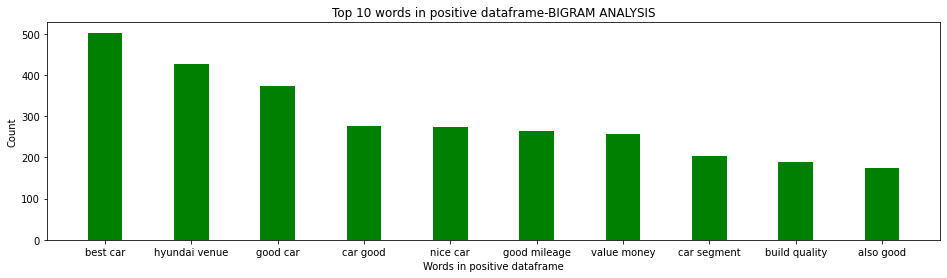

In [78]:
# plotting positive dataframe(bigram)
plt.figure(1,figsize=(16,4))
plt.bar(pd1bi, pd2bi, color ='green', width = 0.4)
plt.xlabel("Words in positive dataframe")
plt.ylabel("Count")
plt.title("Top 10 words in positive dataframe-BIGRAM ANALYSIS")
plt.show()

In [79]:
ned1bi=df_negative2[0][:10]
ned2bi=df_negative2[1][:10]

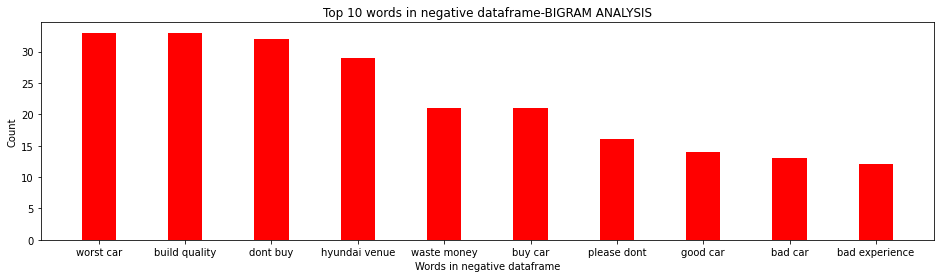

In [80]:
# plotting negative dataframe(bigram)
plt.figure(1,figsize=(16,4))
plt.bar(ned1bi, ned2bi, color ='red', width = 0.4)
plt.xlabel("Words in negative dataframe")
plt.ylabel("Count")
plt.title("Top 10 words in negative dataframe-BIGRAM ANALYSIS")
plt.show()

In [81]:
nud1bi=df_neutral2[0][:10]
nud2bi=df_neutral2[1][:10]

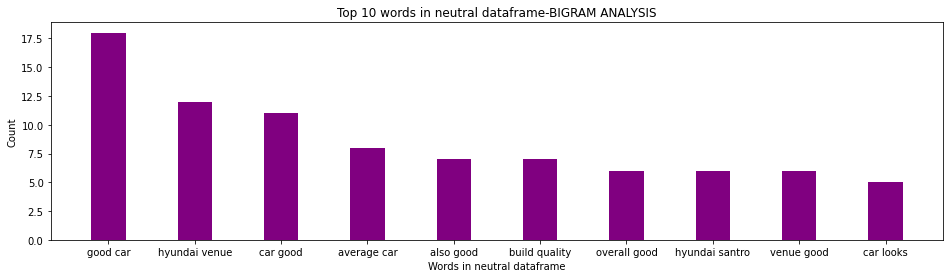

In [82]:
# plotting neutral dataframe(bigram)
plt.figure(1,figsize=(16,4))
plt.bar(nud1bi, nud2bi, color ='purple', width = 0.4)
plt.xlabel("Words in neutral dataframe")
plt.ylabel("Count")
plt.title("Top 10 words in neutral dataframe-BIGRAM ANALYSIS")
plt.show()

- From the bigram analysis we can understand yhe customers' fellings in a better way compare to unigram analysis.For more granularity we are going for trigram analysis.

## Trigram Analysis

We are repeating the same steps which we followed to analyze our data using unigrams except that we have passed parameter 3 while invoking the generate_N_grams() function. We also have changed the name of the dataframes here.

In [83]:
positiveValues3=defaultdict(int)
negativeValues3=defaultdict(int)
neutralValues3=defaultdict(int)

# get the count of every word in cleaned review column where sentiment="positive"
for text in review_pos[review_pos.sentiment_by_rating==2].cleaned_review:
  for word in generate_N_grams(text, 3):
    positiveValues3[word]+=1
    
# get the count of every word in cleaned review column where sentiment="negative"    
for text in review_neg[review_neg.sentiment_by_rating==0].cleaned_review:
  for word in generate_N_grams(text, 3):
    negativeValues3[word]+=1
    
# get the count of every word in cleaned review column where sentiment="neutral"    
for text in review_neu[review_neu.sentiment_by_rating==1].cleaned_review:
  for word in generate_N_grams(text, 3):
    neutralValues3[word]+=1
    
df_positive3=pd.DataFrame(sorted(positiveValues3.items(),key=lambda x:x[1],reverse=True))
df_negative3=pd.DataFrame(sorted(negativeValues3.items(),key=lambda x:x[1],reverse=True))
df_neutral3=pd.DataFrame(sorted(neutralValues3.items(),key=lambda x:x[1],reverse=True))

Sentence after removing stopwords: ['headlights', 'car', 'work', 'like', 'nothing', 'mobile', 'flashlight', 'person', 'travels', 'lot', 'especially', 'night', 'please', 'dont', 'buy', 'car', 'least', 'dont', 'buy', 'top', 'end', 'sxo']
Sentence after removing stopwords: ['great', 'design', 'comfortable', 'car', 'decade']
Sentence after removing stopwords: ['really', 'happy', 'decision', 'buy', 'car', 'comfortable', 'stylish', 'fulfils', 'requirements', 'keeps', 'happy', 'road']
Sentence after removing stopwords: ['purchased', 'creta', 'around', 'year', 'ago', 'experience', 'car', 'quite', 'good', 'comfortable', 'gives', 'good', 'mileage', 'cheapest', 'maintenance']
Sentence after removing stopwords: ['good', 'quality', 'looks', 'good', 'better', 'performance', 'car', 'interior', 'better']
Sentence after removing stopwords: ['overall', 'excellent', 'variant', 'look', 'comfort', 'safety', 'point', 'view', 'good', 'ground', 'clearance', 'good']
Sentence after removing stopwords: ['using',

Sentence after removing stopwords: ['comfort', 'ok', 'mileage', 'city', 'highway']
Sentence after removing stopwords: ['bought', 'santro', 'sports', 'amt', 'version', 'good', 'looking', 'family', 'car', 'affordable', 'price', 'cant', 'drive', 'manual', 'car', 'bought', 'amt', 'version', 'previous', 'wagon', 'r', 'amt', 'clutch', 'plates', 'damaged', 'middle', 'highway', 'towed', 'service', 'center', 'informed', 'occurred', 'due', 'driving']
Sentence after removing stopwords: ['initial', 'pickup', 'lower', 'end', 'headlights', 'given', 'manufacturer', 'second', 'gear', 'gives', 'jerky', 'ride', 'reverse', 'gear', 'gets', 'stuck', 'time', 'time', 'interior', 'good', 'suspension', 'handling', 'good', 'easytodrive', 'vehicle', 'sears', 'comfortable']
Sentence after removing stopwords: ['best', 'car', 'till', 'would', 'love', 'car', 'best', 'comfort', 'design', 'lastly', 'boot', 'space']
Sentence after removing stopwords: ['duster', 'nice', 'car', 'long', 'runs', 'two', 'issues', 'car', 'fi

Sentence after removing stopwords: ['thar', 'petrol', 'manual', 'mileage', 'low', 'petrol', 'displayed', 'anywhere', 'give', 'mileage', 'shocked']
Sentence after removing stopwords: ['awesome', 'car', 'great', 'fun', 'driving', 'best', 'safety', 'features', 'along', 'adasadvanced', 'driverassistance', 'systems', 'technology', 'superb']
Sentence after removing stopwords: ['lower', 'variants', 'denied', 'musthave', 'features', 'like', 'reverse', 'camera', 'auto', 'headlamps', 'auto', 'climate', 'dualzone', 'auto', 'fold', 'mirror', 'startstop', 'button']
Sentence after removing stopwords: ['comfort', 'seat', 'many', 'features', 'missing', 'deed', 'mileage', 'might', 'able', 'get', 'thanks', 'adasadvanced', 'driverassistance', 'systems']
Sentence after removing stopwords: ['worst', 'performance', 'compared', 'hyundai', 'alcazar', 'maintenance', 'cost', 'high', 'compared', 'safari', 'alcazar']
Sentence after removing stopwords: ['fuel', 'lid', 'opening', 'worst', 'car', 'open', 'fuel', 'ta

Sentence after removing stopwords: ['safety', 'acceleration', 'car', 'affordable', 'price', 'good', 'mileage', 'cars', 'look', 'somehow', 'like', 'land', 'rovers', 'cars', 'indian', 'buy', 'indian', 'brand', 'carread']
Sentence after removing stopwords: ['im', 'using', 'vehicle', 'months', 'poor', 'mileage', 'getting', 'petrol', 'consumption', 'also', 'much', 'company', 'claiming']
Sentence after removing stopwords: ['using', 'touch', 'screen', 'heavy', 'traffic', 'difficult', 'take', 'eyes', 'road', 'pause', 'button', 'mounted', 'steering', 'bumpers', 'stronger', 'feltread']
Sentence after removing stopwords: ['riding', 'quality', 'good', 'mileage', 'bad', 'im', 'satisfied', 'price', 'performance', 'low', 'perform', 'engine']
Sentence after removing stopwords: ['overall', 'performance', 'good', 'compared', 'engines', 'market', 'millage', 'wise', 'reasonable', 'city', 'traffic', 'well', 'highways']
Sentence after removing stopwords: ['performance', 'seems', 'percentile', 'hyundai', 'ma

Sentence after removing stopwords: ['mileage', 'issue', 'near', 'bangalore', 'traffic', 'ac', 'performance', 'superior', 'thanks', 'turbo', 'engine']
Sentence after removing stopwords: ['power', 'lag', 'turbo', 'annoying', 'times', 'city', 'especially', 'overtaking', 'highways', 'pickup', 'awesome']
Sentence after removing stopwords: ['seat', 'design', 'uncomfortable', 'driver', 'around', 'suffered', 'lot', 'good', 'short', 'tiny', 'build', 'people', 'even', 'shifting', 'seat', 'cant', 'help', 'cushions', 'nets', 'cant', 'help', 'dont', 'know', 'gonna', 'driving']
Sentence after removing stopwords: ['bought', 'car', 'mainly', 'fuel', 'efficiency', 'told', 'venue', 'car', 'give', 'average', 'around', 'km', 'happen', 'car', 'giving', 'worst', 'mileage', 'km', 'one', 'purchase', 'car']
Sentence after removing stopwords: ['features', 'good', 'displacement', 'good', 'comes', 'engine', 'somehow', 'low']
Sentence after removing stopwords: ['everything', 'excellent', 'seat', 'comfort', 'poor',

Sentence after removing stopwords: ['new', 'look', 'stylish', 'many', 'model', 'car', 'choose', 'best', 'car', 'features', 'power', 'price', 'high']
Sentence after removing stopwords: ['perfect', 'suv', 'kind', 'features', 'stylish', 'safe', 'important', 'thing', 'love', 'every', 'ride']
Sentence after removing stopwords: ['car', 'awesome', 'feature', 'satisfied', 'rto', 'car', 'model', 'sx', 'cost', 'lakh', 'rto', 'thats', 'satisfied', 'car']
Sentence after removing stopwords: ['car', 'bold', 'car', 'ticked', 'maximum', 'features', 'seats', 'comfort', 'feel', 'big', 'panoramic', 'sunroof', 'awesome', 'instrument', 'cluster', 'neat', 'clean', 'paddle', 'shift', 'amazing', 'best', 'class', 'front', 'rear', 'headlamps', 'detailed', 'dashboard', 'soft', 'touch', 'overall', 'worth', 'every', 'penny']
Sentence after removing stopwords: ['important', 'trust', 'hyundai', 'india', 'low', 'maintenance', 'fully', 'loaded', 'car', 'convenience', 'function', 'car']
Sentence after removing stopword

Sentence after removing stopwords: ['best', 'car', 'segment', 'compared', 'cars']
Sentence after removing stopwords: ['ye', 'car', 'bahot', 'hi', 'smooth', 'comfortable', 'chalti', 'hai']
Sentence after removing stopwords: ['purchased', 'hyundai', 'santro', 'magna', 'bahraich', 'branch', 'balaji', 'motors', 'hardoi', 'test', 'drive', 'told', 'horn', 'weak', 'horn', 'provided', 'vehicle', 'horn', 'santro', 'magna', 'original', 'must', 'replaced', 'vehicles', 'time', 'delivery', 'told', 'fog', 'lamp', 'reached', 'hardoiit']
Sentence after removing stopwords: ['overall', 'good', 'performance', 'happy', 'vehicle', 'planning', 'buy', 'additional', 'vehicle', 'wish', 'keep', 'vehicle', 'since', 'performance', 'maintenance', 'costs', 'pocket', 'friendly', 'definitely', 'recommend', 'suggest', 'firsttime', 'vehicle', 'buyers', 'go', 'hyundai', 'product', 'really', 'satisfied']
Sentence after removing stopwords: ['superb', 'car', 'perfect', 'family', 'car', 'hyundai', 'santro', 'good', 'fuel', 

Sentence after removing stopwords: ['maruti', 'celerio', 'amt', 'zxi', 'variant', 'powerful', 'engine', 'steep', 'climb', 'starting', 'neutral', 'lags', 'power', 'jerks', 'getting', 'mileage', 'highway', 'full', 'ac', 'three', 'people', 'board', 'maintainance', 'good', 'maruti', 'vehicles', 'recommend', 'vehicle', 'lengthy', 'hefty', 'fellows', 'writing', 'reviewread']
Sentence after removing stopwords: ['great', 'car', 'ample', 'space', 'best', 'car', 'budget', 'segment', 'affordable', 'maintenance', 'mileage', 'looking', 'forward', 'cng', 'model', 'fuel', 'cost', 'rising', 'said', 'best', 'option', 'available', 'lakh', 'price', 'segment', 'initial', 'diesel', 'version', 'planning', 'another', 'new', 'car', 'may', 'ertiga', 'cngread']
Sentence after removing stopwords: ['overall', 'good', 'car', 'decent', 'pickup', 'performance', 'straight', 'roads', 'inclination', 'degrees', 'severe', 'drop', 'power', 'due', 'low', 'torque', 'guess', 'stop', 'ac', 'navigate', 'hilly', 'terrain', 'oth

Sentence after removing stopwords: ['interior', 'exterior', 'car', 'good', 'noise', 'driving', 'steering', 'nice', 'suspension', 'good', 'ncap', 'rating', 'airbag', 'car', 'one', 'driver', 'must', 'required', 'passenger', 'also', 'less', 'pick', 'especially', 'city', 'traffic', 'area', 'irritating', 'otherwise', 'car', 'okay']
Sentence after removing stopwords: ['good', 'braking', 'system', 'good', 'comfort', 'quality', 'good', 'say', 'bad', 'ground', 'clearance', 'less']
Sentence after removing stopwords: ['long', 'drive', 'journey', 'good', 'driven', 'continuously', 'hours', 'engine', 'heating', 'comfortable', 'sitting', 'two', 'important', 'suggestions', 'ac', 'vents', 'placement', 'bad', 'particularly', 'drivers', 'size', 'vents', 'small', 'steering', 'wheel', 'obstructs', 'ac', 'vents', 'airflow', 'lower', 'end', 'doors', 'runread']
Sentence after removing stopwords: ['looks', 'amazing', 'lets', 'see', 'looks', 'real', 'theres', 'one', 'thing', 'makes', 'confused', 'used', 'drive'

Sentence after removing stopwords: ['good', 'car', 'lowerincome', 'groups', 'comfortable', 'comparison', 'alto', 'hyundai', 'eon', 'low', 'maintenance']
Sentence after removing stopwords: ['build', 'quality', 'poor', 'comfortable', 'styles', 'average', 'want', 'comfort', 'go', 'mileage', 'received']
Sentence after removing stopwords: ['great', 'looking', 'cars', 'latest', 'technology', 'make', 'wonderful', 'car', 'daily', 'use', 'suitable', 'local', 'long', 'drives']
Sentence after removing stopwords: ['creta', 'one', 'highestselling', 'cars', 'would', 'really', 'like', 'tell', 'pathetic', 'paint', 'quality', 'poor', 'every', 'hyundai', 'car', 'also', 'performance', 'creta', 'highway', 'good', 'car', 'stable', 'highways', 'skids', 'sharp', 'curvy', 'roads', 'even', 'speed', 'pls', 'hyundai', 'work']
Sentence after removing stopwords: ['bought', 'asta', 'last', 'month', 'found', 'sturdy', 'seems', 'like', 'fragile', 'car', 'looks', 'stylish', 'comfortable', 'inside', 'rides', 'like', 'c

Sentence after removing stopwords: ['experience', 'honda', 'city', 'deals', 'comfort', 'shark', 'look', 'making', 'classy', 'luxurious', 'car', 'comfortable', 'ride', 'long', 'trips', 'help', 'cruise', 'long', 'travels', 'sunroof', 'provides', 'extraordinary', 'look', 'carthe', 'cockpit', 'pf', 'car', 'luxurious', 'however', 'plastic', 'quality', 'still', 'mark', 'itread']
Sentence after removing stopwords: ['favourite', 'car', 'honda', 'city', 'biggest', 'favourite', 'car', 'colour', 'blue', 'white']
Sentence after removing stopwords: ['honda', 'city', 'best', 'package', 'comfort', 'driving', 'pleasure', 'fuel', 'efficient', 'low', 'maintenance', 'cost', 'good', 'experience', 'showroom', 'best', 'midsize', 'sedan', 'available', 'market', 'basically', 'choose', 'city', 'wanted', 'comfort', 'term', 'comfort', 'honda', 'city', 'performs', 'better', 'hyundai', 'vernaread']
Sentence after removing stopwords: ['honda', 'city', 'idtec', 'v', 'variant', 'good', 'car', 'car', 'named', 'perfect

Sentence after removing stopwords: ['car', 'fantastic', 'every', 'aspect', 'whether', 'talk', 'comfort', 'level', 'mileage', 'ride', 'handling', 'quality']
Sentence after removing stopwords: ['drived', 'venue', 'sx', 'around', 'kms', 'ideal', 'circumstances', 'found', 'highway', 'average', 'km', 'per', 'litre', 'routine', 'traffic', 'high', 'way', 'average', 'remains', 'kmper', 'litre', 'otherwise', 'also', 'found', 'performance', 'car', 'good', 'one', 'negative', 'point', 'speed', 'kmhour', 'remains', 'stable']
Sentence after removing stopwords: ['hyundai', 'venue', 'nice', 'looking', 'prices', 'compared', 'cars', 'available', 'low', 'prices', 'good', 'features', 'brand', 'name', 'also', 'good']
Sentence after removing stopwords: ['hyundai', 'venue', 'great', 'car', 'looses', 'onestar', 'mileage', 'city', 'n', 'highway']
Sentence after removing stopwords: ['back', 'seat', 'comfort', 'hyundai', 'venue', 'good', 'things', 'excellent', 'doubt', 'car', 'premium', 'car', 'awesome']
Sentenc

Sentence after removing stopwords: ['good', 'car', 'features', 'required', 'car', 'also', 'provides', 'great', 'performance', 'kind', 'roads']
Sentence after removing stopwords: ['bought', 'car', 'months', 'back', 'worth', 'money', 'unbelievable', 'power', 'driven', 'comfort', 'best']
Sentence after removing stopwords: ['buying', 'vw', 'polo', 'easy', 'game', 'got', 'machine', 'within', 'week', 'gave', 'preference', 'polo', 'looking', 'hatchback', 'better', 'comfort', 'safety', 'till', 'went', 'proving', 'pros', 'comfort', 'safety', 'premium', 'quality', 'handling', 'cons', 'slow', 'pick', 'upreduced', 'power', 'led', 'headlamps', 'reverse', 'camera', 'pushbutton', 'legroombackspread']
Sentence after removing stopwords: ['superb', 'driving', 'experience', 'efficient', 'engine', 'delivers', 'mileage', 'city', 'drives', 'highway', 'drives', 'requires', 'annual', 'maintenance', 'great', 'build', 'quality', 'feels', 'safe', 'secure', 'inside', 'car', 'car', 'named', 'synonym', 'safety', 'b

Sentence after removing stopwords: ['low', 'cost', 'maintenance', 'feels', 'good', 'driving', 'experience', 'gives', 'good', 'millage']
Sentence after removing stopwords: ['hyundai', 'santro', 'low', 'maintenance', 'mileage', 'good', 'driving', 'experience', 'awesome']
Sentence after removing stopwords: ['hyundai', 'santro', 'nice', 'car', 'design', 'good', 'santro', 'best', 'car', 'segment', 'looks', 'small', 'compared', 'cars', 'segment', 'best', 'build', 'quality', 'lighter', 'compared', 'old', 'model', 'hyundai', 'santro']
Sentence after removing stopwords: ['hyundai', 'known', 'creating', 'highquality', 'vehicles', 'santro', 'exception', 'car', 'legacy', 'created', 'storm', 'first', 'launched', 'late', 'hyundai', 'resurrected', 'city', 'car', 'plenty', 'changes', 'inside', 'making', 'truly', 'contemporary', 'vehicle', 'really', 'needed', 'small', 'car', 'going', 'b']
Sentence after removing stopwords: ['hyundai', 'santro', 'sportz', 'bought', 'november', 'fourcylinder', 'engine', 

Sentence after removing stopwords: ['overall', 'good', 'car', 'compact', 'suv', 'segment', 'powerful', 'engine', 'good', 'mileage', 'city', 'kmpl', 'highway', 'kmpl']
Sentence after removing stopwords: ['best', 'car', 'cng', 'model', 'pickup', 'also', 'good', 'bought', 'company', 'fitted', 'cng', 'cars', 'remain', 'long', 'time', 'car', 'best']
Sentence after removing stopwords: ['great', 'family', 'car', 'features', 'require', 'including', 'decent', 'mileage', 'even', 'petrol', 'variant', 'tradeoffs', 'low', 'power', 'hence', 'fit', 'enthusiastic', 'driving']
Sentence after removing stopwords: ['village', 'ruff', 'road', 'city', 'use', 'build', 'quality', 'average', 'mileage', 'good']
Sentence after removing stopwords: ['please', 'try', 'arrange', 'base', 'model', 'diesel', 'trying', 'buy', 'months', 'company', 'adequate', 'amount', 'cars', 'sell', 'please', 'increase', 'production', 'cars', 'get', 'car', 'next', 'month', 'superb', 'car', 'experience']
Sentence after removing stopword

Sentence after removing stopwords: ['hyundai', 'venues', 'elegant', 'look', 'performance', 'mark', 'suv', 'segment']
Sentence after removing stopwords: ['hyundai', 'venue', 'car', 'simply', 'superb', 'everything', 'car', 'like', 'everything', 'perfect', 'since', 'every', 'coin', 'two', 'sidesso', 'car', 'problems', 'firstly', 'going', 'pros', 'comfort', 'riding', 'quality', 'compact', 'good', 'city', 'wireless', 'charger', 'air', 'purifier', 'bluelink', 'technology']
Sentence after removing stopwords: ['smart', 'model', 'easy', 'drive', 'handling', 'good', 'interiors', 'good', 'mileage', 'easy', 'maintenance']
Sentence after removing stopwords: ['car', 'wow', 'dream', 'car', 'hyundai', 'done', 'great', 'job', 'car', 'vehicle', 'quality', 'driving', 'experience', 'pleasure', 'fantastic', 'love', 'car', 'offer', 'best', 'safety', 'best', 'style', 'best', 'service', 'modern', 'look', 'sports', 'utility', 'segment', 'best', 'price', 'bracket', 'vehicle', 'mileage', 'also', 'best', 'pocket'

Sentence after removing stopwords: ['beautiful', 'stylish', 'car', 'good', 'ground', 'clearance', 'comfort', 'excellent', 'parts', 'quality', 'best']
Sentence after removing stopwords: ['hyundai', 'venue', 'car', 'good', 'interior', 'car', 'totally', 'black', 'hyundai', 'brand', 'needs', 'put', 'light', 'colors', 'dashboard', 'like', 'first', 'hyundai', 'model', 'please', 'hyundai', 'add', 'light', 'color', 'combination', 'interior', 'car']
Sentence after removing stopwords: ['good', 'overall', 'package', 'gives', 'sub', 'suv', 'run', 'money', 'cons', 'hard', 'suspension', 'petrol', 'dct', 'taste', 'bumps', 'gutters', 'road', 'inside', 'cabin', 'fuel', 'efficiency', 'much', 'ask', 'turbo', 'engine', 'drinks', 'petrol', 'like', 'anything', 'pros', 'parameters', 'overall', 'across', 'segme']
Sentence after removing stopwords: ['good', 'car', 'price', 'drive', 'softly', 'steering', 'things', 'good', 'say', 'complete', 'suv', 'car']
Sentence after removing stopwords: ['good', 'car', 'feel'

Sentence after removing stopwords: ['tata', 'tiago', 'first', 'car', 'good', 'car', 'price', 'segment', 'purchase', 'car', 'feeling', 'much', 'better', 'good', 'comfort', 'interior', 'exterior', 'niceread']
Sentence after removing stopwords: ['performancewise', 'good', 'muv', 'segment', 'comfort', 'seat', 'good', 'service', 'network', 'proper', 'upgrade', 'vehicle', 'time', 'overall', 'good', 'family', 'car']
Sentence after removing stopwords: ['hyundai', 'always', 'makes', 'something', 'meaningful', 'practical', 'venue', 'one', 'best', 'cars', 'segment', 'good', 'features', 'well', 'designed', 'interior', 'quality', 'topnotch', 'little', 'claustrophobic', 'also', 'space', 'rear', 'passengers', 'comparison', 'rivals', 'less', 'love', 'drive', 'venue', 'perfect', 'car']
Sentence after removing stopwords: ['perfect', 'city', 'car', 'good', 'leg', 'room', 'ground', 'clearance', 'gives', 'feel', 'compact', 'suv', 'outside', 'hatchback', 'driving', 'seat', 'although', 'experience', 'good', 

Sentence after removing stopwords: ['best', 'car', 'segment', 'features', 'amazing', 'looks', 'classic']
Sentence after removing stopwords: ['design', 'hyundai', 'venue', 'fabulous', 'petrol', 'engine', 'fantastic', 'segment', 'great', 'mileage', 'option', 'car', 'loaded', 'features', 'price', 'range']
Sentence after removing stopwords: ['hyundai', 'venue', 'providing', 'new', 'features', 'reliable', 'also', 'much', 'comfortable', 'driving']
Sentence after removing stopwords: ['amazing', 'car', 'budget', 'price', 'good', 'family', 'car', 'segment', 'good', 'job', 'hyundai', 'motors', 'keep']
Sentence after removing stopwords: ['hyundai', 'venue', 'loving', 'car', 'great', 'suv', 'hyundai', 'miss', 'minor', 'things', 'installed', 'car', 'otherwise', 'great']
Sentence after removing stopwords: ['took', 'test', 'drive', 'today', 'power', 'car', 'pleasing', 'definitely', 'quality', 'material', 'concern', 'raises', 'comes', 'comfortable', 'seating', 'position', 'especially', 'rear', 'passen

Sentence after removing stopwords: ['yet', 'buy', 'car', 'looking', 'features', 'good', 'specification', 'overall', 'good']
Sentence after removing stopwords: ['amazing', 'car', 'proud', 'feeling', 'become', 'owner', 'new', 'ultimate', 'creta', 'far', 'better', 'experience', 'cars', 'lakhs', 'creta', 'best', 'option', 'buy', 'compare', 'kia', 'seltos', 'creta', 'features', 'use', 'easy', 'understand', 'big', 'panoramic', 'sunroof', 'gives', 'great', 'inside', 'look']
Sentence after removing stopwords: ['nice', 'car', 'affordable', 'price', 'nice', 'design', 'even', 'said', 'friends', 'buy', 'car']
Sentence after removing stopwords: ['full', 'entertainment', 'comfortable', 'open', 'top', 'great', 'successful', 'car']
Sentence after removing stopwords: ['amazing', 'car', 'one', 'best', 'cars', 'segment']
Sentence after removing stopwords: ['sx', 'plus', 'model', 'creta', 'amazing', 'car', 'smooth', 'drive', 'somehow', 'feel', 'breaks', 'arent', 'responsive', 'braking', 'performance', 're

Sentence after removing stopwords: ['lookswise', 'car', 'looks', 'great', 'vt', 'petrol', 'engine', 'perform', 'amazing', 'peppier', 'compared', 'hyundai', 'verna', 'petrol', 'features', 'car', 'good', 'android', 'auto', 'apple', 'car', 'play', 'thinking', 'buy', 'sedan', 'budget', 'petrol', 'engine', 'perfect', 'choice', 'youread']
Sentence after removing stopwords: ['allnew', 'honda', 'city', 'good', 'long', 'ride', 'unlike', 'bad', 'bad', 'road', 'city', 'better', 'roads', 'told', 'buy', 'honda', 'city', 'roads', 'bad', 'need', 'prefer', 'suv', 'car', 'efficient', 'enough', 'space', 'car', 'gives', 'large', 'space', 'back', 'car', 'looks', 'attractive', 'car', 'carries', 'five', 'membersread']
Sentence after removing stopwords: ['diesel', 'model', 'driven', 'around', 'km', 'getting', 'average', 'really', 'satisfied', 'car']
Sentence after removing stopwords: ['good', 'car', 'aspects', 'good', 'mileage', 'features', 'good', 'comfort', 'amazing', 'good', 'legroom', 'spacious', 'car', 

Sentence after removing stopwords: ['excellent', 'car', 'mileage', 'amazing', 'features', 'impressive', 'looks', 'classic']
Sentence after removing stopwords: ['best', 'car', 'segment', 'worth', 'purchase', 'features', 'looks', 'impressive']
Sentence after removing stopwords: ['good', 'car', 'looks', 'attractive', 'however', 'perfect', 'suv', 'car']
Sentence after removing stopwords: ['nice', 'family', 'car', 'good', 'looks', 'awesome', 'features']
Sentence after removing stopwords: ['hyundai', 'venue', 'great', 'car', 'good', 'engine', 'looks', 'latest', 'features', 'hyundai', 'provide', 'navigation', 'music', 'control', 'abs', 'sunroof', 'good', 'suv', 'decent', 'price', 'range']
Sentence after removing stopwords: ['look', 'really', 'bold', 'overall', 'nice', 'car', 'budgetfriendly', 'option', 'features', 'amazing', 'compared', 'suv', 'car', 'segment']
Sentence after removing stopwords: ['better', 'car', 'comparison', 'maruti', 'vitara', 'breeza', 'superb', 'mini', 'suv', 'really', '

Sentence after removing stopwords: ['car', 'almost', 'every', 'feature', 'car', 'range', 'internet', 'good', 'future', 'automobile', 'exterior', 'also', 'amazing', 'suv', 'wireless', 'charging', 'feature', 'like', 'cherry', 'cake', 'vibrant', 'interior', 'topnotch', 'big', 'makes', 'comforta']
Sentence after removing stopwords: ['purchased', 'hyundai', 'venue', 'sxo', 'diesel', 'sep', 'driven', 'kms', 'one', 'best', 'compact', 'suv', 'cars', 'market', 'used', 'get', 'average', 'kml', 'drive', 'speed', 'kml', 'drive', 'speed', 'driven', 'max', 'speed', 'kanyakumari', 'highway', 'smooth']
Sentence after removing stopwords: ['first', 'car', 'receiving', 'lot', 'appreciations', 'friends', 'colleague', 'test', 'drive', 'car', 'found', 'true', 'urban', 'car', 'excellent', 'city', 'life', 'urban', 'traffic', 'feature', 'rich', 'comfortable', 'drive', 'smooth', 'handling', 'low', 'mileage', 'petrol', 'option', 'turbo', 'charge', 'decent', 'job', 'power', 'performance']
Sentence after removing 

Sentence after removing stopwords: ['looks', 'features', 'make', 'best', 'car', 'customers']
Sentence after removing stopwords: ['car', 'best', 'urban', 'buyers', 'right', 'height', 'ground', 'clearance', 'indian', 'roads', 'frills', 'lac', 'fully', 'loaded', 'lacs', 'car', 'put', 'pressure', 'hatchbacks', 'likes', 'dezire', 'amaze', 'etc', 'blue', 'link', 'adds', 'already', 'segmentfirst', 'features', 'like', 'wireless', 'charging', 'androidapple', 'car', 'play', 'etc']
Sentence after removing stopwords: ['bought', 'new', 'hyundai', 'venue', 'sx', 'turbo', 'optional', 'amazing', 'drive', 'experience', 'turbo', 'engine', 'bluelink', 'technology', 'great']
Sentence after removing stopwords: ['first', 'let', 'tell', 'something', 'interesting', 'hyundai', 'venue', 'diesel', 'engine', 'kind', 'surprising', 'engine', 'try', 'pull', 'speed', 'hits', 'hard', 'quite', 'amazing', 'response', 'go', 'somewhere', 'around', 'sure', 'take', 'forever', 'pull', 'back', 'power', 'average', 'rest', 'rea

Sentence after removing stopwords: ['nice', 'car', 'features', 'required', 'compact', 'safe', 'within', 'budget', 'small', 'family', 'mustbuy', 'sure']
Sentence after removing stopwords: ['nice', 'hatchback', 'good', 'model', 'easy', 'drive', 'looking', 'budget', 'car', 'go']
Sentence after removing stopwords: ['surely', 'good', 'contender', 'segment', 'got', 'amt', 'version', 'jan', 'absolutely', 'satisfied', 'price', 'vs', 'features', 'constant', 'kwid', 'costs', 'lakhs', 'expensive', 'almost', 'upgrades', 'nothing', 'significantread']
Sentence after removing stopwords: ['best', 'segment', 'superb', 'suspension', 'comfort', 'build', 'quality', 'great', 'make', 'improvement', 'dashboard', 'price', 'high', 'gear', 'shifting', 'smooth', 'cant', 'even', 'feel', 'good', 'corners', 'overall', 'superb', 'carread']
Sentence after removing stopwords: ['best', 'segment', 'superb', 'suspension', 'comfort', 'build', 'quality', 'great', 'bt', 'make', 'improvements', 'dashboard', 'price', 'high', 

Sentence after removing stopwords: ['good', 'look', 'bad', 'mileage', 'car', 'comfortable', 'good', 'tech', 'inside', 'street', 'feeling', 'good', 'rear', 'seat', 'comfortable']
Sentence after removing stopwords: ['best', 'safest', 'car', 'renault', 'family', 'experience', 'closely']
Sentence after removing stopwords: ['duster', 'diesel', 'rxz', 'last', 'years', 'driven', 'far', 'low', 'maintenance', 'cost', 'till', 'performance', 'awesome', 'braking', 'stability', 'uncomparable', 'happy', 'vehicle', 'friends', 'ridden', 'also', 'become', 'fans', 'duster', 'planning', 'buy', 'duster', 'againread']
Sentence after removing stopwords: ['nice', 'experience', 'buy', 'car', 'got', 'ontime', 'delivery', 'without', 'hassle', 'first', 'car', 'amazing', 'driving', 'experience', 'looks', 'attractive', 'feel', 'mileage', 'good', 'giving', 'mileage', 'cityread']
Sentence after removing stopwords: ['yeh', 'ek', 'nice', 'car', 'hai', 'par', 'manufacturing', 'detected', 'hai', 'mene', 'kiger', 'top', 

Sentence after removing stopwords: ['average', 'paper', 'hope', 'increase', 'first', 'service', 'car', 'value', 'money']
Sentence after removing stopwords: ['suv', 'waiting', 'surely', 'nissan', 'engineers', 'designers', 'done', 'great', 'job', 'mileage', 'surely', 'competitive', 'advantage', 'suv', 'road', 'clearance', 'suitable', 'indian', 'road', 'condition', 'waiting', 'allnew', 'nissan', 'magnificent', 'magniteread']
Sentence after removing stopwords: ['good', 'car', 'excellent', 'ride', 'quality', 'even', 'worst', 'roads', 'maharashtra', 'state', 'ergonomics', 'needs', 'improved', 'huge', 'boot', 'space', 'overall', 'looking', 'ride', 'quality', 'comfort', 'go', 'drive', 'car', 'long', 'hours', 'without', 'gei', 'tired', 'compared', 'socalled', 'compact', 'subcompact', 'suvs', 'segment', 'price', 'iread']
Sentence after removing stopwords: ['beautiful', 'car', 'stable', 'drive', 'lots', 'space', 'car', 'driving', 'easy', 'feels', 'good', 'drive']
Sentence after removing stopwords

Sentence after removing stopwords: ['everything', 'fine', 'side', 'engine', 'must', 'ac', 'powerful', 'quite', 'cooling', 'experience']
Sentence after removing stopwords: ['superb', 'car', 'exceeded', 'expectations', 'far', 'amt', 'version', 'takes', 'little', 'get', 'used', 'complaints', 'nothing', 'comes', 'close', 'price', 'pointread']
Sentence after removing stopwords: ['perfect', 'family', 'car', 'adequate', 'space', 'everything', 'excellent', 'design', 'good', 'mileage', 'overall', 'winner', 'middleclass', 'hearts']
Sentence after removing stopwords: ['recently', 'purchased', 'renault', 'tribber', 'rxz', 'model', 'want', 'clarify', 'doubts', 'earlier', 'found', 'reading', 'reviews', 'heavy', 'engine', 'noise', 'starting', 'running', 'car', 'comfortable', 'travel', 'tribber', 'smart', 'car', 'put', 'real', 'performance', 'car', 'coming', 'days', 'poread']
Sentence after removing stopwords: ['overall', 'nice', 'look', 'comfortable', 'mileage', 'depends', 'driving', 'style', 'servic

Sentence after removing stopwords: ['nissan', 'back', 'kicks', 'best', 'class', 'features', 'good', 'looking', 'exterior', 'interior', 'feels', 'premium', 'terms', 'practicality', 'usual', 'ergonomic', 'lots', 'issues', 'features', 'outstanding', 'side', 'special', 'features', 'missing', 'direct', 'rivals', 'offers', 'terms', 'handling', 'also', 'lot', 'work', 'still', 'pending', 'dread']
Sentence after removing stopwords: ['nissan', 'kicks', 'excellent', 'specifications', 'brand', 'offers', 'customers', 'drawback', 'must', 'sunroof', 'vehicle']
Sentence after removing stopwords: ['good', 'practical', 'car', 'highly', 'recommended', 'people', 'whos', 'limited', 'budget', 'want', 'premium', 'package']
Sentence after removing stopwords: ['overall', 'good', 'experience', 'satisfactory', 'performance', 'low', 'maintenance', 'good', 'family', 'star', 'rated', 'great', 'features', 'per', 'price']
Sentence after removing stopwords: ['bought', 'triber', 'august', 'ever', 'since', 'enjoyed', 'o

Sentence after removing stopwords: ['nice', 'car', 'midlevel', 'segment', 'budget', 'safety', 'modern', 'features', 'mileage', 'good', 'traffic', 'road']
Sentence after removing stopwords: ['good', 'car', 'segment', 'best', 'value', 'money', 'good', 'average', 'ac', 'nonac', 'happy', 'buy', 'car']
Sentence after removing stopwords: ['good', 'car', 'lac', 'swift', 'better', 'best', 'car', 'tata', 'tiago', 'xt', 'valuable']
Sentence after removing stopwords: ['awesome', 'family', 'car', 'design', 'brilliant', 'exterior', 'attractive', 'bought', 'vx', 'seater', 'grey', 'interior', 'nice', 'rich', 'mileage', 'powerful', 'buy', 'innova', 'crysta', 'also', 'maintenance', 'cost', 'goodread']
Sentence after removing stopwords: ['performancewise', 'good', 'muv', 'segment', 'comfort', 'seat', 'good', 'service', 'network', 'proper', 'upgrade', 'vehicle', 'time', 'overall', 'good', 'family', 'carread']
Sentence after removing stopwords: ['maintainance', 'cost', 'high', 'safety', 'technology', 'can

Sentence after removing stopwords: ['car', 'luxury', 'car', 'expensive', 'maintain', 'requires', 'approximately', 'rs', 'per', 'year', 'maintenance', 'top', 'might', 'require', 'replacements', 'parts', 'fuel', 'injectors', 'pressure', 'pump', 'fuel', 'rail', 'etc', 'together', 'cost', 'lakhs', 'car', 'doesnt', 'support', 'fuel', 'might', 'break', 'anytime', 'road', 'showinread']
Sentence after removing stopwords: ['excellent', 'german', 'engineering', 'unique', 'driving', 'experience', 'perfect', 'handling', 'stability', 'modest', 'features', 'moderate', 'maintenance']
Sentence after removing stopwords: ['car', 'awesome', 'great', 'color', 'finish', 'comfortability', 'safety', 'smooth', 'driving']
Sentence after removing stopwords: ['lot', 'people', 'misconception', 'expensive', 'car', 'maintain', 'sacrifice', 'cost', 'european', 'car', 'completely', 'disagree', 'entire', 'years', 'two', 'cars', 'never', 'broken', 'never', 'issues', 'service', 'car', 'year', 'ive', 'crossed', 'kms', 'c

Sentence after removing stopwords: ['rating', 'car', 'build', 'quality', 'ride', 'quality', 'driving', 'dynamics', 'polo', 'gives', 'confidence', 'driving', 'experience', 'people', 'want', 'enjoy', 'driving', 'looking', 'bottle', 'holders', 'space', 'concerned', 'small', 'family', 'go', 'polomake', 'people', 'caryou', 'enjoy', 'loveread']
Sentence after removing stopwords: ['volkswagen', 'polo', 'giving', 'good', 'performance', 'car', 'good', 'safety', 'features', 'look', 'car', 'awesome']
Sentence after removing stopwords: ['good', 'vehicle', 'prefer', 'safety', 'performance', 'also', 'materials', 'used', 'vehicle', 'agrade']
Sentence after removing stopwords: ['tata', 'best', 'class', 'safety', 'features', 'build', 'quality', 'sitting', 'inside', 'feel', 'safe', 'traveling', 'high', 'speeds', 'also']
Sentence after removing stopwords: ['good', 'car', 'happy', 'car', 'showroom', 'experience', 'good', 'stylish', 'car', 'price', 'segment']
Sentence after removing stopwords: ['would', 'r

Sentence after removing stopwords: ['far', 'concerned', 'car', 'allover', 'package', 'terms', 'safety', 'comfort', 'style', 'etc', 'owing', 'one', 'fully', 'satisfied', 'beastread']
Sentence after removing stopwords: ['great', 'car', 'best', 'car', 'buy', 'lakhs', 'safety', 'handling', 'comfort', 'space', 'features', 'drive', 'modes', 'sports', 'mode', 'super']
Sentence after removing stopwords: ['using', 'tata', 'nexon', 'car', 'jan', 'comfortable', 'drive', 'maintenance', 'cost', 'also', 'low', 'safe', 'control', 'drive', 'feel', 'really', 'safe', 'family', 'driveread']
Sentence after removing stopwords: ['nexon', 'beautifulï¿½ï¿½ï¿½ï¿½ï¿½ï¿½ï¿½ï¿½', 'car', 'safest', 'car', 'india', 'got', 'stars', 'rating', 'design', 'also', 'good', 'car', 'bulky', 'screen', 'performance', 'good', 'screen', 'hi', 'hangs', 'overall', 'car', 'isï¿½ï¿½ï¿½ï¿½ï¿½ï¿½ï¿½ï¿½', 'good', 'favoriteï¿½ï¿½ï¿½ï¿½ï¿½ï¿½ï¿½ï¿½', 'car', 'harrier', 'tata', 'nexon', 'good', 'build', 'quality', 'seen']
Sentence after re

Sentence after removing stopwords: ['new', 'look', 'mass', 'look', 'innovative', 'thinking', 'major', 'extreme', 'new', 'technology', 'new', 'inventions', 'buildup', 'creta', 'nice', 'outlook', 'stylish']
Sentence after removing stopwords: ['awesome', 'car', 'ever', 'seen', 'yet', 'budget', 'features', 'mindblowing', 'panoramic', 'sunroof', 'one', 'car', 'feature', 'budget', 'suv', 'mileage', 'also', 'superb', 'car', 'torque', 'also', 'increased', 'car', 'look', 'also', 'fabulous', 'car', 'look', 'like', 'lakh', 'cars', 'complete', 'packages', 'perfect', 'suv', 'feel', 'like', 'premium', 'class', 'car']
Sentence after removing stopwords: ['creta', 'powerful', 'pickup', 'good', 'look', 'maintenance', 'low', 'good', 'mileage', 'lovely', 'car', 'year']
Sentence after removing stopwords: ['best', 'car', 'creta', 'low', 'price', 'good', 'looking', 'new', 'trending', 'young', 'age', 'people', 'nice', 'look', 'driving', 'cool']
Sentence after removing stopwords: ['hyundai', 'creta', 'sx', 'pe

Sentence after removing stopwords: ['good', 'car', 'price', 'true', 'value', 'money', 'great', 'features', 'excellent', 'love', 'car', 'good', 'boot', 'spacemindblowing']
Sentence after removing stopwords: ['car', 'good', 'looks']
Sentence after removing stopwords: ['luxury', 'feeling', 'budget', 'drive', 'km', 'single', 'seating', 'nonstop', 'didnt', 'feel', 'tired', 'ness', 'good', 'handling', 'good', 'safety', 'mileage', 'best', 'riding', 'quality', 'bestread']
Sentence after removing stopwords: ['super', 'build', 'quality', 'compare', 'features', 'new', 'arrivals', 'car', 'enthusiast']
Sentence after removing stopwords: ['aspire', 'titanium', 'plus', 'rear', 'armrest', 'interior', 'side', 'handles', 'missing', 'compared', 'older', 'one', 'aspire', 'trend', 'missing', 'two', 'thingsread']
Sentence after removing stopwords: ['ford', 'aspires', 'car', 'crossed', 'km', 'bought', 'car', 'end', 'drive', 'city', 'highway', 'average', 'shows', 'km', 'handling', 'awesome', 'brake', 'awesome

Sentence after removing stopwords: ['tough', 'look', 'exterior', 'well', 'interior', 'since', 'scorpio', 'knows', 'toughness', 'power', 'also', 'worthy', 'good', 'offroader', 'budget', 'apart', 'service', 'scorpio', 'affordable', 'also', 'negative', 'points', 'safety', 'good', 'think', 'showed', 'ncap', 'test', 'carread']
Sentence after removing stopwords: ['scorpio', 'best', 'suv', 'car', 'according', 'pickup', 'superb', 'really', 'like', 'drive', 'car', 'first', 'love', 'brilliant', 'comfort', 'zonewe', 'scorpio', 'cars', 'design', 'amazing', 'love', '¿½ï¿½ï¿½ï¿½ï¿', 'cars', 'wish', 'buy', 'latest', 'model', 'car', 'already', 'model', 'car', 'finally', 'superb', 'car']
Sentence after removing stopwords: ['fully', 'comfortable', 'car', 'car', 'used', 'life', 'stylethis', 'also', 'adventure', 'car']
Sentence after removing stopwords: ['right', 'choice', 'buy', 'scorpio', 'comfortable', 'safe', 'car', 'range']
Sentence after removing stopwords: ['best', 'car', 'favourite', 'car', 'comfo

Sentence after removing stopwords: ['asta', 'optional', 'mt', 'around', 'lakhs', 'budget', 'say', 'go', 'security', 'comfort', 'segment']
Sentence after removing stopwords: ['good', 'stylish', 'car', 'great', 'comforts', 'features', 'really', 'lived', 'premium', 'price', 'expectations']
Sentence after removing stopwords: ['comfortable', 'car', 'sportier', 'looks', 'reliable', 'engine', 'everything', 'superb', 'built', 'quality', 'must', 'improved']
Sentence after removing stopwords: ['excellent', 'car', 'manufacturing', 'company', 'going', 'cap', 'test', 'tested', 'get', 'safety', 'rating', 'rank', 'customer', 'get', 'full', 'clarity', 'car', 'maker', 'going', 'safety', 'rating', 'test']
Sentence after removing stopwords: ['great', 'car', 'city', 'mileage', 'kmpl', 'highway', 'kmpl', 'petrol', 'manual', 'happy', 'purchase', 'looks', 'make', 'everyone', 'stare', 'especially', 'typhoon', 'silver', 'comfort', 'best', 'class']
Sentence after removing stopwords: ['good', 'looking', 'car', '

Sentence after removing stopwords: ['car', 'superb', 'legendry', 'car', 'give', 'good', 'power', 'comfort', 'space', 'new', 'features']
Sentence after removing stopwords: ['bought', 'wr', 'diesel', 'time', 'sunroof', 'reason', 'buy', 'wrv', 'later', 'understood', 'one', 'best', 'decisions', 'made', 'completed', 'till', 'daily', 'commute', 'every', 'day', 'home', 'office', 'gives', 'mileage', 'like', 'aread']
Sentence after removing stopwords: ['superb', 'car', 'great', 'suspension', 'onehanded', 'steering', 'smooth', 'tiredness', 'drive', 'km', 'silent', 'shark', 'navigation', 'gps', 'every', 'informative', 'map', 'without', 'internetread']
Sentence after removing stopwords: ['sub', 'meter', 'car', 'height', 'width', 'give', 'large', 'bold', 'bulky', 'look', 'best', 'people', 'love', 'big', 'cars', 'seater', 'officially', 'adults', 'sit', 'easily', 'much', 'better', 'option', 'seater', 'range', 'much', 'packed', 'budget', 'rangeread']
Sentence after removing stopwords: ['kuv', 'nxt', '

Sentence after removing stopwords: ['luxurious', 'vehicle', 'drive', 'fact', 'features', 'provided', 'base', 'model', 'sufficient', 'even', 'gives', 'much', 'better', 'mileage']
Sentence after removing stopwords: ['premium', 'hatchback', 'looks', 'like', 'sporty', 'model', 'performance', 'good', 'driving', 'smooth', 'sound', 'system', 'quality', 'excellent', 'backside', 'sufficient', 'space', 'interior', 'looks', 'features', 'good']
Sentence after removing stopwords: ['awesome', 'feature', 'build', 'quality', 'superb', 'new', 'make', 'stylish', 'every', 'buyer', 'many', 'thanks', 'hyundai']
Sentence after removing stopwords: ['best', 'hatchback', 'india', 'stylish', 'car', 'sunroof', 'best', 'part', 'along', 'turbo', 'engine', 'gives', 'amazing', 'power']
Sentence after removing stopwords: ['best', 'comfort', 'smooth', 'drive', 'good', 'music', 'system', 'feels', 'good', 'much', 'better', 'altroz', 'baleno']
Sentence after removing stopwords: ['great', 'car', 'fully', 'loaded', 'featur

Sentence after removing stopwords: ['behtarin', 'car', 'hai', 'honda', 'city', 'se', 'acchi', 'car', 'bahut', 'kam', 'hai', 'main', 'bolta', 'hu', 'aap', 'bhi', 'kharid', 'sakte', 'hain', 'mileage', 'thoda', 'kam', 'hai']
Sentence after removing stopwords: ['complete', 'family', 'car', 'great', 'mileage', 'style', 'fully', 'satisfied', 'city', 'enjoying', 'driving']
Sentence after removing stopwords: ['honda', 'cars', 'always', 'known', 'refined', 'engine', 'performance', 'always', 'great', 'fan', 'honda', 'cars', 'specifically', 'honda', 'city', 'always', 'fascinated', 'sedan', 'cars', 'saw', 'honda', 'city', 'features', 'loved', 'best', 'things', 'love', 'car', 'huge', 'cabin', 'space', 'tall', 'guy', 'read']
Sentence after removing stopwords: ['honda', 'city', 'best', 'sedan', 'car', 'segmentno', 'car', 'competet', 'honda', 'city', 'value', 'money', 'carbest', 'mileageand', 'maintenance', 'freetension', 'free', 'cari', 'thankfull', 'make', 'journey', 'memorable', 'comfortablei', 'th

Sentence after removing stopwords: ['variant', 'good', 'believe', 'would', 'bought', 'loaded', 'features', 'car', 'gave', 'best', 'indian', 'car', 'driving', 'experience', 'amazing', 'ride', 'quality']
Sentence after removing stopwords: ['looking', 'suv', 'type', 'car', 'month', 'checked', 'creta', 'venue', 'ecosport', 'seltos', 'sonnet', 'best', 'value', 'money', 'rating', 'sunroof', 'wheels', 'disc', 'brakes', 'reverse', 'camera', 'rear', 'parking', 'sensors', 'driving', 'comfortable', 'steering', 'smooth', 'soon', 'test', 'drive', 'liked', 'tread']
Sentence after removing stopwords: ['good', 'comfort', 'best', 'safety', 'good', 'features', 'average', 'mileage', 'best', 'segment', 'also', 'known', 'cheetah']
Sentence after removing stopwords: ['thinking', 'suv', 'think', 'mileage', 'safety', 'rating']
Sentence after removing stopwords: ['highfive', 'mahindra', 'pros', 'featureloaded', 'freaking', 'performance', 'around', 'budget', 'even', 'petrol', 'vfm', 'package', 'safety', 'build'

Sentence after removing stopwords: ['using', 'ford', 'aspire', 'titanium', 'tdci', 'last', 'yrs', 'satisfied', 'performance', 'ride', 'quality', 'styling', 'low', 'nbh', 'level', 'inside', 'gives', 'feeling', 'much', 'higher', 'class', 'sedan', 'almost', 'zero', 'service', 'cost', 'till', 'except', 'periodic', 'maintenance', 'cost', 'interior', 'ambience', 'classy', 'quick', 'high', 'performancegood', 'mileage', 'tread']
Sentence after removing stopwords: ['best', 'car', 'segment', 'ignore', 'mileage', 'car', 'performance', 'awesome', 'rear', 'ac', 'vent', 'required', 'comfort']
Sentence after removing stopwords: ['car', 'looks', 'like', 'suv', 'subcompact', 'suv', 'get', 'modification', 'done', 'look', 'best', 'lot', 'space']
Sentence after removing stopwords: ['car', 'say', 'segment', 'king', 'till', 'december', 'coming', 'nissan', 'magnite']
Sentence after removing stopwords: ['best', 'car', 'segment', 'best', 'performance', 'low', 'maintenance', 'cost', 'advanced', 'services', 'for

Sentence after removing stopwords: ['great', 'car', 'large', 'leg', 'space', 'boot', 'space', 'large', 'one', 'prons', 'car', 'light', 'structure', 'safety', 'ranking', 'poor', 'otherwise', 'comfortable', 'carread']
Sentence after removing stopwords: ['best', 'car', 'forever', 'seater', 'car', 'like', 'cng', 'variant', 'kmpl', 'average', 'petrol', 'city', 'city', 'highwaysread']
Sentence after removing stopwords: ['good', 'family', 'car', 'budget', 'performance', 'features', 'car', 'good', 'main', 'thing', 'improve', 'safety', 'features', 'car']
Sentence after removing stopwords: ['performance', 'outstanding', 'overall', 'look', 'good', 'easy', 'drive', 'small', 'tough', 'roads']
Sentence after removing stopwords: ['engine', 'gearbox', 'clutch', 'good', 'breaks', 'good', 'smooth', 'running', 'powerful', 'car', 'lowcost', 'service', 'dont', 'like', 'suspension', 'read']
Sentence after removing stopwords: ['pros', 'commanding', 'driving', 'view', 'makes', 'comfortable', 'firsttime', 'buy

Sentence after removing stopwords: ['steering', 'control', 'impressive', 'thud', 'produces', 'close', 'door', 'makes', 'feel', 'sitting', 'safe', 'car', 'actually', 'first', 'car', 'really', 'fun', 'nice', 'rideread']
Sentence after removing stopwords: ['first', 'car', 'tata', 'punch', 'awesome', 'though', 'feeling', 'little', 'engine', 'performance', 'startup', 'best', 'performance', 'highway', 'comfortable', 'driving', 'around', 'km', 'within', 'hours', 'first', 'long', 'drive', 'comfort', 'outlook', 'excellentread']
Sentence after removing stopwords: ['bought', 'punch', 'accomplished', 'amt', 'nov', 'drove', 'km', 'excellent', 'performance', 'great', 'ride', 'city', 'mileage', 'low', 'highway', 'mileage']
Sentence after removing stopwords: ['driving', 'comfort', 'excellent', 'even', 'riding', 'car', 'absolutely', 'well', 'well', 'done', 'tata', 'feeling', 'safe', 'inside', 'improve', 'color', 'variantsread']
Sentence after removing stopwords: ['first', 'car', 'tata', 'punch', 'much'

Sentence after removing stopwords: ['best', 'car', 'beginners', 'start', 'learn', 'car', 'low', 'maintains', 'car', 'best', 'budget', 'car', 'good', 'average', 'cng']
Sentence after removing stopwords: ['waiting', 'new', 'upcoming', 'baleno', 'facelift', 'car', 'finally', 'going', 'launched', 'february', 'month', 'waiting', 'time', 'going', 'best', 'car', 'segment', 'perks', 'smoothriding', 'pretty', 'look', 'awesome', 'performance', 'nice', 'service', 'low', 'maintenance', 'fully', 'loaded', 'features', 'best', 'mileagread']
Sentence after removing stopwords: ['exited', 'purchase', 'car', 'one', 'best', 'cars', 'features', 'fewer', 'comparison', 'hyundai']
Sentence after removing stopwords: ['overall', 'good', 'car', 'city', 'drive', 'best', 'class', 'average', 'security', 'needs', 'improve', 'features', 'good', 'per', 'class', 'price', 'slightly', 'high']
Sentence after removing stopwords: ['good', 'driving', 'comfort', 'stylish', 'look', 'good', 'riding', 'control', 'silent', 'engin

Sentence after removing stopwords: ['perfect', 'budget', 'car', 'months', 'since', 'beauty', 'great', 'engineering', 'average', 'cost']
Sentence after removing stopwords: ['best', 'seater', 'budget', 'car', 'nice', 'look', 'best', 'feature', 'car', 'power', 'steering', 'best', 'seats', 'comfortable', 'middleclass', 'family', 'best', 'car', 'maruti', 'eeco', 'always', 'represent', 'car', 'friends', 'family', 'person', 'relatives', 'best', 'car', 'first', 'car', 'never', 'fill', 'bad', 'purchase', 'car', 'love', 'daread']
Sentence after removing stopwords: ['good', 'sitting', 'smooth', 'driving', 'experience', 'car', 'family', 'car', 'tour', 'best', 'category']
Sentence after removing stopwords: ['wonderfull', 'car', 'price', 'range', 'good', 'pickup', 'good', 'long', 'drives', 'good', 'space', 'occupants', 'good', 'features']
Sentence after removing stopwords: ['datsun', 'go', 'plus', 'really', 'nice', 'car', 'modern', 'amenities', 'comfortable', 'seat', 'driving', 'mileage', 'also', 'g

Sentence after removing stopwords: ['many', 'cars', 'market', 'scorpio', 'comfortable', 'stylish', 'like', 'model', 'stylish', 'comfortable']
Sentence after removing stopwords: ['purchased', 'car', 'love', 'scorpio', 'mileage', 'awesome', 'killer', 'looks', 'best', 'performance', 'good', 'comfort']
Sentence after removing stopwords: ['best', 'im', 'loving', 'important', 'thing', 'offers', 'funtodrive', 'feeling']
Sentence after removing stopwords: ['bought', 'diesel', 'recommend', 'buying', 'topend', 'variant', 'due', 'following', 'features', 'pros', 'safest', 'car', 'noise', 'cabin', 'feels', 'like', 'petrol', 'one', 'disc', 'brakes', 'feature', 'loaded', 'features', 'even', 'highlighted', 'mahindra', 'ie', 'music', 'sound', 'increase', 'automatically', 'speed', 'car', 'reduce', 'slowing', 'carread']
Sentence after removing stopwords: ['loved', 'top', 'needs', 'safety', 'performance', 'segmentleading', 'torque', 'spacious', 'interior', 'width', 'creta', 'plus', 'sunroof', 'midvariant'

Sentence after removing stopwords: ['driving', 'year', 'beast', 'powerful', 'vehicle', 'love', 'always', 'feeling', 'secure', 'driving', 'take', 'anywhere', 'means', 'true', 'offroading', 'vehicleread']
Sentence after removing stopwords: ['value', 'money', 'suv', 'toyota', 'looks', 'premium', 'outside', 'engine', 'best', 'segment', 'cylinders', 'sunroof', 'could', 'advantage', 'sunroof', 'given', 'segment', 'use', 'due', 'small', 'size', 'musthave', 'feature', 'boot', 'space', 'good', 'comfort', 'nice', 'paid', 'moreread']
Sentence after removing stopwords: ['best', 'suv', 'features', 'required', 'high', 'practically', 'smooth', 'driving', 'good', 'mileage', 'good', 'suspension']
Sentence after removing stopwords: ['excellent', 'driving', 'comfort', 'especially', 'long', 'drives', 'good', 'suspension', 'equipped', 'airbags', 'variants', 'interior', 'comfortable', 'cozy']
Sentence after removing stopwords: ['sx', 'diesel', 'venue', 'fantastic', 'car', 'means', 'missing', 'diesel', 'auto

Sentence after removing stopwords: ['best', 'suv', 'segment', 'brilliant', 'looks', 'proud', 'scorpio', 'owner', 'suv', 'performance', 'awesome', 'comfortable']
Sentence after removing stopwords: ['car', 'performance', 'car', 'average', 'maintenance', 'cost', 'good', 'build', 'ground', 'clearance', 'little', 'bit', 'low', 'segment', 'low', 'budget', 'valuable', 'variant', 'overall', 'good', 'carread']
Sentence after removing stopwords: ['comfortable', 'powerful', 'beast', 'nothing', 'beats', 'segment', 'dont', 'go', 'others', 'safest', 'fun', 'drive', 'proud', 'owner', 'option']
Sentence after removing stopwords: ['great', 'experience', 'mahindra', 'feature', 'proof', 'stylish', 'cherry', 'top', 'safest', 'suv', 'segment']
Sentence after removing stopwords: ['nice', 'car', 'best', 'car']
Sentence after removing stopwords: ['ciaz', 'best', 'sedan', 'car', 'india', 'comfortable', 'car', 'mileage', 'car', 'good', 'city', 'mileage', 'highway', 'mileage', 'personal', 'experience', 'one', 'c

Sentence after removing stopwords: ['best', 'car', 'ever', 'seen', 'car', 'good', 'reliable', 'best', 'experience', 'ever', 'best', 'driving']
Sentence after removing stopwords: ['excellent', 'move', 'nice', 'package', 'minimum', 'cost', 'excellent', 'move', 'nice', 'package', 'minimum', 'cost']
Sentence after removing stopwords: ['wonderful', 'vehicle', 'several', 'necessary', 'features', 'design', 'great', 'fit', 'finish', 'equally', 'commendable']
Sentence after removing stopwords: ['new', 'hyundai', 'creta', 'fully', 'comfortable', 'beautiful', 'soft', 'car', 'safety', 'fully', 'awesome', 'look', 'beautiful']
Sentence after removing stopwords: ['car', 'good', 'stylish', 'features', 'good', 'interior', 'dammed', 'comfortable', 'drive']
Sentence after removing stopwords: ['nice', 'car', 'good', 'looking', 'comfortable', 'seats', 'car', 'light', 'attractive']
Sentence after removing stopwords: ['safe', 'car', 'drive', 'drive', 'experience', 'awesome', 'suspension', 'really', 'good', '

Sentence after removing stopwords: ['family', 'best', 'one', 'love', 'car', 'comfortable', 'drive', 'mostly', 'daughters', 'reallly', 'liked', 'one']
Sentence after removing stopwords: ['bought', 'venue', 'variant', 'full', 'fill', 'requirements', 'car', 'superbly', 'attractive', 'value', 'money']
Sentence after removing stopwords: ['best', 'suv', 'new', 'features', 'loaded', 'interior', 'best', 'quality', 'usual', 'standard', 'evergreen', 'road', 'grip', 'good', 'personally', 'tried', 'speed', 'felt', 'stable', 'roads', 'speed', 'safety', 'compromise', 'done', 'good', 'manner', 'side']
Sentence after removing stopwords: ['modern', 'life', 'car', 'best', 'experience', 'comfortability', 'awesome', 'features', 'gives', 'competition', 'midrange', 'suvs', 'good', 'mileage', 'also', 'features', 'cars', 'also', 'featured', 'trending', 'car', 'decision', 'taken', 'buying']
Sentence after removing stopwords: ['car', 'best', 'life', 'family', 'relatives', 'happy', 'car', 'performance', 'hiwey',

Sentence after removing stopwords: ['scorpio', 'fire', 'need', 'safety', 'features', 'car', 'awesome', 'comfort', 'level']
Sentence after removing stopwords: ['best', 'car', 'lots', 'space', 'super', 'performance', 'good', 'mileage', 'remaining', 'excellent', 'suv', 'bold', 'looks', 'im', 'using', 'car', 'past', 'months', 'satisfied', 'performanceread']
Sentence after removing stopwords: ['best', 'car', 'offroading', 'drive', 'type', 'comfortable', 'long', 'driving', 'budgetfriendly', 'car']
Sentence after removing stopwords: ['best', 'budget', 'might', 'familyfriendly', 'car', 'older', 'family', 'member', 'young', 'family', 'best', 'car', 'buy', 'real', 'suv', 'deserves', 'suv', 'tag', 'budget', 'really', 'great', 'product', 'feel', 'car', 'decide', 'reading', 'reviewread']
Sentence after removing stopwords: ['simply', 'superb', 'cars', 'comfort', 'style', 'mileage', 'everything', 'awesome', 'car', 'beyond', 'expectations', 'go']
Sentence after removing stopwords: ['car', 'comfortable

Sentence after removing stopwords: ['venue', 'first', 'car', 'literally', 'dont', 'want', 'another', 'car', 'superb', 'car', 'hyundai', 'made', 'futuristic', 'car', 'premium', 'look']
Sentence after removing stopwords: ['safety', 'good', 'maintenance', 'cost', 'low', 'mileage', 'good', 'long', 'driving', 'feel', 'awesome', 'car', 'car', 'looking', 'stylish', 'super', 'comfortable', 'blue', 'line', 'connected', 'super', 'smart', 'play', 'good', 'display', 'good', 'superb', 'allow', 'wheels', 'super', 'abs', 'ebd', 'braking', 'nice', 'ac', 'auto', 'c']
Sentence after removing stopwords: ['well', 'featured', 'balanced', 'handled', 'roadfriendly', 'car', 'love', 'car', 'even', 'offroad', 'hill', 'station', 'city', 'highways']
Sentence after removing stopwords: ['comfortable', 'safest', 'suv', 'muscular', 'highly', 'attractive', 'love', 'suv', 'love', 'drive']
Sentence after removing stopwords: ['best', 'car', 'segment', 'love', 'mileage', 'highway', 'lowcost', 'maintenance', 'rich', 'comfo

Sentence after removing stopwords: ['bought', 'car', 'march', 'right', 'getting', 'mileage', 'highway', 'speed', 'city', 'drive', 'car', 'smoothness', 'give', 'much', 'load', 'engine', 'would', 'get', 'good', 'mileage', 'one', 'draw', 'back', 'requires', 'power', 'overall', 'performance', 'good', 'specially', 'buildread']
Sentence after removing stopwords: ['toyota', 'fortuner', 'good', 'car', 'want', 'book', 'suv', 'sunroof', 'required', 'think', 'suv', 'come', 'india', 'sunroof', 'fortuner', 'demanded', 'suv', 'marketread']
Sentence after removing stopwords: ['quality', 'comfort', 'safety', 'words', 'innova', 'crysta', 'dashboard', 'connective', 'features', 'old', 'school', 'torque', 'converter', 'gear', 'box', 'dull', 'steering', 'might', 'disappointment', 'excellent', 'performance', 'car', 'wins', 'heart']
Sentence after removing stopwords: ['driven', 'mid', 'variant', 'manual', 'transmission', 'car', 'pros', 'engine', 'smooth', 'responsive', 'zero', 'cabin', 'noise', 'lag', 'found

Sentence after removing stopwords: ['best', 'segment', 'great', 'car', 'good', 'mileage', 'amazing', 'performance', 'according', 'price', 'looks', 'car', 'also', 'great']
Sentence after removing stopwords: ['nice', 'vehicle', 'worth', 'buying', 'advice', 'buy', 'car', 'search', 'suv', 'price', 'point']
Sentence after removing stopwords: ['bought', 'xuv', 'petrol', 'luxury', 'pack', 'model', 'without', 'bias', 'beyond', 'expectations', 'really', 'lucky', 'thought', 'get', 'vehicle', 'month', 'january', 'march', 'since', 'experiencing', 'new', 'avatar', 'indian', 'soil', 'share', 'car', 'really', 'awesome', 'driving', 'dynamics', 'well', 'peread']
Sentence after removing stopwords: ['alto', 'cng', 'model', 'date', 'drive', 'km', 'travelled', 'hilly', 'region', 'highway', 'gives', 'kmkg', 'mileage', 'city', 'gives', 'around', 'kg', 'far', 'petrol', 'mileage', 'gives', 'highway', 'city', 'safety', 'features', 'cant', 'expect', 'maruti', 'travelread']
Sentence after removing stopwords: ['su

Sentence after removing stopwords: ['want', 'safe', 'comfortable', 'easytodrive', 'car', 'family', 'choose', 'tiago', 'gives', 'mileage', 'city', 'highways', 'ascair', 'suspension', 'control', 'good', 'city', 'go', 'without', 'doubtread']
Sentence after removing stopwords: ['best', 'safest', 'sedan', 'budget', 'lakh', 'onroad', 'nice', 'feature', 'overall', 'best', 'segment', 'speakers', 'harman']
Sentence after removing stopwords: ['supercar', 'anyone', 'choose', 'without', 'tension', 'gives', 'fight', 'dzire', 'aura', 'honda', 'city', 'etc', 'altroz', 'also', 'better', 'go', 'tigor', 'better', 'safety', 'mileage', 'boot', 'spaceread']
Sentence after removing stopwords: ['improve', 'seating', 'cruize', 'control', 'rare', 'ac', 'vent', 'glove', 'box', 'small']
Sentence after removing stopwords: ['easy', 'drive', 'feel', 'better', 'comfort', 'safety', 'worry', 'long', 'ways', 'drive', 'drive', 'one', 'thing', 'says', 'tata', 'tata', 'promoting', 'sedan', 'car', 'shocking', 'please', 'ne

Sentence after removing stopwords: ['overall', 'experience', 'car', 'really', 'good', 'service', 'cost', 'car', 'low', 'city', 'gives', 'mileage', 'highway', 'average', 'goes', 'safety', 'latest', 'features', 'along', 'airbags', 'carread']
Sentence after removing stopwords: ['best', 'urban', 'suv', 'city', 'well', 'outdoor', 'best', 'mileage', 'segment', 'low', 'maintenance', 'iconic', 'looks']
Sentence after removing stopwords: ['hi', 'owning', 'performance', 'vehicle', 'good', 'comfortable', 'drive', 'city', 'highway', 'getting', 'mileage', 'around', 'includes', 'cityhighway', 'overall', 'performance', 'vehicle', 'good', 'value', 'moneyread']
Sentence after removing stopwords: ['purchased', 'ciaz', 'delta', 'model', 'using', 'months', 'even', 'learned', 'driving', 'ciaz', 'driving', 'awesome', 'maneuverability', 'steering', 'awesome', 'pickup', 'best', 'comfort', 'spacious', 'sedan', 'segment', 'really', 'satisfiedread']
Sentence after removing stopwords: ['review', 'owning', 'car', 

Sentence after removing stopwords: ['want', 'buy', 'soon', 'lovely', 'good', 'looking', 'car', 'like', 'creta', 'much', 'costly', 'going', 'car']
Sentence after removing stopwords: ['one', 'best', 'compact', 'suv', 'market', 'doesnt', 'miss', 'feature', 'need', 'though', 'upcoming', 'cars', 'sonet', 'bit', 'edge', 'venue']
Sentence after removing stopwords: ['nice', 'car', 'height', 'less', 'interior', 'good', 'diesel', 'variant', 'may', 'best', 'looking', 'car', 'segment']
Sentence after removing stopwords: ['using', 'jan', 'almost', 'yrs', 'gone', 'superb', 'drive', 'need', 'say', 'place', 'pick', 'everyone', 'even', 'though', 'row', 'looks', 'smaller', 'slim', 'people', 'sit', 'comfortably', 'long', 'travel', 'tour', 'people', 'times', 'fine', 'mileage', 'may', 'feel', 'comforts', 'cons', 'price', 'range', 'cant', 'expect', 'even', 'budgread']
Sentence after removing stopwords: ['proud', 'owner', 'ford', 'endeavour', 'lot', 'research', 'went', 'amazing', 'suv', 'glad', 'chosen', 'tr

Sentence after removing stopwords: ['excellent', 'drive', 'quality', 'great', 'mileage', 'good', 'stability', 'onroad', 'high', 'speed', 'sharp', 'breaks', 'nice', 'leather', 'upholstery']
Sentence after removing stopwords: ['great', 'terms', 'performance', 'new', 'owner', 'cant', 'say', 'milage', 'bought', 'nonturbo', 'dark', 'edition', 'believe', 'looks', 'amazing', 'comfort', 'level', 'good', 'importantly', 'safety', 'get', 'tata', 'car', 'budgetfriendly', 'wellread']
Sentence after removing stopwords: ['im', 'firsttime', 'car', 'user', 'feel', 'altroz', 'safe', 'comfortable', 'look', 'wise', 'way', 'ahead', 'market', 'music', 'system', 'ac', 'cooling', 'interior', 'digital', 'meter', 'superb', 'feel', 'pickup', 'good', 'hyundai', 'cars', 'mileage', 'also', 'great', 'map', 'hangs', 'infotainment', 'systemread']
Sentence after removing stopwords: ['best', 'car', 'segment', 'wonderful', 'experience']
Sentence after removing stopwords: ['overall', 'good', 'package', 'good', 'things', '

Sentence after removing stopwords: ['decided', 'upgrade', 'volkswagen', 'vento', 'provide', 'upgrade', 'models', 'india']
Sentence after removing stopwords: ['really', 'good', 'car', 'indian', 'families', 'safest', 'car', 'perfect', 'road', 'grip', 'superb', 'mileage', 'comfortable', 'sitting']
Sentence after removing stopwords: ['drive', 'car', 'almost', 'every', 'day', 'trust', 'comfort', 'level', 'car', 'charts', 'highways', 'sometimes', 'feel', 'like', 'sitting', 'super', 'expensive', 'car', 'performance', 'also', 'good', 'best', 'bad', 'people', 'say', 'looks', 'safety', 'things', 'wont', 'share', 'eread']
Sentence after removing stopwords: ['stylish', 'car', 'cool', 'features', 'choose', 'car', 'safety', 'mileage', 'around', 'kmpl']
Sentence after removing stopwords: ['futureless', 'car', 'add', 'wireless', 'charging', 'sunroof', 'codriver', 'seat', 'electrically', 'adjustable']
Sentence after removing stopwords: ['good', 'car', 'reasonable', 'cost', 'price', 'also', 'make', 'fee

Sentence after removing stopwords: ['excellent', 'road', 'presence', 'solid', 'feel', 'good', 'looking', 'improve', 'upon', 'gadgets', 'maintenance', 'costs', 'could', 'added', 'features', 'like', 'camera', 'auto', 'boot', 'within', 'present', 'cost', 'true', 'driving', 'pleasureread']
Sentence after removing stopwords: ['car', 'great', 'air', 'suspension', 'system', 'awesome', 'safety', 'features', 'precautions', 'great', 'also', 'speeds', 'car', 'really', 'good', 'much', 'another', 'car', 'also', 'looks', 'really', 'great', 'really', 'love', 'car', 'read']
Sentence after removing stopwords: ['planning', 'take', 'innova', 'crysta', 'top', 'model', 'soon', 'year', 'compared', 'suvs', 'space', 'limited', 'features', 'low', 'cost', 'service']
Sentence after removing stopwords: ['car', 'amazing', 'dont', 'words', 'explain', 'surprised', 'features']
Sentence after removing stopwords: ['car', 'mahindra', 'come', 'chamber', 'petrol', 'engine', 'gives', 'powerful', 'performer', 'engine', 'com

Sentence after removing stopwords: ['good', 'car', 'excellent', 'pickup', 'nice', 'looks', 'great', 'quality', 'good', 'service', 'easy', 'maintenance', 'love']
Sentence after removing stopwords: ['released', 'new', 'car', 'little', 'bit', 'interested', 'features', 'engine', 'quality', 'mostly', 'fulfilled', 'basic', 'needs']
Sentence after removing stopwords: ['car', 'awesome', 'made', 'hyundai', 'many', 'years', 'ago', 'awesome', 'car', 'gives', 'good', 'mileage', 'must', 'purchase', 'car']
Sentence after removing stopwords: ['good', 'family', 'car', 'people', 'inbuilt', 'music', 'awesome', 'mileage', 'around', 'highway', 'city', 'traffic', 'feel', 'bit', 'lag', 'engine', 'performance']
Sentence after removing stopwords: ['one', 'best', 'family', 'car', 'entry', 'segment', 'zipplus', 'variant', 'still', 'love', 'new', 'santro', 'first', 'car', 'always', 'newer', 'model', 'giving', 'everything', 'small', 'middleclass', 'family', 'touchscreen', 'infotainment', 'system', 'still', 'luxur

Sentence after removing stopwords: ['tata', 'harrier', 'best', 'suv', 'loaded', 'tons', 'features', 'cool', 'performance', 'worth', 'price', 'one', 'best', 'definitely', 'best', 'ones', 'tata']
Sentence after removing stopwords: ['overall', 'best', 'car', 'price', 'range', 'segmentbody', 'built', 'quality', 'best', 'millage', 'internal', 'space', 'betterï¿½ï¿½ï¿']
Sentence after removing stopwords: ['good', 'build', 'quality', 'limitededition', 'variant', 'sufficient', 'purchase']
Sentence after removing stopwords: ['best', 'car', 'life', 'safety', 'features', 'good', 'best', 'sound', 'quality', 'best', 'power', 'breaking', 'best', 'power', 'steering']
Sentence after removing stopwords: ['tata', 'tiago', 'xz', 'plus', 'best', 'car', 'mileage', 'best', 'music', 'system', 'best', 'like', 'tiago']
Sentence after removing stopwords: ['glanza', 'superb', 'car', 'really', 'awesome', 'features', 'give', 'mileage', 'best', 'car', 'long', 'drive']
Sentence after removing stopwords: ['car', 'exc

Sentence after removing stopwords: ['xuv', 'diesel', 'sunroof', 'variant', 'feel', 'compare', 'car', 'price', 'bracket', 'one', 'compete', 'negative', 'point', 'boots', 'space', 'rarely', 'used', 'still', 'enough', 'use', 'properly', 'blindly', 'go', 'itread']
Sentence after removing stopwords: ['good', 'looking', 'comfortable', 'powerful', 'engine', 'petrol', 'diesel', 'headlights', 'wheels', 'seating', 'position', 'adjustable', 'driver', 'sheet', 'comfortable', 'rear', 'sheet', 'attractive', 'rear', 'leg', 'space', 'rear', 'camera', 'sensors', 'parking', 'easily', 'front', 'rear', 'airconditioner', 'make', 'comfortable', 'journey', 'xuv', 'safest', 'suv', 'love', 'carread']
Sentence after removing stopwords: ['driven', 'km', 'best', 'issues', 'still', 'feels', 'like', 'brand', 'new', 'driving', 'performance', 'simply', 'awesome', 'runs', 'fierce', 'fearless', 'city', 'roads', 'highways', 'low', 'maintenance', 'cost', 'km', 'good', 'quality', 'steel', 'used', 'car', 'rocksolid', 'opti

Sentence after removing stopwords: ['excellent', 'car', 'unexpected', 'features', 'backside', 'ac', 'vents', 'provide', 'comfortable', 'experience', 'value', 'money', 'car', 'like', 'flying', 'high', 'small', 'wings']
Sentence after removing stopwords: ['superb', 'silent', 'cabin', 'insulation', 'great', 'low', 'engine', 'sound', 'nice', 'handling']
Sentence after removing stopwords: ['like', 'hyundai', 'santro', 'good', 'family', 'car', 'fulfills', 'expectations', 'enough', 'space', 'short', 'family']
Sentence after removing stopwords: ['excellent', 'car', 'luxurious', 'feel', 'comfort', 'city', 'mileage', 'also', 'good', 'driven', 'almost', 'km', 'feels', 'comfortable', 'interior', 'material', 'quality', 'excellent', 'feels', 'premium', 'look', 'exterior', 'looks', 'also', 'awesome', 'front', 'fog', 'lamp', 'looks', 'sporty', 'loved', 'backside', 'looks', 'better']
Sentence after removing stopwords: ['happy', 'purchase', 'hyundai', 'verna', 'car', 'luxury', 'type', 'car', 'feels', 'c

Sentence after removing stopwords: ['hyundai', 'venue', 'ride', 'quality', 'good', 'overall', 'feel', 'like', 'better', 'rivals', 'especially', 'terms', 'features']
Sentence after removing stopwords: ['hyundai', 'venue', 'best', 'car', 'terms', 'mileage', 'exteriors', 'terms', 'features', 'bought', 'hyundai', 'venue', 'crdi', 'mt', 'sx', 'model', 'gear', 'shifting', 'nice', 'gives', 'good', 'feeling', 'driven', 'venue', 'hundred', 'kilometers', 'got', 'impressive', 'mileage', 'kml', 'one', 'go', 'want', 'best', 'looks', 'quality']
Sentence after removing stopwords: ['using', 'hyundai', 'venue', 'months', 'exactly', 'drove', 'almost', 'km', 'happy', 'satisfied', 'performance', 'suv', 'gives', 'mileage', 'city', 'highway', 'one', 'constraint', 'feel', 'space', 'might', 'better', 'storage', 'space', 'compromised', 'overall', 'great', 'middleclass', 'peopl']
Sentence after removing stopwords: ['hyundai', 'venue', 'superb', 'car', 'segment', 'gives', 'good', 'mileage', 'large', 'boot', 'spa

Sentence after removing stopwords: ['hyundai', 'venue', 'super', 'excellent', 'car', 'loved', 'car', 'gives', 'good', 'performance']
Sentence after removing stopwords: ['hyundai', 'venue', 'good', 'car', 'looks', 'good', 'smooth', 'driving', 'experience', 'seating', 'comfortable', 'excellent', 'overall', 'good', 'car']
Sentence after removing stopwords: ['nice', 'car', 'value', 'money', 'car', 'segment']
Sentence after removing stopwords: ['best', 'car', 'ever', 'good', 'one', 'segment', 'looking', 'nice', 'many', 'new', 'attractive', 'features', 'available', 'car']
Sentence after removing stopwords: ['superb', 'car', 'within', 'meters', 'category', 'packed', 'fabulous', 'features', 'like', 'airconditioning', 'rear', 'vents', 'reasonable', 'price', 'segment']
Sentence after removing stopwords: ['look', 'car', 'amazing', 'love', 'car', 'lot', 'car', 'right', 'headlamp', 'powerful', 'engine', 'spacious', 'boot']
Sentence after removing stopwords: ['superb', 'car', 'segment', 'features', 

Sentence after removing stopwords: ['proud', 'owner', 'alcazar', 'seater', 'diesel', 'job', 'perfectly', 'happy', 'vehicle', 'soft', 'city', 'ride', 'stiffrigid', 'highway', 'due', 'tyres', 'getting', 'highway', 'city', 'overall', 'happy', 'money', 'spent']
Sentence after removing stopwords: ['good', 'car', 'best', 'family', 'offers', 'multiple', 'features', 'back', 'seat', 'luxurious']
Sentence after removing stopwords: ['months', 'bought', 'alcazar', 'signature', 'really', 'happy', 'vehicle', 'comfortable', 'even', 'got', 'mileage', 'expressway', 'average', 'city', 'highway', 'get', 'found', 'safe', 'stylish', 'car']
Sentence after removing stopwords: ['creta', 'great', 'suv', 'comfortable', 'car', 'stylish']
Sentence after removing stopwords: ['excellent', 'mileage', 'comfort', 'brought', 'car', 'december', 'went', 'north', 'tour', 'felt', 'vehicle', 'give', 'results', 'time', 'mileage', 'comfort']
Sentence after removing stopwords: ['great', 'car', 'great', 'features', 'great', 'pe

Sentence after removing stopwords: ['really', 'good', 'suv', 'best', 'product', 'tata', 'nexon', 'best', 'safety', 'purposes', 'trust', 'tata']
Sentence after removing stopwords: ['best', 'class', 'best', 'feature', 'best', 'safety', 'best', 'comfort', 'overall', 'best', 'car']
Sentence after removing stopwords: ['wonderful', 'car', 'wellrefined', 'engine', 'great', 'highway', 'manners', 'built', 'last', 'like', 'tank', 'enjoy', 'driving', 'around']
Sentence after removing stopwords: ['firstly', 'thank', 'tata', 'best', 'safety', 'features', 'always', 'thinks', 'customers', 'pocketï¿½ï¿½ï¿½ï¿½ï¿½ï¿½ï¿½ï¿½ï¿½ï¿½ï']
Sentence after removing stopwords: ['best', 'car', 'life', 'best', 'safety', 'features', 'average', 'highway', 'good', 'performance', 'ride']
Sentence after removing stopwords: ['nice', 'car', 'extreme', 'level', 'comfort', 'also', 'getting', 'good', 'mileage']
Sentence after removing stopwords: ['good', 'car', 'best', 'car', 'hatchback', 'segment', 'nice', 'features', 'comfo

Sentence after removing stopwords: ['hyundai', 'venue', 'best', 'suv', 'successful', 'car', 'hyundai', 'right', 'venue', 'already', 'crossed', 'bookings']
Sentence after removing stopwords: ['nice', 'experience', 'best', 'mileage', 'great', 'car', 'affordable', 'prices']
Sentence after removing stopwords: ['hyundai', 'venue', 'one', 'best', 'cars', 'segment', 'offering', 'blue', 'link', 'connected', 'car', 'turbo', 'petrol', 'engine', 'paired', 'dct', 'perfect', 'proportionate', 'design', 'competitors', 'display', 'circular', 'ac', 'dials', 'add', 'premiums', 'car', 'disappointment', 'lower', 'trims', 'loaded', 'g']
Sentence after removing stopwords: ['big', 'fan', 'hyundai', 'venue', 'car', 'good', 'performance', 'delivers', 'great', 'power', 'alloy', 'wheels', 'economical', 'mileage', 'car', 'spacious', 'seats']
Sentence after removing stopwords: ['completed', 'car', 'km', 'faced', 'problems', 'featureloaded', 'car', 'love', 'car', 'middleclass', 'family', 'love', 'sunroof']
Sentence

Sentence after removing stopwords: ['like', 'honda', 'city', 'lot', 'efficient', 'car', 'comfort', 'safety', 'really', 'good', 'family', 'car', 'well', 'good', 'sporting', 'car', 'bought', 'city', 'still', 'new', 'showroom', 'conditioned', 'car', 'company', 'tries', 'give', 'best', 'services', 'customer', 'keeps', 'customer', 'happy', 'hope', 'honda', 'keeps', 'doingread']
Sentence after removing stopwords: ['top', 'model', 'diesel', 'excellent', 'fuel', 'economy', 'city', 'highways', 'u', 'cruising', 'speed', 'got', 'fuel', 'efficiency', 'approx', 'slow', 'acceleration', 'decelerationread']
Sentence after removing stopwords: ['amazing', 'car', 'fabulous', 'design', 'great', 'efficiency', 'perfect', 'family', 'car', 'sufficient', 'space', 'good', 'mileage']
Sentence after removing stopwords: ['brought', 'honda', 'city', 'driven', 'still', 'pretty', 'young', 'recommended', 'friends', 'got', 'beauty', 'beast', 'celebrating', 'moment', 'one', 'buys', 'car', 'never', 'drive', 'buy', 'anoth

Sentence after removing stopwords: ['excellent', 'drive', 'smooth', 'comfortable', 'city', 'mileage', 'highway', 'petrol', 'version', 'worth', 'buying', 'overall', 'great', 'recommendation', 'size', 'spare', 'tyre', 'vehicles']
Sentence after removing stopwords: ['nice', 'car', 'best', 'car', 'segment', 'love', 'interior', 'looks', 'design', 'best', 'suv', 'segment', 'best', 'white', 'color']
Sentence after removing stopwords: ['happy', 'purchased', 'hyundai', 'creta', 'sx', 'diesel', 'variant', 'manual', 'transmission', 'car', 'superb', 'gearshift', 'also', 'soft', 'blessed', 'god', 'made', 'able', 'buy', 'beast']
Sentence after removing stopwords: ['superb', 'mindboggling', 'mileage', 'best', 'part', 'gives', 'kml', 'even', 'traffic', 'conditions', 'smoothness', 'every', 'ride']
Sentence after removing stopwords: ['creta', 'sxo', 'turbo', 'petrol', 'since', 'ran', 'drive', 'within', 'days', 'overall', 'approx', 'kmpl', 'highway', 'approx', 'within', 'city', 'limit', 'driving', 'style

Sentence after removing stopwords: ['allnew', 'hyundai', 'santro', 'driven', 'according', 'gear', 'shift', 'indicators', 'mid', 'maintaining', 'top', 'speed', 'around', 'currently', 'returning', 'mileage', 'around', 'kml', 'even', 'touched', 'kml', 'twice', 'dont', 'rush', 'car', 'lower', 'gears', 'perform', 'brilliantly']
Sentence after removing stopwords: ['hyundai', 'santro', 'excellent', 'car', 'easy', 'manoeuvre', 'good', 'infotainment', 'screen', 'reverse', 'parking', 'screen', 'wider', 'longer', 'previous', 'hyundai', 'santro', 'safety', 'features', 'abs', 'good', 'control', 'tilt', 'steering', 'driver', 'seat', 'adjustment', 'missing']
Sentence after removing stopwords: ['hyundai', 'santro', 'nice', 'car', 'budget', 'family', 'car', 'easily', 'purchased', 'small', 'family', 'feature', 'also', 'good', 'compared', 'cars', 'suggest', 'people', 'small', 'family', 'wanted', 'buy', 'car', 'reasonable', 'price', 'nice', 'brand', 'hyundai']
Sentence after removing stopwords: ['bought',

Sentence after removing stopwords: ['premium', 'mpv', 'tech', 'hydraulic', 'function', 'car', 'self', 'charged', 'mechanism', 'gives', 'fuel', 'efficiency', 'good', 'performance', 'look', 'vehicle', 'attractive', 'luxury', 'interior', 'perspective', 'read']
Sentence after removing stopwords: ['overall', 'great', 'luxury', 'car', 'packed', 'features', 'really', 'amazing', 'better', 'mercedes', 'v', 'class', 'cheapest', 'price', 'bracket', 'surely', 'hit', 'indian', 'market', 'future', 'one', 'best', 'hybrid', 'luxury', 'carread']
Sentence after removing stopwords: ['looks', 'amazing', 'beautiful', 'cabin', 'inside', 'apart', 'toyota', 'badging', 'looks', 'pretty', 'cool', 'led', 'headlamps', 'split', 'sunroof', 'impressed']
Sentence after removing stopwords: ['amazing', 'car', 'volkswagen', 'really', 'like', 'specifications', 'include', 'small', 'car', 'price', 'less']
Sentence after removing stopwords: ['one', 'best', 'hatchback', 'volkswagen', 'especially', 'known', 'built', 'quality'

Sentence after removing stopwords: ['really', 'good', 'car', 'super', 'specifications', 'really', 'good', 'space', 'comfortable', 'nice', 'looking', 'family', 'really', 'satisfied', 'carac', 'also', 'good', 'smooth', 'gears', 'good', 'mileage', 'good', 'pickup']
Sentence after removing stopwords: ['taken', 'vehicle', 'months', 'ago', 'really', 'fantastic', 'experience', 'venue', 'stylish', 'looks', 'wonderfull', 'experience', 'turbo', 'petrol', 'engine', 'including', 'sunroof', 'top', 'models', 'really', 'amazing']
Sentence after removing stopwords: ['hyundai', 'venue', 'best', 'car', 'lookingcomfortpetrol', 'turbocharged', 'engine', 'best', 'engine', 'hyundai', 'venue', 'sx', 'turbo', 'petrol', 'driving', 'feel', 'best', 'comfort']
Sentence after removing stopwords: ['good', 'car', 'huge', 'amount', 'space', 'inside', 'wow', 'words', 'venue']
Sentence after removing stopwords: ['one', 'best', 'car', 'price', 'range', 'many', 'features', 'riding', 'car', 'feels', 'premium', 'want', 'se

Sentence after removing stopwords: ['mahindra', 'alturas', 'excellent', 'car', 'smooth', 'functioning', 'high', 'technology', 'help', 'driving', 'car', 'efficient', 'effective', 'way', 'talk', 'colour', 'texture', 'size', 'design', 'quality', 'beyond', 'words', 'truly', 'love', 'car', 'feeling', 'like', 'always', 'wanted', 'perfect', 'car', 'fearead']
Sentence after removing stopwords: ['mahindra', 'alturas', 'worth', 'costing', 'thirdrow', 'seating', 'suitable', 'kids', 'infotainment', 'needs', 'improved', 'offroad', 'performance', 'also', 'good', 'overall', 'vehicle', 'muscular', 'bold', 'classread']
Sentence after removing stopwords: ['best', 'diesel', 'suv', 'lakh', 'gives', 'superb', 'mileage', 'around', 'easily', 'best', 'class', 'comfort', 'strong', 'build', 'quality', 'read']
Sentence after removing stopwords: ['happy', 'vehicle', 'lowmaintenance', 'car', 'gives', 'smooth', 'driving', 'experience', 'say', 'value', 'money', 'overall', 'best', 'suv', 'segment', 'read']
Sentence a

Sentence after removing stopwords: ['nice', 'suv', 'car', 'well', 'comfortable', 'nice', 'interior', 'look', 'like', 'european', 'car', 'car', 'gives', 'safety', 'road']
Sentence after removing stopwords: ['one', 'best', 'segment', 'city', 'driving', 'features', 'offers', 'comfort', 'provides', 'great']
Sentence after removing stopwords: ['giving', 'feedback', 'two', 'months', 'use', 'good', 'stylish', 'car', 'performance', 'featurewise', 'also', 'superb', 'read', 'negative', 'reviews', 'power', 'overprice', 'yes', 'hyundai', 'cars', 'slightly', 'overpriced', 'compared', 'peers', 'cars', 'comparing', 'bcoz', 'mg', 'hector', 'plus', 'cost', 'even']
Sentence after removing stopwords: ['good', 'experience', 'driving', 'comfort', 'great', 'performance', 'features', 'also']
Sentence after removing stopwords: ['like', 'car', 'much', 'creta', 'good', 'car']
Sentence after removing stopwords: ['lovely', 'car', 'beautiful', 'interior', 'exterior', 'love', 'driving', 'new', 'creta', 'day', 'day'

Sentence after removing stopwords: ['bought', 'excellent', 'car', 'sure', 'stand', 'crowd']
Sentence after removing stopwords: ['lovely', 'design', 'great', 'features', 'purchased', 'terrano', 'year', 'ago', 'lot', 'fewer', 'features', 'comparison', 'priced', 'almost', 'much', 'performance', 'terrano', 'quite', 'commendable', 'got', 'reliable', 'engine', 'diesel', 'great', 'handling', 'tackle', 'bad', 'roads', 'country', 'sure', 'kicks', 'taken', 'furead']
Sentence after removing stopwords: ['best', 'family', 'based', 'suv', 'car', 'love', 'nissan', 'kicks', 'future', 'car']
Sentence after removing stopwords: ['bullseye', 'nissan', 'good', 'car', 'buy', 'save', 'lac', 'compared', 'brands', 'features', 'offers', 'like', 'advantage', 'mileage', 'price', 'space', 'looksread']
Sentence after removing stopwords: ['amazing', 'looks', 'mileage', 'good', 'price', 'range', 'complete', 'value', 'money', 'car', 'service', 'also', 'good', 'nissan', 'driven', 'km', 'problem', 'far', 'read']
Sentenc

Sentence after removing stopwords: ['good', 'power', 'spacious', 'comfortable', 'good', 'features', 'time', 'purchase', 'overall', 'good', 'car', 'except', 'suspension', 'ground', 'clearance', 'could', 'better']
Sentence after removing stopwords: ['like', 'car', 'denim', 'blue', 'colour', 'mileage', 'also', 'good']
Sentence after removing stopwords: ['love', 'car', 'delivers', 'good', 'mileage', 'great', 'look', 'speed', 'also', 'good', 'mileage', 'amazing']
Sentence after removing stopwords: ['overall', 'experience', 'good', 'using', 'last', 'three', 'months', 'first', 'car', 'happy']
Sentence after removing stopwords: ['car', 'good', 'mileage', 'pickup', 'also', 'braking', 'system', 'boot', 'space', 'music', 'system', 'comfort', 'level', 'good', 'amazing', 'features', 'like', 'reverse', 'camera', 'touch', 'screen', 'also', 'present']
Sentence after removing stopwords: ['car', 'advanced', 'features', 'reliable', 'comfort', 'issue', 'long', 'drive', 'smooth', 'also', 'another', 'thing'

Sentence after removing stopwords: ['super', 'vehicle', 'smoothness', 'really', 'awesome', 'mileage', 'really', 'good']
Sentence after removing stopwords: ['friend', 'car', 'really', 'looking', 'cool', 'comfortable', 'drive']
Sentence after removing stopwords: ['wonderful', 'awesome', 'fabulous', 'excellent', 'comfortable', 'car', 'like', 'son', 'family', 'like', 'family', 'member', 'wonderful', 'legroom', 'many', 'features', 'low', 'price', 'like', 'sunroof', 'rear', 'camera', 'designed', 'beautifully']
Sentence after removing stopwords: ['brought', 'hyundai', 'venue', 'sx', 'petrol', 'turbo', 'found', 'car', 'perfect', 'market', 'suits', 'requirements', 'indian', 'roads', 'good', 'ground', 'clearance', 'mm', 'providing', 'sunroof', 'second', 'top', 'model', 'powerful', 'car', 'smooth', 'handling', 'robust', 'looks', 'front', 'grill', 'good', 'interior', 'setup', 'also', 'provide', 'go']
Sentence after removing stopwords: ['best', 'car', 'price', 'range', 'features', 'cars', 'price', 

Sentence after removing stopwords: ['honda', 'city', 'model', 'car', 'perfect', 'running', 'condition', 'till', 'suspensions', 'pickup', 'driving', 'experience', 'smooth', 'compared', 'todays', 'new', 'cars', 'average', 'car', 'city', 'highway', 'car', 'petrol', 'engine', 'top', 'speed', 'car', 'kmph', 'stability', 'awesomeread']
Sentence after removing stopwords: ['best', 'stylish', 'car', 'start', 'looks', 'mindboggling', 'performance', 'safety', 'also', 'outstanding', 'best', 'electric', 'sunroof', 'honda', 'city', 'bestread']
Sentence after removing stopwords: ['look', 'car', 'royal', 'look', 'great', 'average', 'low', 'maintenance']
Sentence after removing stopwords: ['well', 'name', 'enough', 'judge', 'new', 'honda', 'city', 'best', 'thing', 'comfortable', 'driving', 'interior', 'lovely', 'leather', 'seats', 'give', 'boost', 'enhance', 'interior', 'space', 'perfect', 'backseaters', 'even', 'long', 'journey', 'vital', 'lovely', 'sunroof', 'gives', 'feel', 'nature', 'driving', 'sin

Sentence after removing stopwords: ['think', 'car', 'hyundai', 'creta', 'feel', 'happy', 'excited', 'buy', 'awesome', 'car']
Sentence after removing stopwords: ['hyundai', 'creta', 'model', 'car', 'best', 'car', 'new', 'generation', 'car', 'cretas', 'performance', 'superb', 'mindblowing', 'creta', 'new', 'look', 'awesome', 'compare', 'kia', 'seltos', 'better', 'mileage', 'city', 'areas', 'national', 'highway', 'km']
Sentence after removing stopwords: ['best', 'car', 'worlds', 'car', 'best', 'mileage', 'amazing', 'features']
Sentence after removing stopwords: ['small', 'family', 'mostly', 'use', 'city', 'drive', 'sometimes', 'use', 'highway', 'go', 'people', 'said', 'overprice', 'cars', 'hyundai', 'company', 'powerful', 'also', 'used', 'car', 'good', 'car', 'awesome', 'music', 'system', 'cars', 'cost', 'lakh']
Sentence after removing stopwords: ['supercar', 'drives', 'normal', 'conditions', 'gives', 'super', 'mileage', 'performance', 'good', 'ac', 'also', 'good', 'comfortable', 'seats',

Sentence after removing stopwords: ['hyundai', 'venue', 'comes', 'beautiful', 'design', 'really', 'attractive', 'price', 'simply', 'new', 'technology', 'giving', 'premium', 'feel']
Sentence after removing stopwords: ['car', 'best', 'features', 'hyundai', 'venue', 'car', 'fabulous', 'features', 'great', 'passenger', 'airbags', 'abs', 'electronic', 'brakeforce', 'distribution', 'engine', 'immobilizer', 'central', 'locking', 'child', 'safety', 'lock', 'power', 'door', 'lock', 'auto', 'crash', 'notification', 'highspeed', 'alert', 'panic', 'notification', 'road', 'side', 'assist']
Sentence after removing stopwords: ['nice', 'car', 'complete', 'suv', 'indian', 'conditions', 'car', 'value', 'money', 'like', 'car', 'hyundai', 'top', 'brand', 'indian', 'car', 'market']
Sentence after removing stopwords: ['best', 'car', 'budget', 'bestever', 'performance', 'condition']
Sentence after removing stopwords: ['car', 'true', 'combination', 'power', 'technology', 'style', 'short', 'value', 'money']
Se

Sentence after removing stopwords: ['awesome', 'car', 'budgetfriendly', 'feature', 'loaded', 'better', 'compact', 'suvs']
Sentence after removing stopwords: ['amazing', 'car', 'pick', 'good', 'looks', 'superb']
Sentence after removing stopwords: ['hyundai', 'venue', 'car', 'well', 'safe', 'feature', 'much', 'better', 'compared', 'maruti', 'vitara', 'brezza', 'hyundai', 'creta', 'mahindra', 'xuv']
Sentence after removing stopwords: ['australia', 'years', 'cars', 'released', 'india', 'awesome', 'specially', 'hyundai', 'venue', 'awesome', 'car', 'indian', 'roads']
Sentence after removing stopwords: ['hyundai', 'venue', 'awesome', 'car', 'comfort', 'car', 'driving', 'long', 'time']
Sentence after removing stopwords: ['ive', 'australia', 'years', 'cars', 'released', 'india', 'awesome', 'specially', 'hyundai', 'venue', 'awesome', 'car', 'indian', 'roads', 'worry', 'moneyits', 'money', 'well', 'spent', 'best', 'hyundai']
Sentence after removing stopwords: ['comfortable', 'compact', 'suv', 'hy

Sentence after removing stopwords: ['look', 'good', 'car', 'price', 'low', 'nice', 'performers', 'hight', 'car', 'dashboard']
Sentence after removing stopwords: ['good', 'looking', 'design', 'mahindra', 'price', 'also', 'good', 'compared', 'another', 'segment', 'sevenseater']
Sentence after removing stopwords: ['jordar', 'h', 'damdar', 'h', 'good', 'looking', 'h', 'beautiful', 'h', 'good', 'build', 'quality', 'h', 'features', 'awesome']
Sentence after removing stopwords: ['ac', 'good']
Sentence after removing stopwords: ['comfortable', 'car', 'segment', 'easy', 'smooth', 'long', 'drive', 'good', 'mileage', 'silent', 'cabin', 'feel', 'like', 'journey', 'aeroplane']
Sentence after removing stopwords: ['nice', 'looking', 'spacious', 'comfortable', 'smooth', 'driving', 'good', 'mileage', 'nice', 'cooling', 'navigation', 'feature', 'nice']
Sentence after removing stopwords: ['best', 'muv', 'segment', 'perfect', 'vehicle', 'family', 'long', 'comfortable', 'drives', 'proud', 'owner', 'indian'

Sentence after removing stopwords: ['purchased', 'top', 'model', 'turbo', 'variant', 'amazing', 'driving', 'amazing', 'performance', 'one', 'compete', 'verna', 'segment']
Sentence after removing stopwords: ['good', 'car', 'low', 'maintenance', 'cost', 'safety', 'also', 'nice', 'performance', 'mileage', 'good']
Sentence after removing stopwords: ['looks', 'awesome', 'ferrari', 'competition']
Sentence after removing stopwords: ['car', 'comfortable', 'spacious', 'travel', 'long', 'distance', 'without', 'worry']
Sentence after removing stopwords: ['using', 'car', 'years', 'spacious', 'low', 'maintenance', 'also', 'comfortable']
Sentence after removing stopwords: ['look', 'like', 'fortuner', 'feature', 'decide', 'whether', 'car', 'good', 'basis', 'looks', 'car', 'good']
Sentence after removing stopwords: ['car', 'good', 'great', 'look', 'mindblowing', 'features', 'low', 'budget', 'go', 'suzuki', 'go', 'kwid']
Sentence after removing stopwords: ['best', 'car', 'ever', 'low', 'maintenance', '

Sentence after removing stopwords: ['good', 'car', 'good', 'look', 'interior', 'good', 'nice', 'cari', 'like', 'use', 'type', 'car', 'drive', 'compared', 'car', 'look', 'feel', 'different', 'nice', 'launchand', 'good', 'car', 'car', 'best', 'middleclass', 'family', 'also', 'good', 'fuel', 'efficiency', 'comfort', 'car', 'fabulous', 'ground', 'assistance', 'service', 'much', 'b']
Sentence after removing stopwords: ['premium', 'sub', 'sun', 'segment', 'cool', 'features', 'best', 'safety', 'features', 'smooth', 'drive', 'powerful', 'engine']
Sentence after removing stopwords: ['highquality', 'good', 'design', 'car', 'segment', 'another', 'best', 'car', 'hyundai', 'greater', 'ac', 'quality', 'attractive', 'cool', 'color', 'range']
Sentence after removing stopwords: ['excellent', 'design', 'comfortable', 'car', 'looks', 'copied', 'another', 'car', 'one', 'super', 'one', 'comparison']
Sentence after removing stopwords: ['hyundai', 'venue', 'nice', 'family', 'car', 'best', 'suv', 'sunroof']
S

Sentence after removing stopwords: ['hyundai', 'venue', 'one', 'best', 'cars', 'comforts', 'short', 'paisa', 'vasul']
Sentence after removing stopwords: ['first', 'venue', 'perfect', 'car', 'indian', 'roads', 'comfort', 'next', 'overall', 'performance', 'good']
Sentence after removing stopwords: ['love', 'hyundai', 'venue', 'best', 'car', 'year', 'hyundai', 'best', 'car', '���������', 'nice', 'price', 'segments', 'anyone', 'middleclass', 'family']
Sentence after removing stopwords: ['love', 'hyundai', 'venue', 'best', 'car', 'year', 'hyundai', 'best', 'car', '���������', 'nice', 'price', 'segments', 'anyone', 'middleclass', 'family']
Sentence after removing stopwords: ['hyundai', 'venue', 'car', 'awesome', 'looking', 'frankly', 'speaking', 'car', 'perfect', 'middleclass', 'people', 'best', 'option', 'buy']
Sentence after removing stopwords: ['really', 'awesome', 'car', 'worth', 'money', 'car', 'main', 'path', 'bluelink', 'connectivity', 'option', 'awesome']
Sentence after removing stop

Sentence after removing stopwords: ['hyundai', 'venue', 'nice', 'car', 'saw', 'car', 'first', 'time', 'vlog', 'mumbaikar', 'nikhil', 'went', 'launch', 'event', 'car', 'liked', 'car', 'much', 'getting', 'crazy', 'get', 'car', 'requested', 'father', 'buy', 'car', 'earliest']
Sentence after removing stopwords: ['hyundai', 'venue', 'perfect', 'car', 'indian', 'family', 'performance', 'style', 'mark', 'affordable', 'price', 'fully', 'loaded', 'features', 'need', 'good', 'cara', 'perfect', 'suv', 'good', 'features']
Sentence after removing stopwords: ['hyundai', 'venue', 'nice', 'car', 'looks', 'pretty', 'good', 'budget', 'best', 'car', 'variant', 'likely', 'matched', 'design', 'car']
Sentence after removing stopwords: ['good', 'maintenance', 'new', 'features', 'good', 'looking', 'dangerous', 'looking', 'good', 'control', 'better', 'milage', 'big', 'boot', 'space', 'awesome', 'looking', 'good', 'pickup']
Sentence after removing stopwords: ['hyundai', 'venue', 'nice', 'compact', 'car', 'reall

Sentence after removing stopwords: ['get', 'experience', 'hyundai', 'vehicle', 'feel', 'pleasure', 'travel', 'new', 'car', 'want', 'purchase', 'new', 'vehicle', 'getting', 'experience', 'day', 'get', 'surprises', 'type', 'new', 'vehicle']
Sentence after removing stopwords: ['nice', 'suv', 'car', 'better', 'range', 'best', 'price', 'good', 'looking', 'new', 'generation', 'buy', 'car', 'enjoy']
Sentence after removing stopwords: ['car', 'actually', 'brings', 'global', 'standardization', 'india', 'hyundais', 'globally', 'acclaimed', 'blue', 'link', 'technology', 'affordable', 'average', 'earner', 'india', 'actually', 'makes', 'par', 'competitors', 'also', 'comes', 'worldclass', 'interior', 'quality', 'standard', 'fits', 'finishes', 'meaning', 'providing']
Sentence after removing stopwords: ['hyundai', 'venue', 'best', 'segment', 'simply', 'amazing', 'like', 'designing', 'features']
Sentence after removing stopwords: ['car', 'lit', 'awesome', 'price', 'point', 'mostly', 'features', 'bigger

Sentence after removing stopwords: ['features', 'performance', 'important', 'india', 'price', 'venue', 'put', 'sub', 'suv', 'competitive', 'price', 'range', 'among', 'next', 'success', 'hyundai', 'brand', 'like']
Sentence after removing stopwords: ['hyundai', 'launching', 'many', 'cars', 'nowadays', 'think', 'hyundai', 'venue', 'one', 'best', 'cars', 'hyundai', 'hyundai', 'venue', 'perfect', 'joint', 'family', 'fast', 'durable', 'car', 'pushing', 'limit', 'give', 'us', 'comfort', 'like', 'car', 'sorry', 'love', 'car']
Sentence after removing stopwords: ['car', 'venue', 'diesel', 'variant', 'good', 'car', 'performance', 'also', 'good', 'consless', 'mileage', 'less', 'space', 'insurance', 'high', 'compare', 'suzuki', 'cars']
Sentence after removing stopwords: ['awesome', 'car', 'useful', 'features', 'low', 'budget', 'looking', 'good', 'car', 'low', 'budget', 'definitely', 'buy', 'car']
Sentence after removing stopwords: ['excellent', 'car', 'drive', 'like', 'makkhannnand', 'price', 'car'

Sentence after removing stopwords: ['car', 'good', 'comes', 'comfort', 'safety', 'air', 'conditioning', 'great', 'mileage', 'great', 'maintenance', 'also', 'hasslefreeread']
Sentence after removing stopwords: ['car', 'amazing', 'drive', 'flexibility', 'steering', 'pickup', 'design', 'body', 'things', 'car', 'amazing', 'bought', 'car', 'last', 'year', 'performance', 'like', 'feel', 'like', 'god', 'end', 'im', 'love', 'carread']
Sentence after removing stopwords: ['ford', 'endeavour', 'practical', 'suv', 'largest', 'cc', 'displacement', 'segment', 'comes', 'two', 'engine', 'variants', 'according', 'yo', 'usage', 'going', 'endeavor', 'go', 'titanium', 'top', 'model', 'spending', 'little', 'amount', 'best', 'fornbsread']
Sentence after removing stopwords: ['one', 'best', 'luxury', 'premium', 'suv', 'seen', 'suv', 'beat', 'endeavor', 'range', 'true', 'ford', 'meant', 'feel', 'difference', 'worthy', 'tagline', 'ford', 'features', 'build', 'quality', 'performance', 'etc', 'car', 'offers', 'be

Sentence after removing stopwords: ['wonderful', 'cool', 'car', 'completely', 'perfect', 'family', 'night', 'safe', 'car', 'go', 'anywhere', 'maintenance', 'costs', 'low', 'completely', 'budget', 'features', 'good', 'styling', 'completely', 'different', 'cars', 'comfortable', 'car', 'going', 'longer', 'distance']
Sentence after removing stopwords: ['best', 'car', 'driven', 'really', 'really', 'ultimate', 'suv', 'features', 'look', 'car', 'excellent', 'much', 'better', 'cars', 'lakhs', 'really', 'love', 'car', 'family', 'become', 'fan', 'car']
Sentence after removing stopwords: ['car', 'fantastic', 'mindblowing', 'car']
Sentence after removing stopwords: ['creta', 'powerful', 'car', 'look', 'interior', 'looks', 'like', 'jaguar']
Sentence after removing stopwords: ['great', 'experience', 'best', 'suv', 'current', 'market', 'great', 'suv', 'great', 'bundle', 'features']
Sentence after removing stopwords: ['great', 'car', 'best', 'driving', 'experience', 'amazing', 'look', 'features', 'bes

Sentence after removing stopwords: ['hyundai', 'santro', 'nice', 'car', 'amazing', 'features', 'excellent', 'interiors']
Sentence after removing stopwords: ['car', 'feature', 'comfortable', 'love', 'car', 'best', 'budget', 'car']
Sentence after removing stopwords: ['excellent', 'car', 'small', 'family', 'used', 'business', 'purposes', 'overall', 'performance', 'good']
Sentence after removing stopwords: ['car', 'awesome', 'suspension', 'mileage', 'good', 'must', 'also', 'appreciate', 'space', 'car']
Sentence after removing stopwords: ['love', 'new', 'model', 'santro', 'interior', 'looks', 'mileage', 'car', 'good']
Sentence after removing stopwords: ['excellent', 'economical', 'small', 'family', 'well', 'middleclass', 'family']
Sentence after removing stopwords: ['nice', 'car', 'good', 'music', 'space', 'provided', 'quite', 'good', 'car', 'good', 'mileage']
Sentence after removing stopwords: ['comfortable', 'car', 'reasonable', 'price', 'middleclass', 'people']
Sentence after removing st

Sentence after removing stopwords: ['great', 'car', 'full', 'safety', 'features', 'smart', 'tech', 'onboard', 'like', 'gesture', 'control', 'matrix', 'led', 'driver', 'alert', 'system', 'heated', 'mirrors', 'steering', 'best', 'suv', 'segmentread']
Sentence after removing stopwords: ['one', 'best', 'cars', 'experienced', 'life', 'awesome', 'car', 'think', 'car', 'year', 'like', 'experienced', 'eon', 'grand', 'duster', 'venue', 'one', 'best', 'engine', 'performance', 'comfortable', 'driving', 'experience', 'uphill', 'plan', 'mud', 'condition', 'gear', 'shifting', 'pickup', 'al']
Sentence after removing stopwords: ['fully', 'satisfied', 'car', 'excellent', 'features', 'sunroof', 'enhances', 'look', 'side', 'mirrors', 'stylish', 'feel', 'luxurious', 'driving']
Sentence after removing stopwords: ['good', 'driving', 'experience', 'drives', 'smooth', 'buy', 'car', 'enjoy', 'journey']
Sentence after removing stopwords: ['awesome', 'performance', 'overall', 'driving', 'since', 'months', 'highw

Sentence after removing stopwords: ['honda', 'city', 'best', 'family', 'sedan', 'car', 'love', 'honda', 'city', 'cvt', 'model', 'one', 'best', 'sedan', 'car', 'around', 'lac', 'buy', 'search', 'sedan', 'car', 'final', 'buy', 'honda', 'city', 'drive', 'feels', 'like', 'bmw', 'maintenance', 'cost', 'around', 'yearly', 'great', 'car', 'good', 'boot', 'space', 'also', 'engine', 'noise', 'cabin', 'cruise', 'mode', 'veryread']
Sentence after removing stopwords: ['comfortable', 'car', 'great', 'body', 'design', 'build', 'quality', 'good', 'car', 'foldable', 'seats', 'also', 'comfortable']
Sentence after removing stopwords: ['excellent', 'car', 'looking', 'like', 'beast', 'liked', 'well', 'interior', 'luxurious', 'security', 'easy', 'locking', 'unlocking', 'system', 'first', 'thing', 'car', 'like', 'interior', 'sunroof', 'looks', 'beautiful', 'sunroof', 'best', 'look', 'city', 'city', 'beast', 'never', 'sell', 'car', 'anyoneread']
Sentence after removing stopwords: ['best', 'car', 'honda', 'ci

Sentence after removing stopwords: ['best', 'car', 'india', 'complete', 'package', 'compared', 'high', 'class', 'car', 'whole', 'world']
Sentence after removing stopwords: ['great', 'suv', 'like', 'much', 'already', 'using', 'hyundai', 'buy', 'suv', 'allnew', 'hyundai', 'creta']
Sentence after removing stopwords: ['great', 'experience', 'sports', 'almost', 'months', 'done', 'polar', 'bear', 'km', 'plus', 'average', 'manage']
Sentence after removing stopwords: ['comfortable', 'excellent', 'performance', 'good', 'mileage', 'sportz', 'variants', 'value', 'money', 'variants', 'ac', 'excellent', 'performance']
Sentence after removing stopwords: ['good', 'premium', 'car', 'loved', 'car', 'much', 'especially', 'sporty', 'look', 'sunroof', 'cool', 'car']
Sentence after removing stopwords: ['hyundai', 'santro', 'amazing', 'car', 'great', 'features', 'interior', 'design', 'materials', 'used', 'buttons', 'switches', 'etc', 'top', 'notch', 'bought', 'cool', 'funky', 'diana', 'green', 'color', 'per

Sentence after removing stopwords: ['owned', 'volkswagen', 'polo', 'engine', 'sharing', 'experience', 'slow', 'underpowered', 'engine', 'poor', 'torque', 'takes', 'afford', 'climb', 'small', 'hill', 'starts', 'burning', 'clutch', 'smells', 'poor', 'engine', 'better', 'takes', 'renault', 'kwid', 'mileage', 'getting', 'owned', 'volkswagen', 'polo', 'engine', 'sharing', 'years', 'eread']
Sentence after removing stopwords: ['volkswagen', 'polo', 'great', 'car', 'im', 'using', 'volkswagen', 'polo', 'gt', 'tsi', 'beast', 'superb', 'handling', 'performance', 'build', 'quality', 'amazing', 'excellent', 'print', 'quality', 'even', 'years', 'old', 'car', 'looks', 'new', 'wash', 'mileage', 'also', 'good', 'good', 'featuresread']
Sentence after removing stopwords: ['one', 'best', 'suv', 'segment', 'cars', 'many', 'features', 'added', 'hyundai', 'venue', 'compare', 'maruti', 'suzuki', 'vitara', 'brezza']
Sentence after removing stopwords: ['venue', 'good', 'price', 'happy', 'car', 'models', 'well',

Sentence after removing stopwords: ['excellent', 'suv', 'perfectly', 'balanced', 'many', 'things', 'like', 'sunroof', 'blue', 'link', 'alloy', 'wheels', 'air', 'purifier', 'etc']
Sentence after removing stopwords: ['nice', 'car', 'hyundai', 'venue', 'cutie', 'car', 'driving', 'car', 'nice', 'car', 'nice', 'price']
Sentence after removing stopwords: ['inspired', 'blue', 'link', 'features', 'interior', 'car', 'especially', 'emergency', 'features']
Sentence after removing stopwords: ['car', 'look', 'amazing', 'physical', 'component', 'strongly', 'opinion', 'new', 'function', 'add', 'car']
Sentence after removing stopwords: ['hyundai', 'venue', 'nice', 'comfortable', 'family', 'mini', 'suv', 'comfortable', 'touring']
Sentence after removing stopwords: ['car', 'amazing', 'rocking', 'many', 'features', 'price', 'love', 'especially', 'love', 'blue', 'link', 'feature', 'car']
Sentence after removing stopwords: ['king', 'compact', 'suv', 'segment', 'arrived', 'looks', 'premium', 'styling', 'plu

Sentence after removing stopwords: ['hyundai', 'venue', 'beautiful', 'good', 'looking', 'style', 'everything', 'perfect']
Sentence after removing stopwords: ['attractive', 'look', 'nice', 'interior', 'comfort', 'surely', 'rival', 'many', 'segment']
Sentence after removing stopwords: ['hyundai', 'venue', 'perfect', 'car', 'comfortable', 'good', 'design', 'best', 'interior', 'design', 'good', 'budget', 'car']
Sentence after removing stopwords: ['hyundai', 'venue', 'best', 'car', 'affordable', 'mileage', 'suv', 'segment']
Sentence after removing stopwords: ['hyundai', 'venue', 'finally', 'launching', 'today', 'lots', 'unique', 'features', 'like', 'touchscreen', 'infotainment', 'automatic', 'climate', 'control', 'rear', 'ac', 'vents', 'many', 'surely', 'beat', 'brezza', 'market']
Sentence after removing stopwords: ['back', 'back', 'famous', 'car', 'launched', 'mg', 'hector', 'hyundai', 'venue', 'think', 'buying', 'hyundai', 'venue', 'touch', 'screen', 'infotainment', 'system', 'chrome', 'g

Sentence after removing stopwords: ['one', 'favourite', 'car', 'maintenance', 'also', 'goodlooks', 'stylish', 'comfortable', 'car', 'car', 'good', 'family', 'car']
Sentence after removing stopwords: ['im', 'love', 'scorpio', 'much', 'expensive', 'luxurious', 'suvs', 'available', 'indian', 'market', 'scorpio', 'superb', 'matchless', 'south', 'africa', 'mahindra', 'scorpio', 'working', 'hard', 'land', 'cruiser', 'half', 'price', 'read']
Sentence after removing stopwords: ['scorpio', 'really', 'muscular', 'best', 'class', 'value', 'money', 'problem', 'bouncy', 'ride', 'gives', 'attractive', 'look', 'fuel', 'economy', 'really', 'good', 'according', 'engine', 'size', 'servicing', 'cost', 'low', 'goodread']
Sentence after removing stopwords: ['awesome', 'car', 'price', 'compared', 'honda', 'city', 'hyundai', 'verna', 'much', 'lesser', 'budget', 'fully', 'loaded', 'features', 'ample', 'space', 'great', 'mileage', 'city', 'highway', 'low', 'maintenance', 'costread']
Sentence after removing sto

Sentence after removing stopwords: ['best', 'car', 'feeling', 'car', 'big', 'space', 'great', 'mileage', 'two', 'big', 'factors', 'play', 'favor', 'big', 'sedan', 'car', 'face', 'sunny', 'diesel', 'may', 'everyones', 'first', 'choice', 'comes', 'midsize', 'sedan', 'car', 'really', 'offers', 'great', 'value', 'money', 'sunny', 'car', 'powered', 'nissans']
Sentence after removing stopwords: ['give', 'competition', 'toyota', 'fortuner', 'well', 'ford', 'endeavour', 'also', 'people', 'planning', 'buy', 'scorpio', 'would', 'invest', 'car', 'powerful', 'engineread']
Sentence after removing stopwords: ['best', 'looking', 'car', 'segment', 'best', 'thing', 'kwid', 'price', 'price', 'range', 'best', 'car', 'also', 'compete', 'highend', 'hatchbacks', 'wellread']
Sentence after removing stopwords: ['bought', 'renault', 'neotech', 'january', 'till', 'today', 'ita', 'awesome', 'point', 'view', 'ie', 'milage', 'safety', 'comfortability', 'etc', 'money', 'invested', 'right', 'wayread']
Sentence after

Sentence after removing stopwords: ['luxury', 'looking', 'car', 'drive', 'car', 'top', 'speed', 'smooth', 'drag', 'ac', 'vent', 'works', 'superbly']
Sentence after removing stopwords: ['best', 'car', 'low', 'budget', 'engine', 'looks', 'frontback', 'side', 'good', 'open', 'roof', 'obviously', 'looking', 'georgeous']
Sentence after removing stopwords: ['bought', 'car', 'whose', 'performance', 'quite', 'good', 'car', 'also', 'nice', 'car', 'fits', 'whole', 'family']
Sentence after removing stopwords: ['best', 'suv', 'car', 'india', 'costeffective', 'good', 'space', 'inside', 'good', 'drive', 'comfort', 'also', 'good', 'design', 'external', 'internal']
Sentence after removing stopwords: ['hyundai', 'venue', 'nice', 'car', 'lots', 'best', 'features', 'best', 'option', 'premium', 'cars', 'maintenance', 'budget', 'acceptable', 'also', 'getting', 'best', 'performance', 'vehicle']
Sentence after removing stopwords: ['drove', 'felt', 'like', 'im', 'driving', 'bigger', 'version', 'hyundai', 'lit

Sentence after removing stopwords: ['hyundai', 'venue', 'best', 'performance', 'car', 'superb', 'looks', 'comfort', 'style', 'one', 'car', 'segment', 'offers', 'best', 'features', 'luxury', 'feeling', 'car', 'cabin']
Sentence after removing stopwords: ['love', 'hyundai', 'venue', 'many', 'features', 'outside', 'well', 'inside', 'car', 'coolest', 'feature', 'hyundai', 'car', 'blue', 'link', 'connect', 'features', 'let', 'user', 'interface', 'car', 'owner', 'prefer', 'car', 'big', 'infotainment', 'system', 'dashboard']
Sentence after removing stopwords: ['hyundai', 'venue', 'nice', 'good', 'looking', 'suv', 'hyundai', 'mostly', 'liked', 'sunroof', 'back', 'designs', 'neat', 'boot', 'space', 'rear', 'ac', 'vents', 'diesel', 'top', 'model', 'airbags', 'safe', 'secure', 'ride', 'adjustable', 'headrest', 'liked', 'every', 'bit', 'car', 'cardekho', 'gave', 'complete', 'information']
Sentence after removing stopwords: ['hyundai', 'venue', 'best', 'car', 'midsize', 'suv', 'city', 'comfortable',

Sentence after removing stopwords: ['outstanding', 'car', 'awesome', 'safety', 'rating', 'worked', 'honda', 'company', 'know', 'strong', 'rd', 'honda', 'lots', 'connectivity', 'features', 'free', 'years', 'tata', 'provides', 'features', 'year', 'tata', 'huge', 'expensive', 'nowadaysread']
Sentence after removing stopwords: ['comfortable', 'drive', 'amazing', 'handling', 'worth', 'going', 'car', 'good', 'performance', 'mileage', 'getting', 'city']
Sentence after removing stopwords: ['big', 'muv', 'excellent', 'boot', 'space', 'marazzo', 'bigger', 'innova', 'width', 'height', 'terms', 'rear', 'ac', 'vents', 'look', 'attractive', 'safety', 'security', 'system', 'impressiveread']
Sentence after removing stopwords: ['excellent', 'interior', 'space', 'silent', 'cabin', 'loved', 'driving', 'long', 'rides', 'absolutely', 'smooth', 'smoother', 'melted', 'butter', 'ac', 'quick', 'cooling', 'engine', 'starts', 'excellent', 'handling', 'seamless', 'drive', 'using', 'cruise', 'control', 'aggressive

Sentence after removing stopwords: ['allrounder', 'dashing', 'looks', 'handling', 'good', 'interior', 'looks', 'amazing', 'clean', 'also', 'harman', 'speakers', 'blow', 'mind']
Sentence after removing stopwords: ['perfection', 'best', 'build', 'quality', 'best', 'class', 'ride', 'quality', 'spacious', 'cabin', 'attractive', 'style', 'proud', 'owner']
Sentence after removing stopwords: ['car', 'dope', 'cabin', 'noise', 'gonna', 'love', 'interior', 'exterior', 'music', 'system', 'extraordinary', 'safety', 'features', 'topnotch']
Sentence after removing stopwords: ['superb', 'performance', 'looks', 'also', 'adorable', 'tata', 'brand', 'compromise', 'build', 'quality', 'safest', 'hatchback', 'great', 'features']
Sentence after removing stopwords: ['excellent', 'look', 'comfort', 'steering', 'hard', 'alignment', 'still', 'perfect', 'breaking', 'noise', 'issue', 'good', 'mileage', 'far', 'seats', 'perfectly', 'designed', 'doors', 'forcibly', 'closed', 'hard', 'shutting', 'overall', 'good', '

Sentence after removing stopwords: ['km', 'feel', 'decision', 'good', 'buy', 'ford', 'figo', 'aspire', 'diesel', 'best', 'segment', 'build', 'quality', 'great', 'great', 'suspension', 'feel', 'safe', 'kind', 'roadread']
Sentence after removing stopwords: ['car', 'giving', 'good', 'support', 'area', 'without', 'problem', 'years', 'figo', 'best', 'thing', 'maintenance', 'needed', 'till', 'years', 'single', 'noise', 'part', 'come', 'point', 'like', 'hercules', 'cars', 'go', 'without', 'thinking', 'muchread']
Sentence after removing stopwords: ['endless', 'driving', 'experience', 'awesome', 'sunroof', 'comfortable', 'seats', 'great', 'sensors', 'easy', 'boot', 'opening', 'sensors', 'glossy', 'finish', 'great', 'front', 'rear', 'lights', 'awesome', 'space', 'shades', 'upside', 'easy', 'handle', 'moves', 'softly', 'feel', 'like', 'car', 'moving', 'new', 'front', 'grill', 'amazingread']
Sentence after removing stopwords: ['masterpiece', 'years', 'besides', 'using', 'lexus', 'rx', 'feel', 'veh

Sentence after removing stopwords: ['personal', 'experience', 'bought', 'hyundai', 'creta', 'car', 'nearby', 'december', 'wonderful', 'car', 'especially', 'family', 'use', 'traveler', 'travel', 'lot', 'therefore', 'best', 'option', 'important', 'comfortable', 'seats', 'segment', 'gives', 'good', 'mileage', 'highway', 'also', 'city']
Sentence after removing stopwords: ['using', 'hyundai', 'creta', 'delivers', 'best', 'performance', 'class', 'also', 'comfortable', 'long', 'routes', 'doesnt', 'make', 'tired', 'shares', 'great', 'pickup', 'driving', 'roads', 'makes', 'smoother', 'ride', 'little', 'bit', 'expensive', 'comparing', 'suvs', 'market']
Sentence after removing stopwords: ['hyundai', 'creta', 'supreme', 'car', 'love', 'one', 'thing', 'car', 'meets', 'facilities', 'good', 'interior', 'design', 'best', 'car', 'suv', 'segment', 'mileage', 'good', 'according', 'engine', 'power', 'safety', 'also', 'good', 'sitting', 'capacity', 'comfortable', 'like', 'car', 'much']
Sentence after remov

Sentence after removing stopwords: ['best', 'hatchback', 'speed', 'automatic', 'gearbox', 'spacious', 'luxurious', 'best', 'german', 'engine']
Sentence after removing stopwords: ['best', 'hatchback', 'ever', 'everything', 'perfect', 'super', 'solid', 'best', 'engine', 'never', 'gives']
Sentence after removing stopwords: ['perfect', 'car', 'must', 'say', 'max', 'car', 'never', 'felt', 'underpowered', 'suspension', 'soft', 'slower', 'bump', 'encounters', 'whereas', 'feels', 'like', 'car', 'abused', 'larger', 'bumps', 'overall', 'superior', 'build', 'quality', 'compared', 'rivals', 'also', 'surprisingly', 'returns', 'good', 'milage', 'hyderabad', 'traffic', 'conditions', 'read']
Sentence after removing stopwords: ['probably', 'best', 'hatchback', 'india', 'reliable', 'low', 'maintenance', 'good', 'mileage', 'perfect', 'handling', 'many', 'basic', 'safety', 'features', 'feel', 'safe', 'driving', 'flaw', 'engine', 'sound', 'less', 'power', 'petrol', 'version', 'overall', 'driving', 'experie

Sentence after removing stopwords: ['using', 'august', 'riding', 'comfort', 'safety', 'wonderful', 'journey', 'ecosport', 'always', 'feel', 'special', 'road']
Sentence after removing stopwords: ['ive', 'done', 'km', 'ford', 'endeavour', 'havent', 'got', 'single', 'issue', 'yet', 'best', 'value', 'money', 'car', 'super', 'comfortable', 'luxurious', 'lower', 'maintenance', 'hyundai', 'creta', 'pity', 'ford', 'selling', 'indian', 'arm', 'mahindraread']
Sentence after removing stopwords: ['ford', 'endeavour', 'best', 'car', 'offroading', 'daily', 'use', 'large', 'boot', 'space', 'good', 'ground', 'clearance', 'got', 'lot', 'help', 'cardekho', 'buying', 'engines', 'powerful', 'feels', 'like', 'luxury', 'car', 'taller', 'cars', 'feels', 'awesome', 'best', 'thing', 'ford', 'endevour', 'found', 'suspension', 'amazing', 'wread']
Sentence after removing stopwords: ['best', 'car', 'ever', 'love', 'feeling', 'car', 'superb', 'comfortable', 'seating', 'capacity', 'many', 'features']
Sentence after 

Sentence after removing stopwords: ['dont', 'buy', 'new', 'hyundai', 'creta', 'waiting', 'last', 'days', 'spare', 'parts', 'met', 'accident', 'june', 'hyundai', 'management', 'keeps', 'saying', 'following', 'eta', 'car', 'delivery', 'dream', 'like', 'ever', 'brought', 'new', 'car', 'suggest', 'planning', 'buy', 'new', 'car', 'consider', 'review']
Sentence after removing stopwords: ['worst', 'mileage', 'dont', 'buy', 'really', 'looking', 'mileage', 'agree', 'petrol', 'car', 'give', 'good', 'mileage', 'company', 'given', 'least', 'give', 'car', 'gave', 'highway', 'sold', 'lac', 'loss', 'took', 'grand', 'diesel']
Sentence after removing stopwords: ['purchased', 'nissan', 'kicks', 'march', 'drove', 'around', 'km', 'already', 'faced', 'problems', 'like', 'ac', 'failure', 'breakdown', 'driving', 'observed', 'dirt', 'mud', 'accumulating', 'inside', 'bottom', 'doors', 'showed', 'problem', 'kantipudi', 'nissan', 'rajahmundry', 'acknowledged', 'problem', 'told', 'readily', 'available', 'solread'

Sentence after removing stopwords: ['bought', 'car', 'love', 'mileage', 'gives', 'highways', 'family', 'three', 'comfortable', 'daily', 'drive', 'km', 'happy', 'performance', 'costread']
Sentence after removing stopwords: ['bad', 'car', 'worst', 'service', 'dont', 'buy', 'go', 'company', 'nothing', 'say', 'good', 'instead', 'looks']
Sentence after removing stopwords: ['cars', 'battery', 'charging', 'point', 'got', 'damaged', 'recently', 'knowledge', 'part', 'engine', 'suppose', 'damage', 'least', 'like', 'vehicles', 'cost', 'u', 'minimum', 'rs', 'replacing', 'know', 'happened', 'many', 'people', 'bought', 'kwid', 'humble', 'request', 'dont', 'go', 'kwid', 'read']
Sentence after removing stopwords: ['bought', 'brand', 'new', 'renault', 'triber', 'nov', 'since', 'car', 'repairs', 'times', 'thing', 'amt', 'version', 'shudders', 'leaps', 'forward', 'uncontrollable', 'worst', 'vehicle', 'ever', 'driven', 'fear', 'safety', 'jumps', 'traffic', 'trying', 'take', 'far', 'renault', 'master', 'te

Sentence after removing stopwords: ['worst', 'car', 'ever', 'car', 'technical', 'issues', 'driving', 'highway', 'display', 'car', 'went', 'safe', 'car']
Sentence after removing stopwords: ['bad', 'toyota', 'bad', 'copy', 'brezza', 'give', 'star', 'car', 'interior', 'also', 'copy', 'breeza']
Sentence after removing stopwords: ['purchased', 'hyundai', 'venue', 'model', 'already', 'making', 'noise', 'problem', 'yet', 'solved', 'disappointed', 'hours']
Sentence after removing stopwords: ['transmission', 'temperature', 'issues', 'driving', 'city', 'bought', 'hyundai', 'venue', 'sx', 'dct', 'already', 'faced', 'issue', 'transmission', 'temperature', 'getting', 'heated', 'regularly', 'sure', 'many', 'observed', 'issue']
Sentence after removing stopwords: ['waste', 'afford', 'lakhs', 'please', 'go', 'mahindra', 'hyundai', 'venue', 'congested', 'fewer', 'specifications', 'compared', 'mahindra']
Sentence after removing stopwords: ['worst', 'vehicle', 'ever', 'seen', 'hyundai', 'owned', 'six', 'd

Sentence after removing stopwords: ['hyundai', 'venue', 'worthy', 'automatic', 'segmentwhy', 'pay', 'lakh', 'engine', 'lakhs', 'celerio', 'worth', 'buy', 'rather']
Sentence after removing stopwords: ['never', 'compare', 'suvs', 'nobody', 'bothered', 'mileage', 'price', 'one', 'buys', 'suv', 'matters', 'suv', 'power', 'torque', 'much', 'much', 'ahead']
Sentence after removing stopwords: ['nonsense', 'car', 'ever', 'seen', 'bad', 'look', 'lacks', 'smart', 'features', 'even', 'alto', 'lxi', 'better', 'hyundai', 'venue']
Sentence after removing stopwords: ['much', 'compact', 'suv', 'mileage', 'also', 'less', 'petrol', 'version', 'also', 'bharat', 'compliant']
Sentence after removing stopwords: ['prices', 'correct', 'specs', 'needs', 'update', 'e', 'variant', 'climate', 'control', 'multifunctional', 'steering', 'wheel', 'etc']
Sentence after removing stopwords: ['loos', 'like', 'box', 'compact', 'wise', 'choice', 'better', 'stick', 'would', 'failed', 'product', 'indian', 'market', 'price', 

Sentence after removing stopwords: ['worst', 'ever', 'experience', 'hyundai', 'venue', 'car', 'value', 'money', 'full', 'features', 'empty', 'performance', 'recommend', 'buying']
Sentence after removing stopwords: ['using', 'ciaz', 'model', 'driven', 'km', 'within', 'km', 'change', 'brake', 'pad', 'rotor', 'three', 'times', 'company', 'says', 'manufacturing', 'defect', 'ciaz', 'getting', 'lifespan', 'km', 'braking', 'system', 'meanwhile', 'using', 'xylo', 'innova', 'brezza', 'swift', 'dont', 'problems', 'gettread']
Sentence after removing stopwords: ['great', 'much', 'factory', 'faults', 'base', 'model', 'slim', 'tyres', 'affect', 'car', 'damages', 'whole', 'front', 'bearing', 'suspension', 'less', 'sound', 'develops', 'car', 'bad', 'car', 'buy', 'workread']
Sentence after removing stopwords: ['onroad', 'price', 'car', 'one', 'easily', 'opt', 'german', 'based', 'company', 'car', 'technology', 'far', 'better', 'offers', 'fewer', 'features', 'comparison', 'smack', 'hits', 'ur', 'pocket',

Sentence after removing stopwords: ['car', 'worst', 'mountains', 'engine', 'working', 'leakage', 'engine', 'even', 'getting', 'car', 'serviced']
Sentence after removing stopwords: ['nissan', 'bad', 'car', 'service', 'worst', 'spare', 'parts', 'way', 'expensive', 'total', 'waste']
Sentence after removing stopwords: ['mileage', 'pulling', 'power', 'low', 'ac', 'cooling', 'good']
Sentence after removing stopwords: ['bad', 'looks', 'worst', 'build', 'quality', 'car', 'scored', 'stars', 'global', 'ncap', 'thing', 'even', 'proved', 'reallife', 'accidents', 'maruti', 'suzuki', 'improve', 'build', 'quality', 'cars', 'stop', 'focusing', 'mileageread']
Sentence after removing stopwords: ['looks', 'bad', 'looks', 'almost', 'like', 'hyundai', 'venue', 'looks', 'smaller', 'old', 'creta', 'interiors', 'good']
Sentence after removing stopwords: ['hyundai', 'destroying', 'styling', 'hyundai', 'cars', 'worst']
Sentence after removing stopwords: ['times', 'clutch', 'plate', 'got', 'failed', 'company', '

Sentence after removing stopwords: ['business', 'purposes', 'family', 'never', 'opt', 'basic', 'standard', 'features', 'power', 'steering', 'central', 'locking', 'music', 'system', 'horrible', 'airconditioning', 'cooler', 'worst', 'clutch', 'setup', 'poor', 'mileage', 'hard', 'bumpy', 'ride', 'opt', 'extra', 'fittings', 'vehicle', 'gets', 'rattling', 'sounds', 'useless', 'service', 'centers', 'cylinder', 'engine', 'grunt', 'hread']
Sentence after removing stopwords: ['ertiga', 'petrol', 'version', 'vxi', 'model', 'purchased', 'december', 'worst', 'mileage', 'city', 'highways', 'traveled', 'got', 'mileage', 'hereby', 'request', 'others', 'please', 'check', 'mileage', 'prior', 'buying', 'put', 'issue', 'first', 'servicing', 'story', 'low', 'milearead']
Sentence after removing stopwords: ['could', 'buy', 'suvs', 'cheaper', 'mean', 'must', 'want', 'seater', 'right', 'well', 'expand', 'budget', 'little', 'get', 'better', 'car', 'honest', 'car', 'isnt', 'worth', 'unless', 'less', 'money', 'b

Sentence after removing stopwords: ['car', 'body', 'colour', 'low', 'quality', 'damage', 'within', 'years', 'months', 'time', 'period', 'little', 'damage', 'body', 'colour']
Sentence after removing stopwords: ['many', 'people', 'india', 'dream', 'volkswagen', 'polo', 'instead', 'hatchbacks', 'main', 'problem', 'comes', 'service', 'cost', 'spares', 'ie', 'maintenance', 'thats', 'reason', 'sales', 'comparing', 'hatchbacksread']
Sentence after removing stopwords: ['even', 'though', 'car', 'package', 'like', 'bucket', 'full', 'water', 'doesnt', 'grow', 'big', 'boy', 'feel', 'least', 'long', 'run', 'taking', 'hyundai', 'even', 'drivers', 'car', 'feel', 'car', 'young', 'generation']
Sentence after removing stopwords: ['around', 'budget', 'dont', 'get', 'rear', 'parking', 'camera', 'lets', 'come', 'point', 'straight', 'pros', 'fuel', 'efficient', 'practical', 'thats', 'pros', 'coming', 'cons', 'design', 'doesnt', 'seem', 'exciting', 'rear', 'parking', 'camera', 'made', 'heart', 'attack', 'pla

Sentence after removing stopwords: ['purchased', 'tata', 'harrier', 'months', 'back', 'driven', 'km', 'recently', 'experienced', 'neardeath', 'experience', 'steering', 'wheel', 'froze', 'driving', 'lucky', 'stop', 'car', 'hitting', 'barrier', 'zero', 'confidence', 'driving', 'car', 'dont', 'understand', 'happen', 'new', 'car', 'read']
Sentence after removing stopwords: ['car', 'di', 'dicky', 'aise', 'band', 'hoti', 'hai', 'jaise', 'truck', 'ho', 'itni', 'jor', 'se', 'marni', 'padti', 'hai', 'may', 'ko', 'purchase', 'ki', 'thi', 'dicky', 'ke', 'lock', 'bhi', 'khrab', 'ho', 'gye', 'barish', 'main', 'power', 'window', 'bhi', 'kam', 'nhi', 'kar', 'rhi', 'mahine', 'ye', 'hal', 'hai', 'pta', 'nhi', 'age', 'kya', 'hoga', 'lakhread']
Sentence after removing stopwords: ['yrs', 'parts', 'need', 'maintenance', 'tyre', 'blasted', 'endangered', 'life', 'still', 'companies', 'bother', 'replacements']
Sentence after removing stopwords: ['well', 'rebadged', 'brezza', 'dont', 'understand', 'people', 'e

Sentence after removing stopwords: ['plastic', 'quality', 'used', 'inside', 'pathetic', 'car', 'costing', 'lakh', 'things', 'make', 'appealing', 'roads', 'accessories', 'hyundai', 'tata', 'load', 'features', 'cost', 'could', 'easily', 'check', 'plastic', 'quality', 'pressing', 'rear', 'bumper', 'bottle', 'holder', 'doors', 'however', 'seats', 'read']
Sentence after removing stopwords: ['car', 'overpriced', 'value', 'money', 'worth', 'buying', 'creta', 'far', 'better', 'options', 'market']
Sentence after removing stopwords: ['front', 'door', 'locking', 'properly', 'need', 'contact', 'dealer', 'resolve']
Sentence after removing stopwords: ['worst', 'performance', 'amt', 'diesel', 'issue', 'clutch', 'plate', 'pressure', 'plate', 'etc', 'changed', 'times', 'issue', 'company', 'denying', 'change', 'free', 'cost', 'worn', 'tear', 'apart', 'anybody', 'repair', 'per', 'clutch', 'plate', 'worst', 'handling', 'response', 'servicing', 'veread']
Sentence after removing stopwords: ['mileage', 'city

Sentence after removing stopwords: ['poor', 'engine', 'car', 'audio', 'system', 'good', 'found', 'gear', 'vibration', 'problem', 'system', 'hanging', 'problem', 'cabin', 'noise', 'loudly']
Sentence after removing stopwords: ['bought', 'tata', 'harrier', 'march', 'xza', 'model', 'lot', 'manufacturing', 'defects', 'cars', 'horn', 'pad', 'working', 'properly', 'righthand', 'side', 'center', 'locking', 'sensor', 'also', 'working', 'noise', 'coming', 'lefthand', 'side', 'window', 'trim', 'worthy', 'vehicleread']
Sentence after removing stopwords: ['options', 'available', 'market', 'technology', 'internet', 'various', 'informatic', 'technologies', 'already', 'come', 'market']
Sentence after removing stopwords: ['sterling', 'tight', 'accelerator', 'clutch', 'break', 'good', 'vehicle', 'made', 'lowquality', 'fibre', 'plastic']
Sentence after removing stopwords: ['music', 'system', 'digipak', 'stopped', 'working', 'within', 'years', 'service', 'providers', 'dont', 'solution', 'said', 'repaired'

Sentence after removing stopwords: ['need', 'match', 'power', 'torque', 'tata', 'yodha', 'grabbing', 'market', 'new', 'features', 'power', 'pickup']
Sentence after removing stopwords: ['mine', 'one', 'year', 'old', 'creta', 'two', 'days', 'back', 'drove', 'creta', 'nandi', 'hills', 'alas', 'car', 'able', 'climb', 'even', 'gear', 'horrible', 'experience']
Sentence after removing stopwords: ['price', 'car', 'high', 'car', 'backside', 'looks', 'like', 'tata', 'altroz', 'good', 'like', 'old']
Sentence after removing stopwords: ['eagerly', 'waiting', 'car', 'fully', 'disappointed', 'price', 'offering', 'providing', 'headrest', 'rear', 'seat', 'sportz', 'version', 'looks', 'disappointing', 'tested', 'safety', 'rating', 'seeing', 'nios', 'rating', 'dont', 'think', 'get', 'good', 'rating', 'price', 'offerin']
Sentence after removing stopwords: ['overpriced', 'car', 'expecting', 'hyundai', 'disappointment', 'basic', 'model', 'almost', 'nothing', 'offer']
Sentence after removing stopwords: ['bad

Sentence after removing stopwords: ['currently', 'using', 'car', 'poor', 'mileage', 'car', 'gives', 'average', 'performance', 'also', 'average', 'dont', 'buy', 'car', 'really', 'fed']
Sentence after removing stopwords: ['milege', 'poor', 'cant', 'explain', 'km', 'ltr', 'dont', 'go', 'less', 'price', 'please', 'go', 'car', 'spending', 'little']
Sentence after removing stopwords: ['car', 'worked', 'well', 'years', 'broke', 'response', 'received', 'company', 'terrible', 'would', 'say', 'nissan', 'worst', 'company', 'terms', 'customer', 'servicesread']
Sentence after removing stopwords: ['highly', 'overrated', 'well', 'overpriced', 'one', 'worst', 'service', 'experience', 'removing', 'various', 'features', 'day', 'day', 'part', 'costcutting', 'dont', 'waste', 'valuable', 'moneyread']
Sentence after removing stopwords: ['update', 'made', 'engine', 'worst', 'cant', 'expect', 'comfort', 'price', 'point', 'vehicle', 'feels', 'unconfident', 'post', 'speed']
Sentence after removing stopwords: ['

Sentence after removing stopwords: ['hyundai', 'santro', 'comfortable', 'class', 'car', 'competes', 'hyundai', 'santro', 'segment', 'smooth', 'driving', 'feel', 'green', 'hygienically', 'due', 'silent', 'engine', 'indoor', 'insulation']
Sentence after removing stopwords: ['car', 'nice', 'good', 'looking', 'car', 'comes', 'nice', 'feature', 'nissan', 'car', 'resale', 'aftersale', 'service', 'would', 'nice', 'still', 'good', 'car', 'price', 'lessread']
Sentence after removing stopwords: ['kiger', 'ka', 'wait', 'karna', 'cahiye', 'renault', 'ki', 'service', 'bhi', 'best', 'hai', 'comparison', 'nissian', 'looks', 'bhi', 'better', 'honge', 'nissan', 'se', 'probably', 'rates', 'bhi', 'magnite', 'se', 'kam', 'hogiread']
Sentence after removing stopwords: ['average', 'car', 'good', 'design', 'budgetfriendly', 'price', 'point', 'good', 'family', 'use', 'reliable', 'car']
Sentence after removing stopwords: ['poor', 'mileage', 'got', 'automatic', 'top', 'end', 'get', 'km', 'per', 'liter', 'showro

Sentence after removing stopwords: ['average', 'car', 'middleclass', 'segments', 'equivalent', 'exception', 'little', 'height', 'priced', 'high', 'mark']
Sentence after removing stopwords: ['honda', 'jazz', 'petrol', 'mt', 'model', 'facing', 'starting', 'issues', 'stop', 'car', 'try', 'start', 'car', 'within', 'minutes', 'car', 'wont', 'turn', 'car', 'turns', 'time', 'engine', 'cools', 'showroom', 'guys', 'said', 'problem', 'ecm', 'recently', 'honda', 'city', 'faced', 'issue', 'got', 'emc', 'replaced', 'iread']
Sentence after removing stopwords: ['kuv', 'nxt', 'petrol', 'variant', 'facing', 'problem', 'last', 'weeks', 'pulling', 'problem', 'gear', 'shifted', 'pedal', 'accelerator', 'response', 'seconds', 'complaint', 'happens', 'kuv', 'petrol', 'variantread']
Sentence after removing stopwords: ['spend', 'good', 'amount', 'money', 'get', 'designed', 'interior', 'exterior', 'go', 'base', 'model']
Sentence after removing stopwords: ['may', 'better', 'could', 'get', 'suvs', 'like', 'punch'

Sentence after removing stopwords: ['car', 'looks', 'front', 'view', 'perfect', 'interiors', 'also', 'good', 'looks', 'short', 'creta', 'back', 'seating', 'place', 'also', 'small', 'back', 'view', 'dont', 'look', 'good']
Sentence after removing stopwords: ['like', 'comfortable', 'family', 'mindblowing', 'car', 'pickup', 'mileage', 'awesome', 'safety', 'awesome', 'handling']
Sentence after removing stopwords: ['best', 'suv', 'car', 'segment', 'features', 'amazing', 'comfortable', 'car']
Sentence after removing stopwords: ['best', 'car', 'segment', 'features', 'great', 'pick', 'amazing', 'overall', 'good', 'car']
Sentence after removing stopwords: ['average', 'car', 'comfortable', 'backseat', 'peoples', 'fully', 'featured', 'car', 'good', 'class', 'features']
Sentence after removing stopwords: ['hyundai', 'venue', 'overall', 'good', 'features', 'response', 'seating', 'capacity', 'mark']
Sentence after removing stopwords: ['car', 'average', 'headlights', 'interiors', 'good', 'good', 'aest

Sentence after removing stopwords: ['engine', 'look', 'worth', 'compact', 'suv', 'looks', 'like', 'datson', 'cars', 'better', 'buy', 'alto', 'instead', 'nissan', 'magnite']
Sentence after removing stopwords: ['satisfied', 'average', 'power', 'features', 'ok', 'renault', 'team', 'make', 'solutions', 'cng']
Sentence after removing stopwords: ['engine', 'capacity', 'good', 'compare', 'seating', 'capacity', 'mean', 'someone', 'wants', 'go', 'trip', 'people', 'face', 'problems']
Sentence after removing stopwords: ['brake', 'freezing', 'driving', 'forwarding', 'movement', 'well', 'reverse', 'gear', 'even', 'service', 'done', 'need', 'rectify', 'complaint', 'service']
Sentence after removing stopwords: ['purchased', 'hyundai', 'venue', 'sx', 'diesel', 'dated', 'oct', 'vehicle', 'got', 'power', 'steering', 'failure', 'road', 'assistance', 'towed', 'vehicle', 'nearest', 'kun', 'service', 'centre', 'really', 'shocking', 'mdpsmotordriven', 'power', 'steering', 'control', 'unit', 'got', 'failure',

In [84]:
pd1tri=df_positive3[0][:10]
pd2tri=df_positive3[1][:10]

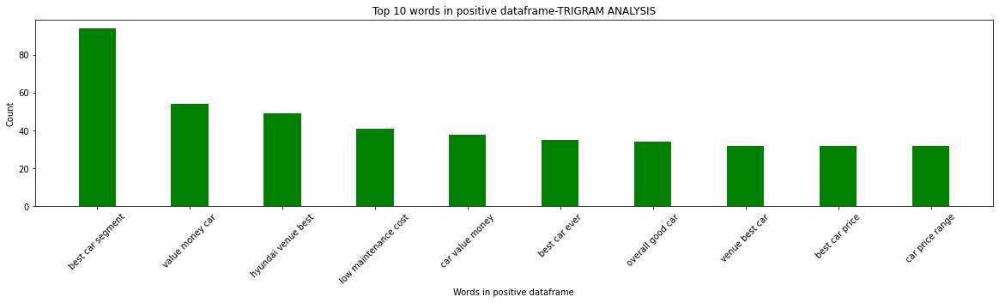

In [85]:
# plotting positive dataframe(trigram)
plt.figure(1,figsize=(20,4))
plt.bar(pd1tri, pd2tri, color ='green', width = 0.4)
plt.xlabel("Words in positive dataframe")
plt.ylabel("Count")
plt.title("Top 10 words in positive dataframe-TRIGRAM ANALYSIS")
plt.xticks(rotation = 45)
plt.show()

In [86]:
ned1tri=df_negative3[0][:10]
ned2tri=df_negative3[1][:10]

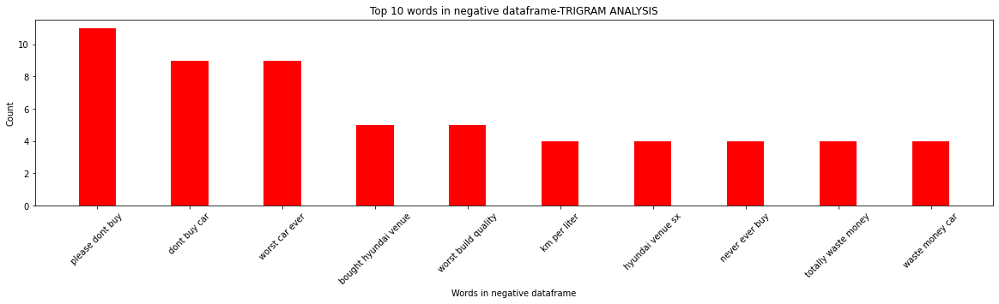

In [87]:
# plotting negative dataframe(trigram)
plt.figure(1,figsize=(20,4))
plt.bar(ned1tri, ned2tri, color ='red', width = 0.4)
plt.xlabel("Words in negative dataframe")
plt.ylabel("Count")
plt.title("Top 10 words in negative dataframe-TRIGRAM ANALYSIS")
plt.xticks(rotation = 45)
plt.show()

In [88]:
nud1tri=df_neutral3[0][:10]
nud2tri=df_neutral3[1][:10]

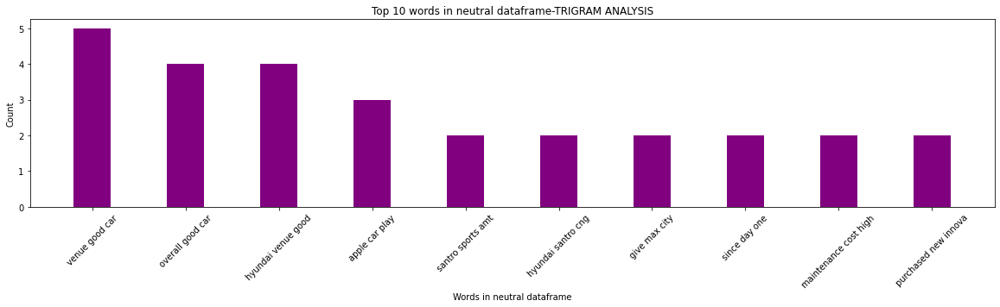

In [89]:
# plotting neutral dataframe(trigram)
plt.figure(1,figsize=(20,4))
plt.bar(nud1tri, nud2tri, color ='purple', width = 0.4)
plt.xlabel("Words in neutral dataframe")
plt.ylabel("Count")
plt.title("Top 10 words in neutral dataframe-TRIGRAM ANALYSIS")
plt.xticks(rotation = 45)
plt.show()

#### Now it's needed to tokenize the words of cleaned review column to perform tfidf vectorization. Here we go now....

In [90]:
#tokenizing
df['tokenized_sents'] = df.apply(lambda row: nltk.word_tokenize(row['cleaned_review']), axis=1)
#df[["cleaned_review","tokenized_sents"]].head()

In [91]:
#import nltk

In [92]:
#nltk.download('punkt')

# TFIDF(Term Frequency — Inverse Document Frequency)
TF-IDF stands for “Term Frequency — Inverse Document Frequency”. This is a technique to quantify a word in documents, we generally compute a weight to each word which signifies the importance of the word in the document. This method is a widely used technique in Information Retrieval and Text Mining.

Here we are splitting as bigram (two words) and consider their combined weight. Also we are taking only the top 5000 words from the reviews.

In [93]:
def identity_tokenizer(text):
    return text

tfidf = TfidfVectorizer(tokenizer=identity_tokenizer, stop_words='english',max_features=5000,
                        lowercase=False, ngram_range=(2,2))    
x = tfidf.fit_transform(df['tokenized_sents'])
print('list:', tfidf.vocabulary_)

list: {'worst car': 4952, 'car thing': 854, 'thing noticed': 4672, 'noticed car': 3338, 'car pickup': 761, 'mileage km': 3099, 'km liter': 2644, 'liter petrol': 2779, 'petrol version': 3551, 'build quality': 469, 'bought santro': 426, 'santro cng': 4054, 'sportz model': 4392, 'door lock': 1413, 'passenger airbags': 3425, 'parking camera': 3418, 'car santro': 799, 'recently purchased': 3919, 'purchased santro': 3805, 'santro model': 4063, 'time purchase': 4698, 'purchase vehicle': 3797, 'km days': 2637, 'problems like': 3764, 'pickup mileage': 3567, 'hyundai service': 2489, 'car zero': 891, 'zero safety': 4993, 'safety performance': 4040, 'waste money': 4924, 'lakh price': 2673, 'mahindra scorpio': 2981, 'scorpio car': 4084, 'car doesnt': 593, 'keyless entry': 2625, 'climate control': 1018, 'features like': 1888, 'creta e': 1270, 'base model': 213, 'model worst': 3171, 'hyundai provide': 2485, 'basic feature': 215, 'e model': 1560, 'dont buy': 1397, 'buy new': 492, 'new hyundai': 3252, 

In [94]:
#Save tfidf pickle file 
file ="final_tfidf.pickle"
pickle.dump(tfidf,open(file,"wb"))

Pickle is a Standard way of serializing objects in Python. It can be a Machine Learning Algorithm or any other Object.
You can serialize and save the model or Object using Pickle . It is saved in a serialized format as a file.
When you need to re-use or re-load the same Model or Object , you can reload and de-serialize the file using Pickle.

In [95]:
#checking the shape of x
x.shape

(5791, 5000)

As we have considered 5000 words, we can confirm that we have 5000 columns from the shape.

## Model Creation By Using Rating

In [96]:
# Getting the target variable(encoded)
y = df['sentiment_by_rating']

In [97]:
y.shape

(5791,)

# Handling Imbalance (SMOTE Method)
In our target feature, there is a lot of positive sentiments compared to negative and neutral. So it is crucial to balance the classes in such situation. Here we have used SMOTE(Synthetic Minority Oversampling Technique) to balance out the imbalanced dataset problem.

SMOTE is an oversampling technique where the synthetic samples are generated for the minority class. This algorithm helps to overcome the overfitting problem posed by random oversampling. It focuses on the feature space to generate new instances with the help of interpolation between the positive instances that lie together.

In [98]:
from collections import Counter
print(f'Original dataset shape : {Counter(y)}')

smote = SMOTE(random_state=42)
x_res, y_res = smote.fit_resample(x, y)

print(f'Resampled dataset shape {Counter(y_res)}')

Original dataset shape : Counter({2: 5053, 0: 572, 1: 166})
Resampled dataset shape Counter({0: 5053, 1: 5053, 2: 5053})


# Train-test split(80:20)
Using train test split function we are splitting the dataset into 80:20 ratio for train and test set respectively.

In [99]:
## Divide the dataset into Train and Test
x_train, x_test, y_train, y_test = train_test_split(x_res, y_res, test_size=0.20, random_state=0)

# Model selection
Here we are using cross validaton first to select the best peforming model . Let's consider all the classification algorithms and perform the model selection process.

In [100]:
#Imblance data
Random_Forest = RandomForestClassifier()
Logistic_Regression = LogisticRegression(random_state=0)
Decision_Tree=DecisionTreeClassifier()
K_Neighbor=KNeighborsClassifier()
Support_vector=SVC()
Naive_bayes=BernoulliNB()
cv_models=[Random_Forest,Logistic_Regression,Decision_Tree,K_Neighbor,Support_vector,Naive_bayes]
names=['Random Forest',  'Logistic Regression',  'Decision Tree','KNN','SVC','Naive Bayes']

accurecy=[] 
for i,model in enumerate(cv_models):
    accurecy.append(cross_val_score(model, x, y, cv=10, scoring ='accuracy').mean())
    
f1_weighted=[]
for i,model in enumerate(cv_models):
    f1_weighted.append(cross_val_score(model, x, y, cv=10, scoring ='f1_weighted').mean())
    
f1_micro=[] 
for i,model in enumerate(cv_models):
    f1_micro.append(cross_val_score(model, x, y, cv=10, scoring ='f1_micro').mean())
    
f1_macro=[]
for i,model in enumerate(cv_models):
    f1_macro.append(cross_val_score(model, x, y, cv=10, scoring ='f1_macro').mean())

cv_df=pd.DataFrame({"Accurecy":accurecy,"f1_weighted":f1_weighted,"f1_micro":f1_micro,"f1_macro":f1_macro},index=names)   
cv_df

,Accurecy,f1_weighted,f1_micro,f1_macro
Random Forest,0.886385,0.863654,0.885869,0.460757
Logistic Regression,0.884304,0.841845,0.884304,0.391019
Decision Tree,0.840970,0.839383,0.842181,0.448984
KNN,0.763438,0.766917,0.763438,0.327326
SVC,0.881197,0.836677,0.881197,0.378548
Naive Bayes,0.869633,0.843718,0.869633,0.416562


- average=micro says the function to compute f1 by considering total true positives, false negatives and false positives (no matter of the prediction for each label in the dataset)
- average=macro says the function to compute f1 for each label, and returns the average without considering the proportion for each label in the dataset.
- average=weighted says the function to compute f1 for each label, and returns the average considering the proportion for each label in the dataset.
- average=samples says the function to compute f1 for each instance, and returns the average. Use it for multilabel classification.


### NOTE:

We have used (x, y) which is the imbalanced dataset instead of the resampled one that is (x_res, y_res) as Cross Validation doesn't get affected by imbalanced dataset. It splits the dataset and considers the average of all the Cross Validations.

## Random Forest Classification

### Stratified K Fold (Cross Validation Method)
Now to talk about the above statement, there is one more cross validation method called stratified k fold which splits the data based on equal proportion of classes without any oversampling/undersampling. It does stratified sampling instead of random sampling.

Here we have taken the resampled data, which was being performed by SMOTE and now the cross validation will take place within each fold.

In [101]:
# Random Forest
# Create classifier object
randf1 = RandomForestClassifier()

# Create StratifiedKFold object
skf = StratifiedKFold(n_splits=10, shuffle=True, random_state=1)
lst_accu_stratified = []
  
for train_index, test_index in skf.split(x, y): 
    x_train_fold, x_test_fold = x_res[train_index], x_res[test_index]
    y_train_fold, y_test_fold = y_res[train_index], y_res[test_index]
    randf1.fit(x_train_fold, y_train_fold)
    lst_accu_stratified.append(randf1.score(x_test_fold, y_test_fold))
  
# Print the output.
print('List of possible accuracy:', lst_accu_stratified)
print('\nMaximum Accuracy That can be obtained from this model is:',
      max(lst_accu_stratified)*100, '%')
print('\nMinimum Accuracy:',
      min(lst_accu_stratified)*100, '%')
print('\nOverall Accuracy:',
      mean(lst_accu_stratified)*100, '%')
print('\nStandard Deviation is:', stdev(lst_accu_stratified))

List of possible accuracy: [0.8982758620689655, 0.8911917098445595, 0.8946459412780656, 0.8894645941278065, 0.8791018998272885, 0.8773747841105354, 0.8929188255613126, 0.8894645941278065, 0.8860103626943006, 0.9015544041450777]

Maximum Accuracy That can be obtained from this model is: 90.15544041450777 %

Minimum Accuracy: 87.73747841105354 %

Overall Accuracy: 89.00002977785718 %

Standard Deviation is: 0.00766067752278455


### Random Forest with Hyperparameter tuning
The classification models run with the default parameters determined by the classifier modules. Regularization parameter and penality for parameter has been used for tuning. From here we can see which one to plug.

In [102]:

param_grid = {
    "criterion": ["gini", "entropy"],
   "max_depth": [5,6,7,8,9,10,11,12,13,14,15,None]
}

rf_Grid = GridSearchCV(estimator = RandomForestClassifier(),param_grid = param_grid, cv = 10, n_jobs =-1)
best_model =rf_Grid.fit(x_train, y_train)
print(best_model.best_estimator_)

RandomForestClassifier()


### Random Forest Model Fitting

In [103]:
#Now we can easily put the values and improve the model accuracy
model_rf = RandomForestClassifier(criterion='entropy',max_depth=None)
model_rf.fit(x_train, y_train)
predtrain_rf=model_rf.predict(x_train)
predtest_rf=model_rf.predict(x_test)
print('Train Accuracy :',np.round(metrics.accuracy_score(y_train,predtrain_rf),4))
print('Test Accuracy :',np.round(metrics.accuracy_score(y_test,predtest_rf),4))

Train Accuracy : 0.9969
Test Accuracy : 0.9575


### Classification Metrics for Random Forest

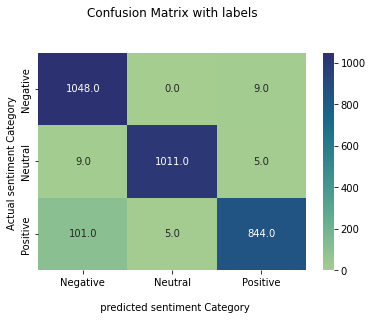

In [104]:
#creating confusion matrix for Random FOrest
cm = confusion_matrix(y_test,predtest_rf)

##Generating heatmap to visualize the confusion matrix
ax = sns.heatmap(cm, annot=True, cmap='crest', fmt=".1f")

##Setting up the title and Labels
ax.set_title('Confusion Matrix with labels\n\n');
ax.set_xlabel('\n  predicted sentiment Category')
ax.set_ylabel('Actual sentiment Category ');

##Ticket labels - List must be in alphabetical order
ax.xaxis.set_ticklabels(['Negative','Neutral', 'Positive'])
ax.yaxis.set_ticklabels(['Negative','Neutral', 'Positive'])
plt.show()

In [105]:
print("Classification Report:\n",classification_report(y_test, predtest_rf))

Classification Report:
               precision    recall  f1-score   support

           0       0.91      0.99      0.95      1057
           1       1.00      0.99      0.99      1025
           2       0.98      0.89      0.93       950

    accuracy                           0.96      3032
   macro avg       0.96      0.96      0.96      3032
weighted avg       0.96      0.96      0.96      3032



### ROC Curve for Random Forest

Text(0.5, 1.0, 'ROC Curve for Random Forest')

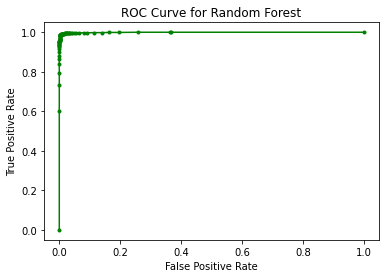

In [106]:
y_pred_proba_rf = model_rf.predict_proba(x_test)[:,1]
fpr_rf, tpr_rf, _ = metrics.roc_curve(y_test, y_pred_proba_rf, pos_label=1)
plt.plot(fpr_rf,tpr_rf,marker='.',color ='green')
plt.ylabel('True Positive Rate')
plt.xlabel('False Positive Rate')
plt.title("ROC Curve for Random Forest")

## Logistic Regression Classification

### Stratified K Fold (Cross Validation Method)

In [107]:
# Logistic Reg
# Create classifier object
logreg=LogisticRegression()

# Create StratifiedKFold object
skf = StratifiedKFold(n_splits=10, shuffle=True, random_state=1)
lst_accu_stratified = []
  
    
for train_index, test_index in skf.split(x, y):
    x_train_fold, x_test_fold = x_res[train_index], x_res[test_index]
    y_train_fold, y_test_fold = y_res[train_index], y_res[test_index]
    logreg.fit(x_train_fold, y_train_fold)
    lst_accu_stratified.append(logreg.score(x_test_fold, y_test_fold))
  
# Print the output.
print('List of possible accuracy:', lst_accu_stratified)
print('\nMaximum Accuracy That can be obtained from this model is:',
      max(lst_accu_stratified)*100, '%')
print('\nMinimum Accuracy:',
      min(lst_accu_stratified)*100, '%')
print('\nOverall Accuracy:',
      mean(lst_accu_stratified)*100, '%')
print('\nStandard Deviation is:', stdev(lst_accu_stratified))

List of possible accuracy: [0.8827586206896552, 0.8911917098445595, 0.8842832469775475, 0.8842832469775475, 0.8808290155440415, 0.8773747841105354, 0.8877374784110535, 0.8877374784110535, 0.8894645941278065, 0.8894645941278065]

Maximum Accuracy That can be obtained from this model is: 89.11917098445595 %

Minimum Accuracy: 87.73747841105354 %

Overall Accuracy: 88.55124769221607 %

Standard Deviation is: 0.00437360774154122


### Logistic Regression with Hyperparameter tuning
The classification models run with the default parameters determined by the classifier modules. Regularization parameter and penality for parameter has been used for tuning. From here we can see which one to plug.

In [108]:
param_grid = {'C': np.logspace(-4, 4, 50),
             'penalty':['l1', 'l2']}
clf = GridSearchCV(LogisticRegression(random_state=0), param_grid, cv=5, verbose=0, n_jobs=-1)
best_model = clf.fit(x_train,y_train)
print(best_model.best_estimator_)

LogisticRegression(C=6866.488450042998, random_state=0)


### Logistic Regression Model Fitting

In [109]:
#Now we can easily put the values and improve the model accuracy
model_logreg= LogisticRegression(C=10000.0,random_state=0)
model_logreg.fit(x_train, y_train)
predtrain_logreg=model_logreg.predict(x_train)
predtest_logreg=model_logreg.predict(x_test)
print('Train Accuracy :',np.round(metrics.accuracy_score(y_train,predtrain_logreg),4))
print('Test Accuracy :',np.round(metrics.accuracy_score(y_test,predtest_logreg),4))

Train Accuracy : 0.9965
Test Accuracy : 0.9739


### Classification Metrics for Logistic Regression

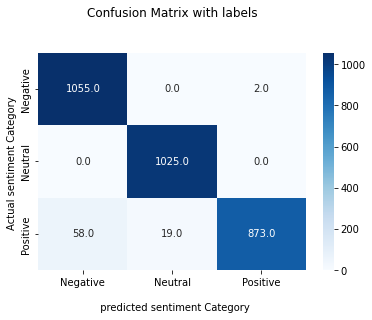

In [110]:
#creating confusion matrix 
cm = confusion_matrix(y_test,predtest_logreg)

##Generating heatmap to visualize the confusion matrix
ax = sns.heatmap(cm, annot=True, cmap='Blues', fmt=".1f")

##Setting up the title and Labels
ax.set_title('Confusion Matrix with labels\n\n');
ax.set_xlabel('\n  predicted sentiment Category')
ax.set_ylabel('Actual sentiment Category ');

##Ticket labels - List must be in alphabetical order
ax.xaxis.set_ticklabels(['Negative','Neutral', 'Positive'])
ax.yaxis.set_ticklabels(['Negative','Neutral', 'Positive'])
plt.show()

### Clasification Report for Logistic Regresion

In [111]:
print("Classification Report:\n",classification_report(y_test, predtest_logreg))

Classification Report:
               precision    recall  f1-score   support

           0       0.95      1.00      0.97      1057
           1       0.98      1.00      0.99      1025
           2       1.00      0.92      0.96       950

    accuracy                           0.97      3032
   macro avg       0.98      0.97      0.97      3032
weighted avg       0.97      0.97      0.97      3032



### ROC Curve for Logistic Regression

Text(0.5, 1.0, 'ROC Curve for Logistic Regression')

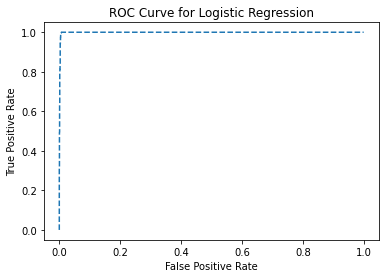

In [112]:
y_pred_proba_logreg = model_logreg.predict_proba(x_test)[:,1]
fpr_logreg, tpr_logreg, _ = metrics.roc_curve(y_test, y_pred_proba_logreg, pos_label=1)
plt.plot(fpr_logreg,tpr_logreg,linestyle='--')
plt.ylabel('True Positive Rate')
plt.xlabel('False Positive Rate')
plt.title("ROC Curve for Logistic Regression")

### ROC-AUC curve
This is a very important curve to decide on which threshold to setup based upon the objective criteria. Here we plotted ROC for different classes which can help us to understand which class was classified better. Micro and Macro averages are also plotted on the roc curve.

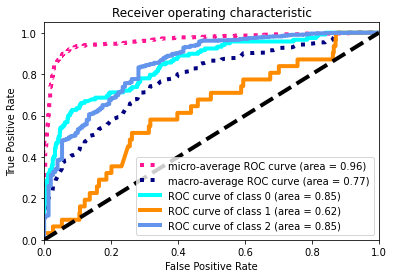

In [113]:
from sklearn.preprocessing import label_binarize
#Binarizing the target feature
y = label_binarize(y, classes=[0, 1, 2])
n_classes = y.shape[1]

#Train-Test split(80:20)
x_train, x_test, y_train, y_test = train_test_split(x, y, test_size=.2,
                                                    random_state=0)

#OneVsRestClassifier
classifier = OneVsRestClassifier(svm.SVC(kernel='linear', probability=True,
                                 random_state=10))
y_score = classifier.fit(x_train, y_train).decision_function(x_test)

#Computing TPR and FPR
fpr = dict()
tpr = dict()
roc_auc = dict()
for i in range(n_classes):
    fpr[i], tpr[i], _ = roc_curve(y_test[:, i], y_score[:, i])
    roc_auc[i] = auc(fpr[i], tpr[i])

# Compute micro-average ROC curve and ROC area
fpr["micro"], tpr["micro"], _ = roc_curve(y_test.ravel(), y_score.ravel())
roc_auc["micro"] = auc(fpr["micro"], tpr["micro"])
    
# aggregate all false positive rates
all_fpr = np.unique(np.concatenate([fpr[i] for i in range(n_classes)]))

# interpolate all ROC curves at this points
mean_tpr = np.zeros_like(all_fpr)
for i in range(n_classes):
    mean_tpr += np.interp(all_fpr, fpr[i], tpr[i])

# Finally average it and compute AUC
mean_tpr /= n_classes

fpr["macro"] = all_fpr
tpr["macro"] = mean_tpr
roc_auc["macro"] = auc(fpr["macro"], tpr["macro"])

# Plot all ROC curves
plt.figure()
plt.plot(fpr["micro"], tpr["micro"],
         label='micro-average ROC curve (area = {0:0.2f})'
               ''.format(roc_auc["micro"]),
         color='deeppink', linestyle=':', linewidth=4)

plt.plot(fpr["macro"], tpr["macro"],
         label='macro-average ROC curve (area = {0:0.2f})'
               ''.format(roc_auc["macro"]),
         color='navy', linestyle=':', linewidth=4)

colors = cycle(['aqua', 'darkorange', 'cornflowerblue'])
for i, color in zip(range(n_classes), colors):
    plt.plot(fpr[i], tpr[i], color=color, lw=4,
             label='ROC curve of class {0} (area = {1:0.2f})'
             ''.format(i, roc_auc[i]))

plt.plot([0, 1], [0, 1], 'k--', lw=4)
plt.xlim([0.0, 1.0])
plt.ylim([0.0, 1.05])
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('Receiver operating characteristic')
plt.legend(loc="lower right")
plt.show()

### Insights:

Considering the ROC curve, class 0 and 2 have been classified well and their area under the curve is high. Any threshold between 0.6-0.9 can be chosen to get the optimal number of TPR and FPR.

Coming to micro and macro average, micro average preforms really well and macro average shows a not very good score.

In a multi-class classification setup, micro-average is preferable.

#A higher TNR and a lower FPR is desirable since we want to correctly classify the negative class.

### Save model pickle file 

In [114]:
file="final_model.pickle"
pickle.dump(logreg,open(file,"wb"))

# Model Evaluation By a New Dataset

In [115]:
#dataset Link
#https://www.kaggle.com/datasets/shreemunpranav/edmunds-car-review

In [116]:
kaggle_car_df=pd.read_csv("C:\\Users\HP\IMS Sentiment Project\Kaggle_Car_Review.csv")

In [117]:
kaggle_car_df.shape

(299045, 8)

In [118]:
kaggle_car_df.columns

Index(['Company', 'Model', 'Year', 'Reviewer', 'Date', 'Title', 'Rating',
       'Review'],
      dtype='object')

In [119]:
pd.set_option('display.max_colwidth', None)
def Brand_Sentiment_Analysis(df):
    new_df=df[['Model',"Review"]].sample(n=7,random_state=1)
    p1_review=new_df["Review"]
    review_df = pd.DataFrame(p1_review,columns = ["Review"])
    review_df['review']=review_df['Review'].apply(lambda x:review_cleaning(x))
    review_df['review1']=review_df['review'].apply(lambda x:remove_digits(x))
    review_df['cleaned_review']=review_df['review1'].apply(lambda x:strip_emoji(x))
    review_df['cleaned_review'] = review_df['cleaned_review'].apply(lambda x: ' '.join([word for word in x.split() if word not in (stop_words)]))
    review_df['tokenized_sents'] = review_df.apply(lambda row: nltk.word_tokenize(row['cleaned_review']), axis=1)
    saved_tfidf = pickle.load(open('final_tfidf.pickle','rb'))
    eva = saved_tfidf.transform(review_df['tokenized_sents'])
    saved_model = pickle.load(open('final_model.pickle','rb'))
    pred=saved_model.predict(eva)
    pred_sent=[]
    for i in pred:
        if i==2:
            pred_sent.append("Positive")
        elif i==1:
            pred_sent.append("Neutral")
        else:
            pred_sent.append("Negative")
    new_df['sentiment']=pred_sent
    return new_df

In [120]:
Brand_Sentiment_Analysis(kaggle_car_df)

,Model,Review,sentiment
87883,f-150,The only thing that the truck needs is stronger rear suspension and a little more low end power. Easily fixed by airbag suspension and a few performance upgrades.,Positive
83977,expedition,"We purchased our Eddie Bauer in June of 2005 with only 14k miles on it. We dubbed it the ""Big Cat"" and we always ""take the cat"" when we go in it. After purchase, we took off from Ohio to Yellowstone with a family of 5 (3 teens - one of them 6'3 185) Very comfortable. Now we have 80k+. Only minor things. I bought the 100k warranty. Ready to use it for 2nd time. 18+ mpg on trips - 15+ mpg around home (hilly countryside). I'd buy another one in a heartbeat. Watch the Contenential tires - plys go bad. Choose tires wisely. I bought more aggressive ones this time and cost me over 1 mpg.",Positive
56930,hhr,"We only just bought our HHR after trading in our Chrysler Town and Country Van which I was very attached to, but we no longer need a vehicle that size. I love the HHR, it is so comfortable and fun to drive. I love the interior and the way all the gauges are set up. I was going to go with a tiny car for better gas mileage but the HHR gives me a bit more room with a better gas mileage than my van.",Positive
54698,aveo,"This is the kind of car that these manufacturers are producing. Good on gas, drives like a big car, fun to drive, most specially, very practical. For a single mom like me, there is no car in the market that is comparable with the quality, prize for your money and so far no major problem. I just follow the maintenance schedule and voila, the car just simply perform and does its job. I will highly recommend this as a good buy",Positive
229,mdx,This was one of the more disappointing vehicles that I have owned. Vehicle clunks when shifting from forward to reverse (dealer says it cannot be repaired). Can't drive with the windows down as it creates pressure inside vehicle. The list goes on.,Positive
63275,aspen,"I just purchased this vehicle and am very pleased so far. I have recently owned Lexus and Nissan vehicles(both cars and trucks). This truck makes me wonder why I ever payed the premium price of owning the other vehicles! This thing is great, quiet and smooth ride. A ton of features for the money and really quick. I got the one with the Hemi, Nav, My Gig etc. Anyone looking for a great vehicle at a great price, this is the one! Great job Chrysler!",Positive
127338,element,"We love our Honda Element. My husband \nis a PIG!! Someone finally made a car \nfor him. You can wash out the inside in \na minute. \n\nYou can put big, awkward, bulky things \nin the car with ease.\n\nTaking messy yard waste to the dump is \neasy now that we can clean the car so \neasily.\n\nHe thinkshis car is really COOL and I \nthink it is WONDERFUL and really CUTE.\n\nThe backdoor business is a pain, but \nbecause of it you can get things in and \nout easily. It is a trade off. \n\nWe don't ferry klds anymore so we don't \ncare about it that much.It would not be \nconvenient for dropping off kids.\n\nWE LOVE IT!!!! Thank you Honda for \nsaving my marriage!!!\n\n N. Weber",Positive


# Model Evaluation By User

In [ ]:
p1_review = [input("Please enter a review:\n ")]
review_df = pd.DataFrame(p1_review,columns = ["review"])
review_df['review']=review_df['review'].apply(lambda x:review_cleaning(x))
review_df['review1']=review_df['review'].apply(lambda x:remove_digits(x))
review_df['cleaned_review']=review_df['review1'].apply(lambda x:strip_emoji(x))
review_df['cleaned_review'] = review_df['cleaned_review'].apply(lambda x: ' '.join([word for word in x.split() if word not in (stop_words)]))
review_df['tokenized_sents'] = review_df.apply(lambda row: nltk.word_tokenize(row['cleaned_review']), axis=1)
saved_tfidf = pickle.load(open('final_tfidf.pickle','rb'))
eva = saved_tfidf.transform(review_df['tokenized_sents'])
saved_model = pickle.load(open('final_model.pickle','rb')) #based on rating
pred=saved_model.predict(eva)[0]
print('\033[1m' + 'Sentiment:' + '\033[0m')
if pred==2:
    print("Positive")
elif pred==1:
    print("Neutral")
else:
    print("Negative")
    